# Implementation of FeedForward Neural Network using Numpy only

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random
import timeit
from scipy.optimize import approx_fprime

**Forward Pass**

In [32]:

def forward_pass(w0, b0, w1, b1, w2, b2, x):
    '''''''''
    Computes the output of a network with 2 hidden layers
    with tanh activations and softmax output activation.
    w0:input->hidden0 weights
    b0:bias of hidden0 layer
    w1:hidden0->hidden1 weights
    b1:bias of hidden1 layer
    w2: hidden1->output weights
    b2: bias of output layer
    x: input matrix [n_samples * n_features]
    Returns a list that contains the activations of each layer
    '''''''''
  
    z = np.dot(x, w0.T) + b0
    h0 = np.tanh(z)
    
    z = np.dot(h0, w1.T) + b1
    h1 = np.tanh(z)
    
    z = np.dot(h1, w2.T) + b2
    o = softmax(z)

    return [x, h0, h1, o]

In [29]:
def softmax(z):
    m = z.max(1)[:, None] # improves numerical stability of softmax
    e = np.exp(z - m)
    return e / e.sum(1)[:, None]

In [30]:
def calculate_softmax_output(w, b, x):
    
    z = np.dot(x, w.T)+b
    m = z.max(1)[:, None] # improves numerical stability of softmax
    e = np.exp(z - m)
    return e / e.sum(1)[:, None]

In [31]:
def softmax_gradient(w, b, x, y):
    
    out = calculate_softmax_output(w, b, x)
    delta = out - y
    dw = np.dot(delta.T, x)
    db = delta.sum(0)
    return dw, db

In [7]:
def backward_pass(activations, w0, b0, w1, b1, w2, b2, y):
    '''''''''
    Computes the derivatives of the weights of the neural network.
    The hidden layers have tanh activations, the output layer a softmax activation.
    activations: list of the activations of each layer during the forward pass
    in the following order:      [x, h0, h1, o]
    w0: input->hidden0 weights   [n_hidden0 * n_inputs]
    w1: hidden0->hidden1 weights [n_hidden1 * n_hidden0]
    w2: hidden1->output weights  [n_outputs * n_hidden1]
    y: labels as 1hot-encoding   [n_samples * n_outputs]
    Returns:
    A list that contains the derivatives of the biases and
    the weights of each layer in the following order:
    [dw0, db0, dw1, db1, dw2, db2]
    '''''''''''
    
    x,h0,h1,o=activations
    
    #dw2,db2
    dw2,db2=softmax_gradient(w2,b2,h1,y)
    dz2=(o-y)
    db2=db2.reshape(1,len(db2))
    
    #dw1,db1
    dz1=np.dot(dz2,w2)*(1-h1**2)
    dw1=np.dot(dz1.T,h0)
    db1=dz1.sum(0) 
    db1=db1.reshape(1,len(db1))
    
    #dw0,db0
    dz0=np.dot(dz1,w1)*(1-h0**2)
    dw0=np.dot(dz0.T,x)
    db0=dz0.sum(0)
    db0=db0.reshape(1,len(db0))
    
    return [dw0, db0, dw1, db1, dw2, db2]

In [43]:
def initialize_weights(n_features,n_hidden0,n_hidden1,n_outputs):
    
    np.random.seed(500)
    
    w0 = np.random.uniform(-0.1, +0.1, size=(n_hidden0, n_features))
    b0 = np.zeros((1, n_hidden0))
    
    w1 = np.random.uniform(-0.1, +0.1, size=(n_hidden1, n_hidden0))
    b1 = np.zeros((1, n_hidden1))
    
    w2 = np.random.uniform(-0.1, +0.1, size=(n_outputs, n_hidden1))
    b2 = np.zeros((1,n_outputs))
    
    return [w0,b0,w1,b1,w2,b2]

In [9]:
def gradient_descent(activations,lr,w0,b0,w1,b1,w2,b2,y,lambd=0):
    
    dw0, db0, dw1, db1, dw2, db2=backward_pass(activations, w0, b0, w1, b1, w2, b2, y)
    
   
    w0=w0-lr*dw0
    b0=b0-lr*db0
    
    
    w1=w1-lr*dw1
    b1=b1-lr*db1
    
    
    w2=w2-lr*dw2
    b2=b2-lr*db2
    
    
    return [w0,b0,w1,b1,w2,b2]
    

In [10]:
def loss(o,y,w0,w1,w2,lambd=0): #Cross Entropy loss
    eta=10**-10
    loss=-np.sum(y * np.log(o+eta))
    return loss

In [11]:
def softmax_accuracy(o,y):
    
    accur=(o.argmax(1) == y.argmax(1)).mean()

    return accur*100.0
    

In [56]:
def train_NN(x_train,y_train,x_valid,y_valid,epochs,
             lr,n_hidden0,n_hidden1,optimizer=gradient_descent,L=loss,lambd=0):
    
    
    print('Learning rate=',lr)
    print('Hidden units layer 1=',n_hidden0)
    print('Hidden units layer 2=',n_hidden1)
    print('########################################################')
    
    l_train=[]
    l_valid=[]
    acc_train=[]
    acc_valid=[]
    p=0 #patience timer for early stopping
    
    w0,b0,w1,b1,w2,b2=initialize_weights(x_train.shape[1],n_hidden0,n_hidden1,y_train.shape[1])
    
    for i in range(epochs):
        
        activations_train=forward_pass(w0, b0, w1, b1, w2, b2, x_train)
        activations_valid=forward_pass(w0, b0, w1, b1, w2, b2, x_valid)
        
        o_train=activations_train[3]
        
        o_valid=activations_valid[3]
        
        l_train.append(L(o_train,y_train,w0,w1,w2,lambd)) 
        l_valid.append(L(o_valid,y_valid,w0,w1,w2,lambd))
        
        acc_train.append(softmax_accuracy(o_train,y_train))
        acc_valid.append(softmax_accuracy(o_valid,y_valid))
        
        print("epoch",i+1)
        print("training loss",l_train[i])
        print("validation loss",l_valid[i])
        print("training accuracy",acc_train[i])
        print("validation accuracy",acc_valid[i])
        print('########################################################')
        
        # early stopping
        
        if(i==0):
            
            w0,b0,w1,b1,w2,b2=optimizer(activations_train,lr,w0,b0,w1,b1,w2,b2,y_train,lambd)
         
        elif(l_valid[i]+0.5 >= l_valid[i-1]):
            
            if(p==10): #break if the validation loss keeps increasing for 10 consecutive epochs
                break
            
            else:
                w0,b0,w1,b1,w2,b2=optimizer(activations_train,lr,w0,b0,w1,b1,w2,b2,y_train,lambd)
                p+=1
                    
        else:
            p=0
            w0,b0,w1,b1,w2,b2=optimizer(activations_train,lr,w0,b0,w1,b1,w2,b2,y_train,lambd)
    
    return [w0,b0,w1,b1,w2,b2,acc_train,acc_valid]
    
    
    

In [45]:
epochs=200
lr=10**-5
n_hidden0=50
n_hidden1=75
w0,b0,w1,b1,w2,b2,acc_train,acc_valid=train_NN(x_train,y_train,x_valid,y_valid,epochs,
             lr,n_hidden0,n_hidden1,optimizer=gradient_descent,L=loss,lambd=0)

Learning rate= 1e-05
Hidden units layer 1= 50
Hidden units layer 2= 75
########################################################
epoch 1
training loss 68717.28248918793
validation loss 34356.21295207174
training accuracy 13.013333333333332
validation accuracy 12.793333333333335
########################################################
epoch 2
training loss 67913.11030581802
validation loss 33956.073956108965
training accuracy 24.226666666666667
validation accuracy 23.986666666666668
########################################################
epoch 3
training loss 67104.30676343016
validation loss 33553.57270393685
training accuracy 34.23
validation accuracy 34.12
########################################################
epoch 4
training loss 66263.71297511604
validation loss 33135.13868129358
training accuracy 41.28666666666667
validation accuracy 40.78666666666667
########################################################
epoch 5
training loss 65365.80648350196
validation loss 32688.020362064

epoch 42
training loss 20677.900270432747
validation loss 10393.131158259406
training accuracy 82.54333333333334
validation accuracy 82.07333333333334
########################################################
epoch 43
training loss 20288.33737268734
validation loss 10197.046491335204
training accuracy 82.79666666666667
validation accuracy 82.37333333333333
########################################################
epoch 44
training loss 19920.503339184568
validation loss 10011.878732740886
training accuracy 83.09
validation accuracy 82.65333333333334
########################################################
epoch 45
training loss 19572.6451942286
validation loss 9836.755483595312
training accuracy 83.30333333333333
validation accuracy 82.94666666666667
########################################################
epoch 46
training loss 19243.163849821532
validation loss 9670.880424276455
training accuracy 83.61
validation accuracy 83.18666666666667
##############################################

epoch 84
training loss 12993.77402740828
validation loss 6543.17262215689
training accuracy 88.21666666666667
validation accuracy 88.01333333333334
########################################################
epoch 85
training loss 12909.038361789322
validation loss 6501.390600723352
training accuracy 88.25333333333333
validation accuracy 88.15333333333332
########################################################
epoch 86
training loss 12826.428705876173
validation loss 6460.687042894436
training accuracy 88.32333333333334
validation accuracy 88.2
########################################################
epoch 87
training loss 12745.869466551974
validation loss 6421.023305925576
training accuracy 88.4
validation accuracy 88.24666666666666
########################################################
epoch 88
training loss 12667.287928331367
validation loss 6382.362242240204
training accuracy 88.46000000000001
validation accuracy 88.29333333333334
##################################################

epoch 125
training loss 10679.464971423138
validation loss 5417.36237401099
training accuracy 89.91333333333333
validation accuracy 89.78666666666668
########################################################
epoch 126
training loss 10641.806678815847
validation loss 5399.399273920965
training accuracy 89.94333333333333
validation accuracy 89.8
########################################################
epoch 127
training loss 10604.683791675787
validation loss 5381.705900472407
training accuracy 89.98333333333333
validation accuracy 89.82666666666667
########################################################
epoch 128
training loss 10568.080791123162
validation loss 5364.274350331319
training accuracy 90.01
validation accuracy 89.84
########################################################
epoch 129
training loss 10531.98272809532
validation loss 5347.097008155924
training accuracy 90.03
validation accuracy 89.88000000000001
########################################################
epoch 130
t

epoch 166
training loss 9452.761476505972
validation loss 4839.942879068209
training accuracy 90.90333333333334
validation accuracy 90.56666666666666
########################################################
epoch 167
training loss 9428.607722712097
validation loss 4828.727937343979
training accuracy 90.92333333333333
validation accuracy 90.59333333333333
########################################################
epoch 168
training loss 9404.64566237028
validation loss 4817.607268507224
training accuracy 90.95333333333333
validation accuracy 90.58
########################################################
epoch 169
training loss 9380.871336156415
validation loss 4806.5788558805825
training accuracy 90.97333333333333
validation accuracy 90.62666666666667
########################################################
epoch 170
training loss 9357.280900631473
validation loss 4795.640742686288
training accuracy 90.99333333333334
validation accuracy 90.64
##############################################

Next, We perform gridsearch on the number of hidden units and the learning rate.

In [13]:
def hyperparameter_selection(x_train,y_train,x_valid,y_valid,epochs,lr,
                             n_hidden0,n_hidden1,optimizer=gradient_descent,L=loss,lambd=0):
    
    '''''''''
    Performs hyperparameter selection by called the train function
    based on minimal validation loss
    return optimal weights and biases as well as the best hyperparameters and their training and validation performance.
    '''''''''''
    
    best_accuracy=0.0
    best_n_h0=0.0
    best_n_h1=0.0
    best_lr=0.0
    best_epoch=0
    training_history=[]
    validation_history=[]
    params=[]
    best_w0,best_b0,best_w1,best_b1,best_w2,best_b2=0,0,0,0,0,0
    
    for i in range(len(lr)):
        for j in range(len(n_hidden0)):
            for k in range(len(n_hidden1)):
                w0,b0,w1,b1,w2,b2,acc_train,acc_valid=train_NN(x_train,y_train,x_valid,y_valid,epochs,
                                                               lr[i],n_hidden0[j],n_hidden1[k],optimizer=gradient_descent,L=loss)
                if (acc_valid[-1]>best_accuracy):
                    
                    best_accuracy=acc_valid[-1]
                    best_lr=lr[i]
                    best_n_h0=n_hidden0[j]
                    best_n_h1=n_hidden1[k]
                    training_history=acc_train
                    validation_history=acc_valid
                    best_epoch=len(acc_train)
                    best_w0,best_b0,best_w1,best_b1,best_w2,best_b2=w0,b0,w1,b1,w2,b2
    
    best_params=[best_lr,best_n_h0,best_n_h1,best_epoch]
    
    return[best_w0,best_b0,best_w1,best_b1,best_w2,best_b2,best_params,training_history,validation_history]
                    
                    
                    
    
    

In [14]:
def test_NN(x_test,y_test,w0,b0,w1,b1,w2,b2):
    
    x_test, h0, h1, o=forward_pass(w0, b0, w1, b1, w2, b2, x_test)
    test_accuracy=softmax_accuracy(o,y_test)
    
    return test_accuracy
    

**Implement Neural Network**

Apply NN on MNIST dataset.

Note: Data has already been normalize and shuffled

In [37]:
#load MNIST dataset

x_data=pd.read_csv("mnist.csv",delim_whitespace=True,header=None)
y_data=pd.read_csv("mnist-labels.csv",delim_whitespace=True,header=None)

train_end=int(x_data.shape[0]*0.5)
valid_end=int(train_end+(x_data.shape[0]*0.25))

#split into train,validation and test sets (50%,25%,25%)

x_train=x_data.iloc[0:train_end,:].values
y_train=y_data.iloc[0:train_end,:].values



x_valid=x_data.iloc[train_end:valid_end,:].values
y_valid=y_data.iloc[train_end:valid_end,:].values

x_test=x_data.iloc[valid_end:,:].values
y_test=y_data.iloc[valid_end:,:].values


Learning rate= 1e-05
Hidden units layer 1= 50
Hidden units layer 2= 50
########################################################
epoch 1
training loss 69239.67467457887
validation loss 34628.19366836695
training accuracy 9.433333333333334
validation accuracy 9.54
########################################################
epoch 2
training loss 68751.46372668313
validation loss 34386.71584031361
training accuracy 14.916666666666668
validation accuracy 14.966666666666667
########################################################
epoch 3
training loss 68266.03565271519
validation loss 34146.60308771052
training accuracy 22.523333333333333
validation accuracy 22.346666666666668
########################################################
epoch 4
training loss 67770.15320062583
validation loss 33901.26022760383
training accuracy 30.683333333333334
validation accuracy 30.25333333333333
########################################################
epoch 5
training loss 67250.91712577514
validation loss 3364

epoch 42
training loss 25448.03500070876
validation loss 12822.024774108791
training accuracy 79.03666666666666
validation accuracy 78.3
########################################################
epoch 43
training loss 24855.790929424842
validation loss 12521.863386187226
training accuracy 79.65666666666667
validation accuracy 78.92
########################################################
epoch 44
training loss 24292.712361520542
validation loss 12236.445088366452
training accuracy 80.27333333333333
validation accuracy 79.38
########################################################
epoch 45
training loss 23757.336114724818
validation loss 11965.056382391438
training accuracy 80.79666666666667
validation accuracy 79.94
########################################################
epoch 46
training loss 23248.260839122104
validation loss 11707.009088668245
training accuracy 81.25333333333333
validation accuracy 80.47999999999999
########################################################
epoch 47
t

epoch 83
training loss 14293.217438212048
validation loss 7198.569305132468
training accuracy 87.26333333333334
validation accuracy 87.01333333333334
########################################################
epoch 84
training loss 14180.108704199356
validation loss 7142.475377920846
training accuracy 87.33333333333333
validation accuracy 87.06
########################################################
epoch 85
training loss 14070.093911240414
validation loss 7087.950045412795
training accuracy 87.40333333333334
validation accuracy 87.12666666666667
########################################################
epoch 86
training loss 13963.044819131455
validation loss 7034.927550394693
training accuracy 87.45333333333333
validation accuracy 87.21333333333334
########################################################
epoch 87
training loss 13858.84025408333
validation loss 6983.3457918848535
training accuracy 87.57000000000001
validation accuracy 87.23333333333333
##################################

epoch 125
training loss 11245.39764210404
validation loss 5702.596931569454
training accuracy 89.56333333333333
validation accuracy 89.3
########################################################
epoch 126
training loss 11199.187833793358
validation loss 5680.244927142628
training accuracy 89.60000000000001
validation accuracy 89.32
########################################################
epoch 127
training loss 11153.710877476331
validation loss 5658.260491444227
training accuracy 89.64666666666666
validation accuracy 89.34666666666666
########################################################
epoch 128
training loss 11108.946374889001
validation loss 5636.633310580057
training accuracy 89.67
validation accuracy 89.39333333333333
########################################################
epoch 129
training loss 11064.874648827694
validation loss 5615.3534338063
training accuracy 89.72333333333333
validation accuracy 89.43333333333334
########################################################


epoch 166
training loss 9789.591165644297
validation loss 5005.5519656604165
training accuracy 90.77333333333333
validation accuracy 90.30666666666667
########################################################
epoch 167
training loss 9762.123690351533
validation loss 4992.553126326516
training accuracy 90.78
validation accuracy 90.32
########################################################
epoch 168
training loss 9734.924325583912
validation loss 4979.6870314618445
training accuracy 90.79333333333334
validation accuracy 90.34
########################################################
epoch 169
training loss 9707.987440638628
validation loss 4966.950859365661
training accuracy 90.82000000000001
validation accuracy 90.36
########################################################
epoch 170
training loss 9681.307558680297
validation loss 4954.341867143177
training accuracy 90.84666666666666
validation accuracy 90.39333333333333
########################################################
epoch 171
t

epoch 208
training loss 8816.016012188382
validation loss 4548.58633336313
training accuracy 91.51666666666667
validation accuracy 91.14666666666666
########################################################
epoch 209
training loss 8796.303797702141
validation loss 4539.41939856424
training accuracy 91.52333333333334
validation accuracy 91.15333333333334
########################################################
epoch 210
training loss 8776.71495458084
validation loss 4530.313517382578
training accuracy 91.55
validation accuracy 91.16666666666666
########################################################
epoch 211
training loss 8757.247566618533
validation loss 4521.2677567364035
training accuracy 91.56333333333333
validation accuracy 91.18666666666667
########################################################
epoch 212
training loss 8737.899762951427
validation loss 4512.281206064238
training accuracy 91.59666666666666
validation accuracy 91.2
#################################################

epoch 249
training loss 8092.383411094433
validation loss 4214.7428909949895
training accuracy 92.19333333333334
validation accuracy 91.8
########################################################
epoch 250
training loss 8076.542109757468
validation loss 4207.502318296312
training accuracy 92.20666666666666
validation accuracy 91.80666666666667
########################################################
epoch 251
training loss 8060.772856781461
validation loss 4200.297839158822
training accuracy 92.22666666666667
validation accuracy 91.84
########################################################
epoch 252
training loss 8045.074891618421
validation loss 4193.129079127089
training accuracy 92.25333333333333
validation accuracy 91.85333333333332
########################################################
epoch 253
training loss 8029.447469268093
validation loss 4185.995670954038
training accuracy 92.27333333333333
validation accuracy 91.85333333333332
##############################################

epoch 290
training loss 7495.170950757615
validation loss 3944.0884516185884
training accuracy 92.85666666666667
validation accuracy 92.33333333333333
########################################################
epoch 291
training loss 7481.790956741666
validation loss 3938.081112612918
training accuracy 92.86333333333333
validation accuracy 92.34
########################################################
epoch 292
training loss 7468.461094644543
validation loss 3932.0987956120694
training accuracy 92.86999999999999
validation accuracy 92.36666666666666
########################################################
epoch 293
training loss 7455.18099487769
validation loss 3926.1413077874395
training accuracy 92.87666666666667
validation accuracy 92.38
########################################################
epoch 294
training loss 7441.950293046266
validation loss 3920.208458850993
training accuracy 92.88666666666666
validation accuracy 92.39333333333335
############################################

epoch 331
training loss 6984.204643641988
validation loss 3716.4744741271925
training accuracy 93.30333333333334
validation accuracy 92.72
########################################################
epoch 332
training loss 6972.621852228277
validation loss 3711.357722950491
training accuracy 93.31333333333333
validation accuracy 92.72666666666667
########################################################
epoch 333
training loss 6961.0772548602745
validation loss 3706.2597444613743
training accuracy 93.32000000000001
validation accuracy 92.74
########################################################
epoch 334
training loss 6949.570621972827
validation loss 3701.180419889094
training accuracy 93.32666666666667
validation accuracy 92.73333333333333
########################################################
epoch 335
training loss 6938.101726193023
validation loss 3696.119631727496
training accuracy 93.35
validation accuracy 92.75999999999999
#######################################################

epoch 372
training loss 6538.381226029181
validation loss 3520.930704756086
training accuracy 93.76
validation accuracy 93.14
########################################################
epoch 373
training loss 6528.196521208816
validation loss 3516.4980640657946
training accuracy 93.77666666666667
validation accuracy 93.16
########################################################
epoch 374
training loss 6518.042095943364
validation loss 3512.080194496791
training accuracy 93.78999999999999
validation accuracy 93.16666666666666
########################################################
epoch 375
training loss 6507.917789267289
validation loss 3507.677016819023
training accuracy 93.79333333333332
validation accuracy 93.16666666666666
########################################################
epoch 376
training loss 6497.823441498916
validation loss 3503.288452515866
training accuracy 93.79333333333332
validation accuracy 93.17999999999999
########################################################


epoch 413
training loss 6144.042711483894
validation loss 3350.5261735066247
training accuracy 94.13333333333334
validation accuracy 93.51333333333334
########################################################
epoch 414
training loss 6134.979974602778
validation loss 3346.6409616537217
training accuracy 94.13333333333334
validation accuracy 93.52000000000001
########################################################
epoch 415
training loss 6125.941849121111
validation loss 3342.76777376906
training accuracy 94.14333333333333
validation accuracy 93.54
########################################################
epoch 416
training loss 6116.928217820059
validation loss 3338.906553793643
training accuracy 94.15333333333334
validation accuracy 93.52666666666667
########################################################
epoch 417
training loss 6107.9389643595705
validation loss 3335.0572461112592
training accuracy 94.15666666666667
validation accuracy 93.52666666666667
###############################

epoch 454
training loss 5791.486020849802
validation loss 3200.536301296723
training accuracy 94.43666666666667
validation accuracy 93.82000000000001
########################################################
epoch 455
training loss 5783.344897207819
validation loss 3197.1024134638164
training accuracy 94.44
validation accuracy 93.82666666666667
########################################################
epoch 456
training loss 5775.2242270610805
validation loss 3193.67857217869
training accuracy 94.45333333333333
validation accuracy 93.82666666666667
########################################################
epoch 457
training loss 5767.123923812854
validation loss 3190.2647364307563
training accuracy 94.46
validation accuracy 93.82666666666667
########################################################
epoch 458
training loss 5759.043901490503
validation loss 3186.8608655085154
training accuracy 94.47
validation accuracy 93.82666666666667
#######################################################

epoch 495
training loss 5473.608101569387
validation loss 3067.576143500432
training accuracy 94.72333333333334
validation accuracy 94.11333333333334
########################################################
epoch 496
training loss 5466.240705097762
validation loss 3064.523449961395
training accuracy 94.72666666666667
validation accuracy 94.12
########################################################
epoch 497
training loss 5458.890670281612
validation loss 3061.479338297013
training accuracy 94.73333333333333
validation accuracy 94.12
########################################################
epoch 498
training loss 5451.557932087433
validation loss 3058.443777607913
training accuracy 94.74000000000001
validation accuracy 94.12
########################################################
epoch 499
training loss 5444.2424259103445
validation loss 3055.4167371901062
training accuracy 94.75333333333333
validation accuracy 94.12666666666667
########################################################

epoch 536
training loss 5185.128357578334
validation loss 2949.1416232340816
training accuracy 95.05666666666667
validation accuracy 94.34
########################################################
epoch 537
training loss 5178.423601877393
validation loss 2946.4173149971916
training accuracy 95.06333333333333
validation accuracy 94.34666666666666
########################################################
epoch 538
training loss 5171.733848308904
validation loss 2943.7004595159538
training accuracy 95.07333333333334
validation accuracy 94.34666666666666
########################################################
epoch 539
training loss 5165.059046050444
validation loss 2940.991032223069
training accuracy 95.07666666666667
validation accuracy 94.35333333333334
########################################################
epoch 540
training loss 5158.399144547729
validation loss 2938.2890086678376
training accuracy 95.09
validation accuracy 94.34666666666666
##########################################

epoch 577
training loss 4922.018230286943
validation loss 2843.305124884446
training accuracy 95.30999999999999
validation accuracy 94.52000000000001
########################################################
epoch 578
training loss 4915.889443621647
validation loss 2840.867339757663
training accuracy 95.32000000000001
validation accuracy 94.52666666666667
########################################################
epoch 579
training loss 4909.773764316152
validation loss 2838.4360817255956
training accuracy 95.33333333333334
validation accuracy 94.52666666666667
########################################################
epoch 580
training loss 4903.67115027858
validation loss 2836.0113299838204
training accuracy 95.34
validation accuracy 94.54
########################################################
epoch 581
training loss 4897.581559583597
validation loss 2833.5930637995334
training accuracy 95.35666666666667
validation accuracy 94.54666666666667
############################################

epoch 618
training loss 4681.053092451996
validation loss 2748.493187706511
training accuracy 95.59333333333333
validation accuracy 94.70666666666666
########################################################
epoch 619
training loss 4675.428825210124
validation loss 2746.3066596122403
training accuracy 95.59666666666666
validation accuracy 94.70666666666666
########################################################
epoch 620
training loss 4669.816061816474
validation loss 2744.125858605764
training accuracy 95.59666666666666
validation accuracy 94.73333333333333
########################################################
epoch 621
training loss 4664.2147659885995
validation loss 2741.950766415237
training accuracy 95.60666666666665
validation accuracy 94.74000000000001
########################################################
epoch 622
training loss 4658.624901567196
validation loss 2739.781364823813
training accuracy 95.61
validation accuracy 94.76
############################################

epoch 659
training loss 4459.516613098297
validation loss 2663.3524317545457
training accuracy 95.83
validation accuracy 94.92666666666668
########################################################
epoch 660
training loss 4454.335515268674
validation loss 2661.386303801694
training accuracy 95.83666666666667
validation accuracy 94.92666666666668
########################################################
epoch 661
training loss 4449.164529712741
validation loss 2659.425197544101
training accuracy 95.84333333333333
validation accuracy 94.95333333333333
########################################################
epoch 662
training loss 4444.0036248419065
validation loss 2657.469096873963
training accuracy 95.86
validation accuracy 94.95333333333333
########################################################
epoch 663
training loss 4438.852769175332
validation loss 2655.517985734977
training accuracy 95.86333333333333
validation accuracy 94.95333333333333
############################################

epoch 700
training loss 4255.0576684308535
validation loss 2586.6924588106585
training accuracy 96.06333333333333
validation accuracy 95.04
########################################################
epoch 701
training loss 4250.266396259178
validation loss 2584.9195577484716
training accuracy 96.06333333333333
validation accuracy 95.04
########################################################
epoch 702
training loss 4245.484027131062
validation loss 2583.1510598404348
training accuracy 96.06666666666666
validation accuracy 95.04
########################################################
epoch 703
training loss 4240.710533689252
validation loss 2581.386951060988
training accuracy 96.06333333333333
validation accuracy 95.04666666666667
########################################################
epoch 704
training loss 4235.945888675029
validation loss 2579.627217434313
training accuracy 96.07
validation accuracy 95.04666666666667
########################################################
epoch 705

epoch 741
training loss 4065.634182313427
validation loss 2517.469564621313
training accuracy 96.2
validation accuracy 95.19333333333333
########################################################
epoch 742
training loss 4061.1865288101003
validation loss 2515.866213539078
training accuracy 96.21666666666667
validation accuracy 95.19333333333333
########################################################
epoch 743
training loss 4056.7467349990193
validation loss 2514.266730402778
training accuracy 96.22333333333334
validation accuracy 95.19999999999999
########################################################
epoch 744
training loss 4052.3147773675646
validation loss 2512.6711031483082
training accuracy 96.23
validation accuracy 95.19999999999999
########################################################
epoch 745
training loss 4047.8906324916347
validation loss 2511.0793197569387
training accuracy 96.24000000000001
validation accuracy 95.20666666666666
#########################################

epoch 782
training loss 3889.483458744842
validation loss 2454.7797718664638
training accuracy 96.38
validation accuracy 95.30666666666666
########################################################
epoch 783
training loss 3885.339689195556
validation loss 2453.325583328412
training accuracy 96.38333333333333
validation accuracy 95.30666666666666
########################################################
epoch 784
training loss 3881.202885093821
validation loss 2451.874803793267
training accuracy 96.38666666666667
validation accuracy 95.31333333333333
########################################################
epoch 785
training loss 3877.0730263396226
validation loss 2450.427422939282
training accuracy 96.39333333333333
validation accuracy 95.31333333333333
########################################################
epoch 786
training loss 3872.950092910609
validation loss 2448.983430484135
training accuracy 96.39666666666666
validation accuracy 95.32666666666667
################################

epoch 823
training loss 3725.0939784101465
validation loss 2397.847281829433
training accuracy 96.52
validation accuracy 95.37333333333333
########################################################
epoch 824
training loss 3721.2201118116404
validation loss 2396.5248047277714
training accuracy 96.52
validation accuracy 95.38
########################################################
epoch 825
training loss 3717.35244748297
validation loss 2395.2053442930433
training accuracy 96.52
validation accuracy 95.38666666666667
########################################################
epoch 826
training loss 3713.4909682967423
validation loss 2393.888891708416
training accuracy 96.52333333333334
validation accuracy 95.38666666666667
########################################################
epoch 827
training loss 3709.6356571927486
validation loss 2392.575438191092
training accuracy 96.53
validation accuracy 95.38666666666667
########################################################
epoch 828
training l

epoch 864
training loss 3571.1753496372753
validation loss 2346.0087600207694
training accuracy 96.66333333333334
validation accuracy 95.43333333333334
########################################################
epoch 865
training loss 3567.5424228502256
validation loss 2344.803087611296
training accuracy 96.66666666666667
validation accuracy 95.43333333333334
########################################################
epoch 866
training loss 3563.915048580455
validation loss 2343.600097069575
training accuracy 96.67
validation accuracy 95.44
########################################################
epoch 867
training loss 3560.2932122545
validation loss 2342.399780881654
training accuracy 96.67
validation accuracy 95.44
########################################################
epoch 868
training loss 3556.676899356141
validation loss 2341.2021315630777
training accuracy 96.67
validation accuracy 95.44
########################################################
epoch 869
training loss 3553.066095

epoch 906
training loss 3423.212045907716
validation loss 2297.596559053419
training accuracy 96.78999999999999
validation accuracy 95.52000000000001
########################################################
epoch 907
training loss 3419.8004080002534
validation loss 2296.497382441338
training accuracy 96.79666666666667
validation accuracy 95.51333333333332
########################################################
epoch 908
training loss 3416.3937571281895
validation loss 2295.4005963009845
training accuracy 96.79666666666667
validation accuracy 95.52666666666667
########################################################
epoch 909
training loss 3412.9920809222167
validation loss 2294.306194266697
training accuracy 96.8
validation accuracy 95.53333333333333
########################################################
epoch 910
training loss 3409.595367060632
validation loss 2293.214169997884
training accuracy 96.81
validation accuracy 95.54
#######################################################

epoch 947
training loss 3287.297062506113
validation loss 2254.4251066973566
training accuracy 96.96000000000001
validation accuracy 95.59333333333333
########################################################
epoch 948
training loss 3284.0802358410574
validation loss 2253.418976155867
training accuracy 96.96000000000001
validation accuracy 95.60666666666665
########################################################
epoch 949
training loss 3280.8679258214634
validation loss 2252.4149945278214
training accuracy 96.96000000000001
validation accuracy 95.60666666666665
########################################################
epoch 950
training loss 3277.6601218560936
validation loss 2251.4131563890655
training accuracy 96.96666666666667
validation accuracy 95.61333333333333
########################################################
epoch 951
training loss 3274.4568133928315
validation loss 2250.4134563362136
training accuracy 96.97
validation accuracy 95.62
######################################

epoch 988
training loss 3159.0017389847994
validation loss 2214.8800681763573
training accuracy 97.1
validation accuracy 95.70666666666666
########################################################
epoch 989
training loss 3155.9618083683954
validation loss 2213.9578062843084
training accuracy 97.10333333333332
validation accuracy 95.72
########################################################
epoch 990
training loss 3152.9259902937592
validation loss 2213.037486856443
training accuracy 97.10666666666667
validation accuracy 95.72666666666667
########################################################
epoch 991
training loss 3149.8942756267056
validation loss 2212.119105236862
training accuracy 97.10666666666667
validation accuracy 95.72666666666667
########################################################
epoch 992
training loss 3146.866655265074
validation loss 2211.202656786324
training accuracy 97.11
validation accuracy 95.72666666666667
#####################################################

epoch 1029
training loss 3037.642629296349
validation loss 2178.612134921643
training accuracy 97.23333333333333
validation accuracy 95.82666666666667
########################################################
epoch 1030
training loss 3034.764149298375
validation loss 2177.7658641842163
training accuracy 97.23666666666666
validation accuracy 95.82666666666667
########################################################
epoch 1031
training loss 3031.8894320449162
validation loss 2176.9213576718125
training accuracy 97.24000000000001
validation accuracy 95.82666666666667
########################################################
epoch 1032
training loss 3029.018469597345
validation loss 2176.0786113347294
training accuracy 97.24000000000001
validation accuracy 95.82666666666667
########################################################
epoch 1033
training loss 3026.1512540434005
validation loss 2175.2376211361557
training accuracy 97.24000000000001
validation accuracy 95.82666666666667
###########

epoch 1070
training loss 2922.6283554957804
validation loss 2145.31977145228
training accuracy 97.35000000000001
validation accuracy 95.87333333333333
########################################################
epoch 1071
training loss 2919.8979074869253
validation loss 2144.542642096353
training accuracy 97.34666666666666
validation accuracy 95.88666666666667
########################################################
epoch 1072
training loss 2917.170917114443
validation loss 2143.7671206123787
training accuracy 97.34666666666666
validation accuracy 95.88666666666667
########################################################
epoch 1073
training loss 2914.447377426347
validation loss 2142.9932034122835
training accuracy 97.35000000000001
validation accuracy 95.88666666666667
########################################################
epoch 1074
training loss 2911.7272814924313
validation loss 2142.220886917671
training accuracy 97.35333333333334
validation accuracy 95.88666666666667
#############

epoch 1110
training loss 2816.040630260887
validation loss 2115.454129432647
training accuracy 97.43333333333334
validation accuracy 95.89333333333333
########################################################
epoch 1111
training loss 2813.4432712016155
validation loss 2114.7386061025704
training accuracy 97.43333333333334
validation accuracy 95.89333333333333
########################################################
epoch 1112
training loss 2810.8491077057533
validation loss 2114.024554060732
training accuracy 97.43666666666667
validation accuracy 95.89333333333333
########################################################
epoch 1113
training loss 2808.258133615873
validation loss 2113.311970059993
training accuracy 97.44
validation accuracy 95.89999999999999
########################################################
epoch 1114
training loss 2805.670342792489
validation loss 2112.6008508607306
training accuracy 97.44333333333334
validation accuracy 95.89333333333333
#########################

epoch 1151
training loss 2712.1053855505875
validation loss 2087.290250823177
training accuracy 97.56
validation accuracy 95.97333333333333
########################################################
epoch 1152
training loss 2709.634178169486
validation loss 2086.6324645081295
training accuracy 97.56
validation accuracy 95.97333333333333
########################################################
epoch 1153
training loss 2707.165927716455
validation loss 2085.9760221859988
training accuracy 97.56
validation accuracy 95.97333333333333
########################################################
epoch 1154
training loss 2704.700628702503
validation loss 2085.320920895038
training accuracy 97.56333333333333
validation accuracy 95.97333333333333
########################################################
epoch 1155
training loss 2702.2382756533966
validation loss 2084.6671576801027
training accuracy 97.56333333333333
validation accuracy 95.97333333333333
################################################

epoch 1192
training loss 2613.153499908934
validation loss 2061.392179069195
training accuracy 97.65666666666667
validation accuracy 96.00666666666666
########################################################
epoch 1193
training loss 2610.7991768562447
validation loss 2060.7871378252366
training accuracy 97.65666666666667
validation accuracy 96.00666666666666
########################################################
epoch 1194
training loss 2608.4475971657707
validation loss 2060.1833245266284
training accuracy 97.66333333333334
validation accuracy 96.00666666666666
########################################################
epoch 1195
training loss 2606.09875590844
validation loss 2059.580736481256
training accuracy 97.66666666666667
validation accuracy 96.00666666666666
########################################################
epoch 1196
training loss 2603.752648167909
validation loss 2058.979371003659
training accuracy 97.66666666666667
validation accuracy 96.00666666666666
##############

epoch 1232
training loss 2521.072844987467
validation loss 2038.122341046484
training accuracy 97.74333333333334
validation accuracy 96.01333333333332
########################################################
epoch 1233
training loss 2518.824534877361
validation loss 2037.5643841106814
training accuracy 97.74333333333334
validation accuracy 96.01333333333332
########################################################
epoch 1234
training loss 2516.578780620824
validation loss 2037.0075526900548
training accuracy 97.74333333333334
validation accuracy 96.01333333333332
########################################################
epoch 1235
training loss 2514.335577777557
validation loss 2036.4518443635382
training accuracy 97.74333333333334
validation accuracy 96.01333333333332
########################################################
epoch 1236
training loss 2512.0949219190716
validation loss 2035.8972567169387
training accuracy 97.74333333333334
validation accuracy 96.01333333333332
############

epoch 1273
training loss 2430.941780286175
validation loss 2016.1439172104742
training accuracy 97.83
validation accuracy 96.04666666666667
########################################################
epoch 1274
training loss 2428.794743352791
validation loss 2015.6301944305258
training accuracy 97.83333333333334
validation accuracy 96.04666666666667
########################################################
epoch 1275
training loss 2426.6500897311776
validation loss 2015.1175035357983
training accuracy 97.83
validation accuracy 96.04666666666667
########################################################
epoch 1276
training loss 2424.507815451918
validation loss 2014.6058423860493
training accuracy 97.83
validation accuracy 96.05333333333334
########################################################
epoch 1277
training loss 2422.367916556717
validation loss 2014.0952088477823
training accuracy 97.83
validation accuracy 96.05333333333334
########################################################
ep

epoch 1314
training loss 2344.8263780397324
validation loss 1995.9052897746787
training accuracy 97.92
validation accuracy 96.09333333333333
########################################################
epoch 1315
training loss 2342.7739183157328
validation loss 1995.4321901577978
training accuracy 97.92
validation accuracy 96.09333333333333
########################################################
epoch 1316
training loss 2340.7236880365404
validation loss 1994.960040093605
training accuracy 97.92
validation accuracy 96.09333333333333
########################################################
epoch 1317
training loss 2338.6756836692066
validation loss 1994.4888377091108
training accuracy 97.92
validation accuracy 96.09333333333333
########################################################
epoch 1318
training loss 2336.629901690833
validation loss 1994.018581137557
training accuracy 97.92666666666666
validation accuracy 96.08666666666666
########################################################
e

epoch 1354
training loss 2264.4329458676402
validation loss 1977.704009619909
training accuracy 98.01333333333334
validation accuracy 96.13333333333334
########################################################
epoch 1355
training loss 2262.467004293486
validation loss 1977.2674912227747
training accuracy 98.02
validation accuracy 96.14
########################################################
epoch 1356
training loss 2260.5031583306254
validation loss 1976.8318521537437
training accuracy 98.02666666666666
validation accuracy 96.14
########################################################
epoch 1357
training loss 2258.54140481951
validation loss 1976.3970907758796
training accuracy 98.02666666666666
validation accuracy 96.14
########################################################
epoch 1358
training loss 2256.5817406091164
validation loss 1975.9632054577858
training accuracy 98.03
validation accuracy 96.14
########################################################
epoch 1359
training loss 2

epoch 1395
training loss 2185.514893440348
validation loss 1960.5109019952347
training accuracy 98.09
validation accuracy 96.12666666666667
########################################################
epoch 1396
training loss 2183.632367687891
validation loss 1960.109150966831
training accuracy 98.09
validation accuracy 96.12666666666667
########################################################
epoch 1397
training loss 2181.751814543715
validation loss 1959.7082164995372
training accuracy 98.09333333333333
validation accuracy 96.12666666666667
########################################################
epoch 1398
training loss 2179.873231162993
validation loss 1959.3080971684778
training accuracy 98.09333333333333
validation accuracy 96.13333333333334
########################################################
epoch 1399
training loss 2177.996614707685
validation loss 1958.9087915535583
training accuracy 98.09666666666666
validation accuracy 96.13333333333334
#####################################

epoch 1437
training loss 2108.1152945664526
validation loss 1944.3245796093715
training accuracy 98.17666666666666
validation accuracy 96.17999999999999
########################################################
epoch 1438
training loss 2106.3132424232576
validation loss 1943.955950122342
training accuracy 98.18
validation accuracy 96.18666666666667
########################################################
epoch 1439
training loss 2104.5130487961947
validation loss 1943.5880812528635
training accuracy 98.18
validation accuracy 96.19333333333333
########################################################
epoch 1440
training loss 2102.7147110920923
validation loss 1943.2209717606681
training accuracy 98.18333333333334
validation accuracy 96.19333333333333
########################################################
epoch 1441
training loss 2100.9182267229985
validation loss 1942.8546204094778
training accuracy 98.18666666666667
validation accuracy 96.19333333333333
################################

epoch 1477
training loss 2037.4576879193392
validation loss 1930.1607797794409
training accuracy 98.24666666666667
validation accuracy 96.18666666666667
########################################################
epoch 1478
training loss 2035.7280025753041
validation loss 1929.8216452304018
training accuracy 98.24666666666667
validation accuracy 96.17999999999999
########################################################
epoch 1479
training loss 2034.000075801099
validation loss 1929.4832246090787
training accuracy 98.24666666666667
validation accuracy 96.17999999999999
########################################################
epoch 1480
training loss 2032.2739051901572
validation loss 1929.1455168197572
training accuracy 98.24666666666667
validation accuracy 96.17999999999999
########################################################
epoch 1481
training loss 2030.5494883400738
validation loss 1928.8085207699448
training accuracy 98.25
validation accuracy 96.17999999999999
####################

epoch 1518
training loss 1967.957369822387
validation loss 1916.8303158541435
training accuracy 98.33333333333333
validation accuracy 96.20666666666666
########################################################
epoch 1519
training loss 1966.2978550053465
validation loss 1916.5195862985697
training accuracy 98.33333333333333
validation accuracy 96.20666666666666
########################################################
epoch 1520
training loss 1964.6400033164336
validation loss 1916.2095281887885
training accuracy 98.33666666666666
validation accuracy 96.20666666666666
########################################################
epoch 1521
training loss 1962.9838125062536
validation loss 1915.9001405459267
training accuracy 98.33666666666666
validation accuracy 96.21333333333332
########################################################
epoch 1522
training loss 1961.3292803289746
validation loss 1915.5914223935804
training accuracy 98.34
validation accuracy 96.21333333333332
####################

epoch 1559
training loss 1901.2574040796176
validation loss 1904.6307922214419
training accuracy 98.39666666666666
validation accuracy 96.24000000000001
########################################################
epoch 1560
training loss 1899.664270260583
validation loss 1904.346813884666
training accuracy 98.39666666666666
validation accuracy 96.24000000000001
########################################################
epoch 1561
training loss 1898.0727101926952
validation loss 1904.0634687066222
training accuracy 98.39666666666666
validation accuracy 96.24000000000001
########################################################
epoch 1562
training loss 1896.4827217674913
validation loss 1903.7807557961796
training accuracy 98.4
validation accuracy 96.24000000000001
########################################################
epoch 1563
training loss 1894.894302879856
validation loss 1903.4986742640194
training accuracy 98.4
validation accuracy 96.24000000000001
####################################

epoch 1599
training loss 1838.7390514443136
validation loss 1893.7568750855603
training accuracy 98.49666666666667
validation accuracy 96.24000000000001
########################################################
epoch 1600
training loss 1837.2072561268571
validation loss 1893.4975447123843
training accuracy 98.49666666666667
validation accuracy 96.24000000000001
########################################################
epoch 1601
training loss 1835.6769528313966
validation loss 1893.2388131365988
training accuracy 98.49666666666667
validation accuracy 96.23333333333333
########################################################
epoch 1602
training loss 1834.1481395833362
validation loss 1892.9806795295108
training accuracy 98.49666666666667
validation accuracy 96.23333333333333
########################################################
epoch 1603
training loss 1832.6208144114398
validation loss 1892.7231430637448
training accuracy 98.5
validation accuracy 96.23333333333333
####################

epoch 1640
training loss 1777.1381938952607
validation loss 1883.6066359899662
training accuracy 98.53333333333333
validation accuracy 96.22666666666667
########################################################
epoch 1641
training loss 1775.6659883124962
validation loss 1883.3711898601412
training accuracy 98.53333333333333
validation accuracy 96.22666666666667
########################################################
epoch 1642
training loss 1774.1951965680103
validation loss 1883.1363095315721
training accuracy 98.53666666666666
validation accuracy 96.22666666666667
########################################################
epoch 1643
training loss 1772.7258168264852
validation loss 1882.9019942221173
training accuracy 98.54333333333334
validation accuracy 96.22666666666667
########################################################
epoch 1644
training loss 1771.2578472560403
validation loss 1882.668243150601
training accuracy 98.55000000000001
validation accuracy 96.23333333333333
########

epoch 1680
training loss 1719.3349466827913
validation loss 1874.6224726777707
training accuracy 98.59666666666666
validation accuracy 96.23333333333333
########################################################
epoch 1681
training loss 1717.9178971856074
validation loss 1874.4090575438304
training accuracy 98.6
validation accuracy 96.23333333333333
########################################################
epoch 1682
training loss 1716.5021908098172
validation loss 1874.1961776227438
training accuracy 98.6
validation accuracy 96.23333333333333
########################################################
epoch 1683
training loss 1715.0878258586713
validation loss 1873.9838321667214
training accuracy 98.6
validation accuracy 96.23333333333333
########################################################
epoch 1684
training loss 1713.6748006389048
validation loss 1873.772020428738
training accuracy 98.60333333333332
validation accuracy 96.23333333333333
###############################################

epoch 1720
training loss 1663.6841558732904
validation loss 1866.4960128684384
training accuracy 98.65666666666667
validation accuracy 96.24666666666667
########################################################
epoch 1721
training loss 1662.3195421681824
validation loss 1866.3034302313722
training accuracy 98.66
validation accuracy 96.24666666666667
########################################################
epoch 1722
training loss 1660.9562064289998
validation loss 1866.1113534613621
training accuracy 98.66666666666667
validation accuracy 96.24666666666667
########################################################
epoch 1723
training loss 1659.5941470979972
validation loss 1865.9197818389534
training accuracy 98.67
validation accuracy 96.24666666666667
########################################################
epoch 1724
training loss 1658.233362620881
validation loss 1865.7287146453577
training accuracy 98.67
validation accuracy 96.24666666666667
############################################

epoch 1761
training loss 1608.7666683141686
validation loss 1859.007332904992
training accuracy 98.70333333333333
validation accuracy 96.24000000000001
########################################################
epoch 1762
training loss 1607.4532104174077
validation loss 1858.8349078517488
training accuracy 98.70333333333333
validation accuracy 96.24666666666667
########################################################
epoch 1763
training loss 1606.140969422879
validation loss 1858.6629597033632
training accuracy 98.70333333333333
validation accuracy 96.24666666666667
########################################################
epoch 1764
training loss 1604.829943912139
validation loss 1858.4914877669978
training accuracy 98.70666666666666
validation accuracy 96.24666666666667
########################################################
epoch 1765
training loss 1603.5201324700647
validation loss 1858.32049135046
training accuracy 98.70666666666666
validation accuracy 96.24666666666667
############

epoch 1801
training loss 1557.1638225008687
validation loss 1852.4755304579746
training accuracy 98.78
validation accuracy 96.25333333333333
########################################################
epoch 1802
training loss 1555.8979666936978
validation loss 1852.3216475907782
training accuracy 98.78
validation accuracy 96.26
########################################################
epoch 1803
training loss 1554.6332735936114
validation loss 1852.1682144224972
training accuracy 98.78
validation accuracy 96.26
########################################################
epoch 1804
training loss 1553.369741911025
validation loss 1852.0152302865495
training accuracy 98.78333333333333
validation accuracy 96.26
########################################################
epoch 1805
training loss 1552.1073703594516
validation loss 1851.8626945170313
training accuracy 98.78333333333333
validation accuracy 96.26
########################################################
epoch 1806
training loss 1550.84615

epoch 1842
training loss 1506.2037154392135
validation loss 1846.5280499999142
training accuracy 98.82
validation accuracy 96.26
########################################################
epoch 1843
training loss 1504.9845054319976
validation loss 1846.3920655699285
training accuracy 98.82
validation accuracy 96.26
########################################################
epoch 1844
training loss 1503.7664077184381
validation loss 1846.2565040814927
training accuracy 98.82
validation accuracy 96.26
########################################################
epoch 1845
training loss 1502.5494211295822
validation loss 1846.121364897161
training accuracy 98.82
validation accuracy 96.25333333333333
########################################################
epoch 1846
training loss 1501.3335444992342
validation loss 1845.986647380241
training accuracy 98.82333333333332
validation accuracy 96.25333333333333
########################################################
epoch 1847
training loss 1500.118776

epoch 1883
training loss 1457.115997035197
validation loss 1841.2927829836965
training accuracy 98.87666666666667
validation accuracy 96.26666666666667
########################################################
epoch 1884
training loss 1455.9414609422454
validation loss 1841.1736246825308
training accuracy 98.88
validation accuracy 96.26666666666667
########################################################
epoch 1885
training loss 1454.767991371754
validation loss 1841.0548638273112
training accuracy 98.88
validation accuracy 96.27333333333333
########################################################
epoch 1886
training loss 1453.595587259499
validation loss 1840.9364998132376
training accuracy 98.88
validation accuracy 96.27333333333333
########################################################
epoch 1887
training loss 1452.424247543576
validation loss 1840.8185320363539
training accuracy 98.88333333333334
validation accuracy 96.27333333333333
###############################################

epoch 1923
training loss 1410.956130558406
validation loss 1836.8305621007714
training accuracy 98.92999999999999
validation accuracy 96.27333333333333
########################################################
epoch 1924
training loss 1409.8234471034195
validation loss 1836.726838452216
training accuracy 98.92999999999999
validation accuracy 96.27333333333333
########################################################
epoch 1925
training loss 1408.6917892929014
validation loss 1836.6234887391402
training accuracy 98.92999999999999
validation accuracy 96.27333333333333
########################################################
epoch 1926
training loss 1407.5611561459514
validation loss 1836.5205123922742
training accuracy 98.93333333333332
validation accuracy 96.27333333333333
########################################################
epoch 1927
training loss 1406.4315466834926
validation loss 1836.4179088432772
training accuracy 98.93666666666667
validation accuracy 96.27333333333333
#########

epoch 1963
training loss 1366.4392622095613
validation loss 1832.9677473102738
training accuracy 98.97666666666667
validation accuracy 96.27333333333333
########################################################
epoch 1964
training loss 1365.346856306936
validation loss 1832.878546358058
training accuracy 98.97666666666667
validation accuracy 96.27333333333333
########################################################
epoch 1965
training loss 1364.2554381116763
validation loss 1832.7896973083411
training accuracy 98.98333333333333
validation accuracy 96.27333333333333
########################################################
epoch 1966
training loss 1363.165006706101
validation loss 1832.7011996299486
training accuracy 98.98666666666666
validation accuracy 96.27333333333333
########################################################
epoch 1967
training loss 1362.075561173855
validation loss 1832.6130527926728
training accuracy 98.98666666666666
validation accuracy 96.27333333333333
###########

epoch 3
training loss 67104.30676343016
validation loss 33553.57270393685
training accuracy 34.23
validation accuracy 34.12
########################################################
epoch 4
training loss 66263.71297511604
validation loss 33135.13868129358
training accuracy 41.28666666666667
validation accuracy 40.78666666666667
########################################################
epoch 5
training loss 65365.80648350196
validation loss 32688.020362064475
training accuracy 46.63333333333333
validation accuracy 45.873333333333335
########################################################
epoch 6
training loss 64385.97748237402
validation loss 32199.924395355636
training accuracy 50.43333333333333
validation accuracy 49.980000000000004
########################################################
epoch 7
training loss 63300.520775393605
validation loss 31659.013063630042
training accuracy 53.52333333333333
validation accuracy 52.98666666666667
##################################################

epoch 44
training loss 19920.503339184568
validation loss 10011.878732740886
training accuracy 83.09
validation accuracy 82.65333333333334
########################################################
epoch 45
training loss 19572.6451942286
validation loss 9836.755483595312
training accuracy 83.30333333333333
validation accuracy 82.94666666666667
########################################################
epoch 46
training loss 19243.163849821532
validation loss 9670.880424276455
training accuracy 83.61
validation accuracy 83.18666666666667
########################################################
epoch 47
training loss 18930.602969106632
validation loss 9513.527853655709
training accuracy 83.76666666666667
validation accuracy 83.40666666666667
########################################################
epoch 48
training loss 18633.637888459896
validation loss 9364.037240454198
training accuracy 83.98
validation accuracy 83.58666666666666
########################################################
ep

epoch 86
training loss 12826.428705876173
validation loss 6460.687042894436
training accuracy 88.32333333333334
validation accuracy 88.2
########################################################
epoch 87
training loss 12745.869466551974
validation loss 6421.023305925576
training accuracy 88.4
validation accuracy 88.24666666666666
########################################################
epoch 88
training loss 12667.287928331367
validation loss 6382.362242240204
training accuracy 88.46000000000001
validation accuracy 88.29333333333334
########################################################
epoch 89
training loss 12590.614114689677
validation loss 6344.6681272387605
training accuracy 88.49333333333334
validation accuracy 88.35333333333332
########################################################
epoch 90
training loss 12515.780664145934
validation loss 6307.906594343294
training accuracy 88.55333333333333
validation accuracy 88.44
########################################################
ep

epoch 127
training loss 10604.683791675787
validation loss 5381.705900472407
training accuracy 89.98333333333333
validation accuracy 89.82666666666667
########################################################
epoch 128
training loss 10568.080791123162
validation loss 5364.274350331319
training accuracy 90.01
validation accuracy 89.84
########################################################
epoch 129
training loss 10531.98272809532
validation loss 5347.097008155924
training accuracy 90.03
validation accuracy 89.88000000000001
########################################################
epoch 130
training loss 10496.375199465687
validation loss 5330.16653463962
training accuracy 90.06333333333333
validation accuracy 89.89333333333333
########################################################
epoch 131
training loss 10461.244325196913
validation loss 5313.475855072873
training accuracy 90.09333333333333
validation accuracy 89.90666666666667
#######################################################

epoch 168
training loss 9404.64566237028
validation loss 4817.607268507224
training accuracy 90.95333333333333
validation accuracy 90.58
########################################################
epoch 169
training loss 9380.871336156415
validation loss 4806.5788558805825
training accuracy 90.97333333333333
validation accuracy 90.62666666666667
########################################################
epoch 170
training loss 9357.280900631473
validation loss 4795.640742686288
training accuracy 90.99333333333334
validation accuracy 90.64
########################################################
epoch 171
training loss 9333.870624375564
validation loss 4784.791030080711
training accuracy 91.00666666666667
validation accuracy 90.68
########################################################
epoch 172
training loss 9310.636884272597
validation loss 4774.027875264087
training accuracy 91.02
validation accuracy 90.72
########################################################
epoch 173
training loss 9

epoch 209
training loss 8549.703714605042
validation loss 4423.808383932109
training accuracy 91.74333333333334
validation accuracy 91.38
########################################################
epoch 210
training loss 8531.282310283477
validation loss 4415.37849143489
training accuracy 91.76666666666667
validation accuracy 91.38666666666667
########################################################
epoch 211
training loss 8512.95285570376
validation loss 4406.99275461699
training accuracy 91.77666666666666
validation accuracy 91.38666666666667
########################################################
epoch 212
training loss 8494.714137853334
validation loss 4398.650583164087
training accuracy 91.78666666666668
validation accuracy 91.40666666666667
########################################################
epoch 213
training loss 8476.564974121859
validation loss 4390.351402472294
training accuracy 91.80666666666667
validation accuracy 91.42666666666666
#####################################

epoch 250
training loss 7859.414855326501
validation loss 4109.392394712331
training accuracy 92.42666666666666
validation accuracy 91.94666666666666
########################################################
epoch 251
training loss 7844.020140300841
validation loss 4102.4177271190065
training accuracy 92.43666666666667
validation accuracy 91.97333333333333
########################################################
epoch 252
training loss 7828.685333602762
validation loss 4095.472053038784
training accuracy 92.46
validation accuracy 91.98666666666668
########################################################
epoch 253
training loss 7813.40996057278
validation loss 4088.5551565792557
training accuracy 92.47333333333333
validation accuracy 92.0
########################################################
epoch 254
training loss 7798.193555842926
validation loss 4081.666826354653
training accuracy 92.49000000000001
validation accuracy 92.00666666666667
##############################################

epoch 291
training loss 7273.070889753721
validation loss 3845.2725197688546
training accuracy 93.05333333333333
validation accuracy 92.42
########################################################
epoch 292
training loss 7259.820517434262
validation loss 3839.3461092290386
training accuracy 93.05666666666667
validation accuracy 92.44
########################################################
epoch 293
training loss 7246.616041448703
validation loss 3833.442391171892
training accuracy 93.07
validation accuracy 92.46666666666667
########################################################
epoch 294
training loss 7233.4572150477725
validation loss 3827.56125408185
training accuracy 93.08666666666666
validation accuracy 92.47999999999999
########################################################
epoch 295
training loss 7220.343794360555
validation loss 3821.702587621704
training accuracy 93.12
validation accuracy 92.49333333333334
########################################################
epoch 296
t

epoch 332
training loss 6765.05032402639
validation loss 3619.8044119986703
training accuracy 93.58666666666666
validation accuracy 92.92666666666666
########################################################
epoch 333
training loss 6753.503366138661
validation loss 3614.7264568535115
training accuracy 93.60000000000001
validation accuracy 92.92666666666666
########################################################
epoch 334
training loss 6741.993884710044
validation loss 3609.667288507728
training accuracy 93.60333333333334
validation accuracy 92.94666666666667
########################################################
epoch 335
training loss 6730.521704783921
validation loss 3604.626823265047
training accuracy 93.61333333333334
validation accuracy 92.96666666666667
########################################################
epoch 336
training loss 6719.086652403457
validation loss 3599.6049778081824
training accuracy 93.62
validation accuracy 92.97333333333333
################################

epoch 373
training loss 6320.580046260277
validation loss 3426.1559233693906
training accuracy 94.02666666666667
validation accuracy 93.30000000000001
########################################################
epoch 374
training loss 6310.435281394993
validation loss 3421.7831682596384
training accuracy 94.03333333333333
validation accuracy 93.30000000000001
########################################################
epoch 375
training loss 6300.321488927669
validation loss 3417.4260341850436
training accuracy 94.04333333333334
validation accuracy 93.30000000000001
########################################################
epoch 376
training loss 6290.238524563819
validation loss 3413.0844500038606
training accuracy 94.06333333333333
validation accuracy 93.32000000000001
########################################################
epoch 377
training loss 6280.186244599831
validation loss 3408.7583448427245
training accuracy 94.08
validation accuracy 93.32000000000001
#############################

epoch 415
training loss 5919.574216949039
validation loss 3255.1627251124814
training accuracy 94.39666666666666
validation accuracy 93.66666666666667
########################################################
epoch 416
training loss 5910.612522025963
validation loss 3251.3878154552135
training accuracy 94.39666666666666
validation accuracy 93.68666666666667
########################################################
epoch 417
training loss 5901.676218773864
validation loss 3247.625763688271
training accuracy 94.41333333333334
validation accuracy 93.7
########################################################
epoch 418
training loss 5892.7651859350735
validation loss 3243.8765095308713
training accuracy 94.41666666666667
validation accuracy 93.7
########################################################
epoch 419
training loss 5883.879302792604
validation loss 3240.139992955886
training accuracy 94.42333333333333
validation accuracy 93.71333333333334
############################################

epoch 456
training loss 5571.729001197884
validation loss 3110.318016874019
training accuracy 94.72666666666667
validation accuracy 94.0
########################################################
epoch 457
training loss 5563.714828576641
validation loss 3107.0235581613033
training accuracy 94.73333333333333
validation accuracy 94.0
########################################################
epoch 458
training loss 5555.721533364639
validation loss 3103.7396942771843
training accuracy 94.74666666666667
validation accuracy 94.01333333333334
########################################################
epoch 459
training loss 5547.749017523835
validation loss 3100.46637537775
training accuracy 94.75333333333333
validation accuracy 94.02000000000001
########################################################
epoch 460
training loss 5539.797183602384
validation loss 3097.2035518739617
training accuracy 94.76
validation accuracy 94.02666666666667
########################################################
e

epoch 497
training loss 5259.281293476112
validation loss 2983.4272844573015
training accuracy 95.00999999999999
validation accuracy 94.26
########################################################
epoch 498
training loss 5252.04888697759
validation loss 2980.5290346318984
training accuracy 95.01666666666667
validation accuracy 94.26
########################################################
epoch 499
training loss 5244.833810051157
validation loss 2977.6395421080383
training accuracy 95.02333333333334
validation accuracy 94.26666666666667
########################################################
epoch 500
training loss 5237.635987743627
validation loss 2974.758767215846
training accuracy 95.02666666666667
validation accuracy 94.26
########################################################
epoch 501
training loss 5230.455345615973
validation loss 2971.8866705214355
training accuracy 95.03
validation accuracy 94.26666666666667
########################################################
epoch 502


epoch 539
training loss 4969.635058282661
validation loss 2868.811060320713
training accuracy 95.30333333333333
validation accuracy 94.42
########################################################
epoch 540
training loss 4963.07146191203
validation loss 2866.2490670926427
training accuracy 95.30999999999999
validation accuracy 94.42
########################################################
epoch 541
training loss 4956.522448330478
validation loss 2863.694357339108
training accuracy 95.31666666666668
validation accuracy 94.42
########################################################
epoch 542
training loss 4949.987961034548
validation loss 2861.146900455628
training accuracy 95.32000000000001
validation accuracy 94.43333333333334
########################################################
epoch 543
training loss 4943.467943880382
validation loss 2858.606666029967
training accuracy 95.32000000000001
validation accuracy 94.43333333333334
########################################################
e

epoch 580
training loss 4711.917098482822
validation loss 2769.434145900168
training accuracy 95.49333333333333
validation accuracy 94.62
########################################################
epoch 581
training loss 4705.90856569058
validation loss 2767.147612067328
training accuracy 95.50999999999999
validation accuracy 94.62
########################################################
epoch 582
training loss 4699.912559783773
validation loss 2764.867252339348
training accuracy 95.51333333333332
validation accuracy 94.62
########################################################
epoch 583
training loss 4693.9290364725775
validation loss 2762.59304306234
training accuracy 95.52333333333334
validation accuracy 94.63333333333334
########################################################
epoch 584
training loss 4687.957951709912
validation loss 2760.324960729194
training accuracy 95.53
validation accuracy 94.63333333333334
########################################################
epoch 585
trai

epoch 622
training loss 4469.861407602501
validation loss 2678.4596836933633
training accuracy 95.72666666666667
validation accuracy 94.82000000000001
########################################################
epoch 623
training loss 4464.343439642254
validation loss 2676.4136733070095
training accuracy 95.73666666666666
validation accuracy 94.82000000000001
########################################################
epoch 624
training loss 4458.836325713317
validation loss 2674.372959006986
training accuracy 95.73666666666666
validation accuracy 94.82000000000001
########################################################
epoch 625
training loss 4453.340030169285
validation loss 2672.3375225017658
training accuracy 95.74000000000001
validation accuracy 94.82000000000001
########################################################
epoch 626
training loss 4447.854517537534
validation loss 2670.307345609114
training accuracy 95.74333333333334
validation accuracy 94.82000000000001
###################

epoch 663
training loss 4252.161778129034
validation loss 2598.731562873397
training accuracy 95.94
validation accuracy 94.97333333333333
########################################################
epoch 664
training loss 4247.061333743089
validation loss 2596.888782090551
training accuracy 95.94
validation accuracy 94.98
########################################################
epoch 665
training loss 4241.970412617007
validation loss 2595.0506291551883
training accuracy 95.95
validation accuracy 94.98
########################################################
epoch 666
training loss 4236.888985354095
validation loss 2593.2170896596303
training accuracy 95.95
validation accuracy 94.98
########################################################
epoch 667
training loss 4231.817022690432
validation loss 2591.3881492767023
training accuracy 95.95
validation accuracy 94.98
########################################################
epoch 668
training loss 4226.754495494037
validation loss 2589.5637937

epoch 705
training loss 4045.819355615762
validation loss 2525.162439594076
training accuracy 96.15333333333334
validation accuracy 95.13333333333334
########################################################
epoch 706
training loss 4041.0950142329275
validation loss 2523.502479972545
training accuracy 96.16
validation accuracy 95.14
########################################################
epoch 707
training loss 4036.3790669124105
validation loss 2521.846605534821
training accuracy 96.16333333333333
validation accuracy 95.15333333333334
########################################################
epoch 708
training loss 4031.6714891856354
validation loss 2520.1948047500878
training accuracy 96.16666666666667
validation accuracy 95.16666666666667
########################################################
epoch 709
training loss 4026.972256686643
validation loss 2518.547066144391
training accuracy 96.17666666666666
validation accuracy 95.16666666666667
##########################################

epoch 746
training loss 3858.753600820478
validation loss 2460.336429973639
training accuracy 96.36333333333333
validation accuracy 95.28666666666666
########################################################
epoch 747
training loss 3854.354385947416
validation loss 2458.8350661615787
training accuracy 96.37333333333333
validation accuracy 95.3
########################################################
epoch 748
training loss 3849.962639877457
validation loss 2457.337356460002
training accuracy 96.37666666666667
validation accuracy 95.3
########################################################
epoch 749
training loss 3845.5783418845294
validation loss 2455.8432912992594
training accuracy 96.37666666666667
validation accuracy 95.30666666666666
########################################################
epoch 750
training loss 3841.2014713230865
validation loss 2454.3528611490083
training accuracy 96.37666666666667
validation accuracy 95.31333333333333
###########################################

epoch 787
training loss 3684.2970993568715
validation loss 2401.67859971285
training accuracy 96.58
validation accuracy 95.37333333333333
########################################################
epoch 788
training loss 3680.187925017304
validation loss 2400.319592624993
training accuracy 96.58
validation accuracy 95.37333333333333
########################################################
epoch 789
training loss 3676.085431253322
validation loss 2398.9638760463763
training accuracy 96.58666666666666
validation accuracy 95.38
########################################################
epoch 790
training loss 3671.989600305236
validation loss 2397.611441760476
training accuracy 96.58666666666666
validation accuracy 95.38666666666667
########################################################
epoch 791
training loss 3667.9004144781247
validation loss 2396.262281578041
training accuracy 96.59
validation accuracy 95.38666666666667
########################################################
epoch 792
t

epoch 828
training loss 3521.1160398170055
validation loss 2348.5725398562786
training accuracy 96.74666666666667
validation accuracy 95.49333333333333
########################################################
epoch 829
training loss 3517.266866624966
validation loss 2347.341975473878
training accuracy 96.75333333333333
validation accuracy 95.49333333333333
########################################################
epoch 830
training loss 3513.4236958786923
validation loss 2346.1143848940596
training accuracy 96.75666666666667
validation accuracy 95.49333333333333
########################################################
epoch 831
training loss 3509.5865122432424
validation loss 2344.88976085665
training accuracy 96.77666666666667
validation accuracy 95.48666666666666
########################################################
epoch 832
training loss 3505.7553004375663
validation loss 2343.668096121314
training accuracy 96.78999999999999
validation accuracy 95.48666666666666
#################

epoch 869
training loss 3368.0637715862595
validation loss 2300.4824391457405
training accuracy 96.93
validation accuracy 95.59333333333333
########################################################
epoch 870
training loss 3364.448677046881
validation loss 2299.368046225908
training accuracy 96.93666666666667
validation accuracy 95.59333333333333
########################################################
epoch 871
training loss 3360.8389981787705
validation loss 2298.2563444194775
training accuracy 96.94333333333334
validation accuracy 95.59333333333333
########################################################
epoch 872
training loss 3357.234721687875
validation loss 2297.147327184725
training accuracy 96.94333333333334
validation accuracy 95.60666666666665
########################################################
epoch 873
training loss 3353.635834325884
validation loss 2296.040987995427
training accuracy 96.95
validation accuracy 95.61333333333333
##########################################

epoch 910
training loss 3224.148530266891
validation loss 2256.9308227899087
training accuracy 97.06666666666666
validation accuracy 95.67333333333333
########################################################
epoch 911
training loss 3220.7450467959893
validation loss 2255.9215593083286
training accuracy 97.06666666666666
validation accuracy 95.67333333333333
########################################################
epoch 912
training loss 3217.3464695723646
validation loss 2254.9147307005
training accuracy 97.07333333333334
validation accuracy 95.67333333333333
########################################################
epoch 913
training loss 3213.9527870346
validation loss 2253.910331006055
training accuracy 97.07666666666667
validation accuracy 95.67333333333333
########################################################
epoch 914
training loss 3210.563987660047
validation loss 2252.9083542776766
training accuracy 97.08333333333333
validation accuracy 95.66666666666667
#####################

epoch 952
training loss 3085.2979858078147
validation loss 2216.571186541137
training accuracy 97.19333333333333
validation accuracy 95.70666666666666
########################################################
epoch 953
training loss 3082.0910382062757
validation loss 2215.6592015953165
training accuracy 97.19333333333333
validation accuracy 95.70666666666666
########################################################
epoch 954
training loss 3078.88854291088
validation loss 2214.7494120201113
training accuracy 97.2
validation accuracy 95.72
########################################################
epoch 955
training loss 3075.6904898606617
validation loss 2213.8418123750225
training accuracy 97.20333333333333
validation accuracy 95.72
########################################################
epoch 956
training loss 3072.4968690274673
validation loss 2212.9363972314154
training accuracy 97.20333333333333
validation accuracy 95.72
########################################################
epoch 9

epoch 993
training loss 2957.3600110884786
validation loss 2180.9232045851536
training accuracy 97.32666666666667
validation accuracy 95.80666666666666
########################################################
epoch 994
training loss 2954.327696216047
validation loss 2180.09689396048
training accuracy 97.33333333333334
validation accuracy 95.8
########################################################
epoch 995
training loss 2951.299446858446
validation loss 2179.2725652642266
training accuracy 97.33333333333334
validation accuracy 95.80666666666666
########################################################
epoch 996
training loss 2948.2752542108656
validation loss 2178.4502135350103
training accuracy 97.34
validation accuracy 95.80666666666666
########################################################
epoch 997
training loss 2945.2551094971373
validation loss 2177.62983382306
training accuracy 97.34333333333333
validation accuracy 95.80666666666666
###########################################

epoch 1034
training loss 2836.2778061982717
validation loss 2148.6179391879564
training accuracy 97.47
validation accuracy 95.82666666666667
########################################################
epoch 1035
training loss 2833.4052549910125
validation loss 2147.868943282139
training accuracy 97.47
validation accuracy 95.83333333333334
########################################################
epoch 1036
training loss 2830.5364309784095
validation loss 2147.1217354349087
training accuracy 97.47
validation accuracy 95.83333333333334
########################################################
epoch 1037
training loss 2827.6713264693653
validation loss 2146.3763111632566
training accuracy 97.47
validation accuracy 95.83333333333334
########################################################
epoch 1038
training loss 2824.8099337985445
validation loss 2145.6326659959236
training accuracy 97.47666666666667
validation accuracy 95.84
########################################################
epoch 1039


epoch 1075
training loss 2721.48008196973
validation loss 2119.328718472626
training accuracy 97.57666666666667
validation accuracy 95.91333333333333
########################################################
epoch 1076
training loss 2718.7543074492914
validation loss 2118.6494824524398
training accuracy 97.57666666666667
validation accuracy 95.90666666666667
########################################################
epoch 1077
training loss 2716.0319652613302
validation loss 2117.971860350278
training accuracy 97.57333333333334
validation accuracy 95.90666666666667
########################################################
epoch 1078
training loss 2713.3130487210037
validation loss 2117.2958481665496
training accuracy 97.57666666666667
validation accuracy 95.90666666666667
########################################################
epoch 1079
training loss 2710.597551166736
validation loss 2116.6214419134435
training accuracy 97.58333333333333
validation accuracy 95.90666666666667
############

epoch 1116
training loss 2612.4688875220418
validation loss 2092.7620077954216
training accuracy 97.71
validation accuracy 95.97333333333333
########################################################
epoch 1117
training loss 2609.8785986410317
validation loss 2092.145787749365
training accuracy 97.71
validation accuracy 95.97333333333333
########################################################
epoch 1118
training loss 2607.291486410822
validation loss 2091.5310272307215
training accuracy 97.71
validation accuracy 95.97333333333333
########################################################
epoch 1119
training loss 2604.7075450475786
validation loss 2090.917722716907
training accuracy 97.71
validation accuracy 95.98
########################################################
epoch 1120
training loss 2602.126768788041
validation loss 2090.3058706967327
training accuracy 97.71
validation accuracy 95.98
########################################################
epoch 1121
training loss 2599.54915188

epoch 1158
training loss 2506.3476953088593
validation loss 2068.0982410841266
training accuracy 97.78666666666666
validation accuracy 96.01333333333332
########################################################
epoch 1159
training loss 2503.886074169736
validation loss 2067.540417154319
training accuracy 97.79666666666667
validation accuracy 96.01333333333332
########################################################
epoch 1160
training loss 2501.4274036628676
validation loss 2066.983914411336
training accuracy 97.79666666666667
validation accuracy 96.01333333333332
########################################################
epoch 1161
training loss 2498.9716788074606
validation loss 2066.4287297950495
training accuracy 97.79666666666667
validation accuracy 96.01333333333332
########################################################
epoch 1162
training loss 2496.518894640296
validation loss 2065.874860255857
training accuracy 97.79666666666667
validation accuracy 96.01333333333332
############

epoch 1199
training loss 2407.7893783575255
validation loss 2046.2792578301292
training accuracy 97.88333333333334
validation accuracy 96.07333333333334
########################################################
epoch 1200
training loss 2405.4448290435857
validation loss 2045.7732026856725
training accuracy 97.88666666666667
validation accuracy 96.07333333333334
########################################################
epoch 1201
training loss 2403.103039804243
validation loss 2045.2683515974334
training accuracy 97.89
validation accuracy 96.07333333333334
########################################################
epoch 1202
training loss 2400.764006321273
validation loss 2044.7647019134931
training accuracy 97.89333333333333
validation accuracy 96.06666666666666
########################################################
epoch 1203
training loss 2398.42772429115
validation loss 2044.2622509912424
training accuracy 97.90333333333334
validation accuracy 96.08
###################################

epoch 1240
training loss 2313.8815245278233
validation loss 2026.4909710436712
training accuracy 97.98
validation accuracy 96.12
########################################################
epoch 1241
training loss 2311.646747357348
validation loss 2026.0322034436292
training accuracy 97.98666666666666
validation accuracy 96.12666666666667
########################################################
epoch 1242
training loss 2309.4145645692633
validation loss 2025.5745384426086
training accuracy 97.99
validation accuracy 96.12666666666667
########################################################
epoch 1243
training loss 2307.1849723947494
validation loss 2025.1179737423033
training accuracy 97.99333333333334
validation accuracy 96.12666666666667
########################################################
epoch 1244
training loss 2304.957967077069
validation loss 2024.6625070522925
training accuracy 97.99333333333334
validation accuracy 96.12666666666667
#############################################

epoch 1280
training loss 2226.4778855694744
validation loss 2008.978284235694
training accuracy 98.07666666666667
validation accuracy 96.15333333333334
########################################################
epoch 1281
training loss 2224.344058031135
validation loss 2008.561902569859
training accuracy 98.07666666666667
validation accuracy 96.15333333333334
########################################################
epoch 1282
training loss 2222.212682969842
validation loss 2008.1465373693895
training accuracy 98.07666666666667
validation accuracy 96.15333333333334
########################################################
epoch 1283
training loss 2220.083757054874
validation loss 2007.7321866236339
training accuracy 98.08
validation accuracy 96.15333333333334
########################################################
epoch 1284
training loss 2217.9572769653123
validation loss 2007.318848328407
training accuracy 98.08
validation accuracy 96.15333333333334
#####################################

epoch 1321
training loss 2140.9674341366103
validation loss 1992.719333620226
training accuracy 98.17333333333333
validation accuracy 96.19333333333333
########################################################
epoch 1322
training loss 2138.9315259712193
validation loss 1992.343043831094
training accuracy 98.18333333333334
validation accuracy 96.19333333333333
########################################################
epoch 1323
training loss 2136.8979411858186
validation loss 1991.9676930167134
training accuracy 98.18666666666667
validation accuracy 96.19333333333333
########################################################
epoch 1324
training loss 2134.866676807558
validation loss 1991.5932794044045
training accuracy 98.18666666666667
validation accuracy 96.19333333333333
########################################################
epoch 1325
training loss 2132.837729871205
validation loss 1991.219801226623
training accuracy 98.19
validation accuracy 96.19333333333333
########################

epoch 1362
training loss 2059.3694129560645
validation loss 1978.0430135532836
training accuracy 98.27666666666667
validation accuracy 96.22
########################################################
epoch 1363
training loss 2057.4264015865137
validation loss 1977.7038200076827
training accuracy 98.27666666666667
validation accuracy 96.22
########################################################
epoch 1364
training loss 2055.485597403937
validation loss 1977.365496668602
training accuracy 98.28
validation accuracy 96.22
########################################################
epoch 1365
training loss 2053.546997705339
validation loss 1977.0280419512537
training accuracy 98.28
validation accuracy 96.22
########################################################
epoch 1366
training loss 2051.6105997932223
validation loss 1976.6914542748923
training accuracy 98.28
validation accuracy 96.22666666666667
########################################################
epoch 1367
training loss 2049.6764009

epoch 1403
training loss 1981.4875454945811
validation loss 1964.8331463745642
training accuracy 98.34666666666666
validation accuracy 96.22666666666667
########################################################
epoch 1404
training loss 1979.6328658849638
validation loss 1964.5283726247103
training accuracy 98.34666666666666
validation accuracy 96.22666666666667
########################################################
epoch 1405
training loss 1977.7802866170089
validation loss 1964.224407187313
training accuracy 98.34666666666666
validation accuracy 96.22
########################################################
epoch 1406
training loss 1975.9298051725839
validation loss 1963.9212486258332
training accuracy 98.34666666666666
validation accuracy 96.22
########################################################
epoch 1407
training loss 1974.081419037064
validation loss 1963.618895506938
training accuracy 98.35000000000001
validation accuracy 96.22
##############################################

epoch 1444
training loss 1907.14144095303
validation loss 1952.9852375526305
training accuracy 98.41
validation accuracy 96.22
########################################################
epoch 1445
training loss 1905.37084350813
validation loss 1952.7124591540742
training accuracy 98.41
validation accuracy 96.22666666666667
########################################################
epoch 1446
training loss 1903.6022455852174
validation loss 1952.440432624467
training accuracy 98.41333333333333
validation accuracy 96.22666666666667
########################################################
epoch 1447
training loss 1901.8356447761046
validation loss 1952.1691566455556
training accuracy 98.41666666666666
validation accuracy 96.22666666666667
########################################################
epoch 1448
training loss 1900.0710386745197
validation loss 1951.8986299016622
training accuracy 98.41666666666666
validation accuracy 96.22666666666667
################################################

epoch 1484
training loss 1837.8535336462885
validation loss 1942.6477615806568
training accuracy 98.45333333333333
validation accuracy 96.22
########################################################
epoch 1485
training loss 1836.1610550675405
validation loss 1942.4040539341715
training accuracy 98.45333333333333
validation accuracy 96.21333333333332
########################################################
epoch 1486
training loss 1834.4704809113364
validation loss 1942.1610473060873
training accuracy 98.45333333333333
validation accuracy 96.21333333333332
########################################################
epoch 1487
training loss 1832.7818088263825
validation loss 1941.918740471191
training accuracy 98.45666666666666
validation accuracy 96.21333333333332
########################################################
epoch 1488
training loss 1831.0950364624196
validation loss 1941.677132206358
training accuracy 98.46000000000001
validation accuracy 96.21333333333332
#####################

epoch 1525
training loss 1769.998570940646
validation loss 1933.2177259345071
training accuracy 98.54333333333334
validation accuracy 96.27333333333333
########################################################
epoch 1526
training loss 1768.3822557105593
validation loss 1933.0017765758294
training accuracy 98.54666666666667
validation accuracy 96.27333333333333
########################################################
epoch 1527
training loss 1766.7677492585879
validation loss 1932.7864796060733
training accuracy 98.54666666666667
validation accuracy 96.27333333333333
########################################################
epoch 1528
training loss 1765.155049270131
validation loss 1932.5718338776385
training accuracy 98.54666666666667
validation accuracy 96.27333333333333
########################################################
epoch 1529
training loss 1763.544153431451
validation loss 1932.35783824464
training accuracy 98.55333333333334
validation accuracy 96.27333333333333
############

epoch 1565
training loss 1706.7340221596007
validation loss 1925.0774292551605
training accuracy 98.61999999999999
validation accuracy 96.28666666666666
########################################################
epoch 1566
training loss 1705.188261628183
validation loss 1924.8866967044903
training accuracy 98.61999999999999
validation accuracy 96.28666666666666
########################################################
epoch 1567
training loss 1703.6442180164588
validation loss 1924.6965719170457
training accuracy 98.63
validation accuracy 96.28666666666666
########################################################
epoch 1568
training loss 1702.1018890491116
validation loss 1924.5070538093778
training accuracy 98.63
validation accuracy 96.28666666666666
########################################################
epoch 1569
training loss 1700.5612724519874
validation loss 1924.318141299546
training accuracy 98.63
validation accuracy 96.28666666666666
#############################################

epoch 1606
training loss 1644.741585877484
validation loss 1917.7443621191733
training accuracy 98.69666666666667
validation accuracy 96.31333333333333
########################################################
epoch 1607
training loss 1643.2643668438998
validation loss 1917.5776752975967
training accuracy 98.69666666666667
validation accuracy 96.31333333333333
########################################################
epoch 1608
training loss 1641.7887725183643
validation loss 1917.411553032807
training accuracy 98.69666666666667
validation accuracy 96.31333333333333
########################################################
epoch 1609
training loss 1640.3148006828262
validation loss 1917.2459943016484
training accuracy 98.69666666666667
validation accuracy 96.31333333333333
########################################################
epoch 1610
training loss 1638.8424491208903
validation loss 1917.0809980824133
training accuracy 98.7
validation accuracy 96.31333333333333
######################

epoch 1646
training loss 1586.8983416069418
validation loss 1911.50726707285
training accuracy 98.77666666666667
validation accuracy 96.37333333333333
########################################################
epoch 1647
training loss 1585.4843982640705
validation loss 1911.3623787696351
training accuracy 98.77666666666667
validation accuracy 96.37333333333333
########################################################
epoch 1648
training loss 1584.0719923166384
validation loss 1911.2180152275735
training accuracy 98.77666666666667
validation accuracy 96.37333333333333
########################################################
epoch 1649
training loss 1582.6611216221045
validation loss 1911.0741754816272
training accuracy 98.78
validation accuracy 96.37333333333333
########################################################
epoch 1650
training loss 1581.2517840400535
validation loss 1910.9308585682268
training accuracy 98.78
validation accuracy 96.37333333333333
#################################

epoch 1686
training loss 1531.518809115456
validation loss 1906.1116489210012
training accuracy 98.84333333333333
validation accuracy 96.38666666666667
########################################################
epoch 1687
training loss 1530.164712353355
validation loss 1905.9870129366464
training accuracy 98.84333333333333
validation accuracy 96.38666666666667
########################################################
epoch 1688
training loss 1528.812069044239
validation loss 1905.8628642679253
training accuracy 98.84333333333333
validation accuracy 96.38666666666667
########################################################
epoch 1689
training loss 1527.4608771384435
validation loss 1905.7392020094153
training accuracy 98.84333333333333
validation accuracy 96.39333333333333
########################################################
epoch 1690
training loss 1526.1111345888198
validation loss 1905.6160252572104
training accuracy 98.84333333333333
validation accuracy 96.39999999999999
##########

epoch 1726
training loss 1478.4686161349707
validation loss 1901.497509562233
training accuracy 98.88333333333334
validation accuracy 96.41999999999999
########################################################
epoch 1727
training loss 1477.1710842959985
validation loss 1901.391675068766
training accuracy 98.89
validation accuracy 96.41999999999999
########################################################
epoch 1728
training loss 1475.874925959357
validation loss 1901.2862928690563
training accuracy 98.89
validation accuracy 96.42666666666668
########################################################
epoch 1729
training loss 1474.580139181699
validation loss 1901.1813621193007
training accuracy 98.89333333333333
validation accuracy 96.42666666666668
########################################################
epoch 1730
training loss 1473.2867220224728
validation loss 1901.0768819772577
training accuracy 98.89333333333333
validation accuracy 96.42666666666668
###################################

epoch 1766
training loss 1427.6197325381254
validation loss 1897.6087258938028
training accuracy 98.92
validation accuracy 96.42666666666668
########################################################
epoch 1767
training loss 1426.3756530103926
validation loss 1897.520340542322
training accuracy 98.92333333333333
validation accuracy 96.42666666666668
########################################################
epoch 1768
training loss 1425.1328714755132
validation loss 1897.4323749634934
training accuracy 98.92666666666666
validation accuracy 96.42666666666668
########################################################
epoch 1769
training loss 1423.8913861053209
validation loss 1897.3448283769146
training accuracy 98.92999999999999
validation accuracy 96.42666666666668
########################################################
epoch 1770
training loss 1422.6511950746014
validation loss 1897.2577000037886
training accuracy 98.92999999999999
validation accuracy 96.42666666666668
####################

epoch 1807
training loss 1377.6576383721256
validation loss 1894.3209840096224
training accuracy 98.96333333333334
validation accuracy 96.43333333333334
########################################################
epoch 1808
training loss 1376.465309133339
validation loss 1894.2491865848647
training accuracy 98.96333333333334
validation accuracy 96.43333333333334
########################################################
epoch 1809
training loss 1375.2742053736954
validation loss 1894.1777782595746
training accuracy 98.96333333333334
validation accuracy 96.43333333333334
########################################################
epoch 1810
training loss 1374.0843253874343
validation loss 1894.1067583196957
training accuracy 98.96333333333334
validation accuracy 96.42666666666668
########################################################
epoch 1811
training loss 1372.8956674717963
validation loss 1894.0361260528
training accuracy 98.96333333333334
validation accuracy 96.42666666666668
###########

epoch 1848
training loss 1329.759152668187
validation loss 1891.6889045595763
training accuracy 99.01666666666667
validation accuracy 96.43333333333334
########################################################
epoch 1849
training loss 1328.6157012896153
validation loss 1891.6324920847244
training accuracy 99.02
validation accuracy 96.43333333333334
########################################################
epoch 1850
training loss 1327.4734079080415
validation loss 1891.5764407717024
training accuracy 99.02
validation accuracy 96.43333333333334
########################################################
epoch 1851
training loss 1326.3322709400625
validation loss 1891.5207499734038
training accuracy 99.02
validation accuracy 96.43333333333334
########################################################
epoch 1852
training loss 1325.1922888052277
validation loss 1891.4654190443505
training accuracy 99.02
validation accuracy 96.43333333333334
########################################################

epoch 1889
training loss 1283.8106216760436
validation loss 1889.6654124230677
training accuracy 99.08
validation accuracy 96.41999999999999
########################################################
epoch 1890
training loss 1282.7133809936029
validation loss 1889.6232942873273
training accuracy 99.08666666666667
validation accuracy 96.41333333333333
########################################################
epoch 1891
training loss 1281.6172357813302
validation loss 1889.5815121131286
training accuracy 99.09
validation accuracy 96.41333333333333
########################################################
epoch 1892
training loss 1280.5221845746123
validation loss 1889.5400653196734
training accuracy 99.09
validation accuracy 96.41333333333333
########################################################
epoch 1893
training loss 1279.428225911663
validation loss 1889.4989533277583
training accuracy 99.09
validation accuracy 96.41333333333333
########################################################

epoch 1929
training loss 1240.7612469417568
validation loss 1888.2371433976427
training accuracy 99.14333333333335
validation accuracy 96.41333333333333
########################################################
epoch 1930
training loss 1239.70671028865
validation loss 1888.208026305068
training accuracy 99.15
validation accuracy 96.41333333333333
########################################################
epoch 1931
training loss 1238.6532126914142
validation loss 1888.179223168784
training accuracy 99.15333333333334
validation accuracy 96.41333333333333
########################################################
epoch 1932
training loss 1237.6007527956453
validation loss 1888.1507334703244
training accuracy 99.15666666666667
validation accuracy 96.41333333333333
########################################################
epoch 1933
training loss 1236.5493292496103
validation loss 1888.1225566927326
training accuracy 99.16
validation accuracy 96.41333333333333
###################################

epoch 1969
training loss 1199.3771041860434
validation loss 1887.3123591642106
training accuracy 99.2
validation accuracy 96.41999999999999
########################################################
epoch 1970
training loss 1198.3630993308843
validation loss 1887.2954105569452
training accuracy 99.2
validation accuracy 96.41999999999999
########################################################
epoch 1971
training loss 1197.3500813962587
validation loss 1887.2787563138934
training accuracy 99.2
validation accuracy 96.42666666666668
########################################################
epoch 1972
training loss 1196.3380491312187
validation loss 1887.2623959744212
training accuracy 99.2
validation accuracy 96.43333333333334
########################################################
epoch 1973
training loss 1195.3270012873095
validation loss 1887.246329079263
training accuracy 99.20333333333333
validation accuracy 96.43333333333334
########################################################
epo

epoch 9
training loss 60020.871574116216
validation loss 30030.316957932544
training accuracy 62.693333333333335
validation accuracy 62.866666666666674
########################################################
epoch 10
training loss 58274.749264624596
validation loss 29160.901564880263
training accuracy 63.29666666666667
validation accuracy 63.406666666666666
########################################################
epoch 11
training loss 56353.15560836711
validation loss 28204.245545360212
training accuracy 63.22
validation accuracy 63.72
########################################################
epoch 12
training loss 54280.94521039408
validation loss 27172.857155327387
training accuracy 63.236666666666665
validation accuracy 63.57333333333334
########################################################
epoch 13
training loss 52103.510541847616
validation loss 26089.46264429261
training accuracy 63.336666666666666
validation accuracy 63.56
####################################################

epoch 50
training loss 16692.325040001186
validation loss 8379.877659236688
training accuracy 85.93666666666667
validation accuracy 85.58
########################################################
epoch 51
training loss 16458.880283360173
validation loss 8262.920672053016
training accuracy 86.09
validation accuracy 85.72
########################################################
epoch 52
training loss 16236.398712536244
validation loss 8151.527186400914
training accuracy 86.18333333333334
validation accuracy 85.85333333333334
########################################################
epoch 53
training loss 16024.106990607626
validation loss 8045.303469536353
training accuracy 86.32333333333332
validation accuracy 86.02
########################################################
epoch 54
training loss 15821.302000244428
validation loss 7943.891503518927
training accuracy 86.48
validation accuracy 86.18
########################################################
epoch 55
training loss 15627.34395732

epoch 92
training loss 11717.944328571477
validation loss 5914.271350710199
training accuracy 89.27000000000001
validation accuracy 88.99333333333334
########################################################
epoch 93
training loss 11659.231716329197
validation loss 5885.784663810066
training accuracy 89.3
validation accuracy 89.05333333333333
########################################################
epoch 94
training loss 11601.826753488716
validation loss 5857.959597810881
training accuracy 89.35666666666665
validation accuracy 89.06666666666668
########################################################
epoch 95
training loss 11545.680794583825
validation loss 5830.771461697306
training accuracy 89.39666666666668
validation accuracy 89.16666666666667
########################################################
epoch 96
training loss 11490.747438766026
validation loss 5804.19669036865
training accuracy 89.44666666666666
validation accuracy 89.18666666666667
####################################

epoch 134
training loss 9996.963449636245
validation loss 5093.486581916529
training accuracy 90.49333333333334
validation accuracy 90.25333333333333
########################################################
epoch 135
training loss 9967.97058468282
validation loss 5079.946997070934
training accuracy 90.50333333333333
validation accuracy 90.27333333333334
########################################################
epoch 136
training loss 9939.327641834689
validation loss 5066.580917130646
training accuracy 90.51666666666667
validation accuracy 90.28666666666668
########################################################
epoch 137
training loss 9911.025792461134
validation loss 5053.383876307814
training accuracy 90.53
validation accuracy 90.27333333333334
########################################################
epoch 138
training loss 9883.056502506186
validation loss 5040.351561708282
training accuracy 90.55666666666666
validation accuracy 90.28666666666668
###################################

epoch 175
training loss 9023.810423920986
validation loss 4644.801295183256
training accuracy 91.36999999999999
validation accuracy 90.91333333333334
########################################################
epoch 176
training loss 9004.157036029901
validation loss 4635.867873258903
training accuracy 91.38
validation accuracy 90.92
########################################################
epoch 177
training loss 8984.644976468777
validation loss 4627.004022076901
training accuracy 91.41
validation accuracy 90.93333333333334
########################################################
epoch 178
training loss 8965.271547348708
validation loss 4618.208424826826
training accuracy 91.41333333333334
validation accuracy 90.94666666666666
########################################################
epoch 179
training loss 8946.034116847086
validation loss 4609.47979769141
training accuracy 91.42333333333333
validation accuracy 90.95333333333333
########################################################
ep

epoch 216
training loss 8310.630978206904
validation loss 4324.261628994002
training accuracy 91.95
validation accuracy 91.47333333333333
########################################################
epoch 217
training loss 8295.107341115612
validation loss 4317.372182097446
training accuracy 91.96333333333332
validation accuracy 91.47999999999999
########################################################
epoch 218
training loss 8279.653108230492
validation loss 4310.517440850634
training accuracy 91.97
validation accuracy 91.48666666666668
########################################################
epoch 219
training loss 8264.267215699128
validation loss 4303.6968915704265
training accuracy 91.99666666666667
validation accuracy 91.48666666666668
########################################################
epoch 220
training loss 8248.948621947133
validation loss 4296.910031203221
training accuracy 92.01333333333334
validation accuracy 91.5
########################################################
e

epoch 257
training loss 7721.663704051518
validation loss 4065.686241313657
training accuracy 92.56666666666666
validation accuracy 92.0
########################################################
epoch 258
training loss 7708.308372500659
validation loss 4059.890005863372
training accuracy 92.58333333333333
validation accuracy 92.0
########################################################
epoch 259
training loss 7694.992860188442
validation loss 4054.1139546293384
training accuracy 92.59666666666668
validation accuracy 92.02666666666667
########################################################
epoch 260
training loss 7681.716717562511
validation loss 4048.3578565040752
training accuracy 92.60333333333334
validation accuracy 92.04
########################################################
epoch 261
training loss 7668.479504715925
validation loss 4042.621484615091
training accuracy 92.62
validation accuracy 92.06
########################################################
epoch 262
training loss 7

epoch 298
training loss 7202.811402235959
validation loss 3842.5048970961384
training accuracy 93.07
validation accuracy 92.47999999999999
########################################################
epoch 299
training loss 7190.806935447647
validation loss 3837.385033147024
training accuracy 93.08
validation accuracy 92.49333333333334
########################################################
epoch 300
training loss 7178.83013708848
validation loss 3832.278663999492
training accuracy 93.08666666666666
validation accuracy 92.50666666666667
########################################################
epoch 301
training loss 7166.880833375663
validation loss 3827.185682943363
training accuracy 93.08999999999999
validation accuracy 92.52
########################################################
epoch 302
training loss 7154.958854703169
validation loss 3822.105985349089
training accuracy 93.11
validation accuracy 92.52666666666667
########################################################
epoch 303
tra

epoch 339
training loss 6731.820760361568
validation loss 3642.705284397737
training accuracy 93.5
validation accuracy 92.94
########################################################
epoch 340
training loss 6720.844029143533
validation loss 3638.0701935288653
training accuracy 93.50666666666667
validation accuracy 92.96
########################################################
epoch 341
training loss 6709.890388062191
validation loss 3633.445602893924
training accuracy 93.51333333333334
validation accuracy 92.96666666666667
########################################################
epoch 342
training loss 6698.959771650488
validation loss 3628.8314673432933
training accuracy 93.52000000000001
validation accuracy 92.96666666666667
########################################################
epoch 343
training loss 6688.052115912517
validation loss 3624.2277427461713
training accuracy 93.53
validation accuracy 92.97333333333333
########################################################
epoch 344
t

epoch 381
training loss 6290.064742916547
validation loss 3456.6544974817075
training accuracy 93.94333333333333
validation accuracy 93.32000000000001
########################################################
epoch 382
training loss 6280.0148760770135
validation loss 3452.4315122855523
training accuracy 93.95666666666666
validation accuracy 93.33333333333333
########################################################
epoch 383
training loss 6269.986279246876
validation loss 3448.2178362254194
training accuracy 93.96666666666667
validation accuracy 93.33333333333333
########################################################
epoch 384
training loss 6259.978925247042
validation loss 3444.013454601457
training accuracy 93.97333333333333
validation accuracy 93.34666666666666
########################################################
epoch 385
training loss 6249.9927873700635
validation loss 3439.8183531759046
training accuracy 93.97666666666666
validation accuracy 93.34666666666666
################

epoch 422
training loss 5895.2082636550185
validation loss 3291.0276267980084
training accuracy 94.38
validation accuracy 93.65333333333334
########################################################
epoch 423
training loss 5886.011690426436
validation loss 3287.1781042907714
training accuracy 94.39666666666666
validation accuracy 93.66666666666667
########################################################
epoch 424
training loss 5876.835503065425
validation loss 3283.337554056499
training accuracy 94.40333333333332
validation accuracy 93.66666666666667
########################################################
epoch 425
training loss 5867.6796821026055
validation loss 3279.505971788242
training accuracy 94.40666666666667
validation accuracy 93.67333333333333
########################################################
epoch 426
training loss 5858.544208001388
validation loss 3275.683353230999
training accuracy 94.41666666666667
validation accuracy 93.66666666666667
##############################

epoch 463
training loss 5534.644247699292
validation loss 3140.508190945712
training accuracy 94.71666666666667
validation accuracy 93.87333333333333
########################################################
epoch 464
training loss 5526.265950821362
validation loss 3137.022813996602
training accuracy 94.71666666666667
validation accuracy 93.88666666666666
########################################################
epoch 465
training loss 5517.907099685959
validation loss 3133.54620077568
training accuracy 94.72
validation accuracy 93.89999999999999
########################################################
epoch 466
training loss 5509.567665916164
validation loss 3130.0783438047733
training accuracy 94.72333333333334
validation accuracy 93.90666666666667
########################################################
epoch 467
training loss 5501.247620812869
validation loss 3126.6192354371865
training accuracy 94.73
validation accuracy 93.91333333333334
#############################################

epoch 504
training loss 5206.743589018026
validation loss 3004.6963618972277
training accuracy 95.01333333333334
validation accuracy 94.15333333333334
########################################################
epoch 505
training loss 5199.135773293284
validation loss 3001.5622744958864
training accuracy 95.02333333333334
validation accuracy 94.16666666666667
########################################################
epoch 506
training loss 5191.545970292777
validation loss 2998.4364990644603
training accuracy 95.04333333333334
validation accuracy 94.17999999999999
########################################################
epoch 507
training loss 5183.974138538511
validation loss 2995.319021043096
training accuracy 95.06333333333333
validation accuracy 94.20666666666668
########################################################
epoch 508
training loss 5176.4202362852575
validation loss 2992.209825727504
training accuracy 95.07333333333334
validation accuracy 94.22
##############################

epoch 545
training loss 4909.128086202529
validation loss 2882.846733113862
training accuracy 95.35333333333334
validation accuracy 94.41333333333334
########################################################
epoch 546
training loss 4902.222441756307
validation loss 2880.0402256180837
training accuracy 95.36333333333333
validation accuracy 94.41333333333334
########################################################
epoch 547
training loss 4895.332944860782
validation loss 2877.2413429544963
training accuracy 95.37
validation accuracy 94.41333333333334
########################################################
epoch 548
training loss 4888.459547349553
validation loss 2874.450066801893
training accuracy 95.37
validation accuracy 94.41333333333334
########################################################
epoch 549
training loss 4881.602201004413
validation loss 2871.6663787987964
training accuracy 95.38666666666667
validation accuracy 94.42666666666668
###########################################

epoch 587
training loss 4632.4390764628115
validation loss 2771.325061889869
training accuracy 95.63333333333334
validation accuracy 94.56
########################################################
epoch 588
training loss 4626.170047146776
validation loss 2768.8227514722767
training accuracy 95.64
validation accuracy 94.56666666666666
########################################################
epoch 589
training loss 4619.915145668463
validation loss 2766.327280396408
training accuracy 95.64
validation accuracy 94.56666666666666
########################################################
epoch 590
training loss 4613.674325056084
validation loss 2763.838629940668
training accuracy 95.64333333333333
validation accuracy 94.57333333333334
########################################################
epoch 591
training loss 4607.447538429159
validation loss 2761.3567813962854
training accuracy 95.64666666666668
validation accuracy 94.58
########################################################
epoch 592


epoch 628
training loss 4386.503461127048
validation loss 2674.1407501135977
training accuracy 95.87666666666667
validation accuracy 94.78
########################################################
epoch 629
training loss 4380.7762896336235
validation loss 2671.903693898431
training accuracy 95.88666666666667
validation accuracy 94.78666666666666
########################################################
epoch 630
training loss 4375.061410867069
validation loss 2669.672725617486
training accuracy 95.88666666666667
validation accuracy 94.78666666666666
########################################################
epoch 631
training loss 4369.358782701413
validation loss 2667.4478274813664
training accuracy 95.89333333333333
validation accuracy 94.78666666666666
########################################################
epoch 632
training loss 4363.668363146479
validation loss 2665.2289817313467
training accuracy 95.89666666666666
validation accuracy 94.80666666666666
##############################

epoch 669
training loss 4161.334408693722
validation loss 2587.227232640279
training accuracy 96.05333333333334
validation accuracy 95.0
########################################################
epoch 670
training loss 4156.078175427932
validation loss 2585.225549351941
training accuracy 96.06
validation accuracy 95.00666666666666
########################################################
epoch 671
training loss 4150.832622141046
validation loss 2583.2292526606147
training accuracy 96.06666666666666
validation accuracy 95.00666666666666
########################################################
epoch 672
training loss 4145.597712472344
validation loss 2581.238326247247
training accuracy 96.07333333333334
validation accuracy 95.00666666666666
########################################################
epoch 673
training loss 4140.373410203342
validation loss 2579.2527538332365
training accuracy 96.07666666666667
validation accuracy 95.02000000000001
#############################################

epoch 710
training loss 3954.213149961695
validation loss 2509.4054769772947
training accuracy 96.22666666666667
validation accuracy 95.16666666666667
########################################################
epoch 711
training loss 3949.3664849779398
validation loss 2507.611708666652
training accuracy 96.23333333333333
validation accuracy 95.16666666666667
########################################################
epoch 712
training loss 3944.529124478571
validation loss 2505.8226925291942
training accuracy 96.23666666666666
validation accuracy 95.16666666666667
########################################################
epoch 713
training loss 3939.7010378129094
validation loss 2504.0384140081705
training accuracy 96.25
validation accuracy 95.16666666666667
########################################################
epoch 714
training loss 3934.8821944646256
validation loss 2502.2588585914077
training accuracy 96.24666666666667
validation accuracy 95.16666666666667
###########################

epoch 751
training loss 3762.8161746844808
validation loss 2439.6071005726226
training accuracy 96.38333333333333
validation accuracy 95.28666666666666
########################################################
epoch 752
training loss 3758.3272567335325
validation loss 2437.9967099685646
training accuracy 96.39
validation accuracy 95.28666666666666
########################################################
epoch 753
training loss 3753.846492928183
validation loss 2436.3905111898894
training accuracy 96.39333333333333
validation accuracy 95.29333333333334
########################################################
epoch 754
training loss 3749.373857819812
validation loss 2434.7884914933247
training accuracy 96.39999999999999
validation accuracy 95.3
########################################################
epoch 755
training loss 3744.909326077752
validation loss 2433.190638178675
training accuracy 96.41
validation accuracy 95.3
########################################################
epoch 756

epoch 792
training loss 3585.1972410168796
validation loss 2376.8868288248364
training accuracy 96.58333333333333
validation accuracy 95.39333333333333
########################################################
epoch 793
training loss 3581.02298373004
validation loss 2375.438302744432
training accuracy 96.59333333333333
validation accuracy 95.39333333333333
########################################################
epoch 794
training loss 3576.855928751487
validation loss 2373.9934802553303
training accuracy 96.59333333333333
validation accuracy 95.38666666666667
########################################################
epoch 795
training loss 3572.6960550683593
validation loss 2372.5523502939905
training accuracy 96.59666666666666
validation accuracy 95.38
########################################################
epoch 796
training loss 3568.543341765496
validation loss 2371.1149018353635
training accuracy 96.59666666666666
validation accuracy 95.39333333333333
#############################

epoch 833
training loss 3419.7441100565998
validation loss 2320.420070992341
training accuracy 96.74333333333334
validation accuracy 95.45333333333333
########################################################
epoch 834
training loss 3415.848908161761
validation loss 2319.114717663534
training accuracy 96.74333333333334
validation accuracy 95.45333333333333
########################################################
epoch 835
training loss 3411.960121895557
validation loss 2317.8126445484027
training accuracy 96.74333333333334
validation accuracy 95.44666666666667
########################################################
epoch 836
training loss 3408.077733848187
validation loss 2316.5138420592593
training accuracy 96.75333333333333
validation accuracy 95.45333333333333
########################################################
epoch 837
training loss 3404.201726687706
validation loss 2315.2183006418545
training accuracy 96.76666666666667
validation accuracy 95.45333333333333
##################

epoch 874
training loss 3265.1236067685472
validation loss 2269.491455777887
training accuracy 96.88666666666667
validation accuracy 95.56666666666666
########################################################
epoch 875
training loss 3261.477954218122
validation loss 2268.3130742669964
training accuracy 96.88666666666667
validation accuracy 95.57333333333334
########################################################
epoch 876
training loss 3257.8380625982295
validation loss 2267.1376060942075
training accuracy 96.89
validation accuracy 95.56666666666666
########################################################
epoch 877
training loss 3254.20391733115
validation loss 2265.965042951768
training accuracy 96.89999999999999
validation accuracy 95.57333333333334
########################################################
epoch 878
training loss 3250.575503899473
validation loss 2264.7953765609313
training accuracy 96.91333333333333
validation accuracy 95.57333333333334
##############################

epoch 916
training loss 3116.8054336406126
validation loss 2222.415607962871
training accuracy 97.03
validation accuracy 95.63333333333334
########################################################
epoch 917
training loss 3113.389838581461
validation loss 2221.352755903193
training accuracy 97.03333333333333
validation accuracy 95.63333333333334
########################################################
epoch 918
training loss 3109.9794397987334
validation loss 2220.2924921330496
training accuracy 97.04
validation accuracy 95.63333333333334
########################################################
epoch 919
training loss 3106.574224929779
validation loss 2219.2348094815434
training accuracy 97.04
validation accuracy 95.64
########################################################
epoch 920
training loss 3103.174181657323
validation loss 2218.1797008029002
training accuracy 97.05666666666667
validation accuracy 95.64
########################################################
epoch 921
training l

epoch 957
training loss 2980.8995692558865
validation loss 2180.8871097461247
training accuracy 97.18333333333334
validation accuracy 95.7
########################################################
epoch 958
training loss 2977.6873380413253
validation loss 2179.9247566694776
training accuracy 97.18666666666667
validation accuracy 95.70666666666666
########################################################
epoch 959
training loss 2974.4798303540415
validation loss 2178.9647175805685
training accuracy 97.18666666666667
validation accuracy 95.70666666666666
########################################################
epoch 960
training loss 2971.277035460832
validation loss 2178.0069862703353
training accuracy 97.19
validation accuracy 95.70666666666666
########################################################
epoch 961
training loss 2968.0789426629985
validation loss 2177.0515565515
training accuracy 97.19
validation accuracy 95.70666666666666
#####################################################

epoch 998
training loss 2852.9603103491568
validation loss 2143.264064793323
training accuracy 97.30666666666666
validation accuracy 95.78666666666666
########################################################
epoch 999
training loss 2849.933290431418
validation loss 2142.391718442437
training accuracy 97.31
validation accuracy 95.78666666666666
########################################################
epoch 1000
training loss 2846.910580229159
validation loss 2141.5214485810143
training accuracy 97.31333333333333
validation accuracy 95.78666666666666
########################################################
epoch 1001
training loss 2843.892170273198
validation loss 2140.6532498331435
training accuracy 97.31666666666666
validation accuracy 95.78666666666666
########################################################
epoch 1002
training loss 2840.8780511219634
validation loss 2139.78711684177
training accuracy 97.32
validation accuracy 95.79333333333334
########################################

epoch 1039
training loss 2732.2882306674933
validation loss 2109.1451397865335
training accuracy 97.43
validation accuracy 95.85333333333334
########################################################
epoch 1040
training loss 2729.4304275007635
validation loss 2108.3537157615374
training accuracy 97.44
validation accuracy 95.85333333333334
########################################################
epoch 1041
training loss 2726.576567310787
validation loss 2107.564162596141
training accuracy 97.44333333333334
validation accuracy 95.84666666666666
########################################################
epoch 1042
training loss 2723.7266416767307
validation loss 2106.7764756358924
training accuracy 97.44666666666667
validation accuracy 95.84666666666666
########################################################
epoch 1043
training loss 2720.8806422015846
validation loss 2105.990650242674
training accuracy 97.45
validation accuracy 95.84666666666666
##############################################

epoch 1080
training loss 2618.264141517342
validation loss 2078.1828556705254
training accuracy 97.58666666666667
validation accuracy 95.92
########################################################
epoch 1081
training loss 2615.5613430478606
validation loss 2077.464488748214
training accuracy 97.58666666666667
validation accuracy 95.92666666666668
########################################################
epoch 1082
training loss 2612.8621611951335
validation loss 2076.7478146593376
training accuracy 97.58666666666667
validation accuracy 95.94
########################################################
epoch 1083
training loss 2610.1665884674176
validation loss 2076.0328293743664
training accuracy 97.59
validation accuracy 95.94
########################################################
epoch 1084
training loss 2607.474617394556
validation loss 2075.3195288779107
training accuracy 97.59333333333333
validation accuracy 95.94
########################################################
epoch 1085
tr

epoch 1121
training loss 2510.3373190216685
validation loss 2050.076375048973
training accuracy 97.69666666666666
validation accuracy 95.98666666666666
########################################################
epoch 1122
training loss 2507.776884004094
validation loss 2049.424255783287
training accuracy 97.69666666666666
validation accuracy 95.98666666666666
########################################################
epoch 1123
training loss 2505.2197756484206
validation loss 2048.7736752084784
training accuracy 97.70333333333333
validation accuracy 95.98666666666666
########################################################
epoch 1124
training loss 2502.665987310088
validation loss 2048.1246298346127
training accuracy 97.71333333333332
validation accuracy 95.98666666666666
########################################################
epoch 1125
training loss 2500.1155123642307
validation loss 2047.4771161839235
training accuracy 97.72
validation accuracy 95.98666666666666
#######################

epoch 1161
training loss 2410.450834931821
validation loss 2025.1583849678236
training accuracy 97.82666666666667
validation accuracy 96.02000000000001
########################################################
epoch 1162
training loss 2408.0184738477883
validation loss 2024.5652072818434
training accuracy 97.82666666666667
validation accuracy 96.02666666666667
########################################################
epoch 1163
training loss 2405.589188529731
validation loss 2023.9734377366074
training accuracy 97.83
validation accuracy 96.03333333333333
########################################################
epoch 1164
training loss 2403.1629730829723
validation loss 2023.3830732941497
training accuracy 97.83
validation accuracy 96.03333333333333
########################################################
epoch 1165
training loss 2400.739821630542
validation loss 2022.7941109269173
training accuracy 97.83666666666667
validation accuracy 96.03333333333333
##################################

epoch 1202
training loss 2313.1850756386225
validation loss 2001.961414174481
training accuracy 97.89999999999999
validation accuracy 96.04
########################################################
epoch 1203
training loss 2310.874170798309
validation loss 2001.4235859663904
training accuracy 97.90333333333334
validation accuracy 96.04
########################################################
epoch 1204
training loss 2308.5661140024195
validation loss 2000.8870494446628
training accuracy 97.90333333333334
validation accuracy 96.04
########################################################
epoch 1205
training loss 2306.2609000389007
validation loss 2000.3518019649307
training accuracy 97.90333333333334
validation accuracy 96.04
########################################################
epoch 1206
training loss 2303.95852371122
validation loss 1999.817840891597
training accuracy 97.90666666666667
validation accuracy 96.04
########################################################
epoch 1207
trai

epoch 1243
training loss 2220.7193443269507
validation loss 1980.9423113265814
training accuracy 97.99
validation accuracy 96.08
########################################################
epoch 1244
training loss 2218.521095408534
validation loss 1980.4553635492528
training accuracy 97.99
validation accuracy 96.08
########################################################
epoch 1245
training loss 2216.3254929943887
validation loss 1979.969605830374
training accuracy 97.99
validation accuracy 96.08666666666666
########################################################
epoch 1246
training loss 2214.1325324650384
validation loss 1979.4850358545625
training accuracy 97.99
validation accuracy 96.08666666666666
########################################################
epoch 1247
training loss 2211.9422092143773
validation loss 1979.0016513136984
training accuracy 97.99
validation accuracy 96.09333333333333
########################################################
epoch 1248
training loss 2209.754518

epoch 1284
training loss 2132.7133454424516
validation loss 1961.9293276547835
training accuracy 98.08
validation accuracy 96.11333333333333
########################################################
epoch 1285
training loss 2130.6199527830463
validation loss 1961.4893475476913
training accuracy 98.08333333333333
validation accuracy 96.11333333333333
########################################################
epoch 1286
training loss 2128.529027675714
validation loss 1961.0504681538928
training accuracy 98.09
validation accuracy 96.12
########################################################
epoch 1287
training loss 2126.4405660100856
validation loss 1960.6126874275612
training accuracy 98.09333333333333
validation accuracy 96.12
########################################################
epoch 1288
training loss 2124.3545636872727
validation loss 1960.176003328747
training accuracy 98.09333333333333
validation accuracy 96.12
########################################################
epoch 1289
t

epoch 1325
training loss 2048.864955660844
validation loss 1944.7714909012054
training accuracy 98.16
validation accuracy 96.15333333333334
########################################################
epoch 1326
training loss 2046.869480548191
validation loss 1944.3750218969296
training accuracy 98.16333333333334
validation accuracy 96.15333333333334
########################################################
epoch 1327
training loss 2044.876313463099
validation loss 1943.9795742106255
training accuracy 98.16333333333334
validation accuracy 96.16666666666667
########################################################
epoch 1328
training loss 2042.8854507346864
validation loss 1943.5851460119252
training accuracy 98.16333333333334
validation accuracy 96.16666666666667
########################################################
epoch 1329
training loss 2040.896888702049
validation loss 1943.1917354750954
training accuracy 98.16333333333334
validation accuracy 96.16666666666667
#######################

epoch 1365
training loss 1970.8108359141045
validation loss 1929.691680015274
training accuracy 98.21333333333332
validation accuracy 96.17999999999999
########################################################
epoch 1366
training loss 1968.9049143926923
validation loss 1929.3346793177427
training accuracy 98.21333333333332
validation accuracy 96.17999999999999
########################################################
epoch 1367
training loss 1967.0011615457815
validation loss 1928.9786300695732
training accuracy 98.21666666666667
validation accuracy 96.17999999999999
########################################################
epoch 1368
training loss 1965.0995740782491
validation loss 1928.6235306049257
training accuracy 98.22
validation accuracy 96.17999999999999
########################################################
epoch 1369
training loss 1963.2001487037885
validation loss 1928.2693792615585
training accuracy 98.22333333333333
validation accuracy 96.17999999999999
####################

epoch 1405
training loss 1896.2337741288063
validation loss 1916.13763850124
training accuracy 98.30666666666666
validation accuracy 96.20666666666666
########################################################
epoch 1406
training loss 1894.412114147961
validation loss 1915.8174299749885
training accuracy 98.30666666666666
validation accuracy 96.20666666666666
########################################################
epoch 1407
training loss 1892.5924976604435
validation loss 1915.4981088570532
training accuracy 98.30666666666666
validation accuracy 96.21333333333332
########################################################
epoch 1408
training loss 1890.774921703941
validation loss 1915.1796736089286
training accuracy 98.31
validation accuracy 96.21333333333332
########################################################
epoch 1409
training loss 1888.959383323946
validation loss 1914.862122694895
training accuracy 98.31333333333333
validation accuracy 96.20666666666666
#########################

epoch 1446
training loss 1823.1905737566456
validation loss 1903.720632507482
training accuracy 98.38333333333334
validation accuracy 96.21333333333332
########################################################
epoch 1447
training loss 1821.4503486785034
validation loss 1903.4355741331244
training accuracy 98.38333333333334
validation accuracy 96.21333333333332
########################################################
epoch 1448
training loss 1819.7120517813914
validation loss 1903.1513421968154
training accuracy 98.38666666666667
validation accuracy 96.22
########################################################
epoch 1449
training loss 1817.9756804030092
validation loss 1902.8679352612253
training accuracy 98.39333333333333
validation accuracy 96.22
########################################################
epoch 1450
training loss 1816.2412318878519
validation loss 1902.585351891204
training accuracy 98.39333333333333
validation accuracy 96.22
#############################################

epoch 1487
training loss 1753.3947422691897
validation loss 1892.6958090160338
training accuracy 98.48333333333333
validation accuracy 96.24666666666667
########################################################
epoch 1488
training loss 1751.7314592946368
validation loss 1892.4434781488524
training accuracy 98.48333333333333
validation accuracy 96.24666666666667
########################################################
epoch 1489
training loss 1750.0700006374848
validation loss 1892.19191646657
training accuracy 98.48333333333333
validation accuracy 96.24666666666667
########################################################
epoch 1490
training loss 1748.410363892287
validation loss 1891.9411226132013
training accuracy 98.48333333333333
validation accuracy 96.24666666666667
########################################################
epoch 1491
training loss 1746.7525466592938
validation loss 1891.6910952345816
training accuracy 98.48
validation accuracy 96.25333333333333
######################

epoch 1528
training loss 1686.6709938946929
validation loss 1882.9667011190886
training accuracy 98.56333333333333
validation accuracy 96.26
########################################################
epoch 1529
training loss 1685.0805932862272
validation loss 1882.744813872592
training accuracy 98.56333333333333
validation accuracy 96.25333333333333
########################################################
epoch 1530
training loss 1683.491922736918
validation loss 1882.5236416628788
training accuracy 98.56333333333333
validation accuracy 96.25333333333333
########################################################
epoch 1531
training loss 1681.9049800512832
validation loss 1882.3031832054655
training accuracy 98.56333333333333
validation accuracy 96.25333333333333
########################################################
epoch 1532
training loss 1680.319763038346
validation loss 1882.0834372175668
training accuracy 98.56333333333333
validation accuracy 96.25333333333333
######################

epoch 1569
training loss 1622.8602486139926
validation loss 1874.4421338441
training accuracy 98.61999999999999
validation accuracy 96.27333333333333
########################################################
epoch 1570
training loss 1621.3390252812717
validation loss 1874.2485279788773
training accuracy 98.62666666666667
validation accuracy 96.26666666666667
########################################################
epoch 1571
training loss 1619.819445383632
validation loss 1874.0555858854952
training accuracy 98.63
validation accuracy 96.26666666666667
########################################################
epoch 1572
training loss 1618.301506887004
validation loss 1873.8633063497741
training accuracy 98.63
validation accuracy 96.26666666666667
########################################################
epoch 1573
training loss 1616.7852077606738
validation loss 1873.6716881592877
training accuracy 98.63
validation accuracy 96.26666666666667
################################################

epoch 1611
training loss 1560.3608692586884
validation loss 1866.8684542662586
training accuracy 98.67333333333333
validation accuracy 96.28
########################################################
epoch 1612
training loss 1558.9069545935486
validation loss 1866.701701775093
training accuracy 98.67666666666666
validation accuracy 96.28
########################################################
epoch 1613
training loss 1557.45460053979
validation loss 1866.5355635948677
training accuracy 98.67333333333333
validation accuracy 96.28
########################################################
epoch 1614
training loss 1556.003805183732
validation loss 1866.3700385869415
training accuracy 98.67666666666666
validation accuracy 96.28
########################################################
epoch 1615
training loss 1554.5545666141115
validation loss 1866.205125614516
training accuracy 98.67666666666666
validation accuracy 96.27333333333333
########################################################
epo

epoch 1652
training loss 1502.0099021131452
validation loss 1860.523386438264
training accuracy 98.72666666666666
validation accuracy 96.30666666666666
########################################################
epoch 1653
training loss 1500.618427462787
validation loss 1860.3809067311481
training accuracy 98.72666666666666
validation accuracy 96.30666666666666
########################################################
epoch 1654
training loss 1499.2284367829354
validation loss 1860.238996168378
training accuracy 98.72666666666666
validation accuracy 96.30666666666666
########################################################
epoch 1655
training loss 1497.8399282473533
validation loss 1860.0976536871658
training accuracy 98.73333333333333
validation accuracy 96.30666666666666
########################################################
epoch 1656
training loss 1496.4529000317164
validation loss 1859.9568782265576
training accuracy 98.73666666666666
validation accuracy 96.30666666666666
##########

epoch 1693
training loss 1446.1570193800032
validation loss 1855.1372715574369
training accuracy 98.82333333333332
validation accuracy 96.32
########################################################
epoch 1694
training loss 1444.8249099018371
validation loss 1855.017274594852
training accuracy 98.82333333333332
validation accuracy 96.32
########################################################
epoch 1695
training loss 1443.494211040015
validation loss 1854.8978046792452
training accuracy 98.82333333333332
validation accuracy 96.32
########################################################
epoch 1696
training loss 1442.1649210437506
validation loss 1854.778860820732
training accuracy 98.82333333333332
validation accuracy 96.31333333333333
########################################################
epoch 1697
training loss 1440.8370381640825
validation loss 1854.6604420311312
training accuracy 98.82333333333332
validation accuracy 96.32
########################################################
e

epoch 1734
training loss 1392.6787595549358
validation loss 1850.6391913076495
training accuracy 98.89666666666666
validation accuracy 96.35333333333334
########################################################
epoch 1735
training loss 1391.4030694368814
validation loss 1850.5400092374268
training accuracy 98.89666666666666
validation accuracy 96.35333333333334
########################################################
epoch 1736
training loss 1390.1287196815317
validation loss 1850.4413149749653
training accuracy 98.9
validation accuracy 96.34666666666666
########################################################
epoch 1737
training loss 1388.8557086156948
validation loss 1850.3431075963501
training accuracy 98.90333333333334
validation accuracy 96.34
########################################################
epoch 1738
training loss 1387.5840345681686
validation loss 1850.2453861791812
training accuracy 98.90333333333334
validation accuracy 96.34
############################################

epoch 1776
training loss 1340.2348459929299
validation loss 1846.8831059430152
training accuracy 98.94666666666667
validation accuracy 96.34
########################################################
epoch 1777
training loss 1339.0140339453942
validation loss 1846.8036331968467
training accuracy 98.94666666666667
validation accuracy 96.34
########################################################
epoch 1778
training loss 1337.7944937627235
validation loss 1846.7246107084532
training accuracy 98.94666666666667
validation accuracy 96.34
########################################################
epoch 1779
training loss 1336.5762238600237
validation loss 1846.646037613969
training accuracy 98.94666666666667
validation accuracy 96.33333333333334
########################################################
epoch 1780
training loss 1335.3592226546161
validation loss 1846.5679130508834
training accuracy 98.94666666666667
validation accuracy 96.33333333333334
############################################

epoch 1817
training loss 1291.2078142904752
validation loss 1843.9848610300285
training accuracy 99.01333333333334
validation accuracy 96.32
########################################################
epoch 1818
training loss 1290.0378731903847
validation loss 1843.923154650017
training accuracy 99.01333333333334
validation accuracy 96.32666666666667
########################################################
epoch 1819
training loss 1288.8691408405853
validation loss 1843.8618641923065
training accuracy 99.01333333333334
validation accuracy 96.32666666666667
########################################################
epoch 1820
training loss 1287.7016157506364
validation loss 1843.8009888465497
training accuracy 99.01333333333334
validation accuracy 96.32666666666667
########################################################
epoch 1821
training loss 1286.535296432479
validation loss 1843.7405278036606
training accuracy 99.01333333333334
validation accuracy 96.32666666666667
#####################

epoch 1857
training loss 1245.338489155783
validation loss 1841.8331335762502
training accuracy 99.08
validation accuracy 96.33333333333334
########################################################
epoch 1858
training loss 1244.215759265329
validation loss 1841.7874443791554
training accuracy 99.08333333333333
validation accuracy 96.33333333333334
########################################################
epoch 1859
training loss 1243.0941803874236
validation loss 1841.7421396631466
training accuracy 99.08333333333333
validation accuracy 96.33333333333334
########################################################
epoch 1860
training loss 1241.973751128539
validation loss 1841.697218667442
training accuracy 99.08333333333333
validation accuracy 96.33333333333334
########################################################
epoch 1861
training loss 1240.854470097603
validation loss 1841.652680632476
training accuracy 99.08333333333333
validation accuracy 96.33333333333334
#########################

epoch 1897
training loss 1201.313539948543
validation loss 1840.2980550870323
training accuracy 99.13
validation accuracy 96.33333333333334
########################################################
epoch 1898
training loss 1200.235787903584
validation loss 1840.2671636709413
training accuracy 99.13
validation accuracy 96.33333333333334
########################################################
epoch 1899
training loss 1199.1591330485699
validation loss 1840.2366272456243
training accuracy 99.13
validation accuracy 96.33333333333334
########################################################
epoch 1900
training loss 1198.0835740883565
validation loss 1840.2064450983225
training accuracy 99.13
validation accuracy 96.33333333333334
########################################################
epoch 1901
training loss 1197.0091097302557
validation loss 1840.1766165174606
training accuracy 99.13
validation accuracy 96.33333333333334
########################################################
epoch 1902
t

epoch 1937
training loss 1159.046693818148
validation loss 1839.3323567387781
training accuracy 99.18333333333334
validation accuracy 96.35333333333334
########################################################
epoch 1938
training loss 1158.0118432966515
validation loss 1839.3151206098673
training accuracy 99.18333333333334
validation accuracy 96.36
########################################################
epoch 1939
training loss 1156.9780400610289
validation loss 1839.2982118753025
training accuracy 99.18333333333334
validation accuracy 96.36
########################################################
epoch 1940
training loss 1155.945282913211
validation loss 1839.281629868929
training accuracy 99.18333333333334
validation accuracy 96.36
########################################################
epoch 1941
training loss 1154.913570657514
validation loss 1839.265373925738
training accuracy 99.18333333333334
validation accuracy 96.36
########################################################
epo

epoch 1978
training loss 1117.4640651251625
validation loss 1838.8871527102592
training accuracy 99.20666666666666
validation accuracy 96.35333333333334
########################################################
epoch 1979
training loss 1116.471196070801
validation loss 1838.882805592697
training accuracy 99.20666666666666
validation accuracy 96.35333333333334
########################################################
epoch 1980
training loss 1115.4793271080728
validation loss 1838.8787594837775
training accuracy 99.20666666666666
validation accuracy 96.35333333333334
########################################################
epoch 1981
training loss 1114.4884571342818
validation loss 1838.8750137633376
training accuracy 99.20666666666666
validation accuracy 96.35333333333334
########################################################
epoch 1982
training loss 1113.4985850489793
validation loss 1838.8715678123078
training accuracy 99.21
validation accuracy 96.35333333333334
#####################

epoch 18
training loss 46844.45479148195
validation loss 23433.518272111854
training accuracy 66.43
validation accuracy 65.92
########################################################
epoch 19
training loss 44940.691197392036
validation loss 22486.01769286998
training accuracy 67.18333333333332
validation accuracy 66.81333333333333
########################################################
epoch 20
training loss 43118.5864575121
validation loss 21580.082992896263
training accuracy 67.92
validation accuracy 67.72
########################################################
epoch 21
training loss 41389.7302805373
validation loss 20721.277585334792
training accuracy 68.78666666666666
validation accuracy 68.49333333333333
########################################################
epoch 22
training loss 39758.88120228903
validation loss 19911.66328878503
training accuracy 69.64
validation accuracy 69.38666666666666
########################################################
epoch 23
training loss 38226

epoch 59
training loss 16699.439494963724
validation loss 8390.241552776286
training accuracy 85.90333333333334
validation accuracy 85.62666666666667
########################################################
epoch 60
training loss 16496.359344896475
validation loss 8289.198534151481
training accuracy 86.04666666666667
validation accuracy 85.71333333333332
########################################################
epoch 61
training loss 16301.082810596432
validation loss 8192.079610589135
training accuracy 86.16666666666667
validation accuracy 85.85333333333334
########################################################
epoch 62
training loss 16113.173866345158
validation loss 8098.664303275409
training accuracy 86.26333333333334
validation accuracy 85.99333333333334
########################################################
epoch 63
training loss 15932.227381151468
validation loss 8008.747829034274
training accuracy 86.37333333333333
validation accuracy 86.1
###################################

epoch 101
training loss 11975.523969529017
validation loss 6055.0958568332635
training accuracy 89.11666666666666
validation accuracy 88.82666666666667
########################################################
epoch 102
training loss 11914.959775785688
validation loss 6025.476681177799
training accuracy 89.14999999999999
validation accuracy 88.85333333333332
########################################################
epoch 103
training loss 11855.653995995504
validation loss 5996.487223255852
training accuracy 89.19
validation accuracy 88.89333333333333
########################################################
epoch 104
training loss 11797.56440863474
validation loss 5968.106429812776
training accuracy 89.24
validation accuracy 88.93333333333334
########################################################
epoch 105
training loss 11740.650540455332
validation loss 5940.3141168601105
training accuracy 89.27666666666667
validation accuracy 88.96
####################################################

epoch 142
training loss 10203.79960390694
validation loss 5196.997730217265
training accuracy 90.31
validation accuracy 90.23333333333333
########################################################
epoch 143
training loss 10172.812648276775
validation loss 5182.193017214587
training accuracy 90.34
validation accuracy 90.25333333333333
########################################################
epoch 144
training loss 10142.20566328585
validation loss 5167.578558149901
training accuracy 90.36
validation accuracy 90.27333333333334
########################################################
epoch 145
training loss 10111.969412610402
validation loss 5153.149723816468
training accuracy 90.37333333333333
validation accuracy 90.3
########################################################
epoch 146
training loss 10082.094955763261
validation loss 5138.902034528225
training accuracy 90.4
validation accuracy 90.32666666666667
########################################################
epoch 147
training loss 

epoch 184
training loss 9149.000504398216
validation loss 4698.779793558866
training accuracy 91.17666666666666
validation accuracy 91.02
########################################################
epoch 185
training loss 9128.466570629542
validation loss 4689.217233350124
training accuracy 91.19
validation accuracy 91.04666666666667
########################################################
epoch 186
training loss 9108.088895347626
validation loss 4679.733461013189
training accuracy 91.20666666666666
validation accuracy 91.06
########################################################
epoch 187
training loss 9087.864656021722
validation loss 4670.32707762218
training accuracy 91.21666666666667
validation accuracy 91.08666666666667
########################################################
epoch 188
training loss 9067.791097441455
validation loss 4660.996717329953
training accuracy 91.24333333333333
validation accuracy 91.09333333333333
########################################################
ep

epoch 226
training loss 8394.894163960646
validation loss 4351.94885638719
training accuracy 91.79666666666667
validation accuracy 91.61333333333333
########################################################
epoch 227
training loss 8379.095351847425
validation loss 4344.784866466867
training accuracy 91.81
validation accuracy 91.62
########################################################
epoch 228
training loss 8363.375806541733
validation loss 4337.661158323237
training accuracy 91.81666666666666
validation accuracy 91.62666666666667
########################################################
epoch 229
training loss 8347.7344209504
validation loss 4330.577167655488
training accuracy 91.82666666666667
validation accuracy 91.63333333333334
########################################################
epoch 230
training loss 8332.170110816855
validation loss 4323.532341294427
training accuracy 91.85
validation accuracy 91.64666666666666
########################################################
epoc

epoch 267
training loss 7802.30770615053
validation loss 4086.2048896192287
training accuracy 92.46
validation accuracy 92.10666666666667
########################################################
epoch 268
training loss 7789.049297939186
validation loss 4080.3270185762713
training accuracy 92.49333333333334
validation accuracy 92.12
########################################################
epoch 269
training loss 7775.8389578507295
validation loss 4074.4732755222412
training accuracy 92.49666666666667
validation accuracy 92.14
########################################################
epoch 270
training loss 7762.676192523795
validation loss 4068.643399917851
training accuracy 92.49333333333334
validation accuracy 92.16
########################################################
epoch 271
training loss 7749.560517656868
validation loss 4062.8371358328914
training accuracy 92.50666666666667
validation accuracy 92.18666666666667
########################################################
epoch 272

epoch 308
training loss 7293.660743044539
validation loss 3862.626095112071
training accuracy 92.96333333333334
validation accuracy 92.48666666666666
########################################################
epoch 309
training loss 7282.048577968416
validation loss 3857.56502610114
training accuracy 92.97333333333333
validation accuracy 92.50666666666667
########################################################
epoch 310
training loss 7270.470013459614
validation loss 3852.5203819440108
training accuracy 93.0
validation accuracy 92.51333333333334
########################################################
epoch 311
training loss 7258.924808294701
validation loss 3847.4920336776204
training accuracy 93.00666666666667
validation accuracy 92.53333333333333
########################################################
epoch 312
training loss 7247.412725161919
validation loss 3842.479854454935
training accuracy 93.01333333333334
validation accuracy 92.53333333333333
##################################

epoch 349
training loss 6842.889123575128
validation loss 3667.404879415842
training accuracy 93.47
validation accuracy 92.89333333333335
########################################################
epoch 350
training loss 6832.491897697234
validation loss 3662.9306981993545
training accuracy 93.49333333333333
validation accuracy 92.9
########################################################
epoch 351
training loss 6822.120924125847
validation loss 3658.4690504144646
training accuracy 93.51
validation accuracy 92.89333333333335
########################################################
epoch 352
training loss 6811.7760740276435
validation loss 3654.019869248636
training accuracy 93.52333333333334
validation accuracy 92.9
########################################################
epoch 353
training loss 6801.457220371197
validation loss 3649.583088908247
training accuracy 93.53666666666666
validation accuracy 92.91333333333334
########################################################
epoch 354
tr

epoch 390
training loss 6436.915755695045
validation loss 3493.6189790611847
training accuracy 93.89
validation accuracy 93.17333333333333
########################################################
epoch 391
training loss 6427.505377321643
validation loss 3489.6130385144206
training accuracy 93.90333333333334
validation accuracy 93.19333333333333
########################################################
epoch 392
training loss 6418.117133617969
validation loss 3485.6175528065346
training accuracy 93.91666666666667
validation accuracy 93.20666666666668
########################################################
epoch 393
training loss 6408.750946673218
validation loss 3481.6324840372195
training accuracy 93.91666666666667
validation accuracy 93.22
########################################################
epoch 394
training loss 6399.406739334552
validation loss 3477.657794737166
training accuracy 93.91333333333334
validation accuracy 93.22
######################################################

epoch 431
training loss 6068.4741881577775
validation loss 3337.580829416994
training accuracy 94.27
validation accuracy 93.47333333333333
########################################################
epoch 432
training loss 6059.913846654077
validation loss 3333.97610543428
training accuracy 94.27333333333333
validation accuracy 93.48666666666666
########################################################
epoch 433
training loss 6051.372896810673
validation loss 3330.380539604122
training accuracy 94.28666666666666
validation accuracy 93.49333333333333
########################################################
epoch 434
training loss 6042.851279522702
validation loss 3326.794104754545
training accuracy 94.29333333333332
validation accuracy 93.5
########################################################
epoch 435
training loss 6034.348935911649
validation loss 3323.216773842244
training accuracy 94.30666666666667
validation accuracy 93.50666666666667
###############################################

epoch 472
training loss 5732.789945574161
validation loss 3197.017583557535
training accuracy 94.60333333333332
validation accuracy 93.75333333333333
########################################################
epoch 473
training loss 5724.978062073308
validation loss 3193.7670955070607
training accuracy 94.62
validation accuracy 93.76
########################################################
epoch 474
training loss 5717.183279435719
validation loss 3190.5247237902445
training accuracy 94.63000000000001
validation accuracy 93.76
########################################################
epoch 475
training loss 5709.405544287158
validation loss 3187.2904442416066
training accuracy 94.64333333333333
validation accuracy 93.76666666666667
########################################################
epoch 476
training loss 5701.6448033500965
validation loss 3184.064232737455
training accuracy 94.64333333333333
validation accuracy 93.77333333333333
######################################################

epoch 513
training loss 5425.966259606834
validation loss 3070.149425732136
training accuracy 94.97666666666666
validation accuracy 94.00666666666667
########################################################
epoch 514
training loss 5418.812782467564
validation loss 3067.212319103782
training accuracy 94.98333333333333
validation accuracy 94.02666666666667
########################################################
epoch 515
training loss 5411.674298747737
validation loss 3064.2823710950693
training accuracy 94.99333333333333
validation accuracy 94.04
########################################################
epoch 516
training loss 5404.550759254569
validation loss 3061.359559241147
training accuracy 94.99666666666667
validation accuracy 94.05333333333333
########################################################
epoch 517
training loss 5397.442114909728
validation loss 3058.4438611247588
training accuracy 95.00333333333333
validation accuracy 94.04666666666667
################################

epoch 554
training loss 5144.455985172154
validation loss 2955.363800286688
training accuracy 95.20666666666666
validation accuracy 94.19333333333333
########################################################
epoch 555
training loss 5137.878184989987
validation loss 2952.7023279237483
training accuracy 95.21333333333334
validation accuracy 94.19999999999999
########################################################
epoch 556
training loss 5131.313461783144
validation loss 2950.04713677283
training accuracy 95.22666666666667
validation accuracy 94.19999999999999
########################################################
epoch 557
training loss 5124.761771531597
validation loss 2947.3982066635003
training accuracy 95.22333333333334
validation accuracy 94.19999999999999
########################################################
epoch 558
training loss 5118.223070350821
validation loss 2944.755517488499
training accuracy 95.22666666666667
validation accuracy 94.19999999999999
#####################

epoch 595
training loss 4885.0339345279
validation loss 2851.185549388753
training accuracy 95.39
validation accuracy 94.49333333333333
########################################################
epoch 596
training loss 4878.9576596548695
validation loss 2848.765758346963
training accuracy 95.39
validation accuracy 94.49333333333333
########################################################
epoch 597
training loss 4872.892770063861
validation loss 2846.3514750435284
training accuracy 95.39666666666666
validation accuracy 94.50666666666667
########################################################
epoch 598
training loss 4866.8392274172575
validation loss 2843.942682007574
training accuracy 95.39999999999999
validation accuracy 94.51333333333334
########################################################
epoch 599
training loss 4860.796993516556
validation loss 2841.5393618347466
training accuracy 95.41
validation accuracy 94.52000000000001
########################################################

epoch 636
training loss 4644.847897379997
validation loss 2756.310889985128
training accuracy 95.61333333333333
validation accuracy 94.71333333333334
########################################################
epoch 637
training loss 4639.208449708334
validation loss 2754.1032892451926
training accuracy 95.62333333333333
validation accuracy 94.72666666666667
########################################################
epoch 638
training loss 4633.5789277813465
validation loss 2751.9005333425707
training accuracy 95.63000000000001
validation accuracy 94.74000000000001
########################################################
epoch 639
training loss 4627.959298812057
validation loss 2749.7026074347004
training accuracy 95.65
validation accuracy 94.74666666666667
########################################################
epoch 640
training loss 4622.349530143404
validation loss 2747.5094967395958
training accuracy 95.65
validation accuracy 94.74666666666667
#########################################

epoch 678
training loss 4416.17502688953
validation loss 2667.599273185823
training accuracy 95.87666666666667
validation accuracy 94.92
########################################################
epoch 679
training loss 4410.925685095954
validation loss 2665.5830480347504
training accuracy 95.88
validation accuracy 94.93333333333334
########################################################
epoch 680
training loss 4405.685000003877
validation loss 2663.5710940647405
training accuracy 95.88
validation accuracy 94.93333333333334
########################################################
epoch 681
training loss 4400.452943991656
validation loss 2661.5633987949127
training accuracy 95.88
validation accuracy 94.93333333333334
########################################################
epoch 682
training loss 4395.229489553241
validation loss 2659.5599497960625
training accuracy 95.88
validation accuracy 94.92666666666668
########################################################
epoch 683
training los

epoch 719
training loss 4207.767522269694
validation loss 2588.3084517867383
training accuracy 96.03
validation accuracy 95.1
########################################################
epoch 720
training loss 4202.851654738834
validation loss 2586.4576420652775
training accuracy 96.04
validation accuracy 95.1
########################################################
epoch 721
training loss 4197.943402774364
validation loss 2584.610632152377
training accuracy 96.04
validation accuracy 95.10666666666665
########################################################
epoch 722
training loss 4193.042743234599
validation loss 2582.7674115331556
training accuracy 96.04333333333334
validation accuracy 95.10666666666665
########################################################
epoch 723
training loss 4188.149653080958
validation loss 2580.927969737138
training accuracy 96.04666666666667
validation accuracy 95.10666666666665
########################################################
epoch 724
training loss 

epoch 760
training loss 4012.225274153898
validation loss 2515.433395583401
training accuracy 96.2
validation accuracy 95.18666666666667
########################################################
epoch 761
training loss 4007.6037415876467
validation loss 2513.730214591017
training accuracy 96.20666666666666
validation accuracy 95.19333333333333
########################################################
epoch 762
training loss 4002.9889575940133
validation loss 2512.030437195241
training accuracy 96.20666666666666
validation accuracy 95.19333333333333
########################################################
epoch 763
training loss 3998.3809030515067
validation loss 2510.3340545877086
training accuracy 96.20666666666666
validation accuracy 95.19333333333333
########################################################
epoch 764
training loss 3993.779558931649
validation loss 2508.6410579989565
training accuracy 96.21
validation accuracy 95.19333333333333
##########################################

epoch 801
training loss 3828.0816785483735
validation loss 2448.303874286788
training accuracy 96.38333333333333
validation accuracy 95.24666666666667
########################################################
epoch 802
training loss 3823.722125795606
validation loss 2446.733420110806
training accuracy 96.38666666666667
validation accuracy 95.24666666666667
########################################################
epoch 803
training loss 3819.368611421398
validation loss 2445.1660389715303
training accuracy 96.39999999999999
validation accuracy 95.26
########################################################
epoch 804
training loss 3815.021119925975
validation loss 2443.6017235537943
training accuracy 96.40666666666667
validation accuracy 95.26
########################################################
epoch 805
training loss 3810.6796358928755
validation loss 2442.040466576167
training accuracy 96.41
validation accuracy 95.26
########################################################
epoch 806

epoch 842
training loss 3654.1345031773913
validation loss 2386.360477602714
training accuracy 96.57666666666667
validation accuracy 95.42
########################################################
epoch 843
training loss 3650.0106760968883
validation loss 2384.9103651944206
training accuracy 96.57666666666667
validation accuracy 95.42666666666668
########################################################
epoch 844
training loss 3645.892317443585
validation loss 2383.4630520837645
training accuracy 96.58333333333333
validation accuracy 95.42666666666668
########################################################
epoch 845
training loss 3641.7794149165343
validation loss 2382.0185322230036
training accuracy 96.59333333333333
validation accuracy 95.42666666666668
########################################################
epoch 846
training loss 3637.671956286889
validation loss 2380.5767995921656
training accuracy 96.59666666666666
validation accuracy 95.42666666666668
###########################

epoch 883
training loss 3489.417644399269
validation loss 2329.13951568733
training accuracy 96.71333333333332
validation accuracy 95.50666666666666
########################################################
epoch 884
training loss 3485.5086730512367
validation loss 2327.799495016278
training accuracy 96.71333333333332
validation accuracy 95.5
########################################################
epoch 885
training loss 3481.604721556225
validation loss 2326.4620467286377
training accuracy 96.71333333333332
validation accuracy 95.49333333333333
########################################################
epoch 886
training loss 3477.7057803071575
validation loss 2325.127165781433
training accuracy 96.72
validation accuracy 95.49333333333333
########################################################
epoch 887
training loss 3473.811839755579
validation loss 2323.7948471527056
training accuracy 96.72333333333333
validation accuracy 95.5
########################################################


epoch 924
training loss 3333.1693535778318
validation loss 2276.256268281216
training accuracy 96.86
validation accuracy 95.57333333333334
########################################################
epoch 925
training loss 3329.458906734538
validation loss 2275.0177873607854
training accuracy 96.87
validation accuracy 95.57333333333334
########################################################
epoch 926
training loss 3325.7531300645564
validation loss 2273.7816875404583
training accuracy 96.87333333333333
validation accuracy 95.58666666666666
########################################################
epoch 927
training loss 3322.052016066302
validation loss 2272.5479645053224
training accuracy 96.88333333333333
validation accuracy 95.58666666666666
########################################################
epoch 928
training loss 3318.355557281826
validation loss 2271.3166139549553
training accuracy 96.88666666666667
validation accuracy 95.60666666666665
########################################

epoch 965
training loss 3184.794754869665
validation loss 2227.3864186555275
training accuracy 97.03
validation accuracy 95.71333333333332
########################################################
epoch 966
training loss 3181.270062288442
validation loss 2226.2421651033046
training accuracy 97.03666666666668
validation accuracy 95.71333333333332
########################################################
epoch 967
training loss 3177.749764251505
validation loss 2225.1001261733295
training accuracy 97.04
validation accuracy 95.72666666666667
########################################################
epoch 968
training loss 3174.233854753124
validation loss 2223.9602980363375
training accuracy 97.04333333333334
validation accuracy 95.73333333333333
########################################################
epoch 969
training loss 3170.7223278168485
validation loss 2222.8226768724353
training accuracy 97.05
validation accuracy 95.74000000000001
####################################################

epoch 1006
training loss 3043.8245939660223
validation loss 2182.2480715751244
training accuracy 97.14
validation accuracy 95.78666666666666
########################################################
epoch 1007
training loss 3040.4754335835714
validation loss 2181.1915680273123
training accuracy 97.14333333333333
validation accuracy 95.79333333333334
########################################################
epoch 1008
training loss 3037.1304422437142
validation loss 2180.137128820211
training accuracy 97.14666666666668
validation accuracy 95.80666666666666
########################################################
epoch 1009
training loss 3033.789614894842
validation loss 2179.0847504375693
training accuracy 97.15333333333334
validation accuracy 95.80666666666666
########################################################
epoch 1010
training loss 3030.452946502885
validation loss 2178.0344293692538
training accuracy 97.16666666666667
validation accuracy 95.80666666666666
######################

epoch 1047
training loss 2909.875387743722
validation loss 2140.58728275666
training accuracy 97.31
validation accuracy 95.89333333333333
########################################################
epoch 1048
training loss 2906.6931798955275
validation loss 2139.612593913316
training accuracy 97.31333333333333
validation accuracy 95.89333333333333
########################################################
epoch 1049
training loss 2903.5149459998806
validation loss 2138.6398297374776
training accuracy 97.31333333333333
validation accuracy 95.90666666666667
########################################################
epoch 1050
training loss 2900.3406815494686
validation loss 2137.6689869258407
training accuracy 97.32
validation accuracy 95.90666666666667
########################################################
epoch 1051
training loss 2897.170382046419
validation loss 2136.700062179551
training accuracy 97.32333333333332
validation accuracy 95.90666666666667
#####################################

epoch 1088
training loss 2782.616310894208
validation loss 2102.1684893220922
training accuracy 97.45333333333333
validation accuracy 95.94
########################################################
epoch 1089
training loss 2779.593425929822
validation loss 2101.2700485341065
training accuracy 97.46000000000001
validation accuracy 95.94
########################################################
epoch 1090
training loss 2776.5743364486175
validation loss 2100.373400424183
training accuracy 97.46333333333334
validation accuracy 95.94
########################################################
epoch 1091
training loss 2773.5590382271585
validation loss 2099.478541857348
training accuracy 97.46333333333334
validation accuracy 95.94666666666667
########################################################
epoch 1092
training loss 2770.547527046805
validation loss 2098.585469702519
training accuracy 97.46333333333334
validation accuracy 95.94666666666667
#################################################

epoch 1129
training loss 2661.7457325658384
validation loss 2066.769386500084
training accuracy 97.59
validation accuracy 96.01333333333332
########################################################
epoch 1130
training loss 2658.875043065157
validation loss 2065.9419161241826
training accuracy 97.59333333333333
validation accuracy 96.02000000000001
########################################################
epoch 1131
training loss 2656.0079790789487
validation loss 2065.1161130701134
training accuracy 97.6
validation accuracy 96.02666666666667
########################################################
epoch 1132
training loss 2653.144536526117
validation loss 2064.2919743622206
training accuracy 97.60333333333332
validation accuracy 96.02666666666667
########################################################
epoch 1133
training loss 2650.2847113278704
validation loss 2063.4694970287946
training accuracy 97.60666666666667
validation accuracy 96.02666666666667
###################################

epoch 1170
training loss 2546.9770794527117
validation loss 2034.1789878130442
training accuracy 97.72666666666666
validation accuracy 96.08
########################################################
epoch 1171
training loss 2544.2517094733184
validation loss 2033.4174801546494
training accuracy 97.72999999999999
validation accuracy 96.08
########################################################
epoch 1172
training loss 2541.5297990854906
validation loss 2032.6575211030827
training accuracy 97.73333333333333
validation accuracy 96.08666666666666
########################################################
epoch 1173
training loss 2538.811344265198
validation loss 2031.8991078482234
training accuracy 97.73333333333333
validation accuracy 96.08666666666666
########################################################
epoch 1174
training loss 2536.096340988858
validation loss 2031.142237584056
training accuracy 97.73333333333333
validation accuracy 96.08666666666666
##################################

epoch 1211
training loss 2438.0308899639554
validation loss 2004.1974911162447
training accuracy 97.84333333333333
validation accuracy 96.12666666666667
########################################################
epoch 1212
training loss 2435.4440636653617
validation loss 2003.4972157426112
training accuracy 97.84666666666666
validation accuracy 96.12666666666667
########################################################
epoch 1213
training loss 2432.860531856401
validation loss 2002.798377115269
training accuracy 97.84666666666666
validation accuracy 96.12666666666667
########################################################
epoch 1214
training loss 2430.2802904947853
validation loss 2002.100972590773
training accuracy 97.84666666666666
validation accuracy 96.12
########################################################
epoch 1215
training loss 2427.7033355369094
validation loss 2001.40499952963
training accuracy 97.84666666666666
validation accuracy 96.12
####################################

epoch 1252
training loss 2334.629245270935
validation loss 1976.6365466294021
training accuracy 97.96000000000001
validation accuracy 96.16666666666667
########################################################
epoch 1253
training loss 2332.174161212789
validation loss 1975.9930513608397
training accuracy 97.96333333333334
validation accuracy 96.16666666666667
########################################################
epoch 1254
training loss 2329.722204518391
validation loss 1975.350887590241
training accuracy 97.96666666666667
validation accuracy 96.16666666666667
########################################################
epoch 1255
training loss 2327.2733710696853
validation loss 1974.7100528276048
training accuracy 97.96666666666667
validation accuracy 96.17333333333333
########################################################
epoch 1256
training loss 2324.8276567464536
validation loss 1974.0705445864307
training accuracy 97.97
validation accuracy 96.17333333333333
#######################

epoch 1293
training loss 2236.491124053897
validation loss 1951.3188721451943
training accuracy 98.05
validation accuracy 96.22
########################################################
epoch 1294
training loss 2234.1608627940927
validation loss 1950.7279627611808
training accuracy 98.05333333333334
validation accuracy 96.22
########################################################
epoch 1295
training loss 2231.8335583868025
validation loss 1950.1382855488134
training accuracy 98.05333333333334
validation accuracy 96.22
########################################################
epoch 1296
training loss 2229.509206636253
validation loss 1949.5498381539037
training accuracy 98.05666666666667
validation accuracy 96.22
########################################################
epoch 1297
training loss 2227.1878033453563
validation loss 1948.9626182254383
training accuracy 98.05666666666667
validation accuracy 96.22
########################################################
epoch 1298
training loss

epoch 1334
training loss 2143.33020633707
validation loss 1928.0771924056078
training accuracy 98.15333333333334
validation accuracy 96.21333333333332
########################################################
epoch 1335
training loss 2141.117726299769
validation loss 1927.5349052940858
training accuracy 98.15666666666667
validation accuracy 96.21333333333332
########################################################
epoch 1336
training loss 2138.9080305317066
validation loss 1926.9937564237957
training accuracy 98.15666666666667
validation accuracy 96.21333333333332
########################################################
epoch 1337
training loss 2136.7011148250267
validation loss 1926.453743570527
training accuracy 98.16
validation accuracy 96.21333333333332
########################################################
epoch 1338
training loss 2134.496974972801
validation loss 1925.9148645132987
training accuracy 98.16
validation accuracy 96.21333333333332
####################################

epoch 1374
training loss 2056.9612873963765
validation loss 1907.2518602399618
training accuracy 98.26333333333334
validation accuracy 96.25333333333333
########################################################
epoch 1375
training loss 2054.856910913426
validation loss 1906.753400387788
training accuracy 98.26333333333334
validation accuracy 96.25333333333333
########################################################
epoch 1376
training loss 2052.755151729417
validation loss 1906.2559923917443
training accuracy 98.26333333333334
validation accuracy 96.26
########################################################
epoch 1377
training loss 2050.6560057223164
validation loss 1905.7596341619858
training accuracy 98.26333333333334
validation accuracy 96.26
########################################################
epoch 1378
training loss 2048.5594687734742
validation loss 1905.2643236121696
training accuracy 98.26333333333334
validation accuracy 96.26
##############################################

epoch 1415
training loss 1972.7844785799598
validation loss 1887.655610280464
training accuracy 98.35333333333334
validation accuracy 96.31333333333333
########################################################
epoch 1416
training loss 1970.7840727104945
validation loss 1887.1986008574559
training accuracy 98.36
validation accuracy 96.31333333333333
########################################################
epoch 1417
training loss 1968.7861184650367
validation loss 1886.742560547035
training accuracy 98.36
validation accuracy 96.31333333333333
########################################################
epoch 1418
training loss 1966.790611901589
validation loss 1886.2874874079548
training accuracy 98.36
validation accuracy 96.32
########################################################
epoch 1419
training loss 1964.7975490834674
validation loss 1885.8333795026974
training accuracy 98.36
validation accuracy 96.31333333333333
########################################################
epoch 1420
tr

epoch 1456
training loss 1892.7367118797933
validation loss 1869.6925823514014
training accuracy 98.42666666666666
validation accuracy 96.34
########################################################
epoch 1457
training loss 1890.833650225092
validation loss 1869.2737547534537
training accuracy 98.42999999999999
validation accuracy 96.34
########################################################
epoch 1458
training loss 1888.9328832799088
validation loss 1868.8558197624989
training accuracy 98.43333333333332
validation accuracy 96.34
########################################################
epoch 1459
training loss 1887.0344073457688
validation loss 1868.4387755920752
training accuracy 98.44000000000001
validation accuracy 96.34666666666666
########################################################
epoch 1460
training loss 1885.138218730671
validation loss 1868.0226204595156
training accuracy 98.44000000000001
validation accuracy 96.34666666666666
#############################################

epoch 1497
training loss 1816.554089112742
validation loss 1853.2339291537974
training accuracy 98.50666666666666
validation accuracy 96.38666666666667
########################################################
epoch 1498
training loss 1814.7421485746795
validation loss 1852.850273969626
training accuracy 98.50666666666666
validation accuracy 96.38666666666667
########################################################
epoch 1499
training loss 1812.9323565956922
validation loss 1852.4674412535485
training accuracy 98.51666666666667
validation accuracy 96.38666666666667
########################################################
epoch 1500
training loss 1811.1247097555572
validation loss 1852.0854293739492
training accuracy 98.52
validation accuracy 96.38666666666667
########################################################
epoch 1501
training loss 1809.3192046410763
validation loss 1851.7042367029435
training accuracy 98.52333333333333
validation accuracy 96.38666666666667
#####################

epoch 1537
training loss 1745.7191980516955
validation loss 1838.5134653676641
training accuracy 98.58333333333333
validation accuracy 96.41999999999999
########################################################
epoch 1538
training loss 1743.9906020523379
validation loss 1838.1614727998274
training accuracy 98.58333333333333
validation accuracy 96.41999999999999
########################################################
epoch 1539
training loss 1742.2640233357438
validation loss 1837.8102403105734
training accuracy 98.58333333333333
validation accuracy 96.41999999999999
########################################################
epoch 1540
training loss 1740.5394587661976
validation loss 1837.4597664145745
training accuracy 98.58666666666667
validation accuracy 96.41999999999999
########################################################
epoch 1541
training loss 1738.8169052151213
validation loss 1837.1100496300646
training accuracy 98.59
validation accuracy 96.42666666666668
###################

epoch 1578
training loss 1676.4682278158355
validation loss 1824.6895576083548
training accuracy 98.67
validation accuracy 96.47333333333333
########################################################
epoch 1579
training loss 1674.8198448775865
validation loss 1824.367547710476
training accuracy 98.67
validation accuracy 96.48
########################################################
epoch 1580
training loss 1673.1733564708093
validation loss 1824.0462398542559
training accuracy 98.67
validation accuracy 96.48
########################################################
epoch 1581
training loss 1671.5287597487704
validation loss 1823.725632695738
training accuracy 98.68
validation accuracy 96.48
########################################################
epoch 1582
training loss 1669.8860518716347
validation loss 1823.4057248942831
training accuracy 98.68333333333334
validation accuracy 96.48
########################################################
epoch 1583
training loss 1668.2452300064506
vali

epoch 1619
training loss 1610.4083870546383
validation loss 1812.0488306693792
training accuracy 98.74333333333334
validation accuracy 96.46000000000001
########################################################
epoch 1620
training loss 1608.835417949342
validation loss 1811.7545371623441
training accuracy 98.74666666666667
validation accuracy 96.46000000000001
########################################################
epoch 1621
training loss 1607.2642321890482
validation loss 1811.4608932473677
training accuracy 98.75333333333333
validation accuracy 96.46000000000001
########################################################
epoch 1622
training loss 1605.6948271995936
validation loss 1811.16789771125
training accuracy 98.75666666666667
validation accuracy 96.46000000000001
########################################################
epoch 1623
training loss 1604.127200413149
validation loss 1810.8755493438427
training accuracy 98.75666666666667
validation accuracy 96.46000000000001
###########

epoch 1660
training loss 1547.3521837259134
validation loss 1800.5028338499335
training accuracy 98.85000000000001
validation accuracy 96.5
########################################################
epoch 1661
training loss 1545.8502865858861
validation loss 1800.2342106691435
training accuracy 98.85000000000001
validation accuracy 96.5
########################################################
epoch 1662
training loss 1544.3500722417425
validation loss 1799.9661897727096
training accuracy 98.85000000000001
validation accuracy 96.5
########################################################
epoch 1663
training loss 1542.8515383629926
validation loss 1799.6987700672628
training accuracy 98.85666666666667
validation accuracy 96.5
########################################################
epoch 1664
training loss 1541.3546826246352
validation loss 1799.4319504622204
training accuracy 98.86
validation accuracy 96.5
########################################################
epoch 1665
training loss 15

epoch 1701
training loss 1487.129988544225
validation loss 1789.9717788478997
training accuracy 98.91666666666666
validation accuracy 96.51333333333334
########################################################
epoch 1702
training loss 1485.6952311132327
validation loss 1789.7269818351235
training accuracy 98.91666666666666
validation accuracy 96.51333333333334
########################################################
epoch 1703
training loss 1484.2620651712134
validation loss 1789.4827444963444
training accuracy 98.91666666666666
validation accuracy 96.52
########################################################
epoch 1704
training loss 1482.8304885927207
validation loss 1789.2390658472154
training accuracy 98.92
validation accuracy 96.52
########################################################
epoch 1705
training loss 1481.4004992567868
validation loss 1788.9959449059113
training accuracy 98.92
validation accuracy 96.52
########################################################
epoch 1706


epoch 1742
training loss 1429.5877326337568
validation loss 1780.3837910039733
training accuracy 98.97
validation accuracy 96.54
########################################################
epoch 1743
training loss 1428.2165286463628
validation loss 1780.1611596345924
training accuracy 98.97
validation accuracy 96.54666666666667
########################################################
epoch 1744
training loss 1426.8468324188477
validation loss 1779.939049574155
training accuracy 98.97
validation accuracy 96.55333333333334
########################################################
epoch 1745
training loss 1425.4786419898956
validation loss 1779.7174599359294
training accuracy 98.97
validation accuracy 96.55333333333334
########################################################
epoch 1746
training loss 1424.1119554017353
validation loss 1779.496389835414
training accuracy 98.97333333333333
validation accuracy 96.55333333333334
########################################################
epoch 1747
t

epoch 1783
training loss 1374.584170139618
validation loss 1771.6741457382154
training accuracy 99.00333333333333
validation accuracy 96.57333333333334
########################################################
epoch 1784
training loss 1373.273212029216
validation loss 1771.4721839152744
training accuracy 99.00333333333333
validation accuracy 96.57333333333334
########################################################
epoch 1785
training loss 1371.9636839887019
validation loss 1771.2707087927836
training accuracy 99.00333333333333
validation accuracy 96.57333333333334
########################################################
epoch 1786
training loss 1370.6555841887214
validation loss 1771.0697195692155
training accuracy 99.00333333333333
validation accuracy 96.57333333333334
########################################################
epoch 1787
training loss 1369.348910802863
validation loss 1770.8692154449627
training accuracy 99.00666666666666
validation accuracy 96.57333333333334
##########

epoch 1823
training loss 1323.24348991236
validation loss 1763.9675506622943
training accuracy 99.05666666666667
validation accuracy 96.58
########################################################
epoch 1824
training loss 1321.9883360674432
validation loss 1763.7844499598893
training accuracy 99.05666666666667
validation accuracy 96.58
########################################################
epoch 1825
training loss 1320.7345413405246
validation loss 1763.6018053218568
training accuracy 99.06
validation accuracy 96.58
########################################################
epoch 1826
training loss 1319.4821040146671
validation loss 1763.4196160177987
training accuracy 99.06
validation accuracy 96.58
########################################################
epoch 1827
training loss 1318.2310223756497
validation loss 1763.2378813189503
training accuracy 99.06666666666666
validation accuracy 96.58
########################################################
epoch 1828
training loss 1316.981294

epoch 1864
training loss 1272.8786305094957
validation loss 1756.82676930158
training accuracy 99.13
validation accuracy 96.58666666666666
########################################################
epoch 1865
training loss 1271.6778214320118
validation loss 1756.661785085092
training accuracy 99.13333333333333
validation accuracy 96.58666666666666
########################################################
epoch 1866
training loss 1270.4783032918583
validation loss 1756.4972282588217
training accuracy 99.13666666666666
validation accuracy 96.58666666666666
########################################################
epoch 1867
training loss 1269.280074482547
validation loss 1756.3330981542
training accuracy 99.13666666666666
validation accuracy 96.58666666666666
########################################################
epoch 1868
training loss 1268.0831334002728
validation loss 1756.1693941040364
training accuracy 99.13666666666666
validation accuracy 96.58
######################################

epoch 1905
training loss 1224.6871731808858
validation loss 1750.405885033277
training accuracy 99.19333333333333
validation accuracy 96.6
########################################################
epoch 1906
training loss 1223.5380037709356
validation loss 1750.2578897356502
training accuracy 99.19333333333333
validation accuracy 96.6
########################################################
epoch 1907
training loss 1222.3900616273188
validation loss 1750.1102954892378
training accuracy 99.19333333333333
validation accuracy 96.6
########################################################
epoch 1908
training loss 1221.2433452530847
validation loss 1749.9631016775172
training accuracy 99.19666666666667
validation accuracy 96.6
########################################################
epoch 1909
training loss 1220.0978531539336
validation loss 1749.816307685118
training accuracy 99.19666666666667
validation accuracy 96.60666666666667
########################################################
epoc

epoch 1947
training loss 1177.461844176381
validation loss 1744.5284349783187
training accuracy 99.23666666666666
validation accuracy 96.6
########################################################
epoch 1948
training loss 1176.3629612647712
validation loss 1744.396765704641
training accuracy 99.23666666666666
validation accuracy 96.59333333333333
########################################################
epoch 1949
training loss 1175.2652450037688
validation loss 1744.2654725251539
training accuracy 99.23666666666666
validation accuracy 96.59333333333333
########################################################
epoch 1950
training loss 1174.1686940056477
validation loss 1744.1345548675404
training accuracy 99.23666666666666
validation accuracy 96.6
########################################################
epoch 1951
training loss 1173.0733068852198
validation loss 1744.0040121604336
training accuracy 99.24
validation accuracy 96.6
########################################################
epo

epoch 1989
training loss 1132.2975970103219
validation loss 1739.3156745446665
training accuracy 99.27666666666667
validation accuracy 96.58
########################################################
epoch 1990
training loss 1131.2465472056733
validation loss 1739.1993188291642
training accuracy 99.27666666666667
validation accuracy 96.58
########################################################
epoch 1991
training loss 1130.196607899254
validation loss 1739.0833159343658
training accuracy 99.27666666666667
validation accuracy 96.58
########################################################
epoch 1992
training loss 1129.1477778059439
validation loss 1738.9676653239017
training accuracy 99.27666666666667
validation accuracy 96.58
########################################################
epoch 1993
training loss 1128.1000556429601
validation loss 1738.8523664621675
training accuracy 99.28
validation accuracy 96.58
########################################################
epoch 1994
training los

epoch 30
training loss 25941.199384121162
validation loss 12999.753667598949
training accuracy 78.27333333333333
validation accuracy 78.26666666666667
########################################################
epoch 31
training loss 25236.882049307213
validation loss 12645.147852681914
training accuracy 78.85333333333332
validation accuracy 78.80666666666667
########################################################
epoch 32
training loss 24577.487196169604
validation loss 12313.152312702114
training accuracy 79.37666666666667
validation accuracy 79.42
########################################################
epoch 33
training loss 23958.831359686646
validation loss 12001.694057269904
training accuracy 79.88666666666666
validation accuracy 79.93333333333334
########################################################
epoch 34
training loss 23377.338900625742
validation loss 11708.995706802058
training accuracy 80.36666666666666
validation accuracy 80.37333333333333
#############################

epoch 71
training loss 13896.233637881654
validation loss 6977.926982216465
training accuracy 87.36
validation accuracy 87.27333333333334
########################################################
epoch 72
training loss 13784.617061869894
validation loss 6923.186012502705
training accuracy 87.44
validation accuracy 87.33999999999999
########################################################
epoch 73
training loss 13676.292904080301
validation loss 6870.093826093908
training accuracy 87.51333333333334
validation accuracy 87.45333333333333
########################################################
epoch 74
training loss 13571.11980265052
validation loss 6818.57886308966
training accuracy 87.6
validation accuracy 87.53999999999999
########################################################
epoch 75
training loss 13468.964064489655
validation loss 6768.573500572218
training accuracy 87.67666666666668
validation accuracy 87.62666666666667
########################################################
epoc

epoch 112
training loss 11021.9828925804
validation loss 5583.011930191102
training accuracy 89.59
validation accuracy 89.48666666666666
########################################################
epoch 113
training loss 10978.128134948214
validation loss 5562.050933281028
training accuracy 89.64
validation accuracy 89.5
########################################################
epoch 114
training loss 10934.986443871694
validation loss 5541.443628112416
training accuracy 89.67
validation accuracy 89.52666666666667
########################################################
epoch 115
training loss 10892.535906209658
validation loss 5521.17908185444
training accuracy 89.69333333333334
validation accuracy 89.57333333333334
########################################################
epoch 116
training loss 10850.755482561226
validation loss 5501.246797826241
training accuracy 89.74
validation accuracy 89.60666666666667
########################################################
epoch 117
training loss 

epoch 154
training loss 9614.474154914373
validation loss 4917.6594837915845
training accuracy 90.79
validation accuracy 90.47333333333333
########################################################
epoch 155
training loss 9588.524979864114
validation loss 4905.552406010064
training accuracy 90.82000000000001
validation accuracy 90.51333333333334
########################################################
epoch 156
training loss 9562.81832437525
validation loss 4893.564858974456
training accuracy 90.84666666666666
validation accuracy 90.53333333333333
########################################################
epoch 157
training loss 9537.349198659389
validation loss 4881.694381955999
training accuracy 90.86666666666666
validation accuracy 90.58
########################################################
epoch 158
training loss 9512.112757131448
validation loss 4869.938586307789
training accuracy 90.91
validation accuracy 90.60000000000001
########################################################
e

epoch 195
training loss 8707.68115844447
validation loss 4498.744377372773
training accuracy 91.61
validation accuracy 91.12666666666667
########################################################
epoch 196
training loss 8688.715792197636
validation loss 4490.082138027684
training accuracy 91.64
validation accuracy 91.14666666666666
########################################################
epoch 197
training loss 8669.867053141403
validation loss 4481.477481933575
training accuracy 91.66
validation accuracy 91.16
########################################################
epoch 198
training loss 8651.133170579953
validation loss 4472.929531933542
training accuracy 91.68333333333332
validation accuracy 91.18666666666667
########################################################
epoch 199
training loss 8632.51241243964
validation loss 4464.437429372063
training accuracy 91.68666666666667
validation accuracy 91.19333333333334
########################################################
epoch 200
train

epoch 237
training loss 7994.8210719313975
validation loss 4176.162072587837
training accuracy 92.37333333333333
validation accuracy 91.81333333333333
########################################################
epoch 238
training loss 7979.581041462408
validation loss 4169.331544754294
training accuracy 92.39
validation accuracy 91.82000000000001
########################################################
epoch 239
training loss 7964.407637775999
validation loss 4162.533453374804
training accuracy 92.39333333333335
validation accuracy 91.83333333333333
########################################################
epoch 240
training loss 7949.300106148754
validation loss 4155.767411092114
training accuracy 92.39666666666668
validation accuracy 91.84666666666666
########################################################
epoch 241
training loss 7934.257705962443
validation loss 4149.033037555276
training accuracy 92.4
validation accuracy 91.84666666666666
##############################################

epoch 279
training loss 7404.793403586179
validation loss 3913.441993065801
training accuracy 92.93333333333334
validation accuracy 92.25999999999999
########################################################
epoch 280
training loss 7391.834861904394
validation loss 3907.7075338676023
training accuracy 92.95
validation accuracy 92.27333333333333
########################################################
epoch 281
training loss 7378.920551930952
validation loss 3901.9939778814974
training accuracy 92.96
validation accuracy 92.27333333333333
########################################################
epoch 282
training loss 7366.050113193286
validation loss 3896.3011411513617
training accuracy 92.98333333333333
validation accuracy 92.30666666666667
########################################################
epoch 283
training loss 7353.223190978409
validation loss 3890.628842852481
training accuracy 92.98333333333333
validation accuracy 92.34
#######################################################

epoch 320
training loss 6906.425717055239
validation loss 3693.786092398271
training accuracy 93.40333333333334
validation accuracy 92.78666666666666
########################################################
epoch 321
training loss 6895.036226313776
validation loss 3688.7859412851476
training accuracy 93.42
validation accuracy 92.79333333333334
########################################################
epoch 322
training loss 6883.679875721235
validation loss 3683.8011842730266
training accuracy 93.43666666666667
validation accuracy 92.80000000000001
########################################################
epoch 323
training loss 6872.356466719024
validation loss 3678.8317269914005
training accuracy 93.46
validation accuracy 92.81333333333333
########################################################
epoch 324
training loss 6861.065803285776
validation loss 3673.8774764772515
training accuracy 93.47333333333333
validation accuracy 92.82666666666667
##########################################

epoch 361
training loss 6464.739714841727
validation loss 3500.520764594452
training accuracy 93.86333333333333
validation accuracy 93.13333333333334
########################################################
epoch 362
training loss 6454.568974133846
validation loss 3496.0869083937123
training accuracy 93.87
validation accuracy 93.14666666666666
########################################################
epoch 363
training loss 6444.424885889929
validation loss 3491.6654794806473
training accuracy 93.87333333333333
validation accuracy 93.15333333333334
########################################################
epoch 364
training loss 6434.307324816478
validation loss 3487.256423006374
training accuracy 93.87333333333333
validation accuracy 93.16666666666666
########################################################
epoch 365
training loss 6424.2161668127665
validation loss 3482.859684730553
training accuracy 93.87333333333333
validation accuracy 93.16666666666666
###############################

epoch 402
training loss 6068.365885751196
validation loss 3328.391820641771
training accuracy 94.24666666666667
validation accuracy 93.50666666666667
########################################################
epoch 403
training loss 6059.19607645367
validation loss 3324.4279230652646
training accuracy 94.26666666666667
validation accuracy 93.52000000000001
########################################################
epoch 404
training loss 6050.048579405457
validation loss 3320.474594889192
training accuracy 94.28
validation accuracy 93.54
########################################################
epoch 405
training loss 6040.9233051946085
validation loss 3316.5317984671306
training accuracy 94.28999999999999
validation accuracy 93.54666666666667
########################################################
epoch 406
training loss 6031.820165035726
validation loss 3312.599496426009
training accuracy 94.30333333333333
validation accuracy 93.55333333333333
############################################

epoch 443
training loss 5709.8045365732605
validation loss 3174.1621232688494
training accuracy 94.57666666666667
validation accuracy 93.8
########################################################
epoch 444
training loss 5701.48216469597
validation loss 3170.6031988741433
training accuracy 94.57666666666667
validation accuracy 93.80666666666667
########################################################
epoch 445
training loss 5693.178879768807
validation loss 3167.053482716182
training accuracy 94.58
validation accuracy 93.82000000000001
########################################################
epoch 446
training loss 5684.894612828396
validation loss 3163.512945380044
training accuracy 94.59333333333333
validation accuracy 93.82666666666667
########################################################
epoch 447
training loss 5676.629295311012
validation loss 3159.9815575972207
training accuracy 94.59666666666666
validation accuracy 93.82666666666667
############################################

epoch 484
training loss 5383.541604993902
validation loss 3035.4971088573106
training accuracy 94.88666666666667
validation accuracy 94.09333333333333
########################################################
epoch 485
training loss 5375.949203016499
validation loss 3032.2930143169165
training accuracy 94.88666666666667
validation accuracy 94.09333333333333
########################################################
epoch 486
training loss 5368.373356996599
validation loss 3029.097027136919
training accuracy 94.89
validation accuracy 94.09333333333333
########################################################
epoch 487
training loss 5360.814012064363
validation loss 3025.909122839549
training accuracy 94.89666666666666
validation accuracy 94.1
########################################################
epoch 488
training loss 5353.27111364427
validation loss 3022.729277047391
training accuracy 94.90666666666667
validation accuracy 94.1
########################################################
ep

epoch 525
training loss 5085.272409918323
validation loss 2910.526018268431
training accuracy 95.18333333333334
validation accuracy 94.34666666666666
########################################################
epoch 526
training loss 5078.316745972948
validation loss 2907.6352598472376
training accuracy 95.19333333333333
validation accuracy 94.34666666666666
########################################################
epoch 527
training loss 5071.375608760766
validation loss 2904.7516809628564
training accuracy 95.19666666666666
validation accuracy 94.35333333333334
########################################################
epoch 528
training loss 5064.448953894442
validation loss 2901.8752607709353
training accuracy 95.19999999999999
validation accuracy 94.35333333333334
########################################################
epoch 529
training loss 5057.536737203912
validation loss 2899.005978505282
training accuracy 95.20333333333333
validation accuracy 94.36
###############################

epoch 566
training loss 4811.549680101665
validation loss 2797.677554108749
training accuracy 95.49
validation accuracy 94.62666666666667
########################################################
epoch 567
training loss 4805.155361101257
validation loss 2795.064857001064
training accuracy 95.49333333333333
validation accuracy 94.63333333333334
########################################################
epoch 568
training loss 4798.773909441773
validation loss 2792.4585447176905
training accuracy 95.49666666666667
validation accuracy 94.63333333333334
########################################################
epoch 569
training loss 4792.40528830842
validation loss 2789.858599306912
training accuracy 95.50333333333333
validation accuracy 94.64
########################################################
epoch 570
training loss 4786.049461039429
validation loss 2787.2650028805533
training accuracy 95.50666666666666
validation accuracy 94.64
########################################################


epoch 607
training loss 4559.555900723057
validation loss 2695.607397358996
training accuracy 95.71
validation accuracy 94.81333333333333
########################################################
epoch 608
training loss 4553.660456311302
validation loss 2693.2424082494435
training accuracy 95.70666666666666
validation accuracy 94.82000000000001
########################################################
epoch 609
training loss 4547.776481956568
validation loss 2690.883117294388
training accuracy 95.71333333333332
validation accuracy 94.82000000000001
########################################################
epoch 610
training loss 4541.903946126164
validation loss 2688.5295089432198
training accuracy 95.71666666666667
validation accuracy 94.82000000000001
########################################################
epoch 611
training loss 4536.0428173944465
validation loss 2686.1815676994
training accuracy 95.73
validation accuracy 94.82000000000001
#############################################

epoch 648
training loss 4326.92224637114
validation loss 2603.154906267377
training accuracy 95.88
validation accuracy 95.0
########################################################
epoch 649
training loss 4321.472281630952
validation loss 2601.0113489131054
training accuracy 95.88666666666667
validation accuracy 95.00666666666666
########################################################
epoch 650
training loss 4316.032574049808
validation loss 2598.872894661071
training accuracy 95.88666666666667
validation accuracy 95.00666666666666
########################################################
epoch 651
training loss 4310.603095914497
validation loss 2596.7395300406047
training accuracy 95.89333333333333
validation accuracy 95.00666666666666
########################################################
epoch 652
training loss 4305.183819593577
validation loss 2594.611241628475
training accuracy 95.89666666666666
validation accuracy 95.01333333333334
##############################################

epoch 690
training loss 4106.545840122239
validation loss 2517.3698019774083
training accuracy 96.09666666666666
validation accuracy 95.11333333333334
########################################################
epoch 691
training loss 4101.5037144854905
validation loss 2515.429503715759
training accuracy 96.09666666666666
validation accuracy 95.12
########################################################
epoch 692
training loss 4096.4707485839
validation loss 2513.4937818223416
training accuracy 96.09666666666666
validation accuracy 95.12
########################################################
epoch 693
training loss 4091.446917865283
validation loss 2511.562624681574
training accuracy 96.10333333333332
validation accuracy 95.12
########################################################
epoch 694
training loss 4086.4321978473495
validation loss 2509.6360207184425
training accuracy 96.11333333333333
validation accuracy 95.12
########################################################
epoch 695


epoch 731
training loss 3907.07487922068
validation loss 2441.450345942376
training accuracy 96.27666666666667
validation accuracy 95.23333333333333
########################################################
epoch 732
training loss 3902.3888955933435
validation loss 2439.688568086544
training accuracy 96.28
validation accuracy 95.24000000000001
########################################################
epoch 733
training loss 3897.7111203476875
validation loss 2437.930921683203
training accuracy 96.29666666666667
validation accuracy 95.24000000000001
########################################################
epoch 734
training loss 3893.041531642937
validation loss 2436.1773966296273
training accuracy 96.30666666666666
validation accuracy 95.24000000000001
########################################################
epoch 735
training loss 3888.3801077006133
validation loss 2434.42798285607
training accuracy 96.32
validation accuracy 95.24000000000001
############################################

epoch 772
training loss 3721.453771290942
validation loss 2372.5007509987195
training accuracy 96.47333333333333
validation accuracy 95.40666666666667
########################################################
epoch 773
training loss 3717.087067265485
validation loss 2370.900411375007
training accuracy 96.47333333333333
validation accuracy 95.41333333333334
########################################################
epoch 774
training loss 3712.7277252649674
validation loss 2369.303814087413
training accuracy 96.47666666666666
validation accuracy 95.42
########################################################
epoch 775
training loss 3708.3757258514115
validation loss 2367.710950237558
training accuracy 96.47666666666666
validation accuracy 95.42666666666668
########################################################
epoch 776
training loss 3704.031049641599
validation loss 2366.121810952877
training accuracy 96.47666666666666
validation accuracy 95.42666666666668
###############################

epoch 813
training loss 3548.253972362787
validation loss 2309.8631876097197
training accuracy 96.66333333333334
validation accuracy 95.53333333333333
########################################################
epoch 814
training loss 3544.173738391441
validation loss 2308.4092473310875
training accuracy 96.66333333333334
validation accuracy 95.54
########################################################
epoch 815
training loss 3540.1001125639705
validation loss 2306.9587041776795
training accuracy 96.67333333333333
validation accuracy 95.54
########################################################
epoch 816
training loss 3536.0330775499197
validation loss 2305.511550194239
training accuracy 96.67999999999999
validation accuracy 95.54
########################################################
epoch 817
training loss 3531.9726160670225
validation loss 2304.0677774459136
training accuracy 96.67999999999999
validation accuracy 95.54
########################################################
epoch 

epoch 854
training loss 3386.2030989483665
validation loss 2252.954468616668
training accuracy 96.82666666666667
validation accuracy 95.58666666666666
########################################################
epoch 855
training loss 3382.3800888243304
validation loss 2251.6334948802605
training accuracy 96.83333333333334
validation accuracy 95.59333333333333
########################################################
epoch 856
training loss 3378.563014497175
validation loss 2250.315607828225
training accuracy 96.84333333333333
validation accuracy 95.6
########################################################
epoch 857
training loss 3374.751860515096
validation loss 2249.0008002674745
training accuracy 96.84333333333333
validation accuracy 95.6
########################################################
epoch 858
training loss 3370.9466114700085
validation loss 2247.689065021902
training accuracy 96.85333333333334
validation accuracy 95.6
########################################################

epoch 895
training loss 3234.166692147179
validation loss 2201.2506242746995
training accuracy 96.99333333333333
validation accuracy 95.67999999999999
########################################################
epoch 896
training loss 3230.5748377964487
validation loss 2200.0504814790556
training accuracy 96.99
validation accuracy 95.68666666666667
########################################################
epoch 897
training loss 3226.988320805679
validation loss 2198.853143779906
training accuracy 96.99333333333333
validation accuracy 95.68666666666667
########################################################
epoch 898
training loss 3223.40712745974
validation loss 2197.6586046364278
training accuracy 96.99333333333333
validation accuracy 95.68666666666667
########################################################
epoch 899
training loss 3219.8312440846917
validation loss 2196.466857522756
training accuracy 97.0
validation accuracy 95.7
########################################################

epoch 936
training loss 3091.135236639101
validation loss 2154.276710874992
training accuracy 97.14333333333333
validation accuracy 95.76666666666667
########################################################
epoch 937
training loss 3087.751402671179
validation loss 2153.18636933457
training accuracy 97.14333333333333
validation accuracy 95.76666666666667
########################################################
epoch 938
training loss 3084.372377098795
validation loss 2152.0985766011195
training accuracy 97.14666666666668
validation accuracy 95.78
########################################################
epoch 939
training loss 3080.9981478641316
validation loss 2151.013326718418
training accuracy 97.15
validation accuracy 95.78
########################################################
epoch 940
training loss 3077.628702949056
validation loss 2149.9306137438157
training accuracy 97.15
validation accuracy 95.79333333333334
########################################################
epoch 941
t

epoch 977
training loss 2956.216383626039
validation loss 2111.600587608801
training accuracy 97.25333333333333
validation accuracy 95.85333333333334
########################################################
epoch 978
training loss 2953.02022578746
validation loss 2110.610004612524
training accuracy 97.26333333333334
validation accuracy 95.85333333333334
########################################################
epoch 979
training loss 2949.828414116533
validation loss 2109.621737016749
training accuracy 97.27333333333334
validation accuracy 95.86666666666666
########################################################
epoch 980
training loss 2946.6409381506664
validation loss 2108.6357793960406
training accuracy 97.27
validation accuracy 95.86666666666666
########################################################
epoch 981
training loss 2943.4577874652114
validation loss 2107.6521263372256
training accuracy 97.27666666666667
validation accuracy 95.87333333333333
###############################

epoch 1018
training loss 2828.6300361287203
validation loss 2072.8286945651657
training accuracy 97.40333333333334
validation accuracy 95.94
########################################################
epoch 1019
training loss 2825.6038900939784
validation loss 2071.928721415364
training accuracy 97.40333333333334
validation accuracy 95.94
########################################################
epoch 1020
training loss 2822.5816916955187
validation loss 2071.0308509146384
training accuracy 97.40333333333334
validation accuracy 95.94666666666667
########################################################
epoch 1021
training loss 2819.5634319712076
validation loss 2070.135078112116
training accuracy 97.40666666666667
validation accuracy 95.94666666666667
########################################################
epoch 1022
training loss 2816.5491019937917
validation loss 2069.241398067768
training accuracy 97.40666666666667
validation accuracy 95.94666666666667
##################################

epoch 1059
training loss 2707.7030292026566
validation loss 2037.6022633802133
training accuracy 97.53333333333333
validation accuracy 96.00666666666666
########################################################
epoch 1060
training loss 2704.8317485500265
validation loss 2036.7845512208628
training accuracy 97.54
validation accuracy 96.00666666666666
########################################################
epoch 1061
training loss 2701.9640755526207
validation loss 2035.9687472526398
training accuracy 97.54666666666667
validation accuracy 96.00666666666666
########################################################
epoch 1062
training loss 2699.100002588394
validation loss 2035.154846941812
training accuracy 97.54666666666667
validation accuracy 96.00666666666666
########################################################
epoch 1063
training loss 2696.2395220654353
validation loss 2034.3428457641762
training accuracy 97.54666666666667
validation accuracy 96.0
##################################

epoch 1099
training loss 2595.5931345419117
validation loss 2006.3382269289712
training accuracy 97.63666666666667
validation accuracy 96.03333333333333
########################################################
epoch 1100
training loss 2592.8605004126553
validation loss 2005.5933979680412
training accuracy 97.64
validation accuracy 96.03333333333333
########################################################
epoch 1101
training loss 2590.131191237888
validation loss 2004.8503030418065
training accuracy 97.64
validation accuracy 96.03333333333333
########################################################
epoch 1102
training loss 2587.405200496219
validation loss 2004.1089379796892
training accuracy 97.64333333333333
validation accuracy 96.02666666666667
########################################################
epoch 1103
training loss 2584.6825216910365
validation loss 2003.369298619813
training accuracy 97.65
validation accuracy 96.03333333333333
##############################################

epoch 1140
training loss 2486.2144935239967
validation loss 1977.1785623321498
training accuracy 97.75333333333333
validation accuracy 96.08
########################################################
epoch 1141
training loss 2483.613086315842
validation loss 1976.501500576564
training accuracy 97.76333333333334
validation accuracy 96.08
########################################################
epoch 1142
training loss 2481.0147556732754
validation loss 1975.8260088883987
training accuracy 97.77333333333334
validation accuracy 96.08666666666666
########################################################
epoch 1143
training loss 2478.419495990819
validation loss 1975.1520834463536
training accuracy 97.77333333333334
validation accuracy 96.08666666666666
########################################################
epoch 1144
training loss 2475.827301683007
validation loss 1974.4797204375354
training accuracy 97.77666666666667
validation accuracy 96.08666666666666
###################################

epoch 1181
training loss 2382.0217845117436
validation loss 1950.6666018873811
training accuracy 97.85333333333334
validation accuracy 96.13333333333334
########################################################
epoch 1182
training loss 2379.542124054999
validation loss 1950.0508690489867
training accuracy 97.86
validation accuracy 96.13333333333334
########################################################
epoch 1183
training loss 2377.065325791118
validation loss 1949.4365565003495
training accuracy 97.86333333333333
validation accuracy 96.13333333333334
########################################################
epoch 1184
training loss 2374.5913848637206
validation loss 1948.8236607652543
training accuracy 97.86333333333333
validation accuracy 96.14
########################################################
epoch 1185
training loss 2372.1202964330923
validation loss 1948.212178375937
training accuracy 97.86666666666667
validation accuracy 96.14
##############################################

epoch 1222
training loss 2282.6525744503124
validation loss 1926.5499939634321
training accuracy 97.95333333333333
validation accuracy 96.22
########################################################
epoch 1223
training loss 2280.2864528789505
validation loss 1925.9897327905444
training accuracy 97.95333333333333
validation accuracy 96.21333333333332
########################################################
epoch 1224
training loss 2277.923007385933
validation loss 1925.4307563319078
training accuracy 97.95666666666666
validation accuracy 96.21333333333332
########################################################
epoch 1225
training loss 2275.562233747858
validation loss 1924.8730614591402
training accuracy 97.95666666666666
validation accuracy 96.21333333333332
########################################################
epoch 1226
training loss 2273.2041277555677
validation loss 1924.3166450523563
training accuracy 97.96000000000001
validation accuracy 96.21333333333332
#####################

epoch 1263
training loss 2187.7923561075263
validation loss 1904.6002623597944
training accuracy 98.04333333333334
validation accuracy 96.21333333333332
########################################################
epoch 1264
training loss 2185.532637108552
validation loss 1904.090199600005
training accuracy 98.04666666666667
validation accuracy 96.21333333333332
########################################################
epoch 1265
training loss 2183.275432152511
validation loss 1903.5813002364005
training accuracy 98.04666666666667
validation accuracy 96.21333333333332
########################################################
epoch 1266
training loss 2181.0207375573787
validation loss 1903.0735614868504
training accuracy 98.05
validation accuracy 96.21333333333332
########################################################
epoch 1267
training loss 2178.768549653258
validation loss 1902.5669805775708
training accuracy 98.05
validation accuracy 96.22
###############################################

epoch 1303
training loss 2099.329246309967
validation loss 1885.0784710911971
training accuracy 98.15333333333334
validation accuracy 96.22
########################################################
epoch 1304
training loss 2097.1673322557845
validation loss 1884.6128558321598
training accuracy 98.15333333333334
validation accuracy 96.22
########################################################
epoch 1305
training loss 2095.007793925258
validation loss 1884.148299110096
training accuracy 98.15333333333334
validation accuracy 96.22666666666667
########################################################
epoch 1306
training loss 2092.850628082307
validation loss 1883.6847984696385
training accuracy 98.15333333333334
validation accuracy 96.22666666666667
########################################################
epoch 1307
training loss 2090.69583150098
validation loss 1883.2223514633597
training accuracy 98.15333333333334
validation accuracy 96.22666666666667
#####################################

epoch 1344
training loss 2012.6053574471366
validation loss 1866.830864474653
training accuracy 98.23333333333333
validation accuracy 96.26
########################################################
epoch 1345
training loss 2010.5382976992948
validation loss 1866.406718945505
training accuracy 98.23333333333333
validation accuracy 96.26
########################################################
epoch 1346
training loss 2008.473488802587
validation loss 1865.9835376308968
training accuracy 98.23333333333333
validation accuracy 96.26
########################################################
epoch 1347
training loss 2006.4109278981025
validation loss 1865.5613183880778
training accuracy 98.23333333333333
validation accuracy 96.26
########################################################
epoch 1348
training loss 2004.350612135193
validation loss 1865.1400590815508
training accuracy 98.23333333333333
validation accuracy 96.25333333333333
########################################################
ep

epoch 1386
training loss 1927.6948999413
validation loss 1849.8231369292512
training accuracy 98.31666666666666
validation accuracy 96.3
########################################################
epoch 1387
training loss 1925.7200046501512
validation loss 1849.4377244960747
training accuracy 98.31666666666666
validation accuracy 96.30666666666666
########################################################
epoch 1388
training loss 1923.7472467817647
validation loss 1849.0531922907912
training accuracy 98.31666666666666
validation accuracy 96.30666666666666
########################################################
epoch 1389
training loss 1921.7766237898384
validation loss 1848.6695384572383
training accuracy 98.31666666666666
validation accuracy 96.30666666666666
########################################################
epoch 1390
training loss 1919.8081331347187
validation loss 1848.286761145599
training accuracy 98.31666666666666
validation accuracy 96.30666666666666
########################

epoch 1427
training loss 1848.4503847521942
validation loss 1834.7238520982842
training accuracy 98.38
validation accuracy 96.3
########################################################
epoch 1428
training loss 1846.5611033994794
validation loss 1834.373072185112
training accuracy 98.38
validation accuracy 96.3
########################################################
epoch 1429
training loss 1844.673860179891
validation loss 1834.0231013462837
training accuracy 98.39
validation accuracy 96.3
########################################################
epoch 1430
training loss 1842.7886527938717
validation loss 1833.67393796622
training accuracy 98.39
validation accuracy 96.30666666666666
########################################################
epoch 1431
training loss 1840.9054789472743
validation loss 1833.3255804347048
training accuracy 98.39
validation accuracy 96.30666666666666
########################################################
epoch 1432
training loss 1839.0243363513316
validatio

epoch 1468
training loss 1772.6371335761498
validation loss 1820.988619976109
training accuracy 98.47
validation accuracy 96.34666666666666
########################################################
epoch 1469
training loss 1770.8295851068863
validation loss 1820.6697421191404
training accuracy 98.47333333333333
validation accuracy 96.34666666666666
########################################################
epoch 1470
training loss 1769.0239846537988
validation loss 1820.3516112448704
training accuracy 98.47333333333333
validation accuracy 96.34666666666666
########################################################
epoch 1471
training loss 1767.2203301186562
validation loss 1820.0342259384377
training accuracy 98.47333333333333
validation accuracy 96.35333333333334
########################################################
epoch 1472
training loss 1765.4186194076449
validation loss 1819.7175847893998
training accuracy 98.47333333333333
validation accuracy 96.35333333333334
####################

epoch 1509
training loss 1700.1030840403332
validation loss 1808.5125026768294
training accuracy 98.53666666666666
validation accuracy 96.39333333333333
########################################################
epoch 1510
training loss 1698.3737286450398
validation loss 1808.2231358718655
training accuracy 98.53666666666666
validation accuracy 96.39333333333333
########################################################
epoch 1511
training loss 1696.6462386372277
validation loss 1807.934461438527
training accuracy 98.54
validation accuracy 96.39333333333333
########################################################
epoch 1512
training loss 1694.9206120827082
validation loss 1807.6464781260402
training accuracy 98.54
validation accuracy 96.39333333333333
########################################################
epoch 1513
training loss 1693.1968470508684
validation loss 1807.3591846872196
training accuracy 98.54
validation accuracy 96.39333333333333
############################################

epoch 1549
training loss 1632.3650750494407
validation loss 1797.4658388365099
training accuracy 98.61
validation accuracy 96.40666666666667
########################################################
epoch 1550
training loss 1630.7088600891204
validation loss 1797.2032251164746
training accuracy 98.61333333333333
validation accuracy 96.40666666666667
########################################################
epoch 1551
training loss 1629.0544357514837
validation loss 1796.9412563615306
training accuracy 98.61333333333333
validation accuracy 96.40666666666667
########################################################
epoch 1552
training loss 1627.4018002307218
validation loss 1796.6799314508844
training accuracy 98.61999999999999
validation accuracy 96.41333333333333
########################################################
epoch 1553
training loss 1625.750951723859
validation loss 1796.4192492666568
training accuracy 98.62333333333333
validation accuracy 96.40666666666667
####################

epoch 1590
training loss 1565.9095960938846
validation loss 1787.2158843595744
training accuracy 98.69
validation accuracy 96.42666666666668
########################################################
epoch 1591
training loss 1564.325344328682
validation loss 1786.978824770324
training accuracy 98.69
validation accuracy 96.42666666666668
########################################################
epoch 1592
training loss 1562.7428112856574
validation loss 1786.7423664315509
training accuracy 98.69
validation accuracy 96.42666666666668
########################################################
epoch 1593
training loss 1561.1619952610333
validation loss 1786.5065083304526
training accuracy 98.69
validation accuracy 96.42666666666668
########################################################
epoch 1594
training loss 1559.58289455317
validation loss 1786.2712494565824
training accuracy 98.69
validation accuracy 96.42666666666668
########################################################
epoch 1595
tra

epoch 1631
training loss 1502.3466689700354
validation loss 1777.9789002557316
training accuracy 98.78333333333333
validation accuracy 96.44666666666667
########################################################
epoch 1632
training loss 1500.8315089970988
validation loss 1777.76568541206
training accuracy 98.78666666666666
validation accuracy 96.44666666666667
########################################################
epoch 1633
training loss 1499.317999486263
validation loss 1777.5530321064405
training accuracy 98.79
validation accuracy 96.44666666666667
########################################################
epoch 1634
training loss 1497.8061388093663
validation loss 1777.3409394136042
training accuracy 98.79
validation accuracy 96.44666666666667
########################################################
epoch 1635
training loss 1496.2959253397976
validation loss 1777.1294064101994
training accuracy 98.79
validation accuracy 96.44666666666667
##############################################

epoch 1672
training loss 1441.5612810502657
validation loss 1769.6878769713865
training accuracy 98.81666666666666
validation accuracy 96.46000000000001
########################################################
epoch 1673
training loss 1440.1124702782615
validation loss 1769.4969460066116
training accuracy 98.82
validation accuracy 96.46000000000001
########################################################
epoch 1674
training loss 1438.665244361964
validation loss 1769.3065401224346
training accuracy 98.82333333333332
validation accuracy 96.46000000000001
########################################################
epoch 1675
training loss 1437.219601727505
validation loss 1769.1166584651398
training accuracy 98.82333333333332
validation accuracy 96.46000000000001
########################################################
epoch 1676
training loss 1435.7755408021278
validation loss 1768.9273001825954
training accuracy 98.82333333333332
validation accuracy 96.46000000000001
#####################

epoch 1712
training loss 1384.8295839350367
validation loss 1762.4519065380855
training accuracy 98.88333333333334
validation accuracy 96.45333333333333
########################################################
epoch 1713
training loss 1383.442950013842
validation loss 1762.2813279043971
training accuracy 98.88333333333334
validation accuracy 96.45333333333333
########################################################
epoch 1714
training loss 1382.0578387826831
validation loss 1762.1112413706333
training accuracy 98.89
validation accuracy 96.45333333333333
########################################################
epoch 1715
training loss 1380.6742487062897
validation loss 1761.9416461413248
training accuracy 98.89
validation accuracy 96.45333333333333
########################################################
epoch 1716
training loss 1379.292178250231
validation loss 1761.772541422343
training accuracy 98.89333333333333
validation accuracy 96.45333333333333
##################################

epoch 1752
training loss 1330.5368308503637
validation loss 1756.0048592737623
training accuracy 98.97666666666667
validation accuracy 96.46666666666667
########################################################
epoch 1753
training loss 1329.2099149484297
validation loss 1755.8533569877607
training accuracy 98.97666666666667
validation accuracy 96.46666666666667
########################################################
epoch 1754
training loss 1327.8844609428988
validation loss 1755.7023159833714
training accuracy 98.98333333333333
validation accuracy 96.46666666666667
########################################################
epoch 1755
training loss 1326.5604673293578
validation loss 1755.5517355153113
training accuracy 98.98666666666666
validation accuracy 96.46666666666667
########################################################
epoch 1756
training loss 1325.23793260412
validation loss 1755.4016148394755
training accuracy 98.98666666666666
validation accuracy 96.46666666666667
#########

epoch 1792
training loss 1278.5856762394674
validation loss 1750.29730964495
training accuracy 99.04333333333334
validation accuracy 96.46666666666667
########################################################
epoch 1793
training loss 1277.3160698707734
validation loss 1750.1636886557635
training accuracy 99.04333333333334
validation accuracy 96.47333333333333
########################################################
epoch 1794
training loss 1276.0478657842814
validation loss 1750.0305000258027
training accuracy 99.05000000000001
validation accuracy 96.47333333333333
########################################################
epoch 1795
training loss 1274.7810625045252
validation loss 1749.897743054649
training accuracy 99.05000000000001
validation accuracy 96.48
########################################################
epoch 1796
training loss 1273.5156585567793
validation loss 1749.765417042958
training accuracy 99.05333333333334
validation accuracy 96.48
###################################

epoch 1833
training loss 1227.66603477006
validation loss 1745.166024215838
training accuracy 99.11999999999999
validation accuracy 96.48666666666666
########################################################
epoch 1834
training loss 1226.4527202188879
validation loss 1745.0495668348865
training accuracy 99.11999999999999
validation accuracy 96.48666666666666
########################################################
epoch 1835
training loss 1225.2407480885474
validation loss 1744.933513954002
training accuracy 99.11999999999999
validation accuracy 96.48666666666666
########################################################
epoch 1836
training loss 1224.0301169360062
validation loss 1744.8178649151516
training accuracy 99.12333333333333
validation accuracy 96.48666666666666
########################################################
epoch 1837
training loss 1222.8208253190855
validation loss 1744.7026190612983
training accuracy 99.12333333333333
validation accuracy 96.48666666666666
###########

epoch 1875
training loss 1177.846180902214
validation loss 1740.6156449301916
training accuracy 99.17666666666666
validation accuracy 96.52666666666667
########################################################
epoch 1876
training loss 1176.6880158217373
validation loss 1740.5156212688587
training accuracy 99.17666666666666
validation accuracy 96.52666666666667
########################################################
epoch 1877
training loss 1175.5311333355348
validation loss 1740.4159753117965
training accuracy 99.17666666666666
validation accuracy 96.52666666666667
########################################################
epoch 1878
training loss 1174.3755320398843
validation loss 1740.3167064415745
training accuracy 99.17666666666666
validation accuracy 96.52666666666667
########################################################
epoch 1879
training loss 1173.2212105320896
validation loss 1740.2178140416934
training accuracy 99.17666666666666
validation accuracy 96.52666666666667
########

epoch 1916
training loss 1131.3982832974327
validation loss 1736.8179040342877
training accuracy 99.24666666666667
validation accuracy 96.50666666666666
########################################################
epoch 1917
training loss 1130.2915648966261
validation loss 1736.732869766717
training accuracy 99.25
validation accuracy 96.51333333333334
########################################################
epoch 1918
training loss 1129.186072424132
validation loss 1736.6481886392344
training accuracy 99.25
validation accuracy 96.51333333333334
########################################################
epoch 1919
training loss 1128.0818045217793
validation loss 1736.5638600715042
training accuracy 99.25
validation accuracy 96.51333333333334
########################################################
epoch 1920
training loss 1126.9787598325986
validation loss 1736.4798834840622
training accuracy 99.25333333333334
validation accuracy 96.51333333333334
#############################################

epoch 1957
training loss 1087.0137363267909
validation loss 1733.6149748236794
training accuracy 99.30333333333333
validation accuracy 96.52666666666667
########################################################
epoch 1958
training loss 1085.9561804597424
validation loss 1733.5439525766808
training accuracy 99.30333333333333
validation accuracy 96.52666666666667
########################################################
epoch 1959
training loss 1084.8997958598877
validation loss 1733.473260375693
training accuracy 99.30333333333333
validation accuracy 96.52666666666667
########################################################
epoch 1960
training loss 1083.8445812212794
validation loss 1733.4028976749307
training accuracy 99.30333333333333
validation accuracy 96.52666666666667
########################################################
epoch 1961
training loss 1082.790535239314
validation loss 1733.3328639294207
training accuracy 99.30666666666667
validation accuracy 96.52666666666667
#########

epoch 1998
training loss 1044.6006018023118
validation loss 1730.9679633675441
training accuracy 99.36
validation accuracy 96.53333333333333
########################################################
epoch 1999
training loss 1043.5900116318612
validation loss 1730.9100339574993
training accuracy 99.36
validation accuracy 96.53333333333333
########################################################
epoch 2000
training loss 1042.5805403163995
validation loss 1730.8524128654349
training accuracy 99.36333333333334
validation accuracy 96.53333333333333
########################################################
Learning rate= 1e-05
Hidden units layer 1= 75
Hidden units layer 2= 100
########################################################
epoch 1
training loss 69189.75974143852
validation loss 34581.28637323351
training accuracy 8.163333333333334
validation accuracy 8.200000000000001
########################################################
epoch 2
training loss 67789.41754665595
validation loss 3388

epoch 39
training loss 18218.407237052113
validation loss 9170.246998824703
training accuracy 84.66666666666667
validation accuracy 84.60666666666667
########################################################
epoch 40
training loss 17892.70627010347
validation loss 9007.05875847979
training accuracy 84.88
validation accuracy 84.80666666666666
########################################################
epoch 41
training loss 17584.18959901174
validation loss 8852.522408402225
training accuracy 85.06666666666666
validation accuracy 84.91333333333333
########################################################
epoch 42
training loss 17291.513436737976
validation loss 8705.961876857946
training accuracy 85.26
validation accuracy 85.11333333333333
########################################################
epoch 43
training loss 17013.472552851126
validation loss 8566.770767885468
training accuracy 85.44333333333334
validation accuracy 85.26
########################################################
epoc

epoch 81
training loss 11757.041714971616
validation loss 5952.387366720795
training accuracy 89.25333333333333
validation accuracy 88.90666666666667
########################################################
epoch 82
training loss 11688.585468422832
validation loss 5918.822730778
training accuracy 89.28
validation accuracy 88.96
########################################################
epoch 83
training loss 11621.906028700916
validation loss 5886.155794914913
training accuracy 89.29
validation accuracy 89.02666666666667
########################################################
epoch 84
training loss 11556.932094165526
validation loss 5854.350638053461
training accuracy 89.34333333333333
validation accuracy 89.04666666666667
########################################################
epoch 85
training loss 11493.595694682628
validation loss 5823.373009742872
training accuracy 89.37666666666667
validation accuracy 89.1
########################################################
epoch 86
training

epoch 122
training loss 9889.966699997034
validation loss 5051.248238363341
training accuracy 90.53666666666666
validation accuracy 90.43333333333334
########################################################
epoch 123
training loss 9859.361922908363
validation loss 5036.8168318214375
training accuracy 90.55333333333333
validation accuracy 90.43333333333334
########################################################
epoch 124
training loss 9829.18162657825
validation loss 5022.599576543994
training accuracy 90.58333333333334
validation accuracy 90.46
########################################################
epoch 125
training loss 9799.413804278322
validation loss 5008.59037848862
training accuracy 90.61
validation accuracy 90.46
########################################################
epoch 126
training loss 9770.046896938853
validation loss 4994.783370716846
training accuracy 90.61333333333333
validation accuracy 90.48
########################################################
epoch 127
trai

epoch 163
training loss 8889.192319597394
validation loss 4587.439571225803
training accuracy 91.41333333333334
validation accuracy 91.20666666666666
########################################################
epoch 164
training loss 8869.46210263783
validation loss 4578.475968720481
training accuracy 91.44
validation accuracy 91.22666666666667
########################################################
epoch 165
training loss 8849.890070775065
validation loss 4569.591491636142
training accuracy 91.45
validation accuracy 91.24
########################################################
epoch 166
training loss 8830.473084834939
validation loss 4560.784553498721
training accuracy 91.48666666666668
validation accuracy 91.25999999999999
########################################################
epoch 167
training loss 8811.208091595177
validation loss 4552.053611502227
training accuracy 91.5
validation accuracy 91.29333333333334
########################################################
epoch 168
train

epoch 204
training loss 8183.439058986741
validation loss 4271.421606103908
training accuracy 92.06666666666666
validation accuracy 91.72
########################################################
epoch 205
training loss 8168.308830569124
validation loss 4264.750291166291
training accuracy 92.08333333333333
validation accuracy 91.74666666666667
########################################################
epoch 206
training loss 8153.256197670088
validation loss 4258.11742975103
training accuracy 92.09
validation accuracy 91.74666666666667
########################################################
epoch 207
training loss 8138.2800087830055
validation loss 4251.522440534109
training accuracy 92.10666666666667
validation accuracy 91.75333333333333
########################################################
epoch 208
training loss 8123.379137057875
validation loss 4244.964754563766
training accuracy 92.11333333333333
validation accuracy 91.75333333333333
##############################################

epoch 245
training loss 7616.544692748564
validation loss 4024.2804841856696
training accuracy 92.64333333333333
validation accuracy 92.21333333333334
########################################################
epoch 246
training loss 7603.861786007066
validation loss 4018.8142961422027
training accuracy 92.66
validation accuracy 92.21333333333334
########################################################
epoch 247
training loss 7591.224239430894
validation loss 4013.370220265076
training accuracy 92.66666666666666
validation accuracy 92.21333333333334
########################################################
epoch 248
training loss 7578.63154493124
validation loss 4007.9479966052954
training accuracy 92.67333333333333
validation accuracy 92.22
########################################################
epoch 249
training loss 7566.083203816243
validation loss 4002.547369872923
training accuracy 92.68333333333332
validation accuracy 92.22666666666667
############################################

epoch 286
training loss 7129.151343869548
validation loss 3815.9371155604663
training accuracy 93.07
validation accuracy 92.52666666666667
########################################################
epoch 287
training loss 7117.9953698791
validation loss 3811.2058685776897
training accuracy 93.07666666666667
validation accuracy 92.52666666666667
########################################################
epoch 288
training loss 7106.869981729572
validation loss 3806.4890766051276
training accuracy 93.08999999999999
validation accuracy 92.56
########################################################
epoch 289
training loss 7095.774938679838
validation loss 3801.7866123623917
training accuracy 93.10333333333334
validation accuracy 92.56666666666666
########################################################
epoch 290
training loss 7084.710004269197
validation loss 3797.098350725324
training accuracy 93.11666666666667
validation accuracy 92.56666666666666
############################################

epoch 327
training loss 6694.65080928954
validation loss 3632.6461142857115
training accuracy 93.52000000000001
validation accuracy 92.9
########################################################
epoch 328
training loss 6684.590054245202
validation loss 3628.4229007106333
training accuracy 93.52666666666667
validation accuracy 92.90666666666667
########################################################
epoch 329
training loss 6674.552810182428
validation loss 3624.21036270826
training accuracy 93.54
validation accuracy 92.90666666666667
########################################################
epoch 330
training loss 6664.538959912421
validation loss 3620.008437497445
training accuracy 93.56333333333333
validation accuracy 92.92666666666666
########################################################
epoch 331
training loss 6654.548388207805
validation loss 3615.8170633849595
training accuracy 93.56666666666666
validation accuracy 92.92666666666666
##############################################

epoch 368
training loss 6300.3618204350905
validation loss 3467.6766921834355
training accuracy 93.99333333333333
validation accuracy 93.29333333333332
########################################################
epoch 369
training loss 6291.186331110987
validation loss 3463.8496268983863
training accuracy 94.00666666666667
validation accuracy 93.30666666666667
########################################################
epoch 370
training loss 6282.030799428027
validation loss 3460.0313844587145
training accuracy 94.03333333333333
validation accuracy 93.32000000000001
########################################################
epoch 371
training loss 6272.895162534478
validation loss 3456.22193411859
training accuracy 94.05333333333333
validation accuracy 93.32000000000001
########################################################
epoch 372
training loss 6263.779358364125
validation loss 3452.421245644414
training accuracy 94.06
validation accuracy 93.33333333333333
###############################

epoch 409
training loss 5939.927726520005
validation loss 3317.7184699805853
training accuracy 94.37666666666667
validation accuracy 93.63333333333334
########################################################
epoch 410
training loss 5931.525506489921
validation loss 3314.232406668438
training accuracy 94.38
validation accuracy 93.64
########################################################
epoch 411
training loss 5923.141125311125
validation loss 3310.7542247406805
training accuracy 94.38333333333333
validation accuracy 93.66666666666667
########################################################
epoch 412
training loss 5914.774538856212
validation loss 3307.2839070206564
training accuracy 94.39333333333333
validation accuracy 93.66666666666667
########################################################
epoch 413
training loss 5906.4257031896195
validation loss 3303.821436504723
training accuracy 94.39333333333333
validation accuracy 93.67333333333333
##########################################

epoch 450
training loss 5609.608010226054
validation loss 3181.083028596321
training accuracy 94.67999999999999
validation accuracy 93.90666666666667
########################################################
epoch 451
training loss 5601.902320172631
validation loss 3177.9073356518934
training accuracy 94.68333333333334
validation accuracy 93.91333333333334
########################################################
epoch 452
training loss 5594.212745655105
validation loss 3174.7389086310122
training accuracy 94.69666666666666
validation accuracy 93.92666666666668
########################################################
epoch 453
training loss 5586.539245504093
validation loss 3171.577733651961
training accuracy 94.70666666666666
validation accuracy 93.93333333333334
########################################################
epoch 454
training loss 5578.8817785513365
validation loss 3168.4237968437383
training accuracy 94.71333333333334
validation accuracy 93.93333333333334
##################

epoch 491
training loss 5306.450296586612
validation loss 3056.689553867559
training accuracy 94.98666666666666
validation accuracy 94.14
########################################################
epoch 492
training loss 5299.371553212911
validation loss 3053.8003381130225
training accuracy 94.99666666666667
validation accuracy 94.14666666666666
########################################################
epoch 493
training loss 5292.30723552491
validation loss 3050.9178127620544
training accuracy 95.0
validation accuracy 94.15333333333334
########################################################
epoch 494
training loss 5285.257302380814
validation loss 3048.0419633704237
training accuracy 95.00666666666666
validation accuracy 94.16
########################################################
epoch 495
training loss 5278.221712655552
validation loss 3045.1727754694107
training accuracy 95.00999999999999
validation accuracy 94.17333333333333
########################################################

epoch 532
training loss 5027.6149308057265
validation loss 2943.561524241882
training accuracy 95.21333333333334
validation accuracy 94.32000000000001
########################################################
epoch 533
training loss 5021.094207757515
validation loss 2940.934531405912
training accuracy 95.22
validation accuracy 94.32000000000001
########################################################
epoch 534
training loss 5014.586250403969
validation loss 2938.3136193492023
training accuracy 95.21666666666667
validation accuracy 94.32666666666667
########################################################
epoch 535
training loss 5008.091019282691
validation loss 2935.6987728728905
training accuracy 95.22666666666667
validation accuracy 94.33333333333334
########################################################
epoch 536
training loss 5001.608474995531
validation loss 2933.089976769743
training accuracy 95.23333333333333
validation accuracy 94.32666666666667
###############################

epoch 573
training loss 4770.319641105476
validation loss 2840.678625818753
training accuracy 95.44666666666667
validation accuracy 94.53333333333333
########################################################
epoch 574
training loss 4764.290723181134
validation loss 2838.288451604933
training accuracy 95.45
validation accuracy 94.54666666666667
########################################################
epoch 575
training loss 4758.273014462366
validation loss 2835.9037343498476
training accuracy 95.45666666666666
validation accuracy 94.54666666666667
########################################################
epoch 576
training loss 4752.26647876524
validation loss 2833.5244589851904
training accuracy 95.46
validation accuracy 94.54666666666667
########################################################
epoch 577
training loss 4746.27107999939
validation loss 2831.15061045748
training accuracy 95.46333333333334
validation accuracy 94.54666666666667
###############################################

epoch 614
training loss 4531.949681257801
validation loss 2746.997423553143
training accuracy 95.69666666666666
validation accuracy 94.71333333333334
########################################################
epoch 615
training loss 4526.351716851996
validation loss 2744.8188348118438
training accuracy 95.71
validation accuracy 94.73333333333333
########################################################
epoch 616
training loss 4520.763559928653
validation loss 2742.645102346146
training accuracy 95.71333333333332
validation accuracy 94.73333333333333
########################################################
epoch 617
training loss 4515.185178516921
validation loss 2740.4762120632467
training accuracy 95.72333333333334
validation accuracy 94.73333333333333
########################################################
epoch 618
training loss 4509.6165407568415
validation loss 2738.312149902136
training accuracy 95.73
validation accuracy 94.75333333333333
###########################################

epoch 655
training loss 4310.145898185287
validation loss 2661.5106276906777
training accuracy 95.94
validation accuracy 94.88666666666667
########################################################
epoch 656
training loss 4304.925032741952
validation loss 2659.5199562305847
training accuracy 95.94333333333334
validation accuracy 94.88666666666667
########################################################
epoch 657
training loss 4299.712757499785
validation loss 2657.5335920619527
training accuracy 95.95333333333333
validation accuracy 94.89333333333333
########################################################
epoch 658
training loss 4294.5090452126515
validation loss 2655.551522593164
training accuracy 95.95666666666666
validation accuracy 94.89999999999999
########################################################
epoch 659
training loss 4289.313868752028
validation loss 2653.5737352729175
training accuracy 95.96000000000001
validation accuracy 94.89333333333333
#############################

epoch 696
training loss 4102.855811606624
validation loss 2583.294999125156
training accuracy 96.16333333333333
validation accuracy 95.02666666666667
########################################################
epoch 697
training loss 4097.966050492231
validation loss 2581.471039690289
training accuracy 96.17
validation accuracy 95.02666666666667
########################################################
epoch 698
training loss 4093.083858148066
validation loss 2579.6509051588573
training accuracy 96.17333333333333
validation accuracy 95.03333333333333
########################################################
epoch 699
training loss 4088.2092120692187
validation loss 2577.8345846446477
training accuracy 96.17666666666666
validation accuracy 95.04
########################################################
epoch 700
training loss 4083.3420898623745
validation loss 2576.022067303452
training accuracy 96.18333333333334
validation accuracy 95.04
######################################################

epoch 737
training loss 3908.3531678629156
validation loss 2511.5372639108423
training accuracy 96.35666666666667
validation accuracy 95.18666666666667
########################################################
epoch 738
training loss 3903.7564304628922
validation loss 2509.861642787693
training accuracy 96.36
validation accuracy 95.18666666666667
########################################################
epoch 739
training loss 3899.166427245674
validation loss 2508.189434231807
training accuracy 96.36
validation accuracy 95.18666666666667
########################################################
epoch 740
training loss 3894.5831400105476
validation loss 2506.520629039411
training accuracy 96.36666666666667
validation accuracy 95.19999999999999
########################################################
epoch 741
training loss 3890.006550653922
validation loss 2504.855218046234
training accuracy 96.37
validation accuracy 95.20666666666666
######################################################

epoch 778
training loss 3725.224468250742
validation loss 2445.5409148475096
training accuracy 96.54333333333334
validation accuracy 95.36
########################################################
epoch 779
training loss 3720.88990074097
validation loss 2443.9980725086875
training accuracy 96.54666666666667
validation accuracy 95.36666666666666
########################################################
epoch 780
training loss 3716.5613963429573
validation loss 2442.458296647626
training accuracy 96.54666666666667
validation accuracy 95.37333333333333
########################################################
epoch 781
training loss 3712.2389404903697
validation loss 2440.921579590483
training accuracy 96.55666666666667
validation accuracy 95.38
########################################################
epoch 782
training loss 3707.9225186963754
validation loss 2439.3879136981545
training accuracy 96.56333333333333
validation accuracy 95.38666666666667
#########################################

epoch 819
training loss 3552.331393825784
validation loss 2384.7205004689736
training accuracy 96.72
validation accuracy 95.46
########################################################
epoch 820
training loss 3548.234272117335
validation loss 2383.297447197292
training accuracy 96.72333333333333
validation accuracy 95.46666666666667
########################################################
epoch 821
training loss 3544.1426767716434
validation loss 2381.877172744397
training accuracy 96.72333333333333
validation accuracy 95.46666666666667
########################################################
epoch 822
training loss 3540.056596119356
validation loss 2380.4596707423316
training accuracy 96.72333333333333
validation accuracy 95.46666666666667
########################################################
epoch 823
training loss 3535.9760185525697
validation loss 2379.044934851789
training accuracy 96.72666666666667
validation accuracy 95.46666666666667
##########################################

epoch 860
training loss 3388.762530469627
validation loss 2328.588847701054
training accuracy 96.88666666666667
validation accuracy 95.54
########################################################
epoch 861
training loss 3384.8830329205157
validation loss 2327.274793562931
training accuracy 96.88666666666667
validation accuracy 95.54
########################################################
epoch 862
training loss 3381.008629187426
validation loss 2325.963278949089
training accuracy 96.88666666666667
validation accuracy 95.54
########################################################
epoch 863
training loss 3377.139309778163
validation loss 2324.6542985350675
training accuracy 96.89333333333333
validation accuracy 95.54
########################################################
epoch 864
training loss 3373.275065245224
validation loss 2323.3478470184996
training accuracy 96.89666666666666
validation accuracy 95.54666666666667
########################################################
epoch 865


epoch 902
training loss 3230.1051283284955
validation loss 2275.526322345183
training accuracy 97.02
validation accuracy 95.58666666666666
########################################################
epoch 903
training loss 3226.4318705011447
validation loss 2274.3145804818473
training accuracy 97.02333333333333
validation accuracy 95.59333333333333
########################################################
epoch 904
training loss 3222.7633421568034
validation loss 2273.1051718086696
training accuracy 97.03
validation accuracy 95.59333333333333
########################################################
epoch 905
training loss 3219.099535375905
validation loss 2271.898091801604
training accuracy 97.03
validation accuracy 95.58666666666666
########################################################
epoch 906
training loss 3215.4404422693365
validation loss 2270.693335952712
training accuracy 97.03333333333333
validation accuracy 95.58666666666666
####################################################

epoch 943
training loss 3083.298186405456
validation loss 2227.711438967186
training accuracy 97.15
validation accuracy 95.66666666666667
########################################################
epoch 944
training loss 3079.8126401171717
validation loss 2226.591808179702
training accuracy 97.15
validation accuracy 95.66666666666667
########################################################
epoch 945
training loss 3076.3315207014266
validation loss 2225.4743370965584
training accuracy 97.15
validation accuracy 95.66666666666667
########################################################
epoch 946
training loss 3072.8548212724345
validation loss 2224.3590217643264
training accuracy 97.15666666666667
validation accuracy 95.66666666666667
########################################################
epoch 947
training loss 3069.382534964804
validation loss 2223.2458582415043
training accuracy 97.16
validation accuracy 95.66666666666667
########################################################
epoch 9

epoch 984
training loss 2943.9493507501693
validation loss 2183.536543830725
training accuracy 97.28666666666666
validation accuracy 95.73333333333333
########################################################
epoch 985
training loss 2940.639859218475
validation loss 2182.5023389768917
training accuracy 97.28666666666666
validation accuracy 95.73333333333333
########################################################
epoch 986
training loss 2937.3345271133085
validation loss 2181.4701407699995
training accuracy 97.28999999999999
validation accuracy 95.73333333333333
########################################################
epoch 987
training loss 2934.0333482489586
validation loss 2180.4399456905458
training accuracy 97.28999999999999
validation accuracy 95.73333333333333
########################################################
epoch 988
training loss 2930.7363164539247
validation loss 2179.4117502284307
training accuracy 97.29333333333334
validation accuracy 95.73333333333333
##############

epoch 1025
training loss 2811.606354418803
validation loss 2142.7429968972083
training accuracy 97.39333333333333
validation accuracy 95.82000000000001
########################################################
epoch 1026
training loss 2808.462468981393
validation loss 2141.788274450875
training accuracy 97.39333333333333
validation accuracy 95.82000000000001
########################################################
epoch 1027
training loss 2805.322500034594
validation loss 2140.835421613011
training accuracy 97.39333333333333
validation accuracy 95.81333333333333
########################################################
epoch 1028
training loss 2802.186441904773
validation loss 2139.884435216206
training accuracy 97.40333333333334
validation accuracy 95.82666666666667
########################################################
epoch 1029
training loss 2799.0542889293897
validation loss 2138.9353121008794
training accuracy 97.40333333333334
validation accuracy 95.83333333333334
##############

epoch 1066
training loss 2685.8591842994624
validation loss 2105.09946006551
training accuracy 97.54
validation accuracy 95.87333333333333
########################################################
epoch 1067
training loss 2682.87133663327
validation loss 2104.218874550065
training accuracy 97.54333333333334
validation accuracy 95.88
########################################################
epoch 1068
training loss 2679.88718150703
validation loss 2103.34003486407
training accuracy 97.54666666666667
validation accuracy 95.88
########################################################
epoch 1069
training loss 2676.906713670955
validation loss 2102.4629381355353
training accuracy 97.55333333333334
validation accuracy 95.88666666666667
########################################################
epoch 1070
training loss 2673.9299278849835
validation loss 2101.587581499037
training accuracy 97.55333333333334
validation accuracy 95.89333333333333
######################################################

epoch 1107
training loss 2566.33031905375
validation loss 2070.3970617960226
training accuracy 97.66666666666667
validation accuracy 95.94
########################################################
epoch 1108
training loss 2563.4896622602782
validation loss 2069.5857673022547
training accuracy 97.67333333333333
validation accuracy 95.94
########################################################
epoch 1109
training loss 2560.6524905220103
validation loss 2068.7761059606432
training accuracy 97.67333333333333
validation accuracy 95.94
########################################################
epoch 1110
training loss 2557.8187989715357
validation loss 2067.9680751446804
training accuracy 97.68
validation accuracy 95.94
########################################################
epoch 1111
training loss 2554.9885827503804
validation loss 2067.1616722332565
training accuracy 97.68333333333334
validation accuracy 95.93333333333334
########################################################
epoch 1112
t

epoch 1148
training loss 2452.670140173727
validation loss 2038.4457006338184
training accuracy 97.8
validation accuracy 95.99333333333333
########################################################
epoch 1149
training loss 2449.968472717841
validation loss 2037.6992665381233
training accuracy 97.80666666666666
validation accuracy 95.99333333333333
########################################################
epoch 1150
training loss 2447.270097877139
validation loss 2036.9543620592449
training accuracy 97.80666666666666
validation accuracy 96.0
########################################################
epoch 1151
training loss 2444.5750111345355
validation loss 2036.2109847713098
training accuracy 97.80666666666666
validation accuracy 96.0
########################################################
epoch 1152
training loss 2441.8832079810345
validation loss 2035.4691322528552
training accuracy 97.80666666666666
validation accuracy 96.0
########################################################
epoch

epoch 1189
training loss 2344.5543678680474
validation loss 2009.0707605872037
training accuracy 97.90333333333334
validation accuracy 96.02666666666667
########################################################
epoch 1190
training loss 2341.984077373374
validation loss 2008.3850966122109
training accuracy 97.91
validation accuracy 96.02666666666667
########################################################
epoch 1191
training loss 2339.416900660783
validation loss 2007.700866206478
training accuracy 97.91
validation accuracy 96.02666666666667
########################################################
epoch 1192
training loss 2336.85283352391
validation loss 2007.0180671097987
training accuracy 97.91
validation accuracy 96.02666666666667
########################################################
epoch 1193
training loss 2334.291871763389
validation loss 2006.3366970656593
training accuracy 97.91
validation accuracy 96.02666666666667
########################################################
epoc

epoch 1230
training loss 2241.6816061650634
validation loss 1982.1103347253922
training accuracy 98.0
validation accuracy 96.11333333333333
########################################################
epoch 1231
training loss 2239.2356031956124
validation loss 1981.4816317553118
training accuracy 98.0
validation accuracy 96.11333333333333
########################################################
epoch 1232
training loss 2236.792546978138
validation loss 1980.854272574679
training accuracy 98.00333333333333
validation accuracy 96.11333333333333
########################################################
epoch 1233
training loss 2234.3524335696043
validation loss 1980.2282550640955
training accuracy 98.00999999999999
validation accuracy 96.12
########################################################
epoch 1234
training loss 2231.91525903281
validation loss 1979.6035771073432
training accuracy 98.01333333333334
validation accuracy 96.12
########################################################
epoc

epoch 1271
training loss 2143.7703607693625
validation loss 1957.4131409066365
training accuracy 98.11
validation accuracy 96.17999999999999
########################################################
epoch 1272
training loss 2141.442001090329
validation loss 1956.8378281355638
training accuracy 98.11
validation accuracy 96.17999999999999
########################################################
epoch 1273
training loss 2139.11643103138
validation loss 1956.263774745016
training accuracy 98.11
validation accuracy 96.18666666666667
########################################################
epoch 1274
training loss 2136.793646870131
validation loss 1955.6909787367522
training accuracy 98.11333333333333
validation accuracy 96.17999999999999
########################################################
epoch 1275
training loss 2134.4736448891895
validation loss 1955.1194381152584
training accuracy 98.11333333333333
validation accuracy 96.17999999999999
################################################

epoch 1311
training loss 2052.7755487049144
validation loss 1935.3634467887643
training accuracy 98.20333333333333
validation accuracy 96.17999999999999
########################################################
epoch 1312
training loss 2050.5559186728915
validation loss 1934.8369766309609
training accuracy 98.20666666666666
validation accuracy 96.17999999999999
########################################################
epoch 1313
training loss 2048.338933156197
validation loss 1934.3116879524189
training accuracy 98.20666666666666
validation accuracy 96.17999999999999
########################################################
epoch 1314
training loss 2046.1245886248757
validation loss 1933.7875788563406
training accuracy 98.20666666666666
validation accuracy 96.17999999999999
########################################################
epoch 1315
training loss 2043.9128815536844
validation loss 1933.2646474482806
training accuracy 98.21333333333332
validation accuracy 96.17999999999999
########

epoch 1352
training loss 1963.9020678187055
validation loss 1914.7269964051582
training accuracy 98.29666666666667
validation accuracy 96.19333333333333
########################################################
epoch 1353
training loss 1961.788018615458
validation loss 1914.2474359001667
training accuracy 98.3
validation accuracy 96.19333333333333
########################################################
epoch 1354
training loss 1959.6764730714128
validation loss 1913.7689809633023
training accuracy 98.30333333333333
validation accuracy 96.18666666666667
########################################################
epoch 1355
training loss 1957.5674278509446
validation loss 1913.2916297890245
training accuracy 98.30333333333333
validation accuracy 96.19333333333333
########################################################
epoch 1356
training loss 1955.4608796232264
validation loss 1912.81538057392
training accuracy 98.30666666666666
validation accuracy 96.19333333333333
#######################

epoch 1393
training loss 1879.2439831647434
validation loss 1895.9525478141868
training accuracy 98.39666666666666
validation accuracy 96.21333333333332
########################################################
epoch 1394
training loss 1877.229900430559
validation loss 1895.5168574723784
training accuracy 98.39666666666666
validation accuracy 96.21333333333332
########################################################
epoch 1395
training loss 1875.2181885787872
validation loss 1895.082200391286
training accuracy 98.4
validation accuracy 96.22
########################################################
epoch 1396
training loss 1873.2088444739343
validation loss 1894.6485748510472
training accuracy 98.40666666666667
validation accuracy 96.22
########################################################
epoch 1397
training loss 1871.201864985447
validation loss 1894.2159791338825
training accuracy 98.40666666666667
validation accuracy 96.22
########################################################
ep

epoch 1434
training loss 1798.5777903721475
validation loss 1878.9183955764088
training accuracy 98.48666666666666
validation accuracy 96.24000000000001
########################################################
epoch 1435
training loss 1796.6583953389338
validation loss 1878.5236809595742
training accuracy 98.48666666666666
validation accuracy 96.24666666666667
########################################################
epoch 1436
training loss 1794.7412466781502
validation loss 1878.1299308112848
training accuracy 98.48666666666666
validation accuracy 96.24666666666667
########################################################
epoch 1437
training loss 1792.8263414561065
validation loss 1877.7371434983459
training accuracy 98.49
validation accuracy 96.24666666666667
########################################################
epoch 1438
training loss 1790.9136767439777
validation loss 1877.3453173897258
training accuracy 98.49
validation accuracy 96.24666666666667
###############################

epoch 1475
training loss 1721.6938355116806
validation loss 1863.5087714258425
training accuracy 98.54666666666667
validation accuracy 96.28
########################################################
epoch 1476
training loss 1719.8641874973225
validation loss 1863.152284098317
training accuracy 98.55000000000001
validation accuracy 96.28
########################################################
epoch 1477
training loss 1718.0366695093849
validation loss 1862.7966960778722
training accuracy 98.55000000000001
validation accuracy 96.28
########################################################
epoch 1478
training loss 1716.2112788091836
validation loss 1862.4420058219991
training accuracy 98.55000000000001
validation accuracy 96.27333333333333
########################################################
epoch 1479
training loss 1714.388012662652
validation loss 1862.0882117904512
training accuracy 98.55333333333334
validation accuracy 96.27333333333333
#############################################

epoch 1516
training loss 1648.3961562918848
validation loss 1849.6140096983218
training accuracy 98.61333333333333
validation accuracy 96.33333333333334
########################################################
epoch 1517
training loss 1646.6516421128672
validation loss 1849.2931533435237
training accuracy 98.61333333333333
validation accuracy 96.33333333333334
########################################################
epoch 1518
training loss 1644.9091493815886
validation loss 1848.9731349202289
training accuracy 98.61333333333333
validation accuracy 96.33333333333334
########################################################
epoch 1519
training loss 1643.1686755426106
validation loss 1848.6539529794818
training accuracy 98.61333333333333
validation accuracy 96.33333333333334
########################################################
epoch 1520
training loss 1641.4302180448144
validation loss 1848.3356060746107
training accuracy 98.61333333333333
validation accuracy 96.33333333333334
#######

epoch 1557
training loss 1578.5018532289535
validation loss 1837.1307874818265
training accuracy 98.69
validation accuracy 96.34
########################################################
epoch 1558
training loss 1576.838168287895
validation loss 1836.8431223819455
training accuracy 98.69
validation accuracy 96.34
########################################################
epoch 1559
training loss 1575.1764034911257
validation loss 1836.5562376624155
training accuracy 98.69333333333333
validation accuracy 96.34
########################################################
epoch 1560
training loss 1573.5165564549168
validation loss 1836.270131966382
training accuracy 98.69333333333333
validation accuracy 96.33333333333334
########################################################
epoch 1561
training loss 1571.8586247996045
validation loss 1835.9848039391723
training accuracy 98.7
validation accuracy 96.34
########################################################
epoch 1562
training loss 1570.2026061

epoch 1599
training loss 1510.2534153296217
validation loss 1825.7054247631004
training accuracy 98.78333333333333
validation accuracy 96.36666666666667
########################################################
epoch 1600
training loss 1508.6683701499428
validation loss 1825.449391954769
training accuracy 98.78666666666666
validation accuracy 96.36666666666667
########################################################
epoch 1601
training loss 1507.085148439528
validation loss 1825.1940843664795
training accuracy 98.79
validation accuracy 96.36666666666667
########################################################
epoch 1602
training loss 1505.5037479810542
validation loss 1824.9395007289977
training accuracy 98.8
validation accuracy 96.36666666666667
########################################################
epoch 1603
training loss 1503.9241665610562
validation loss 1824.685639775063
training accuracy 98.8
validation accuracy 96.36666666666667
################################################

epoch 1640
training loss 1446.7385580360997
validation loss 1815.78942522992
training accuracy 98.87666666666667
validation accuracy 96.40666666666667
########################################################
epoch 1641
training loss 1445.226497506421
validation loss 1815.5621060872052
training accuracy 98.87666666666667
validation accuracy 96.40666666666667
########################################################
epoch 1642
training loss 1443.7161726449287
validation loss 1815.3354616794388
training accuracy 98.87666666666667
validation accuracy 96.41333333333333
########################################################
epoch 1643
training loss 1442.2075813882107
validation loss 1815.1094908133791
training accuracy 98.87666666666667
validation accuracy 96.41333333333333
########################################################
epoch 1644
training loss 1440.7007216764857
validation loss 1814.884192297513
training accuracy 98.88666666666667
validation accuracy 96.41333333333333
###########

epoch 1680
training loss 1387.589899281762
validation loss 1807.2113182883018
training accuracy 98.94333333333334
validation accuracy 96.41999999999999
########################################################
epoch 1681
training loss 1386.1456913100778
validation loss 1807.0100744400247
training accuracy 98.94333333333334
validation accuracy 96.41999999999999
########################################################
epoch 1682
training loss 1384.7031392372155
validation loss 1806.8094588962242
training accuracy 98.94333333333334
validation accuracy 96.41999999999999
########################################################
epoch 1683
training loss 1383.2622411396349
validation loss 1806.609470528964
training accuracy 98.94333333333334
validation accuracy 96.41999999999999
########################################################
epoch 1684
training loss 1381.8229950971333
validation loss 1806.4101082118461
training accuracy 98.94666666666667
validation accuracy 96.41999999999999
#########

epoch 1720
training loss 1331.0944757925529
validation loss 1799.6406361788383
training accuracy 98.99666666666667
validation accuracy 96.44666666666667
########################################################
epoch 1721
training loss 1329.7150355310948
validation loss 1799.4636596084583
training accuracy 98.99666666666667
validation accuracy 96.44666666666667
########################################################
epoch 1722
training loss 1328.3371767368594
validation loss 1799.287267392176
training accuracy 98.99666666666667
validation accuracy 96.44666666666667
########################################################
epoch 1723
training loss 1326.9608976123268
validation loss 1799.111458461101
training accuracy 98.99666666666667
validation accuracy 96.44666666666667
########################################################
epoch 1724
training loss 1325.5861963629177
validation loss 1798.9362317477692
training accuracy 99.0
validation accuracy 96.44666666666667
######################

epoch 1760
training loss 1277.1329115999802
validation loss 1793.0069379329175
training accuracy 99.07000000000001
validation accuracy 96.44666666666667
########################################################
epoch 1761
training loss 1275.8153559807852
validation loss 1792.8525157111367
training accuracy 99.07000000000001
validation accuracy 96.44666666666667
########################################################
epoch 1762
training loss 1274.4993121091234
validation loss 1792.6986361833963
training accuracy 99.07000000000001
validation accuracy 96.44666666666667
########################################################
epoch 1763
training loss 1273.1847782961174
validation loss 1792.5452983366956
training accuracy 99.07000000000001
validation accuracy 96.44666666666667
########################################################
epoch 1764
training loss 1271.871752855359
validation loss 1792.3925011594163
training accuracy 99.07000000000001
validation accuracy 96.44666666666667
########

epoch 1800
training loss 1225.593381415618
validation loss 1787.2434681214645
training accuracy 99.11
validation accuracy 96.43333333333334
########################################################
epoch 1801
training loss 1224.3350016465881
validation loss 1787.109977160365
training accuracy 99.11
validation accuracy 96.43333333333334
########################################################
epoch 1802
training loss 1223.0780678740289
validation loss 1786.9769894504414
training accuracy 99.11
validation accuracy 96.43333333333334
########################################################
epoch 1803
training loss 1221.8225784981585
validation loss 1786.8445040339968
training accuracy 99.11
validation accuracy 96.43333333333334
########################################################
epoch 1804
training loss 1220.5685319211611
validation loss 1786.7125199547236
training accuracy 99.11666666666666
validation accuracy 96.43333333333334
########################################################


epoch 1840
training loss 1176.3704340760682
validation loss 1782.2870310666647
training accuracy 99.18
validation accuracy 96.44666666666667
########################################################
epoch 1841
training loss 1175.1686646884982
validation loss 1782.1729369501804
training accuracy 99.18
validation accuracy 96.44666666666667
########################################################
epoch 1842
training loss 1173.9682787230931
validation loss 1782.05930886863
training accuracy 99.18
validation accuracy 96.44666666666667
########################################################
epoch 1843
training loss 1172.7692746495047
validation loss 1781.946145920515
training accuracy 99.18666666666667
validation accuracy 96.44666666666667
########################################################
epoch 1844
training loss 1171.5716509388835
validation loss 1781.8334472057559
training accuracy 99.18666666666667
validation accuracy 96.44666666666667
##############################################

epoch 1880
training loss 1129.363738170606
validation loss 1778.077997263968
training accuracy 99.23666666666666
validation accuracy 96.47333333333333
########################################################
epoch 1881
training loss 1128.2161258657263
validation loss 1777.9818554896826
training accuracy 99.23666666666666
validation accuracy 96.47333333333333
########################################################
epoch 1882
training loss 1127.0698368378296
validation loss 1777.8861448065056
training accuracy 99.23666666666666
validation accuracy 96.47333333333333
########################################################
epoch 1883
training loss 1125.9248696087925
validation loss 1777.790864370354
training accuracy 99.24
validation accuracy 96.47333333333333
########################################################
epoch 1884
training loss 1124.781222701617
validation loss 1777.6960133385928
training accuracy 99.24
validation accuracy 96.47333333333333
###################################

epoch 1921
training loss 1083.3810725977305
validation loss 1774.4808280346717
training accuracy 99.3
validation accuracy 96.48666666666666
########################################################
epoch 1922
training loss 1082.2865138774453
validation loss 1774.4016842960496
training accuracy 99.3
validation accuracy 96.48
########################################################
epoch 1923
training loss 1081.193218682217
validation loss 1774.3229382296465
training accuracy 99.3
validation accuracy 96.48
########################################################
epoch 1924
training loss 1080.101185574885
validation loss 1774.2445890507977
training accuracy 99.3
validation accuracy 96.48
########################################################
epoch 1925
training loss 1079.010413119185
validation loss 1774.1666359762826
training accuracy 99.3
validation accuracy 96.48
########################################################
epoch 1926
training loss 1077.9208998797496
validation loss 1774.0

epoch 1962
training loss 1039.5250245674445
validation loss 1771.5538072852644
training accuracy 99.35333333333334
validation accuracy 96.48666666666666
########################################################
epoch 1963
training loss 1038.4811012387386
validation loss 1771.490340015474
training accuracy 99.35333333333334
validation accuracy 96.48666666666666
########################################################
epoch 1964
training loss 1037.4383832251506
validation loss 1771.427239423485
training accuracy 99.35666666666667
validation accuracy 96.48
########################################################
epoch 1965
training loss 1036.3968691248763
validation loss 1771.36450478318
training accuracy 99.36
validation accuracy 96.48
########################################################
epoch 1966
training loss 1035.3565575369641
validation loss 1771.3021353698439
training accuracy 99.36
validation accuracy 96.48
########################################################
epoch 1967
tra

epoch 4
training loss 66306.04722741927
validation loss 33186.43363140375
training accuracy 36.14666666666667
validation accuracy 35.10666666666667
########################################################
epoch 5
training loss 65350.16902719541
validation loss 32710.09589821625
training accuracy 45.013333333333335
validation accuracy 44.20666666666666
########################################################
epoch 6
training loss 64321.41247501645
validation loss 32197.566441253104
training accuracy 51.22
validation accuracy 50.413333333333334
########################################################
epoch 7
training loss 63193.19298019635
validation loss 31635.554922809002
training accuracy 55.13
validation accuracy 53.946666666666665
########################################################
epoch 8
training loss 61941.576987494824
validation loss 31012.09947683199
training accuracy 57.50333333333333
validation accuracy 56.346666666666664
#################################################

epoch 45
training loss 19778.705153555657
validation loss 9939.810865970288
training accuracy 84.11
validation accuracy 83.72666666666667
########################################################
epoch 46
training loss 19438.920599191057
validation loss 9769.421891652215
training accuracy 84.34
validation accuracy 84.08666666666666
########################################################
epoch 47
training loss 19114.189458808025
validation loss 9606.6776110571
training accuracy 84.53333333333333
validation accuracy 84.29333333333334
########################################################
epoch 48
training loss 18803.652266064728
validation loss 9451.139306996938
training accuracy 84.69333333333333
validation accuracy 84.43333333333334
########################################################
epoch 49
training loss 18506.509585909906
validation loss 9302.398534311405
training accuracy 84.91
validation accuracy 84.58
########################################################
epoch 50
traini

epoch 86
training loss 12710.371392660541
validation loss 6423.558409375661
training accuracy 88.58333333333334
validation accuracy 88.22666666666666
########################################################
epoch 87
training loss 12629.401880913872
validation loss 6383.7462808111195
training accuracy 88.64999999999999
validation accuracy 88.31333333333333
########################################################
epoch 88
training loss 12550.493120567393
validation loss 6344.964212451214
training accuracy 88.71333333333334
validation accuracy 88.36666666666667
########################################################
epoch 89
training loss 12473.562499930616
validation loss 6307.170923159254
training accuracy 88.76666666666667
validation accuracy 88.42666666666666
########################################################
epoch 90
training loss 12398.531245995226
validation loss 6270.327066905209
training accuracy 88.84333333333333
validation accuracy 88.50666666666666
#####################

epoch 127
training loss 10481.745313930533
validation loss 5337.183040869301
training accuracy 90.19
validation accuracy 89.94666666666666
########################################################
epoch 128
training loss 10444.808448757985
validation loss 5319.416142190035
training accuracy 90.22666666666666
validation accuracy 89.96666666666667
########################################################
epoch 129
training loss 10408.372690314147
validation loss 5301.900808224388
training accuracy 90.25666666666666
validation accuracy 89.98
########################################################
epoch 130
training loss 10372.424363615633
validation loss 5284.630178420922
training accuracy 90.27666666666667
validation accuracy 89.99333333333334
########################################################
epoch 131
training loss 10336.950304391445
validation loss 5267.597646559232
training accuracy 90.29333333333334
validation accuracy 90.02
#####################################################

epoch 168
training loss 9270.997352274346
validation loss 4761.111186479804
training accuracy 91.17
validation accuracy 90.76666666666667
########################################################
epoch 169
training loss 9247.154473157116
validation loss 4749.910272342776
training accuracy 91.2
validation accuracy 90.79333333333334
########################################################
epoch 170
training loss 9223.508110657309
validation loss 4738.807521321523
training accuracy 91.21666666666667
validation accuracy 90.84
########################################################
epoch 171
training loss 9200.05462437023
validation loss 4727.801090208656
training accuracy 91.23
validation accuracy 90.86666666666666
########################################################
epoch 172
training loss 9176.79047099272
validation loss 4716.889184671797
training accuracy 91.24
validation accuracy 90.87333333333333
########################################################
epoch 173
training loss 9153

epoch 210
training loss 8405.629990362324
validation loss 4358.381034718987
training accuracy 91.92333333333333
validation accuracy 91.49333333333334
########################################################
epoch 211
training loss 8387.7397623163
validation loss 4350.13650283344
training accuracy 91.93666666666667
validation accuracy 91.52
########################################################
epoch 212
training loss 8369.94986533204
validation loss 4341.941365030493
training accuracy 91.96
validation accuracy 91.52666666666667
########################################################
epoch 213
training loss 8352.258939770541
validation loss 4333.794932438233
training accuracy 91.98666666666668
validation accuracy 91.53999999999999
########################################################
epoch 214
training loss 8334.665653471946
validation loss 4325.696530216594
training accuracy 91.99666666666667
validation accuracy 91.56
########################################################
epoch

epoch 252
training loss 7727.599523726964
validation loss 4048.0511739684866
training accuracy 92.53
validation accuracy 92.12
########################################################
epoch 253
training loss 7713.00560631465
validation loss 4041.4174759531134
training accuracy 92.54666666666667
validation accuracy 92.13333333333334
########################################################
epoch 254
training loss 7698.472527518127
validation loss 4034.8132479007
training accuracy 92.58
validation accuracy 92.14
########################################################
epoch 255
training loss 7683.9996683266
validation loss 4028.238179874834
training accuracy 92.58999999999999
validation accuracy 92.14
########################################################
epoch 256
training loss 7669.586420409288
validation loss 4021.6919674020146
training accuracy 92.62333333333333
validation accuracy 92.14666666666666
########################################################
epoch 257
training loss 765

epoch 294
training loss 7160.967691782573
validation loss 3791.781337710748
training accuracy 93.14333333333333
validation accuracy 92.5
########################################################
epoch 295
training loss 7148.498363886358
validation loss 3786.170809447465
training accuracy 93.16
validation accuracy 92.50666666666667
########################################################
epoch 296
training loss 7136.0710781357475
validation loss 3780.58041205996
training accuracy 93.17333333333333
validation accuracy 92.52
########################################################
epoch 297
training loss 7123.685524485142
validation loss 3775.0099932900594
training accuracy 93.19333333333333
validation accuracy 92.54666666666667
########################################################
epoch 298
training loss 7111.341397625601
validation loss 3769.459403291989
training accuracy 93.20666666666668
validation accuracy 92.55333333333333
########################################################
e

epoch 335
training loss 6681.313616183786
validation loss 3576.8475164624624
training accuracy 93.62
validation accuracy 92.88666666666666
########################################################
epoch 336
training loss 6670.356247367364
validation loss 3571.9591683320186
training accuracy 93.63333333333334
validation accuracy 92.90666666666667
########################################################
epoch 337
training loss 6659.431277184036
validation loss 3567.086275509939
training accuracy 93.64333333333333
validation accuracy 92.92666666666666
########################################################
epoch 338
training loss 6648.538530579025
validation loss 3562.2287548644663
training accuracy 93.65333333333334
validation accuracy 92.93333333333334
########################################################
epoch 339
training loss 6637.677834602485
validation loss 3557.3865243572777
training accuracy 93.67333333333333
validation accuracy 92.93333333333334
##############################

epoch 376
training loss 6256.946777085472
validation loss 3388.308779111531
training accuracy 94.04
validation accuracy 93.31333333333333
########################################################
epoch 377
training loss 6247.1928694427
validation loss 3383.9956916875694
training accuracy 94.04666666666667
validation accuracy 93.31333333333333
########################################################
epoch 378
training loss 6237.465526924905
validation loss 3379.6953553843723
training accuracy 94.05666666666667
validation accuracy 93.32666666666667
########################################################
epoch 379
training loss 6227.764633244508
validation loss 3375.4077179654632
training accuracy 94.06333333333333
validation accuracy 93.35333333333334
########################################################
epoch 380
training loss 6218.090073018144
validation loss 3371.132727671728
training accuracy 94.07666666666667
validation accuracy 93.35333333333334
#################################

epoch 417
training loss 5877.660382737063
validation loss 3221.413108917364
training accuracy 94.39666666666666
validation accuracy 93.65333333333334
########################################################
epoch 418
training loss 5868.908420765955
validation loss 3217.584216569476
training accuracy 94.41000000000001
validation accuracy 93.66666666666667
########################################################
epoch 419
training loss 5860.1788465137015
validation loss 3213.766238623839
training accuracy 94.42
validation accuracy 93.68666666666667
########################################################
epoch 420
training loss 5851.47157006712
validation loss 3209.959136206883
training accuracy 94.43333333333334
validation accuracy 93.68666666666667
########################################################
epoch 421
training loss 5842.786501966734
validation loss 3206.1628706531587
training accuracy 94.44666666666667
validation accuracy 93.69333333333333
#################################

epoch 458
training loss 5536.271738744064
validation loss 3072.982497333187
training accuracy 94.70333333333333
validation accuracy 93.99333333333333
########################################################
epoch 459
training loss 5528.368312388815
validation loss 3069.571108688278
training accuracy 94.71000000000001
validation accuracy 93.99333333333333
########################################################
epoch 460
training loss 5520.483912800353
validation loss 3066.169178387137
training accuracy 94.72333333333334
validation accuracy 94.01333333333334
########################################################
epoch 461
training loss 5512.6184654137005
validation loss 3062.776673768545
training accuracy 94.73
validation accuracy 94.03333333333333
########################################################
epoch 462
training loss 5504.7718959836375
validation loss 3059.393562282682
training accuracy 94.73666666666666
validation accuracy 94.04666666666667
################################

epoch 499
training loss 5227.069687040593
validation loss 2940.5338222572204
training accuracy 94.98
validation accuracy 94.18666666666667
########################################################
epoch 500
training loss 5219.888486898949
validation loss 2937.4845415133923
training accuracy 94.99333333333333
validation accuracy 94.19999999999999
########################################################
epoch 501
training loss 5212.723504741358
validation loss 2934.44346259422
training accuracy 94.99666666666667
validation accuracy 94.21333333333334
########################################################
epoch 502
training loss 5205.57467811173
validation loss 2931.4105568111327
training accuracy 94.99666666666667
validation accuracy 94.22666666666667
########################################################
epoch 503
training loss 5198.441944828618
validation loss 2928.3857955641856
training accuracy 95.00333333333333
validation accuracy 94.22666666666667
################################

epoch 540
training loss 4945.30060870844
validation loss 2821.9418911617586
training accuracy 95.21666666666667
validation accuracy 94.44666666666667
########################################################
epoch 541
training loss 4938.735971650437
validation loss 2819.2062965790797
training accuracy 95.22333333333334
validation accuracy 94.44666666666667
########################################################
epoch 542
training loss 4932.185207812284
validation loss 2816.4777994714404
training accuracy 95.23
validation accuracy 94.44666666666667
########################################################
epoch 543
training loss 4925.6482652826935
validation loss 2813.7563747374916
training accuracy 95.23333333333333
validation accuracy 94.45333333333333
########################################################
epoch 544
training loss 4919.125092388957
validation loss 2811.0419973632843
training accuracy 95.24666666666667
validation accuracy 94.45333333333333
#############################

epoch 581
training loss 4686.996639109041
validation loss 2715.343716687518
training accuracy 95.5
validation accuracy 94.65333333333334
########################################################
epoch 582
training loss 4680.960688637965
validation loss 2712.8794673331877
training accuracy 95.50333333333333
validation accuracy 94.65333333333334
########################################################
epoch 583
training loss 4674.9366690488005
validation loss 2710.4213579395587
training accuracy 95.50666666666666
validation accuracy 94.66666666666667
########################################################
epoch 584
training loss 4668.924537474955
validation loss 2707.9693669802887
training accuracy 95.51666666666667
validation accuracy 94.66666666666667
########################################################
epoch 585
training loss 4662.924251251852
validation loss 2705.5234730153325
training accuracy 95.52000000000001
validation accuracy 94.68666666666667
##############################

epoch 622
training loss 4448.868854958217
validation loss 2619.1234531707073
training accuracy 95.72666666666667
validation accuracy 94.86
########################################################
epoch 623
training loss 4443.288987568643
validation loss 2616.894199851204
training accuracy 95.73333333333333
validation accuracy 94.86
########################################################
epoch 624
training loss 4437.719450181564
validation loss 2614.670273492209
training accuracy 95.73333333333333
validation accuracy 94.86666666666666
########################################################
epoch 625
training loss 4432.160207526514
validation loss 2612.4516560069087
training accuracy 95.73666666666666
validation accuracy 94.88
########################################################
epoch 626
training loss 4426.611224501327
validation loss 2610.238329389119
training accuracy 95.74000000000001
validation accuracy 94.88
########################################################
epoch 627
t

epoch 663
training loss 4228.205381540093
validation loss 2531.9073835502504
training accuracy 95.93666666666667
validation accuracy 95.06666666666666
########################################################
epoch 664
training loss 4223.021839479789
validation loss 2529.8825432823464
training accuracy 95.94
validation accuracy 95.06666666666666
########################################################
epoch 665
training loss 4217.847311284897
validation loss 2527.86235232032
training accuracy 95.94666666666667
validation accuracy 95.07333333333334
########################################################
epoch 666
training loss 4212.681767973272
validation loss 2525.8467957083726
training accuracy 95.94666666666667
validation accuracy 95.07333333333334
########################################################
epoch 667
training loss 4207.525180701249
validation loss 2523.8358585621477
training accuracy 95.94666666666667
validation accuracy 95.08
###########################################

epoch 704
training loss 4022.77611415268
validation loss 2452.5489756807206
training accuracy 96.20333333333333
validation accuracy 95.20666666666666
########################################################
epoch 705
training loss 4017.939786096906
validation loss 2450.7032284467628
training accuracy 96.20333333333333
validation accuracy 95.20666666666666
########################################################
epoch 706
training loss 4013.111390389261
validation loss 2448.861573123123
training accuracy 96.20333333333333
validation accuracy 95.20666666666666
########################################################
epoch 707
training loss 4008.2909032111543
validation loss 2447.0239974662295
training accuracy 96.21
validation accuracy 95.22
########################################################
epoch 708
training loss 4003.4783008576765
validation loss 2445.190489292915
training accuracy 96.21
validation accuracy 95.22666666666667
######################################################

epoch 745
training loss 3830.748401612454
validation loss 2380.1040949948897
training accuracy 96.38333333333333
validation accuracy 95.34666666666666
########################################################
epoch 746
training loss 3826.218927533474
validation loss 2378.4166917271327
training accuracy 96.38333333333333
validation accuracy 95.35333333333334
########################################################
epoch 747
training loss 3821.6964969450923
validation loss 2376.7329249119907
training accuracy 96.39999999999999
validation accuracy 95.35333333333334
########################################################
epoch 748
training loss 3817.181090272069
validation loss 2375.0527845517367
training accuracy 96.39666666666666
validation accuracy 95.34666666666666
########################################################
epoch 749
training loss 3812.672688032583
validation loss 2373.376260697557
training accuracy 96.39666666666666
validation accuracy 95.35333333333334
#################

epoch 786
training loss 3650.61608022577
validation loss 2313.8006268978183
training accuracy 96.56333333333333
validation accuracy 95.40666666666667
########################################################
epoch 787
training loss 3646.360288345854
validation loss 2312.2546141455764
training accuracy 96.57
validation accuracy 95.41333333333334
########################################################
epoch 788
training loss 3642.1108092611707
validation loss 2310.711865188976
training accuracy 96.57666666666667
validation accuracy 95.42666666666668
########################################################
epoch 789
training loss 3637.867626867699
validation loss 2309.172371818077
training accuracy 96.58
validation accuracy 95.43333333333334
########################################################
epoch 790
training loss 3633.6307251372336
validation loss 2307.6361258612083
training accuracy 96.58333333333333
validation accuracy 95.43333333333334
##########################################

epoch 828
training loss 3477.131414178604
validation loss 2251.588055290241
training accuracy 96.74000000000001
validation accuracy 95.52666666666667
########################################################
epoch 829
training loss 3473.1277205287365
validation loss 2250.1724667291583
training accuracy 96.74666666666667
validation accuracy 95.54
########################################################
epoch 830
training loss 3469.129724104938
validation loss 2248.759827478473
training accuracy 96.75333333333333
validation accuracy 95.54666666666667
########################################################
epoch 831
training loss 3465.1374116559377
validation loss 2247.3501307428883
training accuracy 96.75333333333333
validation accuracy 95.55333333333334
########################################################
epoch 832
training loss 3461.150769990566
validation loss 2245.9433697563395
training accuracy 96.75666666666667
validation accuracy 95.55333333333334
#############################

epoch 869
training loss 3317.516281165283
validation loss 2195.8977456886955
training accuracy 96.91
validation accuracy 95.69333333333333
########################################################
epoch 870
training loss 3313.735915375552
validation loss 2194.5978001560948
training accuracy 96.91333333333333
validation accuracy 95.7
########################################################
epoch 871
training loss 3309.9607493584085
validation loss 2193.300547409157
training accuracy 96.91666666666666
validation accuracy 95.7
########################################################
epoch 872
training loss 3306.1907720681083
validation loss 2192.0059817090123
training accuracy 96.92
validation accuracy 95.70666666666666
########################################################
epoch 873
training loss 3302.425972506621
validation loss 2190.714097339226
training accuracy 96.92333333333333
validation accuracy 95.71333333333332
########################################################
epoch 874


epoch 910
training loss 3166.6719924179483
validation loss 2144.7490536311398
training accuracy 97.09666666666666
validation accuracy 95.80666666666666
########################################################
epoch 911
training loss 3163.09624306738
validation loss 2143.555031500272
training accuracy 97.10333333333332
validation accuracy 95.82000000000001
########################################################
epoch 912
training loss 3159.5252771040405
validation loss 2142.3634837909863
training accuracy 97.11
validation accuracy 95.82666666666667
########################################################
epoch 913
training loss 3155.959085239992
validation loss 2141.174405573398
training accuracy 97.11
validation accuracy 95.84
########################################################
epoch 914
training loss 3152.3976582254973
validation loss 2139.9877919347077
training accuracy 97.11666666666666
validation accuracy 95.84666666666666
#####################################################

epoch 951
training loss 3023.893355963357
validation loss 2097.7722627158014
training accuracy 97.25666666666667
validation accuracy 95.95333333333333
########################################################
epoch 952
training loss 3020.5064964913327
validation loss 2096.67581983037
training accuracy 97.25666666666667
validation accuracy 95.96000000000001
########################################################
epoch 953
training loss 3017.1240688284893
validation loss 2095.5816620354612
training accuracy 97.25666666666667
validation accuracy 95.96666666666667
########################################################
epoch 954
training loss 3013.746065094112
validation loss 2094.489785009636
training accuracy 97.25666666666667
validation accuracy 95.96666666666667
########################################################
epoch 955
training loss 3010.372477437946
validation loss 2093.400184444081
training accuracy 97.26666666666667
validation accuracy 95.96666666666667
###################

epoch 992
training loss 2888.5851476195476
validation loss 2054.647019754903
training accuracy 97.39
validation accuracy 96.06666666666666
########################################################
epoch 993
training loss 2885.373837354628
validation loss 2053.6408470888455
training accuracy 97.39666666666666
validation accuracy 96.06666666666666
########################################################
epoch 994
training loss 2882.1666589339266
validation loss 2052.6367917010716
training accuracy 97.39333333333333
validation accuracy 96.06
########################################################
epoch 995
training loss 2878.963605585552
validation loss 2051.6348497137606
training accuracy 97.39333333333333
validation accuracy 96.06666666666666
########################################################
epoch 996
training loss 2875.7646705611664
validation loss 2050.6350172582015
training accuracy 97.39999999999999
validation accuracy 96.06666666666666
#######################################

epoch 1034
training loss 2757.1923908713993
validation loss 2014.1671907377136
training accuracy 97.57000000000001
validation accuracy 96.12
########################################################
epoch 1035
training loss 2754.1490396821823
validation loss 2013.2467022870967
training accuracy 97.57333333333334
validation accuracy 96.12
########################################################
epoch 1036
training loss 2751.109554339402
validation loss 2012.3281753636718
training accuracy 97.57666666666667
validation accuracy 96.12
########################################################
epoch 1037
training loss 2748.0739289217586
validation loss 2011.4116064199818
training accuracy 97.58
validation accuracy 96.12
########################################################
epoch 1038
training loss 2745.042157524809
validation loss 2010.4969919153475
training accuracy 97.58
validation accuracy 96.11333333333333
########################################################
epoch 1039
training loss

epoch 1075
training loss 2635.523456971247
validation loss 1977.9984591103769
training accuracy 97.68333333333334
validation accuracy 96.17333333333333
########################################################
epoch 1076
training loss 2632.6339142162296
validation loss 1977.155552907343
training accuracy 97.68333333333334
validation accuracy 96.17999999999999
########################################################
epoch 1077
training loss 2629.748006737796
validation loss 1976.3144679645998
training accuracy 97.69
validation accuracy 96.17999999999999
########################################################
epoch 1078
training loss 2626.8657291828613
validation loss 1975.4752009847355
training accuracy 97.69333333333333
validation accuracy 96.17999999999999
########################################################
epoch 1079
training loss 2623.9870762092332
validation loss 1974.637748675844
training accuracy 97.69333333333333
validation accuracy 96.17999999999999
#######################

epoch 1115
training loss 2522.7252897862263
validation loss 1945.6707032999068
training accuracy 97.79666666666667
validation accuracy 96.22666666666667
########################################################
epoch 1116
training loss 2519.9770794071596
validation loss 1944.8981277996713
training accuracy 97.8
validation accuracy 96.22666666666667
########################################################
epoch 1117
training loss 2517.232297528128
validation loss 1944.1272457311818
training accuracy 97.8
validation accuracy 96.22
########################################################
epoch 1118
training loss 2514.490939145013
validation loss 1943.358053999716
training accuracy 97.80666666666666
validation accuracy 96.22
########################################################
epoch 1119
training loss 2511.7529992605782
validation loss 1942.5905495151876
training accuracy 97.80666666666666
validation accuracy 96.22
########################################################
epoch 1120
trai

epoch 1156
training loss 2412.8073464317567
validation loss 1915.3511871412538
training accuracy 97.90333333333334
validation accuracy 96.27333333333333
########################################################
epoch 1157
training loss 2410.195669274165
validation loss 1914.64555216085
training accuracy 97.90666666666667
validation accuracy 96.28
########################################################
epoch 1158
training loss 2407.5872205766873
validation loss 1913.9414873304183
training accuracy 97.90666666666667
validation accuracy 96.28
########################################################
epoch 1159
training loss 2404.981995582747
validation loss 1913.2389897304204
training accuracy 97.91
validation accuracy 96.28
########################################################
epoch 1160
training loss 2402.3799895413867
validation loss 1912.5380564452637
training accuracy 97.91
validation accuracy 96.28
########################################################
epoch 1161
training loss 2

epoch 1197
training loss 2308.3257881443164
validation loss 1887.676944993592
training accuracy 97.98
validation accuracy 96.34666666666666
########################################################
epoch 1198
training loss 2305.8426379972057
validation loss 1887.033333135188
training accuracy 97.98333333333333
validation accuracy 96.34
########################################################
epoch 1199
training loss 2303.3625259808578
validation loss 1886.3911748557546
training accuracy 97.98666666666666
validation accuracy 96.34
########################################################
epoch 1200
training loss 2300.885447577152
validation loss 1885.7504673902617
training accuracy 97.98666666666666
validation accuracy 96.34
########################################################
epoch 1201
training loss 2298.411398274132
validation loss 1885.1112079773413
training accuracy 97.98666666666666
validation accuracy 96.34
########################################################
epoch 1202
tra

epoch 1238
training loss 2208.9603736878967
validation loss 1862.4516889638794
training accuracy 98.1
validation accuracy 96.36666666666667
########################################################
epoch 1239
training loss 2206.5981495335104
validation loss 1861.8654455462772
training accuracy 98.10333333333332
validation accuracy 96.37333333333333
########################################################
epoch 1240
training loss 2204.2387835057175
validation loss 1861.2805453463957
training accuracy 98.10333333333332
validation accuracy 96.38
########################################################
epoch 1241
training loss 2201.8822713527406
validation loss 1860.6969857498789
training accuracy 98.10666666666667
validation accuracy 96.38
########################################################
epoch 1242
training loss 2199.5286088295707
validation loss 1860.1147641460898
training accuracy 98.10666666666667
validation accuracy 96.38
########################################################

epoch 1278
training loss 2116.659362524451
validation loss 1840.0241741573473
training accuracy 98.22333333333333
validation accuracy 96.44666666666667
########################################################
epoch 1279
training loss 2114.4082145983793
validation loss 1839.4896572726293
training accuracy 98.22666666666666
validation accuracy 96.45333333333333
########################################################
epoch 1280
training loss 2112.159760073216
validation loss 1838.9563819615814
training accuracy 98.22999999999999
validation accuracy 96.46000000000001
########################################################
epoch 1281
training loss 2109.9139949722917
validation loss 1838.424345760833
training accuracy 98.22999999999999
validation accuracy 96.46000000000001
########################################################
epoch 1282
training loss 2107.670915325859
validation loss 1837.8935462108332
training accuracy 98.22999999999999
validation accuracy 96.45333333333333
###########

epoch 1319
training loss 2026.5291945723461
validation loss 1819.101200672761
training accuracy 98.32666666666667
validation accuracy 96.52666666666667
########################################################
epoch 1320
training loss 2024.385288804412
validation loss 1818.6156091944517
training accuracy 98.33
validation accuracy 96.52666666666667
########################################################
epoch 1321
training loss 2022.2439190477476
validation loss 1818.1311614355755
training accuracy 98.33
validation accuracy 96.52666666666667
########################################################
epoch 1322
training loss 2020.1050816075842
validation loss 1817.6478550900486
training accuracy 98.33
validation accuracy 96.52666666666667
########################################################
epoch 1323
training loss 2017.9687727959656
validation loss 1817.1656878556187
training accuracy 98.33
validation accuracy 96.52666666666667
########################################################


epoch 1359
training loss 1942.7151678174612
validation loss 1800.547208140678
training accuracy 98.43666666666667
validation accuracy 96.55333333333334
########################################################
epoch 1360
training loss 1940.6698874633896
validation loss 1800.1056044541526
training accuracy 98.43666666666667
validation accuracy 96.55333333333334
########################################################
epoch 1361
training loss 1938.6270005981257
validation loss 1799.6650552205808
training accuracy 98.44333333333334
validation accuracy 96.55333333333334
########################################################
epoch 1362
training loss 1936.5865037958051
validation loss 1799.22555828607
training accuracy 98.44666666666667
validation accuracy 96.55333333333334
########################################################
epoch 1363
training loss 1934.5483936371893
validation loss 1798.7871115004907
training accuracy 98.44666666666667
validation accuracy 96.55333333333334
##########

epoch 1400
training loss 1860.7854807159015
validation loss 1783.2835272895604
training accuracy 98.52
validation accuracy 96.55333333333334
########################################################
epoch 1401
training loss 1858.8355941914263
validation loss 1782.8834298571278
training accuracy 98.52
validation accuracy 96.55333333333334
########################################################
epoch 1402
training loss 1856.887966061186
validation loss 1782.4843016276586
training accuracy 98.52333333333333
validation accuracy 96.55333333333334
########################################################
epoch 1403
training loss 1854.9425931656688
validation loss 1782.0861405994478
training accuracy 98.52333333333333
validation accuracy 96.55333333333334
########################################################
epoch 1404
training loss 1852.9994723517048
validation loss 1781.6889447744416
training accuracy 98.53333333333333
validation accuracy 96.54666666666667
################################

epoch 1441
training loss 1782.6589717027202
validation loss 1767.653308142356
training accuracy 98.58
validation accuracy 96.55333333333334
########################################################
epoch 1442
training loss 1780.7991552353267
validation loss 1767.291345224859
training accuracy 98.58333333333333
validation accuracy 96.55333333333334
########################################################
epoch 1443
training loss 1778.9414727243259
validation loss 1766.9302723993007
training accuracy 98.58333333333333
validation accuracy 96.55333333333334
########################################################
epoch 1444
training loss 1777.0859212623957
validation loss 1766.570087810928
training accuracy 98.58666666666667
validation accuracy 96.55333333333334
########################################################
epoch 1445
training loss 1775.232497948141
validation loss 1766.2107896084997
training accuracy 98.58666666666667
validation accuracy 96.55333333333334
#######################

epoch 1482
training loss 1708.1259395417699
validation loss 1753.5232846705042
training accuracy 98.67333333333333
validation accuracy 96.58
########################################################
epoch 1483
training loss 1706.351293188944
validation loss 1753.1963316309927
training accuracy 98.67
validation accuracy 96.58
########################################################
epoch 1484
training loss 1704.5786663174797
validation loss 1752.870195473329
training accuracy 98.67666666666666
validation accuracy 96.58666666666666
########################################################
epoch 1485
training loss 1702.808056252565
validation loss 1752.544874483294
training accuracy 98.68
validation accuracy 96.58666666666666
########################################################
epoch 1486
training loss 1701.039460324781
validation loss 1752.2203669500057
training accuracy 98.68666666666667
validation accuracy 96.58666666666666
########################################################
epo

epoch 1523
training loss 1636.9934357698148
validation loss 1740.7701139740866
training accuracy 98.78666666666666
validation accuracy 96.60666666666667
########################################################
epoch 1524
training loss 1635.2994508594425
validation loss 1740.4752825215535
training accuracy 98.78666666666666
validation accuracy 96.60666666666667
########################################################
epoch 1525
training loss 1633.6073800347594
validation loss 1740.1812003532862
training accuracy 98.79
validation accuracy 96.60666666666667
########################################################
epoch 1526
training loss 1631.917220830535
validation loss 1739.887865887928
training accuracy 98.79666666666667
validation accuracy 96.60666666666667
########################################################
epoch 1527
training loss 1630.2289707863536
validation loss 1739.595277547258
training accuracy 98.8
validation accuracy 96.60666666666667
###################################

epoch 1564
training loss 1569.0838034170215
validation loss 1729.2798938953076
training accuracy 98.84333333333333
validation accuracy 96.62666666666667
########################################################
epoch 1565
training loss 1567.4663245583222
validation loss 1729.0145192825828
training accuracy 98.84666666666668
validation accuracy 96.62666666666667
########################################################
epoch 1566
training loss 1565.8506625215464
validation loss 1728.7498316340095
training accuracy 98.84666666666668
validation accuracy 96.62666666666667
########################################################
epoch 1567
training loss 1564.2368150282828
validation loss 1728.485829492498
training accuracy 98.84666666666668
validation accuracy 96.62666666666667
########################################################
epoch 1568
training loss 1562.6247798044135
validation loss 1728.2225114038797
training accuracy 98.84666666666668
validation accuracy 96.62666666666667
########

epoch 1604
training loss 1505.77964380864
validation loss 1719.1866088761751
training accuracy 98.91666666666666
validation accuracy 96.66666666666667
########################################################
epoch 1605
training loss 1504.233101981676
validation loss 1718.9476046818968
training accuracy 98.92
validation accuracy 96.66666666666667
########################################################
epoch 1606
training loss 1502.6882890713307
validation loss 1718.70923139531
training accuracy 98.92666666666666
validation accuracy 96.66666666666667
########################################################
epoch 1607
training loss 1501.1452029617997
validation loss 1718.4714876721575
training accuracy 98.92999999999999
validation accuracy 96.66666666666667
########################################################
epoch 1608
training loss 1499.603841541112
validation loss 1718.2343721709017
training accuracy 98.92999999999999
validation accuracy 96.66666666666667
#########################

epoch 1644
training loss 1445.2459654323347
validation loss 1710.1055133211767
training accuracy 98.98333333333333
validation accuracy 96.66
########################################################
epoch 1645
training loss 1443.7669669114537
validation loss 1709.8907233608331
training accuracy 98.98333333333333
validation accuracy 96.66
########################################################
epoch 1646
training loss 1442.289615566319
validation loss 1709.6765126139555
training accuracy 98.98333333333333
validation accuracy 96.66
########################################################
epoch 1647
training loss 1440.8139094266169
validation loss 1709.4628798415615
training accuracy 98.98333333333333
validation accuracy 96.66
########################################################
epoch 1648
training loss 1439.339846525468
validation loss 1709.2498238072135
training accuracy 98.98333333333333
validation accuracy 96.66
########################################################
epoch 1649
t

epoch 1684
training loss 1387.3516620188461
validation loss 1701.9536904314823
training accuracy 99.02666666666666
validation accuracy 96.68666666666667
########################################################
epoch 1685
training loss 1385.9370466758633
validation loss 1701.7611274132676
training accuracy 99.02666666666666
validation accuracy 96.68666666666667
########################################################
epoch 1686
training loss 1384.52400227437
validation loss 1701.56909599842
training accuracy 99.03
validation accuracy 96.68666666666667
########################################################
epoch 1687
training loss 1383.1125269735633
validation loss 1701.3775950469683
training accuracy 99.03
validation accuracy 96.69333333333333
########################################################
epoch 1688
training loss 1381.7026189356761
validation loss 1701.1866234213487
training accuracy 99.03
validation accuracy 96.69333333333333
###############################################

epoch 1725
training loss 1330.62128176225
validation loss 1694.4826109429573
training accuracy 99.07666666666667
validation accuracy 96.72
########################################################
epoch 1726
training loss 1329.2695968880864
validation loss 1694.310934253364
training accuracy 99.08
validation accuracy 96.72
########################################################
epoch 1727
training loss 1327.9194098632113
validation loss 1694.1397443715916
training accuracy 99.08
validation accuracy 96.72
########################################################
epoch 1728
training loss 1326.5707189629557
validation loss 1693.9690402540457
training accuracy 99.08
validation accuracy 96.72666666666667
########################################################
epoch 1729
training loss 1325.2235224652668
validation loss 1693.7988208594265
training accuracy 99.08
validation accuracy 96.72666666666667
########################################################
epoch 1730
training loss 1323.8778186

epoch 1766
training loss 1276.412311086037
validation loss 1687.8321548938166
training accuracy 99.14333333333335
validation accuracy 96.75333333333333
########################################################
epoch 1767
training loss 1275.1206507087097
validation loss 1687.6796057876588
training accuracy 99.14333333333335
validation accuracy 96.75333333333333
########################################################
epoch 1768
training loss 1273.830419510252
validation loss 1687.52750255711
training accuracy 99.14333333333335
validation accuracy 96.75333333333333
########################################################
epoch 1769
training loss 1272.5416158652097
validation loss 1687.3758442506144
training accuracy 99.14333333333335
validation accuracy 96.76
########################################################
epoch 1770
training loss 1271.2542381503445
validation loss 1687.2246299188082
training accuracy 99.14666666666668
validation accuracy 96.76
###################################

epoch 1808
training loss 1223.3746783502158
validation loss 1681.7983105237665
training accuracy 99.18333333333334
validation accuracy 96.80666666666666
########################################################
epoch 1809
training loss 1222.1416684018661
validation loss 1681.6636937634082
training accuracy 99.18333333333334
validation accuracy 96.80666666666666
########################################################
epoch 1810
training loss 1220.9100211692837
validation loss 1681.5294847691266
training accuracy 99.18333333333334
validation accuracy 96.80666666666666
########################################################
epoch 1811
training loss 1219.6797351126033
validation loss 1681.39568267903
training accuracy 99.18333333333334
validation accuracy 96.80666666666666
########################################################
epoch 1812
training loss 1218.450808693828
validation loss 1681.2622866332965
training accuracy 99.19666666666667
validation accuracy 96.80666666666666
##########

epoch 1849
training loss 1173.9224667783394
validation loss 1676.6044109544418
training accuracy 99.25
validation accuracy 96.82666666666667
########################################################
epoch 1850
training loss 1172.7440847578919
validation loss 1676.485827584572
training accuracy 99.25666666666667
validation accuracy 96.82666666666667
########################################################
epoch 1851
training loss 1171.567003784632
validation loss 1676.3676183049595
training accuracy 99.25666666666667
validation accuracy 96.82666666666667
########################################################
epoch 1852
training loss 1170.3912223904445
validation loss 1676.2497823357774
training accuracy 99.25666666666667
validation accuracy 96.81333333333333
########################################################
epoch 1853
training loss 1169.216739108858
validation loss 1676.1323188991248
training accuracy 99.25666666666667
validation accuracy 96.81333333333333
######################

epoch 1890
training loss 1126.6601771805022
validation loss 1672.0411257630808
training accuracy 99.31333333333333
validation accuracy 96.80666666666666
########################################################
epoch 1891
training loss 1125.5339515150924
validation loss 1671.9372607469643
training accuracy 99.31333333333333
validation accuracy 96.80666666666666
########################################################
epoch 1892
training loss 1124.4089680262423
validation loss 1671.833739383556
training accuracy 99.31333333333333
validation accuracy 96.80666666666666
########################################################
epoch 1893
training loss 1123.2852253113597
validation loss 1671.7305609686216
training accuracy 99.31333333333333
validation accuracy 96.80666666666666
########################################################
epoch 1894
training loss 1122.1627219694205
validation loss 1671.6277247996836
training accuracy 99.31333333333333
validation accuracy 96.80666666666666
########

epoch 1931
training loss 1081.4887166084752
validation loss 1668.0571229399513
training accuracy 99.33999999999999
validation accuracy 96.80666666666666
########################################################
epoch 1932
training loss 1080.4122867519218
validation loss 1667.9667885141403
training accuracy 99.33999999999999
validation accuracy 96.80666666666666
########################################################
epoch 1933
training loss 1079.3370428509174
validation loss 1667.876770263225
training accuracy 99.33999999999999
validation accuracy 96.80666666666666
########################################################
epoch 1934
training loss 1078.2629835672915
validation loss 1667.7870675515614
training accuracy 99.34333333333333
validation accuracy 96.81333333333333
########################################################
epoch 1935
training loss 1077.1901075644614
validation loss 1667.6976797450975
training accuracy 99.34666666666668
validation accuracy 96.82
####################

epoch 1972
training loss 1038.3134731699272
validation loss 1664.606056597276
training accuracy 99.37666666666667
validation accuracy 96.82
########################################################
epoch 1973
training loss 1037.2845872820012
validation loss 1664.5281806215676
training accuracy 99.37666666666667
validation accuracy 96.82
########################################################
epoch 1974
training loss 1036.2568338039264
validation loss 1664.45059601787
training accuracy 99.37666666666667
validation accuracy 96.82
########################################################
epoch 1975
training loss 1035.2302114639642
validation loss 1664.373302212352
training accuracy 99.38
validation accuracy 96.82
########################################################
epoch 1976
training loss 1034.204718992032
validation loss 1664.2962986326095
training accuracy 99.38333333333334
validation accuracy 96.82
########################################################
epoch 1977
training loss 10

epoch 13
training loss 48560.46568365319
validation loss 24317.218019966454
training accuracy 64.73333333333333
validation accuracy 64.01333333333334
########################################################
epoch 14
training loss 46374.32759240836
validation loss 23230.843738845262
training accuracy 65.63666666666667
validation accuracy 64.96666666666667
########################################################
epoch 15
training loss 44237.62950691823
validation loss 22169.579489191347
training accuracy 66.59666666666666
validation accuracy 66.12666666666667
########################################################
epoch 16
training loss 42176.07502987708
validation loss 21145.828595194354
training accuracy 67.66333333333333
validation accuracy 67.04
########################################################
epoch 17
training loss 40209.71495928541
validation loss 20169.146249998274
training accuracy 68.62
validation accuracy 68.06
########################################################
e

epoch 55
training loss 14875.87931514671
validation loss 7458.2772540883025
training accuracy 87.31333333333333
validation accuracy 87.13333333333333
########################################################
epoch 56
training loss 14704.400278171628
validation loss 7372.725261173573
training accuracy 87.41666666666667
validation accuracy 87.2
########################################################
epoch 57
training loss 14540.134749122617
validation loss 7290.8506114359925
training accuracy 87.5
validation accuracy 87.36
########################################################
epoch 58
training loss 14382.642994431897
validation loss 7212.427903957184
training accuracy 87.58333333333333
validation accuracy 87.43333333333332
########################################################
epoch 59
training loss 14231.518558278176
validation loss 7137.248775531706
training accuracy 87.65666666666667
validation accuracy 87.55333333333334
########################################################
ep

epoch 96
training loss 11073.074797893993
validation loss 5589.947026040199
training accuracy 89.68
validation accuracy 89.58
########################################################
epoch 97
training loss 11023.204116342968
validation loss 5566.034028602007
training accuracy 89.71666666666667
validation accuracy 89.65333333333334
########################################################
epoch 98
training loss 10974.33539506998
validation loss 5542.622710512083
training accuracy 89.75
validation accuracy 89.69333333333334
########################################################
epoch 99
training loss 10926.432845585896
validation loss 5519.694927409427
training accuracy 89.81333333333333
validation accuracy 89.76666666666667
########################################################
epoch 100
training loss 10879.462359389287
validation loss 5497.233391580725
training accuracy 89.83
validation accuracy 89.8
########################################################
epoch 101
training loss 10

epoch 138
training loss 9560.89683496891
validation loss 4875.792785933765
training accuracy 90.86333333333333
validation accuracy 90.62666666666667
########################################################
epoch 139
training loss 9534.527772257388
validation loss 4863.56223846207
training accuracy 90.89
validation accuracy 90.65333333333334
########################################################
epoch 140
training loss 9508.45043934733
validation loss 4851.475249346507
training accuracy 90.91333333333334
validation accuracy 90.69333333333334
########################################################
epoch 141
training loss 9482.657995149448
validation loss 4839.5284092963475
training accuracy 90.93
validation accuracy 90.68666666666667
########################################################
epoch 142
training loss 9457.143813928846
validation loss 4827.718417766734
training accuracy 90.95
validation accuracy 90.70666666666666
########################################################
epo

epoch 179
training loss 8662.912528578623
validation loss 4464.201252578034
training accuracy 91.72
validation accuracy 91.40666666666667
########################################################
epoch 180
training loss 8644.555568547403
validation loss 4455.896553788287
training accuracy 91.72666666666667
validation accuracy 91.42
########################################################
epoch 181
training loss 8626.324615820935
validation loss 4447.653294706012
training accuracy 91.74666666666667
validation accuracy 91.42666666666666
########################################################
epoch 182
training loss 8608.217466399297
validation loss 4439.470389720876
training accuracy 91.75666666666666
validation accuracy 91.42666666666666
########################################################
epoch 183
training loss 8590.231968595657
validation loss 4431.346779093356
training accuracy 91.77
validation accuracy 91.46666666666667
########################################################
e

epoch 220
training loss 7994.467000891895
validation loss 4164.666174690245
training accuracy 92.36333333333333
validation accuracy 91.97333333333333
########################################################
epoch 221
training loss 7979.904924094711
validation loss 4158.20513994902
training accuracy 92.39
validation accuracy 91.99333333333334
########################################################
epoch 222
training loss 7965.409321141355
validation loss 4151.776216749436
training accuracy 92.40333333333334
validation accuracy 91.99333333333334
########################################################
epoch 223
training loss 7950.979292223721
validation loss 4145.378960589418
training accuracy 92.40666666666667
validation accuracy 92.01333333333334
########################################################
epoch 224
training loss 7936.613955359652
validation loss 4139.012935680644
training accuracy 92.41
validation accuracy 92.02
########################################################
ep

epoch 261
training loss 7443.879977948384
validation loss 3922.110524547263
training accuracy 92.89333333333335
validation accuracy 92.36
########################################################
epoch 262
training loss 7431.461079135986
validation loss 3916.6776615408685
training accuracy 92.91
validation accuracy 92.36666666666666
########################################################
epoch 263
training loss 7419.082934075233
validation loss 3911.2641515018113
training accuracy 92.92333333333333
validation accuracy 92.36666666666666
########################################################
epoch 264
training loss 7406.745129931606
validation loss 3905.8697884966314
training accuracy 92.93
validation accuracy 92.38
########################################################
epoch 265
training loss 7394.447261364484
validation loss 3900.494370292443
training accuracy 92.95333333333333
validation accuracy 92.40666666666667
########################################################
epoch 266


epoch 302
training loss 6964.386944572302
validation loss 3713.3669146328384
training accuracy 93.31333333333333
validation accuracy 92.77333333333333
########################################################
epoch 303
training loss 6953.3678940945665
validation loss 3708.5921636692105
training accuracy 93.32333333333334
validation accuracy 92.78
########################################################
epoch 304
training loss 6942.37755902781
validation loss 3703.830755408383
training accuracy 93.34
validation accuracy 92.81333333333333
########################################################
epoch 305
training loss 6931.415743000368
validation loss 3699.0825922211015
training accuracy 93.34666666666666
validation accuracy 92.82000000000001
########################################################
epoch 306
training loss 6920.4822531227355
validation loss 3694.347578260789
training accuracy 93.35666666666667
validation accuracy 92.84666666666666
##########################################

epoch 343
training loss 6534.3667146987
validation loss 3527.661262875078
training accuracy 93.71333333333334
validation accuracy 93.24666666666667
########################################################
epoch 344
training loss 6524.395118367123
validation loss 3523.3696363623585
training accuracy 93.72333333333333
validation accuracy 93.24666666666667
########################################################
epoch 345
training loss 6514.44643185311
validation loss 3519.088517661156
training accuracy 93.73333333333333
validation accuracy 93.25333333333333
########################################################
epoch 346
training loss 6504.52055699624
validation loss 3514.8178606815645
training accuracy 93.73666666666666
validation accuracy 93.26
########################################################
epoch 347
training loss 6494.617397112838
validation loss 3510.5576201380695
training accuracy 93.75333333333333
validation accuracy 93.26
###############################################

epoch 384
training loss 6143.397679676197
validation loss 3359.899303034596
training accuracy 94.10333333333334
validation accuracy 93.63333333333334
########################################################
epoch 385
training loss 6134.297633928891
validation loss 3356.0077141831994
training accuracy 94.11333333333334
validation accuracy 93.65333333333334
########################################################
epoch 386
training loss 6125.217380329886
validation loss 3352.125243674996
training accuracy 94.12666666666667
validation accuracy 93.66
########################################################
epoch 387
training loss 6116.156859368658
validation loss 3348.251866790962
training accuracy 94.13333333333334
validation accuracy 93.66
########################################################
epoch 388
training loss 6107.1160120575605
validation loss 3344.3875590984853
training accuracy 94.16666666666667
validation accuracy 93.67333333333333
###########################################

epoch 425
training loss 5785.934899765713
validation loss 3207.581156219612
training accuracy 94.48
validation accuracy 93.92
########################################################
epoch 426
training loss 5777.601926263034
validation loss 3204.0454751331813
training accuracy 94.49
validation accuracy 93.91333333333334
########################################################
epoch 427
training loss 5769.286615449802
validation loss 3200.518060458277
training accuracy 94.49333333333333
validation accuracy 93.92
########################################################
epoch 428
training loss 5760.988920882012
validation loss 3196.9988939870664
training accuracy 94.50333333333333
validation accuracy 93.92666666666668
########################################################
epoch 429
training loss 5752.708796286079
validation loss 3193.487957574847
training accuracy 94.51666666666667
validation accuracy 93.93333333333334
########################################################
epoch 430
t

epoch 466
training loss 5458.2857088587
validation loss 3069.2071663211605
training accuracy 94.80666666666666
validation accuracy 94.19333333333333
########################################################
epoch 467
training loss 5450.640268039155
validation loss 3065.9959154518133
training accuracy 94.82666666666667
validation accuracy 94.21333333333334
########################################################
epoch 468
training loss 5443.01068869568
validation loss 3062.792213120645
training accuracy 94.84666666666666
validation accuracy 94.21333333333334
########################################################
epoch 469
training loss 5435.396928809966
validation loss 3059.5960421279824
training accuracy 94.85333333333334
validation accuracy 94.22
########################################################
epoch 470
training loss 5427.798946430103
validation loss 3056.407385276375
training accuracy 94.86
validation accuracy 94.23333333333333
##############################################

epoch 507
training loss 5157.387267527289
validation loss 2943.5524300734046
training accuracy 95.14
validation accuracy 94.43333333333334
########################################################
epoch 508
training loss 5150.358326084968
validation loss 2940.636575646278
training accuracy 95.14
validation accuracy 94.44
########################################################
epoch 509
training loss 5143.343570846724
validation loss 2937.7275655215453
training accuracy 95.15333333333334
validation accuracy 94.44
########################################################
epoch 510
training loss 5136.342962078221
validation loss 2934.825382588584
training accuracy 95.15333333333334
validation accuracy 94.46666666666667
########################################################
epoch 511
training loss 5129.356460098388
validation loss 2931.930009744458
training accuracy 95.16
validation accuracy 94.47333333333333
########################################################
epoch 512
training loss

epoch 549
training loss 4873.936108380941
validation loss 2826.784310293841
training accuracy 95.44333333333334
validation accuracy 94.62666666666667
########################################################
epoch 550
training loss 4867.469422090478
validation loss 2824.141324368413
training accuracy 95.45
validation accuracy 94.64
########################################################
epoch 551
training loss 4861.015302793038
validation loss 2821.504476062348
training accuracy 95.45333333333333
validation accuracy 94.64666666666666
########################################################
epoch 552
training loss 4854.573713301286
validation loss 2818.8737489901687
training accuracy 95.46333333333334
validation accuracy 94.64666666666666
########################################################
epoch 553
training loss 4848.1446164984145
validation loss 2816.2491267935184
training accuracy 95.46666666666667
validation accuracy 94.64666666666666
###########################################

epoch 590
training loss 4618.718013166122
validation loss 2723.2831026120302
training accuracy 95.67333333333333
validation accuracy 94.78666666666666
########################################################
epoch 591
training loss 4612.736883338803
validation loss 2720.8786505680255
training accuracy 95.67666666666666
validation accuracy 94.78666666666666
########################################################
epoch 592
training loss 4606.766859040271
validation loss 2718.4796905117223
training accuracy 95.69
validation accuracy 94.78666666666666
########################################################
epoch 593
training loss 4600.807906382643
validation loss 2716.08620745717
training accuracy 95.70333333333333
validation accuracy 94.78666666666666
########################################################
epoch 594
training loss 4594.859991568171
validation loss 2713.6981864583986
training accuracy 95.70666666666666
validation accuracy 94.78666666666666
###############################

epoch 631
training loss 4382.246387748388
validation loss 2629.0484256831714
training accuracy 95.87333333333333
validation accuracy 94.96666666666667
########################################################
epoch 632
training loss 4376.693794575871
validation loss 2626.8572995173845
training accuracy 95.87333333333333
validation accuracy 94.97333333333333
########################################################
epoch 633
training loss 4371.1509952374345
validation loss 2624.671085348622
training accuracy 95.87
validation accuracy 94.97333333333333
########################################################
epoch 634
training loss 4365.617959817592
validation loss 2622.489769943796
training accuracy 95.87333333333333
validation accuracy 94.97333333333333
########################################################
epoch 635
training loss 4360.094658503282
validation loss 2620.3133401142136
training accuracy 95.88
validation accuracy 94.97333333333333
##########################################

epoch 673
training loss 4157.138129437524
validation loss 2541.1034107419996
training accuracy 96.08666666666666
validation accuracy 95.06666666666666
########################################################
epoch 674
training loss 4151.972312006508
validation loss 2539.1077041195
training accuracy 96.09
validation accuracy 95.06666666666666
########################################################
epoch 675
training loss 4146.815121663623
validation loss 2537.1163918278653
training accuracy 96.09666666666666
validation accuracy 95.08
########################################################
epoch 676
training loss 4141.666532892254
validation loss 2535.1294624826796
training accuracy 96.10333333333332
validation accuracy 95.08666666666666
########################################################
epoch 677
training loss 4136.526520281324
validation loss 2533.146904742381
training accuracy 96.11
validation accuracy 95.08666666666666
########################################################


epoch 714
training loss 3952.152457764046
validation loss 2462.7657023994047
training accuracy 96.34
validation accuracy 95.22666666666667
########################################################
epoch 715
training loss 3947.320544892566
validation loss 2460.94127527161
training accuracy 96.35000000000001
validation accuracy 95.22666666666667
########################################################
epoch 716
training loss 3942.4962985738543
validation loss 2459.1208098051347
training accuracy 96.36
validation accuracy 95.22
########################################################
epoch 717
training loss 3937.6796975357743
validation loss 2457.3042962882228
training accuracy 96.36333333333333
validation accuracy 95.22
########################################################
epoch 718
training loss 3932.870720606264
validation loss 2455.4917250474145
training accuracy 96.36666666666667
validation accuracy 95.22
########################################################
epoch 719
training l

epoch 755
training loss 3760.1137904767
validation loss 2391.1130008712594
training accuracy 96.50999999999999
validation accuracy 95.30666666666666
########################################################
epoch 756
training loss 3755.5798041930684
validation loss 2389.443432500433
training accuracy 96.51333333333334
validation accuracy 95.30666666666666
########################################################
epoch 757
training loss 3751.052691577173
validation loss 2387.7774575274752
training accuracy 96.51333333333334
validation accuracy 95.30666666666666
########################################################
epoch 758
training loss 3746.532435235348
validation loss 2386.115067694713
training accuracy 96.51333333333334
validation accuracy 95.30666666666666
########################################################
epoch 759
training loss 3742.019017861808
validation loss 2384.4562547767964
training accuracy 96.51333333333334
validation accuracy 95.30666666666666
####################

epoch 796
training loss 3579.6799620376382
validation loss 2325.5224099042766
training accuracy 96.69333333333333
validation accuracy 95.36666666666666
########################################################
epoch 797
training loss 3575.4144317655205
validation loss 2323.9937277854515
training accuracy 96.7
validation accuracy 95.38
########################################################
epoch 798
training loss 3571.1551299959424
validation loss 2322.4683252790383
training accuracy 96.71
validation accuracy 95.38
########################################################
epoch 799
training loss 3566.902042618112
validation loss 2320.946195319006
training accuracy 96.71
validation accuracy 95.38
########################################################
epoch 800
training loss 3562.655155592567
validation loss 2319.4273308648867
training accuracy 96.71
validation accuracy 95.38
########################################################
epoch 801
training loss 3558.414454950745
validation lo

epoch 838
training loss 3405.7360472509454
validation loss 2264.063106877464
training accuracy 96.83
validation accuracy 95.49333333333333
########################################################
epoch 839
training loss 3401.72073396274
validation loss 2262.6663592266113
training accuracy 96.84
validation accuracy 95.49333333333333
########################################################
epoch 840
training loss 3397.711112837597
validation loss 2261.2726144947783
training accuracy 96.85000000000001
validation accuracy 95.49333333333333
########################################################
epoch 841
training loss 3393.70717237664
validation loss 2259.881866545649
training accuracy 96.85333333333334
validation accuracy 95.5
########################################################
epoch 842
training loss 3389.70890113353
validation loss 2258.494109261554
training accuracy 96.85666666666667
validation accuracy 95.5
########################################################
epoch 843
train

epoch 879
training loss 3245.6581897520978
validation loss 2209.195211111031
training accuracy 97.02
validation accuracy 95.56
########################################################
epoch 880
training loss 3241.8673418895473
validation loss 2207.91673528525
training accuracy 97.02
validation accuracy 95.56666666666666
########################################################
epoch 881
training loss 3238.081753195492
validation loss 2206.6410245394363
training accuracy 97.02333333333333
validation accuracy 95.56666666666666
########################################################
epoch 882
training loss 3234.301413974391
validation loss 2205.368073386364
training accuracy 97.02666666666667
validation accuracy 95.56666666666666
########################################################
epoch 883
training loss 3230.5263145662366
validation loss 2204.097876352006
training accuracy 97.03333333333333
validation accuracy 95.56666666666666
#######################################################

epoch 921
training loss 3090.863099292447
validation loss 2157.818360464434
training accuracy 97.14
validation accuracy 95.68666666666667
########################################################
epoch 922
training loss 3087.285158020628
validation loss 2156.651434198671
training accuracy 97.14
validation accuracy 95.69333333333333
########################################################
epoch 923
training loss 3083.7120954237266
validation loss 2155.487052835973
training accuracy 97.15
validation accuracy 95.69333333333333
########################################################
epoch 924
training loss 3080.1439030180736
validation loss 2154.325211366646
training accuracy 97.15666666666667
validation accuracy 95.69333333333333
########################################################
epoch 925
training loss 3076.580572342863
validation loss 2153.1659047908315
training accuracy 97.16333333333334
validation accuracy 95.69333333333333
#######################################################

epoch 962
training loss 2948.0797457862673
validation loss 2112.0087608629074
training accuracy 97.26666666666667
validation accuracy 95.85333333333334
########################################################
epoch 963
training loss 2944.6950969382137
validation loss 2110.942167795407
training accuracy 97.27333333333334
validation accuracy 95.85333333333334
########################################################
epoch 964
training loss 2941.3149956144407
validation loss 2109.87792182103
training accuracy 97.27333333333334
validation accuracy 95.85333333333334
########################################################
epoch 965
training loss 2937.939434119062
validation loss 2108.816018299007
training accuracy 97.27333333333334
validation accuracy 95.86
########################################################
epoch 966
training loss 2934.568404772484
validation loss 2107.7564525969087
training accuracy 97.27333333333334
validation accuracy 95.86666666666666
##############################

epoch 1003
training loss 2812.957663268386
validation loss 2070.154420571835
training accuracy 97.40333333333334
validation accuracy 95.91333333333333
########################################################
epoch 1004
training loss 2809.7533179519246
validation loss 2069.180339831458
training accuracy 97.40333333333334
validation accuracy 95.92666666666668
########################################################
epoch 1005
training loss 2806.5532171895593
validation loss 2068.20842255157
training accuracy 97.40333333333334
validation accuracy 95.93333333333334
########################################################
epoch 1006
training loss 2803.357353897531
validation loss 2067.238664418783
training accuracy 97.40333333333334
validation accuracy 95.93333333333334
########################################################
epoch 1007
training loss 2800.1657210061016
validation loss 2066.271061127391
training accuracy 97.40333333333334
validation accuracy 95.94
###########################

epoch 1044
training loss 2684.985933851948
validation loss 2031.9459363824215
training accuracy 97.54666666666667
validation accuracy 96.0
########################################################
epoch 1045
training loss 2681.9499544165587
validation loss 2031.0571012633827
training accuracy 97.54666666666667
validation accuracy 96.0
########################################################
epoch 1046
training loss 2678.9179404447873
validation loss 2030.1702589322108
training accuracy 97.55
validation accuracy 96.0
########################################################
epoch 1047
training loss 2675.8898854178237
validation loss 2029.2854053810452
training accuracy 97.55333333333334
validation accuracy 96.0
########################################################
epoch 1048
training loss 2672.865782830542
validation loss 2028.4025366092394
training accuracy 97.56333333333333
validation accuracy 96.00666666666666
########################################################
epoch 1049
train

epoch 1085
training loss 2563.6943519387974
validation loss 1997.0957799785472
training accuracy 97.69666666666666
validation accuracy 96.08
########################################################
epoch 1086
training loss 2560.815756885229
validation loss 1996.2854383586289
training accuracy 97.69666666666666
validation accuracy 96.08666666666666
########################################################
epoch 1087
training loss 2557.940871235223
validation loss 1995.4769309872968
training accuracy 97.70666666666666
validation accuracy 96.08666666666666
########################################################
epoch 1088
training loss 2555.0696890298896
validation loss 1994.6702541422324
training accuracy 97.70666666666666
validation accuracy 96.08666666666666
########################################################
epoch 1089
training loss 2552.2022043239167
validation loss 1993.8654041078114
training accuracy 97.70666666666666
validation accuracy 96.09333333333333
#####################

epoch 1126
training loss 2448.6515109174484
validation loss 1965.3368454651738
training accuracy 97.83
validation accuracy 96.16666666666667
########################################################
epoch 1127
training loss 2445.920258727678
validation loss 1964.5987257491438
training accuracy 97.83333333333334
validation accuracy 96.17333333333333
########################################################
epoch 1128
training loss 2443.1924826332433
validation loss 1963.8622930137276
training accuracy 97.83666666666667
validation accuracy 96.17333333333333
########################################################
epoch 1129
training loss 2440.468177221013
validation loss 1963.1275438001107
training accuracy 97.84
validation accuracy 96.17999999999999
########################################################
epoch 1130
training loss 2437.7473370907655
validation loss 1962.3944746556278
training accuracy 97.84333333333333
validation accuracy 96.17333333333333
#################################

epoch 1166
training loss 2342.0604585463107
validation loss 1937.094281935246
training accuracy 97.91
validation accuracy 96.22
########################################################
epoch 1167
training loss 2339.4641530242397
validation loss 1936.4210031327525
training accuracy 97.92333333333333
validation accuracy 96.22
########################################################
epoch 1168
training loss 2336.8711168682603
validation loss 1935.7492776277288
training accuracy 97.92333333333333
validation accuracy 96.22
########################################################
epoch 1169
training loss 2334.2813451590196
validation loss 1935.0791021975017
training accuracy 97.92666666666666
validation accuracy 96.22
########################################################
epoch 1170
training loss 2331.6948329888287
validation loss 1934.4104736250592
training accuracy 97.92999999999999
validation accuracy 96.22
########################################################
epoch 1171
training los

epoch 1207
training loss 2238.241524024614
validation loss 1910.729767117446
training accuracy 98.00333333333333
validation accuracy 96.26666666666667
########################################################
epoch 1208
training loss 2235.775349024998
validation loss 1910.1175902648408
training accuracy 98.00333333333333
validation accuracy 96.26666666666667
########################################################
epoch 1209
training loss 2233.3122508443257
validation loss 1909.5068391178474
training accuracy 98.00333333333333
validation accuracy 96.26666666666667
########################################################
epoch 1210
training loss 2230.8522250090386
validation loss 1908.8975106780497
training accuracy 98.02
validation accuracy 96.26666666666667
########################################################
epoch 1211
training loss 2228.3952670555955
validation loss 1908.2896019523175
training accuracy 98.02333333333333
validation accuracy 96.26666666666667
######################

epoch 1249
training loss 2137.2610442599466
validation loss 1886.2120360258857
training accuracy 98.10666666666667
validation accuracy 96.30666666666666
########################################################
epoch 1250
training loss 2134.920354232379
validation loss 1885.6572171120972
training accuracy 98.10666666666667
validation accuracy 96.30666666666666
########################################################
epoch 1251
training loss 2132.5825612791873
validation loss 1885.1037024459515
training accuracy 98.11333333333333
validation accuracy 96.30666666666666
########################################################
epoch 1252
training loss 2130.247661311654
validation loss 1884.5514892454726
training accuracy 98.11999999999999
validation accuracy 96.30666666666666
########################################################
epoch 1253
training loss 2127.9156502493397
validation loss 1884.0005747337113
training accuracy 98.12333333333333
validation accuracy 96.32
#####################

epoch 1290
training loss 2043.6255774187048
validation loss 1864.5047928866625
training accuracy 98.21666666666667
validation accuracy 96.38666666666667
########################################################
epoch 1291
training loss 2041.4003989927417
validation loss 1864.001219961737
training accuracy 98.22
validation accuracy 96.38666666666667
########################################################
epoch 1292
training loss 2039.1779563793139
validation loss 1863.4988412899602
training accuracy 98.22999999999999
validation accuracy 96.38666666666667
########################################################
epoch 1293
training loss 2036.9582457977763
validation loss 1862.9976542912175
training accuracy 98.22999999999999
validation accuracy 96.39333333333333
########################################################
epoch 1294
training loss 2034.7412634742388
validation loss 1862.497656390211
training accuracy 98.23666666666668
validation accuracy 96.39333333333333
#####################

epoch 1330
training loss 1956.7156182255058
validation loss 1845.2683385764506
training accuracy 98.29666666666667
validation accuracy 96.42666666666668
########################################################
epoch 1331
training loss 1954.5969873185898
validation loss 1844.8105704000768
training accuracy 98.3
validation accuracy 96.43333333333334
########################################################
epoch 1332
training loss 1952.480945967753
validation loss 1844.3538969777078
training accuracy 98.30333333333333
validation accuracy 96.43333333333334
########################################################
epoch 1333
training loss 1950.367490639646
validation loss 1843.8983159178226
training accuracy 98.30333333333333
validation accuracy 96.43333333333334
########################################################
epoch 1334
training loss 1948.256617806583
validation loss 1843.4438248335061
training accuracy 98.30333333333333
validation accuracy 96.43333333333334
#######################

epoch 1370
training loss 1873.9558315855095
validation loss 1827.7883091593235
training accuracy 98.39
validation accuracy 96.43333333333334
########################################################
epoch 1371
training loss 1871.9380812154575
validation loss 1827.3725108186695
training accuracy 98.39
validation accuracy 96.43333333333334
########################################################
epoch 1372
training loss 1869.9227833139914
validation loss 1826.9577151157985
training accuracy 98.39
validation accuracy 96.43333333333334
########################################################
epoch 1373
training loss 1867.9099345617337
validation loss 1826.5439198396712
training accuracy 98.39333333333333
validation accuracy 96.44
########################################################
epoch 1374
training loss 1865.8995316444177
validation loss 1826.131122783669
training accuracy 98.39666666666666
validation accuracy 96.44
########################################################
epoch 1375


epoch 1410
training loss 1795.126410253412
validation loss 1811.9169893187886
training accuracy 98.49
validation accuracy 96.41999999999999
########################################################
epoch 1411
training loss 1793.204219524062
validation loss 1811.5396151986638
training accuracy 98.49333333333334
validation accuracy 96.41999999999999
########################################################
epoch 1412
training loss 1791.2843524263342
validation loss 1811.1631586854269
training accuracy 98.49333333333334
validation accuracy 96.41999999999999
########################################################
epoch 1413
training loss 1789.3668058419667
validation loss 1810.7876177420294
training accuracy 98.49666666666667
validation accuracy 96.41999999999999
########################################################
epoch 1414
training loss 1787.4515766576817
validation loss 1810.4129903357111
training accuracy 98.49666666666667
validation accuracy 96.41999999999999
#####################

epoch 1450
training loss 1720.0208608263092
validation loss 1797.5180218434925
training accuracy 98.57000000000001
validation accuracy 96.45333333333333
########################################################
epoch 1451
training loss 1718.1892323565994
validation loss 1797.175805211297
training accuracy 98.57000000000001
validation accuracy 96.45333333333333
########################################################
epoch 1452
training loss 1716.3598066744503
validation loss 1796.834428021839
training accuracy 98.57333333333334
validation accuracy 96.45333333333333
########################################################
epoch 1453
training loss 1714.532580860768
validation loss 1796.4938884075311
training accuracy 98.57666666666667
validation accuracy 96.46000000000001
########################################################
epoch 1454
training loss 1712.7075520014214
validation loss 1796.154184504973
training accuracy 98.58
validation accuracy 96.46000000000001
#######################

epoch 1491
training loss 1646.6997622605847
validation loss 1784.1559963686589
training accuracy 98.64
validation accuracy 96.46666666666667
########################################################
epoch 1492
training loss 1644.9561070219459
validation loss 1783.8467098122285
training accuracy 98.64666666666668
validation accuracy 96.46666666666667
########################################################
epoch 1493
training loss 1643.2145389227715
validation loss 1783.5381895302803
training accuracy 98.65
validation accuracy 96.46666666666667
########################################################
epoch 1494
training loss 1641.475055244409
validation loss 1783.2304338244999
training accuracy 98.65333333333334
validation accuracy 96.47333333333333
########################################################
epoch 1495
training loss 1639.7376532729797
validation loss 1782.923441000633
training accuracy 98.66333333333334
validation accuracy 96.47333333333333
#################################

epoch 1532
training loss 1576.89284798827
validation loss 1772.0858967969334
training accuracy 98.73666666666666
validation accuracy 96.46666666666667
########################################################
epoch 1533
training loss 1575.2325861731658
validation loss 1771.8066777491867
training accuracy 98.73666666666666
validation accuracy 96.46666666666667
########################################################
epoch 1534
training loss 1573.5743038511607
validation loss 1771.5281586303238
training accuracy 98.74000000000001
validation accuracy 96.46666666666667
########################################################
epoch 1535
training loss 1571.9179984915845
validation loss 1771.2503379049772
training accuracy 98.74333333333334
validation accuracy 96.46666666666667
########################################################
epoch 1536
training loss 1570.2636675681194
validation loss 1770.9732140416527
training accuracy 98.74666666666667
validation accuracy 96.46666666666667
#########

epoch 1572
training loss 1512.0017660243827
validation loss 1761.4482599168884
training accuracy 98.80666666666667
validation accuracy 96.5
########################################################
epoch 1573
training loss 1510.4187517923185
validation loss 1761.1958781431356
training accuracy 98.80666666666667
validation accuracy 96.5
########################################################
epoch 1574
training loss 1508.8376190881565
validation loss 1760.94413784349
training accuracy 98.81
validation accuracy 96.50666666666666
########################################################
epoch 1575
training loss 1507.258365544629
validation loss 1760.6930376325984
training accuracy 98.81666666666666
validation accuracy 96.51333333333334
########################################################
epoch 1576
training loss 1505.6809887982522
validation loss 1760.442576128715
training accuracy 98.82
validation accuracy 96.51333333333334
########################################################
epoc

epoch 1613
training loss 1448.6161724730268
validation loss 1751.6122078322776
training accuracy 98.88666666666667
validation accuracy 96.54
########################################################
epoch 1614
training loss 1447.108398559282
validation loss 1751.3850281937857
training accuracy 98.88666666666667
validation accuracy 96.54
########################################################
epoch 1615
training loss 1445.6024120590248
validation loss 1751.1584361053444
training accuracy 98.88666666666667
validation accuracy 96.54666666666667
########################################################
epoch 1616
training loss 1444.098210747811
validation loss 1750.9324303229623
training accuracy 98.88666666666667
validation accuracy 96.55333333333334
########################################################
epoch 1617
training loss 1442.5957924043614
validation loss 1750.7070096059124
training accuracy 98.88666666666667
validation accuracy 96.55333333333334
#################################

epoch 1654
training loss 1388.2397184990975
validation loss 1742.7666962251499
training accuracy 98.97
validation accuracy 96.55333333333334
########################################################
epoch 1655
training loss 1386.8034368145293
validation loss 1742.5626198978212
training accuracy 98.97
validation accuracy 96.55333333333334
########################################################
epoch 1656
training loss 1385.368853788022
validation loss 1742.3590826911004
training accuracy 98.97
validation accuracy 96.55333333333334
########################################################
epoch 1657
training loss 1383.9359673136205
validation loss 1742.156083486844
training accuracy 98.97
validation accuracy 96.55333333333334
########################################################
epoch 1658
training loss 1382.5047752879898
validation loss 1741.9536211697616
training accuracy 98.97
validation accuracy 96.55333333333334
########################################################
epoch 1659
t

epoch 1695
training loss 1330.7228766588282
validation loss 1734.8300074771703
training accuracy 99.01333333333334
validation accuracy 96.56666666666666
########################################################
epoch 1696
training loss 1329.3545399035622
validation loss 1734.6471475763437
training accuracy 99.01333333333334
validation accuracy 96.56666666666666
########################################################
epoch 1697
training loss 1327.9878174974745
validation loss 1734.464783179913
training accuracy 99.01333333333334
validation accuracy 96.56
########################################################
epoch 1698
training loss 1326.6227074336389
validation loss 1734.282913278037
training accuracy 99.02
validation accuracy 96.56
########################################################
epoch 1699
training loss 1325.2592077073575
validation loss 1734.1015368632925
training accuracy 99.02
validation accuracy 96.56
########################################################
epoch 1700
t

epoch 1736
training loss 1275.923663371288
validation loss 1727.7285369869069
training accuracy 99.07666666666667
validation accuracy 96.57333333333334
########################################################
epoch 1737
training loss 1274.6198924074783
validation loss 1727.5651893837248
training accuracy 99.07666666666667
validation accuracy 96.57333333333334
########################################################
epoch 1738
training loss 1273.317655274448
validation loss 1727.4022977507752
training accuracy 99.07666666666667
validation accuracy 96.57333333333334
########################################################
epoch 1739
training loss 1272.0169500521224
validation loss 1727.239861168753
training accuracy 99.08
validation accuracy 96.57333333333334
########################################################
epoch 1740
training loss 1270.71777482246
validation loss 1727.0778787203517
training accuracy 99.08
validation accuracy 96.57333333333334
####################################

epoch 1776
training loss 1224.950426443762
validation loss 1721.5413836164282
training accuracy 99.14
validation accuracy 96.60666666666667
########################################################
epoch 1777
training loss 1223.7065309021805
validation loss 1721.3955766912718
training accuracy 99.14
validation accuracy 96.60666666666667
########################################################
epoch 1778
training loss 1222.464093951051
validation loss 1721.250190435497
training accuracy 99.14333333333335
validation accuracy 96.60666666666667
########################################################
epoch 1779
training loss 1221.2231137500664
validation loss 1721.1052240029765
training accuracy 99.14333333333335
validation accuracy 96.60666666666667
########################################################
epoch 1780
training loss 1219.983588460897
validation loss 1720.960676549252
training accuracy 99.14666666666668
validation accuracy 96.60666666666667
####################################

epoch 1816
training loss 1176.3143038190995
validation loss 1716.0290171058691
training accuracy 99.21666666666667
validation accuracy 96.61999999999999
########################################################
epoch 1817
training loss 1175.1273360014575
validation loss 1715.8993928651919
training accuracy 99.21666666666667
validation accuracy 96.61999999999999
########################################################
epoch 1818
training loss 1173.9417547063476
validation loss 1715.7701566873957
training accuracy 99.22
validation accuracy 96.61999999999999
########################################################
epoch 1819
training loss 1172.757558172828
validation loss 1715.6413077883367
training accuracy 99.22
validation accuracy 96.61999999999999
########################################################
epoch 1820
training loss 1171.5747446419582
validation loss 1715.512845385316
training accuracy 99.22
validation accuracy 96.61999999999999
#############################################

epoch 1857
training loss 1128.7670035141846
validation loss 1711.0244194087918
training accuracy 99.27
validation accuracy 96.62666666666667
########################################################
epoch 1858
training loss 1127.6354605814192
validation loss 1710.9100777887481
training accuracy 99.27
validation accuracy 96.62666666666667
########################################################
epoch 1859
training loss 1126.5052336244655
validation loss 1710.796093229775
training accuracy 99.27
validation accuracy 96.62666666666667
########################################################
epoch 1860
training loss 1125.3763209652914
validation loss 1710.6824650043216
training accuracy 99.27
validation accuracy 96.62666666666667
########################################################
epoch 1861
training loss 1124.2487209279095
validation loss 1710.569192386172
training accuracy 99.27
validation accuracy 96.62666666666667
########################################################
epoch 1862
t

epoch 1898
training loss 1083.4351633460901
validation loss 1706.6215811357401
training accuracy 99.33666666666666
validation accuracy 96.64666666666668
########################################################
epoch 1899
training loss 1082.3562213194464
validation loss 1706.5212964846837
training accuracy 99.33666666666666
validation accuracy 96.65333333333334
########################################################
epoch 1900
training loss 1081.27852815483
validation loss 1706.42134014374
training accuracy 99.33666666666666
validation accuracy 96.66
########################################################
epoch 1901
training loss 1080.2020822586774
validation loss 1706.3217114390725
training accuracy 99.33999999999999
validation accuracy 96.66
########################################################
epoch 1902
training loss 1079.1268820394978
validation loss 1706.22240969814
training accuracy 99.33999999999999
validation accuracy 96.66
#################################################

epoch 1939
training loss 1040.2058296434489
validation loss 1702.7720731800948
training accuracy 99.37333333333333
validation accuracy 96.66666666666667
########################################################
epoch 1940
training loss 1039.1768063339912
validation loss 1702.6847105466084
training accuracy 99.38
validation accuracy 96.66666666666667
########################################################
epoch 1941
training loss 1038.148968249974
validation loss 1702.5976496615835
training accuracy 99.38
validation accuracy 96.66666666666667
########################################################
epoch 1942
training loss 1037.1223138827631
validation loss 1702.5108899045067
training accuracy 99.38
validation accuracy 96.66666666666667
########################################################
epoch 1943
training loss 1036.0968417257911
validation loss 1702.424430656171
training accuracy 99.38
validation accuracy 96.66666666666667
########################################################


epoch 1980
training loss 998.9718852705593
validation loss 1699.4311564705422
training accuracy 99.4
validation accuracy 96.68666666666667
########################################################
epoch 1981
training loss 997.9902410491502
validation loss 1699.3556706199784
training accuracy 99.4
validation accuracy 96.68666666666667
########################################################
epoch 1982
training loss 997.0097218827417
validation loss 1699.2804621474634
training accuracy 99.4
validation accuracy 96.68666666666667
########################################################
epoch 1983
training loss 996.0303263465497
validation loss 1699.205530486008
training accuracy 99.4
validation accuracy 96.68666666666667
########################################################
epoch 1984
training loss 995.0520530178073
validation loss 1699.1308750699307
training accuracy 99.4
validation accuracy 96.67999999999999
########################################################
epoch 1985
training l

epoch 20
training loss 28611.602203386632
validation loss 14365.571861599743
training accuracy 79.03333333333333
validation accuracy 78.73333333333333
########################################################
epoch 21
training loss 27402.762449134287
validation loss 13759.99399600966
training accuracy 79.92333333333333
validation accuracy 79.80666666666667
########################################################
epoch 22
training loss 26309.53110009909
validation loss 13211.837074283698
training accuracy 80.72666666666667
validation accuracy 80.65333333333334
########################################################
epoch 23
training loss 25318.910263850503
validation loss 12714.783968520056
training accuracy 81.38
validation accuracy 81.26
########################################################
epoch 24
training loss 24419.179732232667
validation loss 12263.103662556343
training accuracy 82.02666666666667
validation accuracy 81.74666666666667
###########################################

epoch 61
training loss 13167.094583148339
validation loss 6620.535537007778
training accuracy 88.32333333333334
validation accuracy 88.32666666666667
########################################################
epoch 62
training loss 13060.3598950261
validation loss 6567.567540850193
training accuracy 88.41333333333333
validation accuracy 88.44
########################################################
epoch 63
training loss 12957.1018383046
validation loss 6516.3625912299485
training accuracy 88.48333333333333
validation accuracy 88.5
########################################################
epoch 64
training loss 12857.146114869958
validation loss 6466.832765893198
training accuracy 88.55
validation accuracy 88.58666666666667
########################################################
epoch 65
training loss 12760.329656426835
validation loss 6418.895774132808
training accuracy 88.61333333333333
validation accuracy 88.66666666666667
########################################################
epoch

epoch 103
training loss 10456.912480847488
validation loss 5295.927022365389
training accuracy 90.09
validation accuracy 90.09333333333333
########################################################
epoch 104
training loss 10417.70607218605
validation loss 5277.228622745834
training accuracy 90.11333333333333
validation accuracy 90.12
########################################################
epoch 105
training loss 10379.149570855663
validation loss 5258.8575562833275
training accuracy 90.16333333333333
validation accuracy 90.15333333333334
########################################################
epoch 106
training loss 10341.223167739017
validation loss 5240.803660622742
training accuracy 90.19333333333334
validation accuracy 90.17333333333333
########################################################
epoch 107
training loss 10303.907847821145
validation loss 5223.057182333983
training accuracy 90.21333333333334
validation accuracy 90.18
#####################################################

epoch 144
training loss 9229.89740346903
validation loss 4719.698498608036
training accuracy 91.14
validation accuracy 90.91333333333334
########################################################
epoch 145
training loss 9206.799585469147
validation loss 4709.037140429728
training accuracy 91.14999999999999
validation accuracy 90.93333333333334
########################################################
epoch 146
training loss 9183.92539158487
validation loss 4698.486039936839
training accuracy 91.17333333333333
validation accuracy 90.96666666666667
########################################################
epoch 147
training loss 9161.269953712479
validation loss 4688.04276416712
training accuracy 91.2
validation accuracy 90.96666666666667
########################################################
epoch 148
training loss 9138.828540908662
validation loss 4677.70495061459
training accuracy 91.21333333333334
validation accuracy 90.98666666666666
###################################################

epoch 185
training loss 8425.386991263807
validation loss 4352.6897419647585
training accuracy 91.85333333333332
validation accuracy 91.73333333333333
########################################################
epoch 186
training loss 8408.5589487734
validation loss 4345.111497557306
training accuracy 91.86666666666666
validation accuracy 91.74
########################################################
epoch 187
training loss 8391.8312368779
validation loss 4337.58258559242
training accuracy 91.88
validation accuracy 91.74666666666667
########################################################
epoch 188
training loss 8375.202134437039
validation loss 4330.102166282968
training accuracy 91.9
validation accuracy 91.73333333333333
########################################################
epoch 189
training loss 8358.669959359864
validation loss 4322.6694191332945
training accuracy 91.92
validation accuracy 91.73333333333333
########################################################
epoch 190
trainin

epoch 227
training loss 7788.901167742294
validation loss 4069.0368943504895
training accuracy 92.52666666666667
validation accuracy 92.18666666666667
########################################################
epoch 228
training loss 7775.164140743807
validation loss 4062.983416147668
training accuracy 92.53666666666666
validation accuracy 92.22666666666667
########################################################
epoch 229
training loss 7761.480117721621
validation loss 4056.956189004211
training accuracy 92.56
validation accuracy 92.24666666666667
########################################################
epoch 230
training loss 7747.84842328714
validation loss 4050.9548806816188
training accuracy 92.57666666666667
validation accuracy 92.26666666666667
########################################################
epoch 231
training loss 7734.268396660781
validation loss 4044.9791658597383
training accuracy 92.59333333333333
validation accuracy 92.28666666666666
################################

epoch 268
training loss 7263.201287366185
validation loss 3839.4214335304787
training accuracy 93.03
validation accuracy 92.64
########################################################
epoch 269
training loss 7251.209769411585
validation loss 3834.231449048364
training accuracy 93.04666666666667
validation accuracy 92.64
########################################################
epoch 270
training loss 7239.252558115904
validation loss 3829.058348390927
training accuracy 93.05666666666667
validation accuracy 92.66
########################################################
epoch 271
training loss 7227.32936315402
validation loss 3823.901982102204
training accuracy 93.06
validation accuracy 92.66666666666666
########################################################
epoch 272
training loss 7215.439899615897
validation loss 3818.7622033687526
training accuracy 93.08333333333333
validation accuracy 92.70666666666668
########################################################
epoch 273
training loss 

epoch 309
training loss 6797.053967252304
validation loss 3639.1155453540387
training accuracy 93.49
validation accuracy 93.08666666666666
########################################################
epoch 310
training loss 6786.278225674891
validation loss 3634.5187479362335
training accuracy 93.49333333333333
validation accuracy 93.09333333333333
########################################################
epoch 311
training loss 6775.528281324584
validation loss 3629.934405226911
training accuracy 93.5
validation accuracy 93.10666666666667
########################################################
epoch 312
training loss 6764.803991733416
validation loss 3625.362442736021
training accuracy 93.50333333333334
validation accuracy 93.10666666666667
########################################################
epoch 313
training loss 6754.105216693885
validation loss 3620.8027871752984
training accuracy 93.51333333333334
validation accuracy 93.11333333333334
############################################

epoch 350
training loss 6375.082526036435
validation loss 3460.17231459894
training accuracy 93.95
validation accuracy 93.41333333333334
########################################################
epoch 351
training loss 6365.267794286743
validation loss 3456.035900793231
training accuracy 93.96
validation accuracy 93.40666666666667
########################################################
epoch 352
training loss 6355.4744716785835
validation loss 3451.909670407096
training accuracy 93.96333333333334
validation accuracy 93.40666666666667
########################################################
epoch 353
training loss 6345.7024794550725
validation loss 3447.793583453489
training accuracy 93.96666666666667
validation accuracy 93.40666666666667
########################################################
epoch 354
training loss 6335.951739839601
validation loss 3443.687600485637
training accuracy 93.97333333333333
validation accuracy 93.42666666666666
#############################################

epoch 391
training loss 5989.479891816867
validation loss 3298.5507662950185
training accuracy 94.37
validation accuracy 93.66666666666667
########################################################
epoch 392
training loss 5980.486977130912
validation loss 3294.8038617982174
training accuracy 94.37
validation accuracy 93.67333333333333
########################################################
epoch 393
training loss 5971.5128609841595
validation loss 3291.065844755865
training accuracy 94.38333333333333
validation accuracy 93.67999999999999
########################################################
epoch 394
training loss 5962.557491395583
validation loss 3287.3366901347044
training accuracy 94.38
validation accuracy 93.68666666666667
########################################################
epoch 395
training loss 5953.620816772704
validation loss 3283.6163731248203
training accuracy 94.39
validation accuracy 93.69333333333333
########################################################
epoch 39

epoch 433
training loss 5627.40281600615
validation loss 3148.5668009841934
training accuracy 94.69
validation accuracy 93.90666666666667
########################################################
epoch 434
training loss 5619.1582569586735
validation loss 3145.1737079627374
training accuracy 94.69666666666666
validation accuracy 93.92
########################################################
epoch 435
training loss 5610.930560676163
validation loss 3141.788596934888
training accuracy 94.70333333333333
validation accuracy 93.92
########################################################
epoch 436
training loss 5602.7196854365975
validation loss 3138.4114490126444
training accuracy 94.71666666666667
validation accuracy 93.92
########################################################
epoch 437
training loss 5594.525589654152
validation loss 3135.042245395289
training accuracy 94.71666666666667
validation accuracy 93.93333333333334
########################################################
epoch 438

epoch 474
training loss 5302.770381109749
validation loss 3015.8014804750883
training accuracy 94.99333333333333
validation accuracy 94.20666666666668
########################################################
epoch 475
training loss 5295.18417446813
validation loss 3012.7209298478156
training accuracy 94.99333333333333
validation accuracy 94.20666666666668
########################################################
epoch 476
training loss 5287.613206016707
validation loss 3009.647642151584
training accuracy 95.00666666666666
validation accuracy 94.20666666666668
########################################################
epoch 477
training loss 5280.0574378614765
validation loss 3006.581600923648
training accuracy 95.02333333333334
validation accuracy 94.20666666666668
########################################################
epoch 478
training loss 5272.516832176658
validation loss 3003.5227897395243
training accuracy 95.03333333333333
validation accuracy 94.20666666666668
###################

epoch 515
training loss 5003.834005915812
validation loss 2895.282472117907
training accuracy 95.28
validation accuracy 94.42666666666668
########################################################
epoch 516
training loss 4996.842198974021
validation loss 2892.4865556249138
training accuracy 95.28666666666666
validation accuracy 94.43333333333334
########################################################
epoch 517
training loss 4989.864130923055
validation loss 2889.6972530402204
training accuracy 95.29333333333334
validation accuracy 94.44
########################################################
epoch 518
training loss 4982.899766606141
validation loss 2886.914549089752
training accuracy 95.30666666666666
validation accuracy 94.44666666666667
########################################################
epoch 519
training loss 4975.949070936877
validation loss 2884.1384285221125
training accuracy 95.30666666666666
validation accuracy 94.46
#######################################################

epoch 557
training loss 4721.611842270981
validation loss 2783.375644422133
training accuracy 95.53666666666668
validation accuracy 94.62666666666667
########################################################
epoch 558
training loss 4715.167641455741
validation loss 2780.844609086373
training accuracy 95.55666666666667
validation accuracy 94.63333333333334
########################################################
epoch 559
training loss 4708.735767067508
validation loss 2778.3195645649794
training accuracy 95.56333333333333
validation accuracy 94.63333333333334
########################################################
epoch 560
training loss 4702.316187162368
validation loss 2775.80049647222
training accuracy 95.57
validation accuracy 94.65333333333334
########################################################
epoch 561
training loss 4695.908869878285
validation loss 2773.287390443653
training accuracy 95.58666666666666
validation accuracy 94.66
##############################################

epoch 598
training loss 4467.175146259548
validation loss 2684.364541863447
training accuracy 95.82000000000001
validation accuracy 94.88666666666667
########################################################
epoch 599
training loss 4461.211019952543
validation loss 2682.06757103777
training accuracy 95.82000000000001
validation accuracy 94.88666666666667
########################################################
epoch 600
training loss 4455.257978638379
validation loss 2679.776019834687
training accuracy 95.82666666666667
validation accuracy 94.88666666666667
########################################################
epoch 601
training loss 4449.315993796832
validation loss 2677.4898748382875
training accuracy 95.83
validation accuracy 94.88666666666667
########################################################
epoch 602
training loss 4443.385036990928
validation loss 2675.2091226593993
training accuracy 95.83666666666667
validation accuracy 94.89333333333333
#################################

epoch 639
training loss 4231.439965627906
validation loss 2594.4926401805724
training accuracy 96.03666666666668
validation accuracy 95.03333333333333
########################################################
epoch 640
training loss 4225.907810526452
validation loss 2592.4071735725615
training accuracy 96.04666666666667
validation accuracy 95.04
########################################################
epoch 641
training loss 4220.385637741066
validation loss 2590.326600083363
training accuracy 96.05
validation accuracy 95.04666666666667
########################################################
epoch 642
training loss 4214.873422028735
validation loss 2588.250907513604
training accuracy 96.05333333333334
validation accuracy 95.04666666666667
########################################################
epoch 643
training loss 4209.371138221831
validation loss 2586.180083696115
training accuracy 96.05
validation accuracy 95.06
########################################################
epoch 644
t

epoch 680
training loss 4012.545456335718
validation loss 2512.8741285552355
training accuracy 96.25
validation accuracy 95.17333333333333
########################################################
epoch 681
training loss 4007.4026543930245
validation loss 2510.979625370574
training accuracy 96.26
validation accuracy 95.17333333333333
########################################################
epoch 682
training loss 4002.268858863805
validation loss 2509.089542068766
training accuracy 96.27
validation accuracy 95.17333333333333
########################################################
epoch 683
training loss 3997.1440473840826
validation loss 2507.2038678021636
training accuracy 96.27666666666667
validation accuracy 95.17999999999999
########################################################
epoch 684
training loss 3992.0281976547863
validation loss 2505.322591755941
training accuracy 96.28
validation accuracy 95.17999999999999
########################################################
epoch 68

epoch 721
training loss 3808.843837862472
validation loss 2438.7114404829767
training accuracy 96.44333333333334
validation accuracy 95.28666666666666
########################################################
epoch 722
training loss 3804.0526294755055
validation loss 2436.989600292645
training accuracy 96.44333333333334
validation accuracy 95.28666666666666
########################################################
epoch 723
training loss 3799.2695614398444
validation loss 2435.271761357091
training accuracy 96.45
validation accuracy 95.28666666666666
########################################################
epoch 724
training loss 3794.494613876309
validation loss 2433.5579141077724
training accuracy 96.45333333333333
validation accuracy 95.3
########################################################
epoch 725
training loss 3789.727766962346
validation loss 2431.8480490051193
training accuracy 96.46333333333334
validation accuracy 95.3
#######################################################

epoch 763
training loss 3614.399922986494
validation loss 2369.7325196765278
training accuracy 96.65
validation accuracy 95.39999999999999
########################################################
epoch 764
training loss 3609.93412655125
validation loss 2368.1708118679753
training accuracy 96.66
validation accuracy 95.41333333333334
########################################################
epoch 765
training loss 3605.4756825999934
validation loss 2366.612726897859
training accuracy 96.66333333333334
validation accuracy 95.42666666666668
########################################################
epoch 766
training loss 3601.0245735088633
validation loss 2365.0582563028347
training accuracy 96.66666666666667
validation accuracy 95.43333333333334
########################################################
epoch 767
training loss 3596.580781705007
validation loss 2363.507391643078
training accuracy 96.67666666666666
validation accuracy 95.43333333333334
##########################################

epoch 804
training loss 3437.148521002585
validation loss 2308.585296658636
training accuracy 96.82333333333332
validation accuracy 95.52666666666667
########################################################
epoch 805
training loss 3432.9702578004467
validation loss 2307.165423520511
training accuracy 96.82333333333332
validation accuracy 95.52666666666667
########################################################
epoch 806
training loss 3428.798665202246
validation loss 2305.748844208642
training accuracy 96.82666666666667
validation accuracy 95.54
########################################################
epoch 807
training loss 3424.6337275894466
validation loss 2304.3355511255554
training accuracy 96.83
validation accuracy 95.54
########################################################
epoch 808
training loss 3420.475429390276
validation loss 2302.9255366925468
training accuracy 96.83666666666667
validation accuracy 95.54
########################################################
epoch 809

epoch 846
training loss 3267.2307008547436
validation loss 2251.7014065366675
training accuracy 96.99
validation accuracy 95.56666666666666
########################################################
epoch 847
training loss 3263.31968053393
validation loss 2250.413537128673
training accuracy 96.99666666666667
validation accuracy 95.57333333333334
########################################################
epoch 848
training loss 3259.414713886795
validation loss 2249.128657499688
training accuracy 96.99666666666667
validation accuracy 95.58
########################################################
epoch 849
training loss 3255.5157871666397
validation loss 2247.846760759046
training accuracy 97.0
validation accuracy 95.59333333333333
########################################################
epoch 850
training loss 3251.6228866689066
validation loss 2246.5678400310744
training accuracy 97.00999999999999
validation accuracy 95.59333333333333
#######################################################

epoch 887
training loss 3111.700517402438
validation loss 2201.278389038757
training accuracy 97.13000000000001
validation accuracy 95.64
########################################################
epoch 888
training loss 3108.0268623241113
validation loss 2200.1076028005573
training accuracy 97.13333333333334
validation accuracy 95.64
########################################################
epoch 889
training loss 3104.3587305541687
validation loss 2198.9395353709447
training accuracy 97.14
validation accuracy 95.64
########################################################
epoch 890
training loss 3100.6961099719933
validation loss 2197.7741804184343
training accuracy 97.14333333333333
validation accuracy 95.64
########################################################
epoch 891
training loss 3097.0389884939173
validation loss 2196.6115316239466
training accuracy 97.14333333333333
validation accuracy 95.64
########################################################
epoch 892
training loss 3093.

epoch 928
training loss 2965.4842080416806
validation loss 2155.43930536074
training accuracy 97.26333333333334
validation accuracy 95.74666666666667
########################################################
epoch 929
training loss 2962.027450047007
validation loss 2154.3749262371953
training accuracy 97.27333333333334
validation accuracy 95.74666666666667
########################################################
epoch 930
training loss 2958.575747288798
validation loss 2153.313016047507
training accuracy 97.28666666666666
validation accuracy 95.75333333333333
########################################################
epoch 931
training loss 2955.129089051785
validation loss 2152.253568935457
training accuracy 97.29333333333334
validation accuracy 95.76
########################################################
epoch 932
training loss 2951.6874646521856
validation loss 2151.1965790557433
training accuracy 97.29666666666667
validation accuracy 95.76
###########################################

epoch 969
training loss 2827.7912930983366
validation loss 2113.762949674338
training accuracy 97.42333333333333
validation accuracy 95.84666666666666
########################################################
epoch 970
training loss 2824.5333361512057
validation loss 2112.795109085159
training accuracy 97.42666666666666
validation accuracy 95.84666666666666
########################################################
epoch 971
training loss 2821.2800195989275
validation loss 2111.8295060760047
training accuracy 97.43
validation accuracy 95.84666666666666
########################################################
epoch 972
training loss 2818.0313339159643
validation loss 2110.8661352243635
training accuracy 97.43333333333334
validation accuracy 95.84
########################################################
epoch 973
training loss 2814.7872696033696
validation loss 2109.9049911180946
training accuracy 97.44
validation accuracy 95.84666666666666
##################################################

epoch 1010
training loss 2697.921256504448
validation loss 2075.85954631682
training accuracy 97.55666666666667
validation accuracy 95.88666666666667
########################################################
epoch 1011
training loss 2694.8460180937445
validation loss 2074.9791105076515
training accuracy 97.56333333333333
validation accuracy 95.88666666666667
########################################################
epoch 1012
training loss 2691.7750502837303
validation loss 2074.1006984576784
training accuracy 97.57000000000001
validation accuracy 95.88666666666667
########################################################
epoch 1013
training loss 2688.7083445605817
validation loss 2073.2243051703963
training accuracy 97.57333333333334
validation accuracy 95.89333333333333
########################################################
epoch 1014
training loss 2685.645892433379
validation loss 2072.3499256597966
training accuracy 97.57333333333334
validation accuracy 95.89999999999999
###########

epoch 1051
training loss 2575.2498843081585
validation loss 2041.3689677841587
training accuracy 97.64333333333333
validation accuracy 95.96666666666667
########################################################
epoch 1052
training loss 2572.3429964178786
validation loss 2040.5675218001727
training accuracy 97.64666666666668
validation accuracy 95.96666666666667
########################################################
epoch 1053
training loss 2569.4400481290013
validation loss 2039.76790342633
training accuracy 97.65
validation accuracy 95.97333333333333
########################################################
epoch 1054
training loss 2566.541031813726
validation loss 2038.9701081043745
training accuracy 97.65333333333334
validation accuracy 95.97333333333333
########################################################
epoch 1055
training loss 2563.6459398646743
validation loss 2038.1741312869478
training accuracy 97.66333333333334
validation accuracy 95.97333333333333
######################

epoch 1092
training loss 2459.218673983409
validation loss 2009.9608419584179
training accuracy 97.76666666666667
validation accuracy 96.00666666666666
########################################################
epoch 1093
training loss 2456.4672678550432
validation loss 2009.2307072543588
training accuracy 97.77333333333334
validation accuracy 96.00666666666666
########################################################
epoch 1094
training loss 2453.7195048343715
validation loss 2008.502222294736
training accuracy 97.78
validation accuracy 96.01333333333332
########################################################
epoch 1095
training loss 2450.975378093031
validation loss 2007.7753829741944
training accuracy 97.78333333333333
validation accuracy 96.01333333333332
########################################################
epoch 1096
training loss 2448.2348808212323
validation loss 2007.0501851985186
training accuracy 97.78666666666666
validation accuracy 96.01333333333332
######################

epoch 1133
training loss 2349.3274299014815
validation loss 1981.33547409878
training accuracy 97.91666666666666
validation accuracy 96.10666666666667
########################################################
epoch 1134
training loss 2346.7199856211137
validation loss 1980.6697311646992
training accuracy 97.91666666666666
validation accuracy 96.10666666666667
########################################################
epoch 1135
training loss 2344.115919260516
validation loss 1980.0054787712281
training accuracy 97.92333333333333
validation accuracy 96.10666666666667
########################################################
epoch 1136
training loss 2341.5152247175424
validation loss 1979.3427132673814
training accuracy 97.92666666666666
validation accuracy 96.10666666666667
########################################################
epoch 1137
training loss 2338.917895906829
validation loss 1978.681431013108
training accuracy 97.92666666666666
validation accuracy 96.10666666666667
############

epoch 1173
training loss 2247.605650067495
validation loss 1955.8332971166951
training accuracy 98.02666666666666
validation accuracy 96.18666666666667
########################################################
epoch 1174
training loss 2245.1287244537893
validation loss 1955.2244348111126
training accuracy 98.02666666666666
validation accuracy 96.18666666666667
########################################################
epoch 1175
training loss 2242.654945301663
validation loss 1954.616925394453
training accuracy 98.03
validation accuracy 96.18666666666667
########################################################
epoch 1176
training loss 2240.184307143488
validation loss 1954.0107656413008
training accuracy 98.03666666666668
validation accuracy 96.19333333333333
########################################################
epoch 1177
training loss 2237.716804526508
validation loss 1953.4059523365006
training accuracy 98.04
validation accuracy 96.19333333333333
####################################

epoch 1214
training loss 2148.5749825740736
validation loss 1931.945950702382
training accuracy 98.15333333333334
validation accuracy 96.2
########################################################
epoch 1215
training loss 2146.2227319656836
validation loss 1931.3900190622367
training accuracy 98.15333333333334
validation accuracy 96.2
########################################################
epoch 1216
training loss 2143.873415314956
validation loss 1930.8353162349574
training accuracy 98.15333333333334
validation accuracy 96.20666666666666
########################################################
epoch 1217
training loss 2141.5270277235763
validation loss 1930.2818393963134
training accuracy 98.16
validation accuracy 96.20666666666666
########################################################
epoch 1218
training loss 2139.183564306087
validation loss 1929.7295857313202
training accuracy 98.16
validation accuracy 96.20666666666666
########################################################
epo

epoch 1255
training loss 2054.487603421872
validation loss 1910.1311893430868
training accuracy 98.26
validation accuracy 96.20666666666666
########################################################
epoch 1256
training loss 2052.251760734184
validation loss 1909.6234189199715
training accuracy 98.26
validation accuracy 96.20666666666666
########################################################
epoch 1257
training loss 2050.018661215199
validation loss 1909.1167688020266
training accuracy 98.26
validation accuracy 96.20666666666666
########################################################
epoch 1258
training loss 2047.7883004555622
validation loss 1908.6112365212466
training accuracy 98.26666666666667
validation accuracy 96.20666666666666
########################################################
epoch 1259
training loss 2045.5606740569033
validation loss 1908.1068196177212
training accuracy 98.27
validation accuracy 96.2
########################################################
epoch 1260
tra

epoch 1297
training loss 1962.8946536249682
validation loss 1889.7419638032836
training accuracy 98.34666666666666
validation accuracy 96.22
########################################################
epoch 1298
training loss 1960.7703490537335
validation loss 1889.2792110348746
training accuracy 98.34666666666666
validation accuracy 96.22666666666667
########################################################
epoch 1299
training loss 1958.6486114463241
validation loss 1888.817481563763
training accuracy 98.34666666666666
validation accuracy 96.22666666666667
########################################################
epoch 1300
training loss 1956.5294368200136
validation loss 1888.3567732379279
training accuracy 98.35000000000001
validation accuracy 96.22666666666667
########################################################
epoch 1301
training loss 1954.4128212014173
validation loss 1887.8970839122806
training accuracy 98.35666666666667
validation accuracy 96.22666666666667
####################

epoch 1337
training loss 1879.886184227489
validation loss 1872.0093795941425
training accuracy 98.43333333333332
validation accuracy 96.27333333333333
########################################################
epoch 1338
training loss 1877.861540843853
validation loss 1871.5859462790365
training accuracy 98.43666666666667
validation accuracy 96.27333333333333
########################################################
epoch 1339
training loss 1875.839312066171
validation loss 1871.1634553335846
training accuracy 98.43666666666667
validation accuracy 96.27333333333333
########################################################
epoch 1340
training loss 1873.81949425937
validation loss 1870.7419048631118
training accuracy 98.44000000000001
validation accuracy 96.27333333333333
########################################################
epoch 1341
training loss 1871.8020837964277
validation loss 1870.321292978868
training accuracy 98.44333333333334
validation accuracy 96.27333333333333
#############

epoch 1378
training loss 1798.8178272203295
validation loss 1855.4017419456122
training accuracy 98.52
validation accuracy 96.28666666666666
########################################################
epoch 1379
training loss 1796.8892849758163
validation loss 1855.0154529414517
training accuracy 98.52333333333333
validation accuracy 96.28666666666666
########################################################
epoch 1380
training loss 1794.9630146125235
validation loss 1854.6300332357807
training accuracy 98.52333333333333
validation accuracy 96.28666666666666
########################################################
epoch 1381
training loss 1793.0390128036804
validation loss 1854.2454811579796
training accuracy 98.52666666666666
validation accuracy 96.28
########################################################
epoch 1382
training loss 1791.117276229522
validation loss 1853.8617950424293
training accuracy 98.52666666666666
validation accuracy 96.28
############################################

epoch 1419
training loss 1721.5757679084538
validation loss 1840.259399615295
training accuracy 98.59333333333333
validation accuracy 96.29333333333334
########################################################
epoch 1420
training loss 1719.737717387785
validation loss 1839.9074331561796
training accuracy 98.59333333333333
validation accuracy 96.29333333333334
########################################################
epoch 1421
training loss 1717.9018078744089
validation loss 1839.5562713816526
training accuracy 98.59666666666666
validation accuracy 96.3
########################################################
epoch 1422
training loss 1716.0680363122535
validation loss 1839.2059128094259
training accuracy 98.6
validation accuracy 96.3
########################################################
epoch 1423
training loss 1714.2363996514746
validation loss 1838.856355961396
training accuracy 98.6
validation accuracy 96.3
########################################################
epoch 1424
trainin

epoch 1460
training loss 1647.9393640151447
validation loss 1826.4732245917914
training accuracy 98.68333333333334
validation accuracy 96.31333333333333
########################################################
epoch 1461
training loss 1646.1866536792054
validation loss 1826.1530774362238
training accuracy 98.68333333333334
validation accuracy 96.31333333333333
########################################################
epoch 1462
training loss 1644.4359640020464
validation loss 1825.8336774251998
training accuracy 98.69
validation accuracy 96.31333333333333
########################################################
epoch 1463
training loss 1642.687292171367
validation loss 1825.515023233011
training accuracy 98.69
validation accuracy 96.32
########################################################
epoch 1464
training loss 1640.9406353805587
validation loss 1825.1971135374033
training accuracy 98.69333333333333
validation accuracy 96.32
########################################################


epoch 1501
training loss 1577.705770311714
validation loss 1813.9460551867974
training accuracy 98.73333333333333
validation accuracy 96.34666666666666
########################################################
epoch 1502
training loss 1576.033660588005
validation loss 1813.6554890454097
training accuracy 98.73333333333333
validation accuracy 96.34666666666666
########################################################
epoch 1503
training loss 1574.3634607845847
validation loss 1813.3656183544672
training accuracy 98.73666666666666
validation accuracy 96.35333333333334
########################################################
epoch 1504
training loss 1572.6951683149848
validation loss 1813.076441916797
training accuracy 98.73666666666666
validation accuracy 96.35333333333334
########################################################
epoch 1505
training loss 1571.028780598078
validation loss 1812.787958538043
training accuracy 98.73666666666666
validation accuracy 96.36
########################

epoch 1542
training loss 1510.6883701833544
validation loss 1802.5906257952588
training accuracy 98.81
validation accuracy 96.38666666666667
########################################################
epoch 1543
training loss 1509.092502524491
validation loss 1802.3276200759547
training accuracy 98.81
validation accuracy 96.38666666666667
########################################################
epoch 1544
training loss 1507.4984430478771
validation loss 1802.065262887608
training accuracy 98.81333333333333
validation accuracy 96.38666666666667
########################################################
epoch 1545
training loss 1505.9061893805533
validation loss 1801.8035531375428
training accuracy 98.81333333333333
validation accuracy 96.38666666666667
########################################################
epoch 1546
training loss 1504.3157391546363
validation loss 1801.5424897353678
training accuracy 98.81666666666666
validation accuracy 96.38666666666667
#################################

epoch 1583
training loss 1446.7157190627286
validation loss 1792.3277618385127
training accuracy 98.9
validation accuracy 96.38
########################################################
epoch 1584
training loss 1445.192094505027
validation loss 1792.0904731356025
training accuracy 98.90666666666667
validation accuracy 96.38
########################################################
epoch 1585
training loss 1443.670184931587
validation loss 1791.8537899214996
training accuracy 98.90666666666667
validation accuracy 96.38
########################################################
epoch 1586
training loss 1442.1499881722198
validation loss 1791.6177111884665
training accuracy 98.90666666666667
validation accuracy 96.38
########################################################
epoch 1587
training loss 1440.6315020615439
validation loss 1791.382235930633
training accuracy 98.91
validation accuracy 96.37333333333333
########################################################
epoch 1588
training loss 1

epoch 1624
training loss 1385.6307458061567
validation loss 1783.084866112051
training accuracy 98.96333333333334
validation accuracy 96.38
########################################################
epoch 1625
training loss 1384.175706474611
validation loss 1782.8715951638046
training accuracy 98.96666666666667
validation accuracy 96.38
########################################################
epoch 1626
training loss 1382.7222970055334
validation loss 1782.6588898307489
training accuracy 98.96666666666667
validation accuracy 96.38
########################################################
epoch 1627
training loss 1381.2705154191772
validation loss 1782.4467491751636
training accuracy 98.96666666666667
validation accuracy 96.38
########################################################
epoch 1628
training loss 1379.8203597402614
validation loss 1782.235172260888
training accuracy 98.96666666666667
validation accuracy 96.38
########################################################
epoch 1629
tr

epoch 1665
training loss 1327.2899613720485
validation loss 1774.7947190197426
training accuracy 99.01666666666667
validation accuracy 96.38666666666667
########################################################
epoch 1666
training loss 1325.9001696345117
validation loss 1774.6038853889895
training accuracy 99.02
validation accuracy 96.38666666666667
########################################################
epoch 1667
training loss 1324.5119301476848
validation loss 1774.413580144019
training accuracy 99.02333333333333
validation accuracy 96.39333333333333
########################################################
epoch 1668
training loss 1323.1252411067874
validation loss 1774.22380240647
training accuracy 99.03
validation accuracy 96.39333333333333
########################################################
epoch 1669
training loss 1321.7401007110864
validation loss 1774.034551299327
training accuracy 99.03
validation accuracy 96.39333333333333
###############################################

epoch 1705
training loss 1272.8915785369875
validation loss 1767.5649568412284
training accuracy 99.08
validation accuracy 96.41333333333333
########################################################
epoch 1706
training loss 1271.5625080373313
validation loss 1767.3945864547982
training accuracy 99.08
validation accuracy 96.41333333333333
########################################################
epoch 1707
training loss 1270.2349206402114
validation loss 1767.2247103311256
training accuracy 99.08
validation accuracy 96.41999999999999
########################################################
epoch 1708
training loss 1268.9088146936833
validation loss 1767.055327642756
training accuracy 99.08
validation accuracy 96.41999999999999
########################################################
epoch 1709
training loss 1267.584188549381
validation loss 1766.8864375634428
training accuracy 99.08
validation accuracy 96.41999999999999
########################################################
epoch 1710
t

epoch 1746
training loss 1219.598575252129
validation loss 1760.976365802119
training accuracy 99.14
validation accuracy 96.45333333333333
########################################################
epoch 1747
training loss 1218.328994224547
validation loss 1760.825594249812
training accuracy 99.14
validation accuracy 96.45333333333333
########################################################
epoch 1748
training loss 1217.0608313694615
validation loss 1760.6752839944793
training accuracy 99.14
validation accuracy 96.46000000000001
########################################################
epoch 1749
training loss 1215.7940851713154
validation loss 1760.5254342559433
training accuracy 99.14
validation accuracy 96.46000000000001
########################################################
epoch 1750
training loss 1214.5287541176094
validation loss 1760.376044255134
training accuracy 99.14
validation accuracy 96.46000000000001
########################################################
epoch 1751
trai

epoch 1787
training loss 1168.6927993549132
validation loss 1755.1647891267498
training accuracy 99.19666666666667
validation accuracy 96.44
########################################################
epoch 1788
training loss 1167.4801520061894
validation loss 1755.0323025512628
training accuracy 99.20333333333333
validation accuracy 96.44
########################################################
epoch 1789
training loss 1166.2688630686132
validation loss 1754.9002461676243
training accuracy 99.20666666666666
validation accuracy 96.44
########################################################
epoch 1790
training loss 1165.0589311418503
validation loss 1754.7686192391684
training accuracy 99.21
validation accuracy 96.44
########################################################
epoch 1791
training loss 1163.850354828114
validation loss 1754.6374210302447
training accuracy 99.21
validation accuracy 96.44
########################################################
epoch 1792
training loss 1162.64313

epoch 1829
training loss 1118.9154015231268
validation loss 1749.9624033628772
training accuracy 99.25333333333334
validation accuracy 96.46000000000001
########################################################
epoch 1830
training loss 1117.7586296213337
validation loss 1749.8473620268066
training accuracy 99.25333333333334
validation accuracy 96.46000000000001
########################################################
epoch 1831
training loss 1116.6031593688278
validation loss 1749.7327207949609
training accuracy 99.25333333333334
validation accuracy 96.45333333333333
########################################################
epoch 1832
training loss 1115.4489894617031
validation loss 1749.6184789716108
training accuracy 99.25333333333334
validation accuracy 96.45333333333333
########################################################
epoch 1833
training loss 1114.2961185980878
validation loss 1749.5046358619547
training accuracy 99.25666666666667
validation accuracy 96.45333333333333
#######

epoch 1870
training loss 1072.541403368643
validation loss 1745.5664698316086
training accuracy 99.31666666666666
validation accuracy 96.46666666666667
########################################################
epoch 1871
training loss 1071.436950358064
validation loss 1745.467271930119
training accuracy 99.31666666666666
validation accuracy 96.46666666666667
########################################################
epoch 1872
training loss 1070.3337470772117
validation loss 1745.3684463442876
training accuracy 99.31666666666666
validation accuracy 96.46666666666667
########################################################
epoch 1873
training loss 1069.231792295789
validation loss 1745.269992414527
training accuracy 99.32333333333332
validation accuracy 96.46666666666667
########################################################
epoch 1874
training loss 1068.1310847850445
validation loss 1745.1719094820824
training accuracy 99.32333333333332
validation accuracy 96.46666666666667
############

epoch 1910
training loss 1029.3260503691622
validation loss 1741.8825177078777
training accuracy 99.37666666666667
validation accuracy 96.47333333333333
########################################################
epoch 1911
training loss 1028.2706411205347
validation loss 1741.7977059548311
training accuracy 99.37666666666667
validation accuracy 96.47333333333333
########################################################
epoch 1912
training loss 1027.2164334802642
validation loss 1741.7132407592906
training accuracy 99.37666666666667
validation accuracy 96.47333333333333
########################################################
epoch 1913
training loss 1026.1634262708267
validation loss 1741.6291214931043
training accuracy 99.37666666666667
validation accuracy 96.46666666666667
########################################################
epoch 1914
training loss 1025.1116183157826
validation loss 1741.5453475288602
training accuracy 99.38
validation accuracy 96.46666666666667
###################

epoch 1951
training loss 987.0271394059301
validation loss 1738.6827902743873
training accuracy 99.41333333333333
validation accuracy 96.46666666666667
########################################################
epoch 1952
training loss 986.0200410070277
validation loss 1738.6116799768802
training accuracy 99.41666666666666
validation accuracy 96.46666666666667
########################################################
epoch 1953
training loss 985.0140967138519
validation loss 1738.5408910683236
training accuracy 99.41666666666666
validation accuracy 96.46666666666667
########################################################
epoch 1954
training loss 984.0093053847257
validation loss 1738.4704229493468
training accuracy 99.41666666666666
validation accuracy 96.46666666666667
########################################################
epoch 1955
training loss 983.0056658786417
validation loss 1738.4002750212487
training accuracy 99.41666666666666
validation accuracy 96.47333333333333
############

epoch 1992
training loss 946.6703626671216
validation loss 1736.0244846611683
training accuracy 99.43666666666667
validation accuracy 96.47333333333333
########################################################
epoch 1993
training loss 945.7096526911948
validation loss 1735.9660668530457
training accuracy 99.43666666666667
validation accuracy 96.47333333333333
########################################################
epoch 1994
training loss 944.7500504719168
validation loss 1735.9079463979178
training accuracy 99.44
validation accuracy 96.48
########################################################
epoch 1995
training loss 943.791554888501
validation loss 1735.8501227231407
training accuracy 99.44
validation accuracy 96.48
########################################################
epoch 1996
training loss 942.834164820531
validation loss 1735.7925952567132
training accuracy 99.44
validation accuracy 96.48
########################################################
epoch 1997
training loss 941.

epoch 34
training loss 562651.0958915418
validation loss 281313.3454939806
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 35
training loss 507766.8565890707
validation loss 255653.0092892519
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 36
training loss 539911.4568531545
validation loss 269653.8523284618
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 37
training loss 464637.012762886
validation loss 232454.33459910247
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 38
training loss 502485.42441885354
validation loss 249833.1067796357
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 39
training loss 501690.713

epoch 76
training loss 586445.741604906
validation loss 293587.75531676976
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 77
training loss 618997.4128681488
validation loss 311490.3618125687
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 78
training loss 573019.1530264738
validation loss 284930.87859401846
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 79
training loss 563198.3289943655
validation loss 279936.34226001863
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 80
training loss 619416.9797260603
validation loss 309512.7594431043
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 81
trainin

epoch 118
training loss 513712.9738041533
validation loss 255950.84006772368
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 119
training loss 551676.8703796308
validation loss 275689.5954464896
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 120
training loss 594800.2482736916
validation loss 296261.42779971956
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 121
training loss 624691.335728989
validation loss 310848.98755404184
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 122
training loss 534032.4408356013
validation loss 267690.8039944066
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
############################################

epoch 160
training loss 567687.3577681608
validation loss 283818.5150969744
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 161
training loss 622711.1123110378
validation loss 310848.98743673385
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 162
training loss 558529.0513115383
validation loss 279638.18281770824
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 163
training loss 548477.614205861
validation loss 274333.9151063764
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 164
training loss 573979.3238366343
validation loss 287565.9614309817
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 165
tra

epoch 202
training loss 612134.4262418548
validation loss 306858.99664957525
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 203
training loss 557539.7071164715
validation loss 278370.13322538004
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 204
training loss 550396.7332826481
validation loss 275460.20032600407
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 205
training loss 577424.2872154724
validation loss 289325.7002971093
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 206
training loss 538431.758509766
validation loss 270791.11250270245
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 207
training los

epoch 244
training loss 561914.5469205469
validation loss 283048.0359767497
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 245
training loss 592376.7338910047
validation loss 295998.45264297107
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 246
training loss 624691.3355994017
validation loss 310848.9874882835
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 247
training loss 563410.984245079
validation loss 281119.6151100821
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 248
training loss 542564.1210238656
validation loss 271417.7101413986
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 249
training loss 558654.57232735
va

epoch 286
training loss 547423.8135758408
validation loss 272517.33817140607
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 287
training loss 528645.1229719941
validation loss 263653.38690705266
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 288
training loss 572427.9944256342
validation loss 286637.65578953444
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 289
training loss 593743.4117628167
validation loss 296351.30958779756
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 290
training loss 571136.938370057
validation loss 286141.01664864575
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 291
training loss

epoch 328
training loss 622269.0272357997
validation loss 310633.33532459754
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 329
training loss 550096.3792317226
validation loss 276192.15385780943
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 330
training loss 485274.6270399152
validation loss 243198.63971207384
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 331
training loss 513880.4559062617
validation loss 257203.13965841013
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 332
training loss 602942.4555852369
validation loss 301635.9983705665
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 333
training loss 5

epoch 370
training loss 548952.343678255
validation loss 276575.76025183446
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 371
training loss 593543.6450899272
validation loss 296863.39006190427
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 372
training loss 549363.9979029181
validation loss 273609.78710360953
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 373
training loss 575512.9814544205
validation loss 287263.8593979287
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 374
training loss 622406.2894016632
validation loss 310569.9187498264
training accuracy 9.896666666666667
validation accuracy 10.08
##########################################

epoch 412
training loss 518712.6114111428
validation loss 257525.25299303271
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 413
training loss 494062.4193082331
validation loss 246082.19000295523
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 414
training loss 544032.986382587
validation loss 271185.026403845
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 415
training loss 512246.39143013034
validation loss 256214.98318312727
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 416
training loss 581309.1971488406
validation loss 291490.27668037417
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 417
training loss 6

epoch 454
training loss 566454.7296623883
validation loss 283795.96951326553
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 455
training loss 589719.3798436669
validation loss 296612.4969825277
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 456
training loss 599131.8157943499
validation loss 301459.67199538084
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 457
training loss 488561.23241832934
validation loss 243531.6412305375
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 458
training loss 592572.1770680884
validation loss 295632.2753186185
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 459
training lo

epoch 496
training loss 549698.2788921092
validation loss 275606.949876545
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 497
training loss 541912.9476140006
validation loss 273244.3491094422
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 498
training loss 577317.0943724926
validation loss 288337.3270265899
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 499
training loss 599935.5435210426
validation loss 300081.7242637661
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 500
training loss 517220.1321086888
validation loss 257218.56870998
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 501
training loss 620102

epoch 538
training loss 596315.321655149
validation loss 298333.4194753706
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 539
training loss 527737.7158958965
validation loss 264063.4849739056
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 540
training loss 546515.9612645847
validation loss 274616.14878348634
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 541
training loss 621767.0526608815
validation loss 311746.9957403172
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 542
training loss 492215.10294608155
validation loss 247637.91049969004
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 543
training loss 510

epoch 580
training loss 622037.9133995092
validation loss 311502.3056347456
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 581
training loss 544696.7918084026
validation loss 273523.46147277043
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 582
training loss 562093.9249340759
validation loss 282814.44663244893
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 583
training loss 515086.7053359093
validation loss 256507.5102006843
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 584
training loss 512650.3270911532
validation loss 254852.15429808703
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 585
training los

epoch 622
training loss 487283.8824352966
validation loss 244529.63892292354
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 623
training loss 496991.1935804867
validation loss 249195.47787454235
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 624
training loss 594004.5055276826
validation loss 297509.0528260924
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 625
training loss 584429.9451516953
validation loss 294639.30580024194
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 626
training loss 617735.5054585189
validation loss 309681.4406267531
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 627
training loss 594223.2153626

epoch 664
training loss 552027.3595598261
validation loss 276752.08323502983
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 665
training loss 565554.0308900176
validation loss 282984.6608545198
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 666
training loss 534350.4368493014
validation loss 266566.3335671655
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 667
training loss 598105.1646231586
validation loss 298769.2368800318
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 668
training loss 622305.4583575287
validation loss 310519.2238056453
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 669
training loss 538

epoch 706
training loss 512517.5498739634
validation loss 257878.68971305952
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 707
training loss 533839.8983823366
validation loss 266383.8507635217
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 708
training loss 522709.34877812123
validation loss 260925.25036182336
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 709
training loss 578073.6327804383
validation loss 289045.9639320296
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 710
training loss 587329.9361271313
validation loss 293007.6605940662
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 71

epoch 748
training loss 624545.2182715975
validation loss 310776.42990907363
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 749
training loss 559708.4470314479
validation loss 279673.076567747
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 750
training loss 617618.7029074408
validation loss 308172.63726834935
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 751
training loss 570214.1374543004
validation loss 284703.6756458272
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 752
training loss 595448.1277480321
validation loss 297363.3020451599
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################


epoch 790
training loss 540761.7836852227
validation loss 269089.1407996398
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 791
training loss 558228.8211905234
validation loss 279903.7273213152
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 792
training loss 587378.1889479544
validation loss 295593.9929415771
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 793
training loss 598423.008448511
validation loss 298859.5263692109
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 794
training loss 622711.1109721166
validation loss 310848.98677670234
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 795
training loss 61

epoch 832
training loss 472698.17593523377
validation loss 235458.33544557428
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 833
training loss 491083.32335190946
validation loss 243886.1719884065
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 834
training loss 479194.3353091621
validation loss 240478.59318216942
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 835
training loss 413413.0194419698
validation loss 207582.1451110659
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 836
training loss 548059.2410648288
validation loss 273043.9730194619
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 837
training los

epoch 874
training loss 521034.50983470393
validation loss 260605.43872183794
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 875
training loss 519293.2578639
validation loss 258794.51173216637
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 876
training loss 492361.273471621
validation loss 243712.17394225337
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 877
training loss 526519.8798500075
validation loss 262117.5012675291
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 878
training loss 558851.255292916
validation loss 278745.33922197856
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
e

epoch 916
training loss 582987.7166310159
validation loss 291814.93389202637
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 917
training loss 557473.9243523034
validation loss 280937.5534616278
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 918
training loss 573747.2768525587
validation loss 287259.4031179035
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 919
training loss 541103.2401746854
validation loss 270719.1929424432
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 920
training loss 546676.2006651292
validation loss 272671.217982234
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 921
tra

epoch 958
training loss 621634.4118586595
validation loss 311680.76745257614
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 959
training loss 496376.5764404786
validation loss 246779.4148622899
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 960
training loss 525256.7656392808
validation loss 260387.54394462553
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 961
training loss 573880.1891024965
validation loss 287095.532918937
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 962
training loss 575325.572678306
validation loss 288690.67764450575
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 963
tr

epoch 1000
training loss 621766.0761102695
validation loss 311746.50465508783
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1001
training loss 551808.9356816543
validation loss 274431.6227433215
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1002
training loss 584880.1993027843
validation loss 290575.1116499637
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1003
training loss 594524.6926880222
validation loss 296662.5468670912
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1004
training loss 515416.80664129124
validation loss 259022.64639895785
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1005
training loss 545330.

epoch 1042
training loss 619418.4158147565
validation loss 309513.48817383935
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1043
training loss 579321.5639046873
validation loss 287780.1370608854
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1044
training loss 619877.1875725348
validation loss 308406.0845872636
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1045
training loss 590964.3618944549
validation loss 295199.74868718616
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1046
training loss 593950.434814213
validation loss 297822.6167902036
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1047
training los

epoch 1084
training loss 591584.4554592287
validation loss 295338.6995970645
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1085
training loss 621538.6456311719
validation loss 310142.26091163064
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1086
training loss 607670.9057334077
validation loss 304160.51358795783
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1087
training loss 514417.3379870187
validation loss 258370.46177432366
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1088
training loss 520754.2172470301
validation loss 263027.52761761134
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1089
trainin

epoch 1126
training loss 524245.85005918477
validation loss 264298.09912047535
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1127
training loss 560172.0913956796
validation loss 281471.9984757524
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1128
training loss 606296.2200132371
validation loss 304852.0426880765
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1129
training loss 584197.2267848057
validation loss 290753.3824971602
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1130
training loss 543934.1398748453
validation loss 272205.1726403858
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1131
training loss 558120.6761537424
vali

epoch 1168
training loss 612833.0217641211
validation loss 306727.35986759776
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1169
training loss 580040.2201765162
validation loss 290105.0927734041
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1170
training loss 583787.0968881758
validation loss 291897.5223627139
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1171
training loss 603172.1226375771
validation loss 300028.0505528957
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1172
training loss 524656.2659830309
validation loss 262037.71519504362
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 

epoch 1210
training loss 594247.1990603624
validation loss 295400.47510294657
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1211
training loss 601159.3939914809
validation loss 300223.71816615714
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1212
training loss 536685.6437567706
validation loss 269001.577813162
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1213
training loss 560221.7727335833
validation loss 280384.09262330894
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1214
training loss 613381.5338953919
validation loss 306548.9241942239
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 121

epoch 1252
training loss 576083.4194735622
validation loss 288098.99252272106
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1253
training loss 616623.680610381
validation loss 307674.6431056546
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1254
training loss 600352.6486076541
validation loss 299990.3958702051
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1255
training loss 527356.836770843
validation loss 263956.99098591454
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1256
training loss 561497.6557264648
validation loss 281862.88202503446
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 125

epoch 1294
training loss 546174.2174843292
validation loss 273205.17912976
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1295
training loss 447927.2425248076
validation loss 224568.95368523593
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1296
training loss 524260.8950675078
validation loss 264167.74729826563
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1297
training loss 612914.952672224
validation loss 307263.9585161985
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1298
training loss 492245.1599119038
validation loss 247361.54233619798
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 12

epoch 1336
training loss 535373.6076117574
validation loss 266824.31500887073
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1337
training loss 567939.653133933
validation loss 284149.1032436475
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1338
training loss 621766.967122216
validation loss 311746.9510340748
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1339
training loss 550513.7238484658
validation loss 273633.8397585122
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1340
training loss 544215.44779041
validation loss 272305.25393993215
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1341
training loss 

epoch 1378
training loss 525646.7005107991
validation loss 263055.5455584569
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1379
training loss 495930.0047667674
validation loss 247524.53742904557
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1380
training loss 619417.8899367838
validation loss 309513.21874146425
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1381
training loss 579052.1449230473
validation loss 288376.9261406908
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1382
training loss 566904.044991813
validation loss 283503.4123347373
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1

epoch 1420
training loss 480082.021426183
validation loss 241267.8710446178
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1421
training loss 500694.13651433605
validation loss 250002.0226270117
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1422
training loss 522221.71110285004
validation loss 260684.01669221063
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1423
training loss 567914.9722627673
validation loss 282943.3182653943
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1424
training loss 622411.7693604518
validation loss 310572.673829155
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 14

epoch 1462
training loss 571846.074075265
validation loss 285283.18257092696
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1463
training loss 605929.5016563506
validation loss 302473.37599673955
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1464
training loss 621767.0526439487
validation loss 311746.99573197006
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1465
training loss 616192.9725826912
validation loss 308535.94743366435
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1466
training loss 535277.220962228
validation loss 266098.81050156575
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1467
training los

epoch 1504
training loss 490122.3352898994
validation loss 246160.82326938753
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1505
training loss 568481.1615665712
validation loss 283984.172481216
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1506
training loss 530146.373060707
validation loss 264704.55877482134
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1507
training loss 533553.2629875139
validation loss 266687.34848734527
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1508
training loss 621931.526072869
validation loss 311449.8575657725
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1509
training loss 550625.93162

epoch 1546
training loss 586384.5845831796
validation loss 293258.15522144065
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1547
training loss 606837.6433673953
validation loss 302432.88616440236
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1548
training loss 613908.8412733199
validation loss 305533.6743159333
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1549
training loss 595342.4946549893
validation loss 298897.68390636845
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1550
training loss 619003.9499647102
validation loss 311493.711095118
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1551
training 

epoch 1588
training loss 612579.9777648019
validation loss 306598.4940782128
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1589
training loss 622401.934109752
validation loss 310567.7061981365
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1590
training loss 450893.444742685
validation loss 225528.16818179656
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1591
training loss 532883.3628344771
validation loss 266856.7298014338
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1592
training loss 578438.9585887542
validation loss 290915.47909970285
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1593
training

epoch 1630
training loss 589070.3211128148
validation loss 293400.4173735334
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1631
training loss 613951.8876940798
validation loss 306577.5055298073
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1632
training loss 619003.6380402631
validation loss 311493.5480479327
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1633
training loss 588293.314709765
validation loss 292379.0934143563
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1634
training loss 614004.2718201193
validation loss 306496.21133473003
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1635

epoch 1672
training loss 505413.7228535242
validation loss 252604.31613404077
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1673
training loss 621471.6185197484
validation loss 311204.838878104
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1674
training loss 591053.0713823771
validation loss 293780.4658508262
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1675
training loss 595902.1561910475
validation loss 297435.9956720098
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1676
training loss 566791.3695058409
validation loss 283576.49569735175
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1677
t

epoch 1714
training loss 604415.2263148181
validation loss 300955.7610206337
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1715
training loss 505832.0522546818
validation loss 251458.21407750796
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1716
training loss 519374.4556967241
validation loss 259829.7905117768
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1717
training loss 548228.2933890127
validation loss 274891.5070357026
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1718
training loss 618689.0474674823
validation loss 309148.31064736407
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1719
training l

epoch 1756
training loss 481179.57898671966
validation loss 242078.7804553636
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1757
training loss 507315.6020197829
validation loss 254208.1719571192
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1758
training loss 533597.310909574
validation loss 267905.68569321354
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1759
training loss 585578.950640912
validation loss 291827.3552258474
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1760
training loss 624691.3357121685
validation loss 310848.9875454756
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1761
training loss 549567.5524

epoch 1798
training loss 577663.4715997168
validation loss 287690.1621873135
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1799
training loss 606979.3970458917
validation loss 302972.3250503749
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1800
training loss 623554.1632779221
validation loss 311731.1004762444
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1801
training loss 501947.8651504506
validation loss 250681.2450439707
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1802
training loss 622345.4848986248
validation loss 310539.31961297494
training accuracy 9.896666666666667
validation accuracy 10.08
#######################################

epoch 1840
training loss 592386.1660336734
validation loss 297861.027201208
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1841
training loss 579529.917304034
validation loss 288869.16429415246
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1842
training loss 545930.6358968989
validation loss 272431.86083194497
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1843
training loss 557867.9358414459
validation loss 278126.3380672875
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1844
training loss 618513.3737842945
validation loss 309040.4696904896
training accuracy 10.33
validation accuracy 10.386666666666667
####################################################

epoch 1882
training loss 592244.2608752284
validation loss 295701.3669483649
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1883
training loss 622112.440424809
validation loss 311539.76308193523
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1884
training loss 538005.6577067751
validation loss 268296.9203316748
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1885
training loss 576516.7573094297
validation loss 287768.3035532092
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1886
training loss 577569.1407981351
validation loss 287279.45845713513
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 188

epoch 1924
training loss 543690.476933274
validation loss 272134.5159334857
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1925
training loss 572279.4998036692
validation loss 285330.6511031899
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1926
training loss 623060.7895441334
validation loss 311502.7547813882
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1927
training loss 597478.5932002211
validation loss 300570.9873280079
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1928
training loss 539673.0675715682
validation loss 269585.69839621265
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1929


epoch 1966
training loss 619000.6236152414
validation loss 311492.023675758
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1967
training loss 457702.63085946377
validation loss 227927.84591624237
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1968
training loss 553582.0070159583
validation loss 276658.72758225625
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1969
training loss 622492.6322933842
validation loss 310739.5973780893
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1970
training loss 590552.890301031
validation loss 295459.24002316955
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
##################################################

epoch 7
training loss 261341.09722819808
validation loss 130796.58923352063
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 8
training loss 245148.94276955197
validation loss 122909.59195437409
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 9
training loss 622411.7764546733
validation loss 310572.67732639605
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 10
training loss 344263.73428306216
validation loss 171431.1886388181
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 11
training loss 444290.84906509425
validation loss 220699.87917145315
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 12
training loss 6123

epoch 50
training loss 555890.4636413176
validation loss 279382.62325152813
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 51
training loss 553870.8933147312
validation loss 276220.17137439514
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 52
training loss 582320.7790551409
validation loss 291000.77520702366
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 53
training loss 619389.891449812
validation loss 309498.57996898756
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 54
training loss 608522.6156317188
validation loss 302966.9390630428
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 55
traini

epoch 92
training loss 621766.3194032456
validation loss 311746.6320360227
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 93
training loss 612833.021311023
validation loss 306727.35967606335
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 94
training loss 593588.8849840394
validation loss 298550.7733299111
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 95
training loss 622388.3378301583
validation loss 310560.94190509093
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 96
training loss 564380.2152592896
validation loss 281799.04882400273
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 97
trainin

epoch 134
training loss 618805.9622650602
validation loss 311392.85060913634
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 135
training loss 622368.1641852556
validation loss 310551.17774578335
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 136
training loss 580687.5849341394
validation loss 289889.1253390454
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 137
training loss 624676.0733967053
validation loss 310841.3459377385
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 138
training loss 512419.7065497334
validation loss 256284.96847081292
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 139
training loss 54

epoch 176
training loss 606856.5591684446
validation loss 302903.892838709
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 177
training loss 590890.9511436123
validation loss 295543.4948828482
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 178
training loss 628306.3908846345
validation loss 313381.8293582427
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 179
training loss 624691.296174519
validation loss 310848.96827176504
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 180
training loss 621767.0470039663
validation loss 311746.9928715468
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 181
training loss 492495.85931716644
v

epoch 218
training loss 622111.9695170901
validation loss 311539.5263361721
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 219
training loss 619418.4158660101
validation loss 309513.4882000995
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 220
training loss 565275.6606714907
validation loss 280427.64661936887
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 221
training loss 571494.4821161734
validation loss 284615.09309990157
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 222
training loss 602693.7246188656
validation loss 300338.3895097765
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 223
training loss 597

epoch 260
training loss 564655.5368823238
validation loss 283652.1672573512
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 261
training loss 618976.2404415386
validation loss 311479.2287452962
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 262
training loss 608307.9788862303
validation loss 302645.98721847445
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 263
training loss 588083.0005837089
validation loss 293730.2008543535
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 264
training loss 614286.5534040184
validation loss 306742.1220824823
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 265
tra

epoch 302
training loss 422038.7543484749
validation loss 209813.9841305767
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 303
training loss 452706.85674945376
validation loss 226784.05080142306
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 304
training loss 509480.77386664035
validation loss 255748.91003016022
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 305
training loss 612833.0224896313
validation loss 306727.36023227486
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 306
training loss 595258.7260727355
validation loss 296977.50313141954
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 307
training lo

epoch 344
training loss 624691.3344781249
validation loss 310848.98692517856
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 345
training loss 569809.3408397945
validation loss 284171.2181142781
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 346
training loss 564190.7947768973
validation loss 280739.8454729457
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 347
training loss 553253.3879262157
validation loss 278605.5059781779
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 348
training loss 570957.6279266923
validation loss 285938.02132345655
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 349
training loss 582784.7111937

epoch 386
training loss 622409.93061666
validation loss 310571.7493455478
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 387
training loss 582885.0055502568
validation loss 292260.6244553243
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 388
training loss 618995.7783671749
validation loss 311489.6828395637
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 389
training loss 622099.411987783
validation loss 311533.23991546605
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 390
training loss 617788.7302112005
validation loss 308872.25805367064
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 391
training loss 5706

epoch 428
training loss 619003.9487805825
validation loss 311493.71050819545
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 429
training loss 622112.4391030277
validation loss 311539.76240472315
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 430
training loss 591799.5675357103
validation loss 295103.34438976104
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 431
training loss 614158.4356571602
validation loss 307006.93272065435
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 432
training loss 573746.526440091
validation loss 286859.39824041916
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 433
t

epoch 470
training loss 619003.9153225542
validation loss 311493.6929773264
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 471
training loss 526340.8192589458
validation loss 261811.09071193618
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 472
training loss 550505.6896462705
validation loss 275518.4406737253
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 473
training loss 578573.8938004858
validation loss 289617.99537798244
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 474
training loss 597318.8222991003
validation loss 297853.89572779415
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 475
t

epoch 512
training loss 620751.8128696791
validation loss 311236.59120974113
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 513
training loss 619418.4158616744
validation loss 309513.4881979492
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 514
training loss 612833.0224999769
validation loss 306727.3602375438
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 515
training loss 560443.5203389382
validation loss 279582.83704367606
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 516
training loss 600225.5759042433
validation loss 298781.6627736658
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 517
t

epoch 554
training loss 628306.3943250123
validation loss 313381.8311563497
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 555
training loss 623724.2499898921
validation loss 311816.0732930865
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 556
training loss 537718.1047903169
validation loss 271034.5391177469
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 557
training loss 617032.3554543352
validation loss 308167.1993903545
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 558
training loss 577666.7360332046
validation loss 290989.9628645201
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 559
trainin

epoch 596
training loss 597575.1480733181
validation loss 298910.24744553334
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 597
training loss 584134.2761165976
validation loss 292521.6099590893
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 598
training loss 619003.9446333497
validation loss 311493.7084637848
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 599
training loss 607303.1387779288
validation loss 304094.49296267005
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 600
training loss 619418.4158646173
validation loss 309513.4881993769
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 601
t

epoch 638
training loss 619002.5384061998
validation loss 311492.973326211
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 639
training loss 624691.3357289105
validation loss 310848.987554003
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 640
training loss 560305.1867846965
validation loss 280319.3158484664
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 641
training loss 619418.4150451777
validation loss 309513.48777956935
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 642
training loss 573705.7093858363
validation loss 286765.2377711842
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################


epoch 680
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 681
training loss 624687.3151599965
validation loss 310847.0275770672
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 682
training loss 621766.8266483243
validation loss 311746.8843584489
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 683
training loss 531395.3020727225
validation loss 267933.277476778
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 684
training loss 534435.2703566254
validation loss 269440.00472800824
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 685
training loss 581002.8596352236
validation l

epoch 722
training loss 622411.7764863452
validation loss 310572.67734260374
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 723
training loss 614104.5028112447
validation loss 307742.17874839605
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 724
training loss 624691.3311880704
validation loss 310848.98523355124
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 725
training loss 450346.31746708066
validation loss 224543.35356030427
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 726
training loss 606643.3637696934
validation loss 303690.111371304
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 727
training loss 583873.95522679

epoch 764
training loss 569245.9780505317
validation loss 284814.2838747564
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 765
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 766
training loss 553313.859635292
validation loss 276234.29443811
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 767
training loss 565206.268821672
validation loss 284666.4136377742
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 768
training loss 619003.9505489309
validation loss 311493.7113799184
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 769
training loss 621746

epoch 806
training loss 549134.1253722929
validation loss 274873.14956692286
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 807
training loss 566340.1762694077
validation loss 282839.67694683163
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 808
training loss 580491.9066245236
validation loss 288583.18144630693
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 809
training loss 550813.360582317
validation loss 273962.2638531588
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 810
training loss 561120.0637984963
validation loss 280738.1325876094
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 811
trai

epoch 848
training loss 621890.1818623048
validation loss 310315.5532244187
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 849
training loss 622112.4111055967
validation loss 311539.7485393738
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 850
training loss 574358.8324748205
validation loss 288557.965925057
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 851
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 852
training loss 526766.5555812484
validation loss 263381.2229142141
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 853
training loss 614463.975144133

epoch 890
training loss 596727.3165781987
validation loss 297660.06318926683
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 891
training loss 582071.977943296
validation loss 290989.21394607157
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 892
training loss 612832.8731936783
validation loss 306727.2851448321
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 893
training loss 494538.7586868811
validation loss 248969.39867083548
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 894
training loss 590810.235135292
validation loss 295567.4738764237
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 895
training loss 

epoch 932
training loss 618692.4849471151
validation loss 311330.9244795682
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 933
training loss 624691.3357179179
validation loss 310848.98754855053
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 934
training loss 601167.8279015111
validation loss 301040.6030909786
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 935
training loss 584180.0123635926
validation loss 292605.328423429
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 936
training loss 621849.068252543
validation loss 310290.9367485655
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 937
training loss 600

epoch 974
training loss 628306.3924223743
validation loss 313381.83019981213
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 975
training loss 596448.2896264083
validation loss 297508.1959586201
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 976
training loss 613507.6431907404
validation loss 305153.5536858428
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 977
training loss 622411.7764869137
validation loss 310572.67734288087
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 978
training loss 576051.1331977003
validation loss 289081.56571108697
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 979
training loss 5

epoch 1016
training loss 596885.5412835486
validation loss 296688.54258480977
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1017
training loss 622411.5081215566
validation loss 310572.5450534118
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1018
training loss 571042.476361571
validation loss 286643.8357854321
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1019
training loss 621767.0524670128
validation loss 311746.995641235
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1020
training loss 440909.2803100676
validation loss 221493.31931890192
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1021
training loss 573365.015791

epoch 1058
training loss 532572.3432571955
validation loss 263996.4944710219
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1059
training loss 597241.6712991629
validation loss 297878.3593163517
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1060
training loss 622411.7764869235
validation loss 310572.6773428857
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1061
training loss 579650.5609512992
validation loss 289955.0035999026
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1062
training loss 612833.0225000245
validation loss 306727.3602375678
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
#####################################################

epoch 1100
training loss 607234.2282474902
validation loss 303330.7136984556
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1101
training loss 622697.2156701812
validation loss 310841.86751625536
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1102
training loss 598473.5277514133
validation loss 298444.90841188654
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1103
training loss 623694.3830986634
validation loss 311801.96868551534
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1104
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
#################################################

epoch 1142
training loss 525772.0164464937
validation loss 263989.5008188883
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1143
training loss 619003.7990491677
validation loss 311493.6366969291
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1144
training loss 620747.5061706329
validation loss 310840.4419138689
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1145
training loss 585295.7599712514
validation loss 291481.8997576198
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1146
training loss 604336.9465177172
validation loss 301761.4218648191
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1147
training lo

epoch 1184
training loss 548978.8157108241
validation loss 274171.61210805894
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1185
training loss 568396.3505080788
validation loss 284856.0414959708
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1186
training loss 541922.4350920797
validation loss 271362.0894469309
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1187
training loss 530136.389837226
validation loss 266901.91100331646
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1188
training loss 555923.4206137389
validation loss 277739.87400562875
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1189
training

epoch 1226
training loss 578112.3002664875
validation loss 291210.9737231389
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1227
training loss 610113.2357976096
validation loss 305386.6202551472
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1228
training loss 601427.364139909
validation loss 301456.04727323557
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1229
training loss 621767.0487087194
validation loss 311746.99376152206
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1230
training loss 623724.2130931993
validation loss 311816.0540091391
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1231
training lo

epoch 1268
training loss 552260.1507690941
validation loss 276604.90675337834
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1269
training loss 563384.0950631424
validation loss 281800.36619774497
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1270
training loss 608887.7747439708
validation loss 304076.6890084546
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1271
training loss 579062.561178355
validation loss 287471.23790787446
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1272
training loss 628256.2914892266
validation loss 313356.98554784857
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1273
training los

epoch 1310
training loss 619418.4156518959
validation loss 309513.4880881931
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1311
training loss 588931.407607385
validation loss 293111.64101842616
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1312
training loss 612833.0220464277
validation loss 306727.360010458
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1313
training loss 623724.2499899345
validation loss 311816.07329310715
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1314
training loss 567513.4343716139
validation loss 283219.399819288
training accuracy 9.853333333333333
validation accuracy 10.0
#####################################################

epoch 1352
training loss 567866.1380022971
validation loss 281787.7688190483
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1353
training loss 596086.7365757935
validation loss 296527.04124876065
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1354
training loss 613619.5331605374
validation loss 306670.1211870067
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1355
training loss 604987.5746571552
validation loss 301730.89697871567
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1356
training loss 622710.3490233403
validation loss 310848.61079463304
training accuracy 9.853333333333333
validation accuracy 10.0
####################################################

epoch 1394
training loss 623839.8029809755
validation loss 310416.8836580642
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1395
training loss 589245.6935067951
validation loss 294193.12352025125
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1396
training loss 510297.9447301112
validation loss 256361.09678741795
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1397
training loss 533696.1833447447
validation loss 269078.3905541119
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1398
training loss 521660.3997569792
validation loss 263085.5371296967
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1399
training lo

epoch 1436
training loss 628306.3943150396
validation loss 313381.8311511375
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1437
training loss 624691.3357171037
validation loss 310848.98754818307
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1438
training loss 598180.460720911
validation loss 299395.7372979875
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1439
training loss 585204.6707527644
validation loss 292216.8723469681
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1440
training loss 568764.9705828319
validation loss 285026.9365027966
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1441
tr

epoch 1478
training loss 480397.6188291137
validation loss 239127.548670018
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1479
training loss 484862.3062251528
validation loss 240725.89779746704
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1480
training loss 544992.4619443262
validation loss 271894.68000781426
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1481
training loss 571749.3540479827
validation loss 286194.7296988181
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1482
training loss 622112.4404248204
validation loss 311539.7630819414
training accuracy 9.94
validation accuracy 9.8
######################################################

epoch 1520
training loss 577786.2995848024
validation loss 287364.4273431485
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1521
training loss 616466.1527238558
validation loss 308238.1380192962
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1522
training loss 622112.440415562
validation loss 311539.76307734696
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1523
training loss 558640.1460104577
validation loss 279482.1907798224
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1524
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 152

epoch 1562
training loss 576458.7812909704
validation loss 287315.86427421455
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1563
training loss 619418.351047409
validation loss 309513.45624726923
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1564
training loss 622112.4402657237
validation loss 311539.76300680806
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1565
training loss 619003.9505492526
validation loss 311493.7113800746
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1566
training loss 606425.4374357292
validation loss 302909.9243723474
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1567
training l

epoch 1604
training loss 590259.401555652
validation loss 294573.9284467062
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1605
training loss 601302.4870757536
validation loss 300299.9887792968
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1606
training loss 547913.9055410537
validation loss 276080.4773548571
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1607
training loss 577844.1133740575
validation loss 291395.19136954326
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1608
training loss 599572.3465937235
validation loss 300146.975180859
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 16

epoch 1646
training loss 618089.1810727527
validation loss 311036.8065377509
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1647
training loss 555398.328096366
validation loss 277608.34387145063
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1648
training loss 599253.5774678331
validation loss 299413.7327672832
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1649
training loss 621767.0526472748
validation loss 311746.9957334766
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1650
training loss 594330.6249516568
validation loss 296401.4023169806
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1651
training 

epoch 1688
training loss 542352.5391943541
validation loss 271317.3625635021
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1689
training loss 570939.7489069271
validation loss 286193.87291912327
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1690
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1691
training loss 551451.5962430151
validation loss 274998.96034341585
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1692
training loss 552076.0758046233
validation loss 274328.9029223876
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1693
training

epoch 1730
training loss 612827.0591772263
validation loss 306724.3049571085
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1731
training loss 580536.6768373913
validation loss 290094.7480854881
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1732
training loss 621767.0525951423
validation loss 311746.99570595886
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1733
training loss 573982.4256657341
validation loss 285586.98182707577
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1734
training loss 552606.6294502205
validation loss 276522.4131051175
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 

epoch 1772
training loss 553915.1393834285
validation loss 277137.45567322755
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1773
training loss 599090.3554589225
validation loss 299913.58280430513
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1774
training loss 619003.9505492739
validation loss 311493.71138008556
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1775
training loss 562916.5665311348
validation loss 279924.35930727416
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1776
training loss 543689.5784596179
validation loss 269822.5017651676
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
###############################################

epoch 1814
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1815
training loss 578205.7462529328
validation loss 288200.62841792655
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1816
training loss 585975.2353275907
validation loss 292514.36608000577
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1817
training loss 622068.1608871393
validation loss 311517.7987408042
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1818
training loss 571948.5855536826
validation loss 285906.4503972888
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1

epoch 1856
training loss 514727.8084128697
validation loss 258015.87082151673
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1857
training loss 566880.6370105773
validation loss 285043.62478317064
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1858
training loss 622711.0497799871
validation loss 310848.9564198638
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1859
training loss 612109.8496406313
validation loss 306365.2780138748
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1860
training loss 581276.3542236505
validation loss 291123.26070405764
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
################################################

epoch 1898
training loss 602298.7192051618
validation loss 299805.59673776274
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1899
training loss 559297.5139719315
validation loss 280382.48394735466
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1900
training loss 612031.4964290821
validation loss 306320.637020498
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1901
training loss 534342.5388731412
validation loss 266952.52251719777
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1902
training loss 567631.5278834649
validation loss 284268.1801246282
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1903
training 

epoch 1940
training loss 576027.038932674
validation loss 288091.0353503266
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1941
training loss 614852.8977831327
validation loss 308338.6099487096
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1942
training loss 589208.6557217052
validation loss 296000.98533617565
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1943
training loss 619003.9505490414
validation loss 311493.71137997013
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1944
training loss 591892.9413324174
validation loss 296242.938883427
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1945
training loss 623724.2499

epoch 1982
training loss 559211.0089381326
validation loss 282014.7257525612
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1983
training loss 622109.6392887722
validation loss 311538.3279256046
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1984
training loss 628306.3943250116
validation loss 313381.83115634945
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1985
training loss 612345.705953048
validation loss 305869.1218184595
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1986
training loss 584661.5807559892
validation loss 290724.32441709604
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1987


epoch 23
training loss 622809.3634837425
validation loss 311350.16797030374
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 24
training loss 622411.7751550617
validation loss 310572.6766936274
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 25
training loss 571706.8516952837
validation loss 288106.16549156414
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 26
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 27
training loss 624691.335704735
validation loss 310848.9875420833
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 28
training loss 557963.6

epoch 66
training loss 575872.1989367303
validation loss 287790.5533210956
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 67
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 68
training loss 563995.3187809243
validation loss 280652.73660988576
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 69
training loss 595349.8828588523
validation loss 295959.887790569
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 70
training loss 622711.1125490114
validation loss 310848.98755404487
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch

epoch 108
training loss 551907.2258278208
validation loss 276096.5195324093
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 109
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 110
training loss 624691.3357286024
validation loss 310848.98755384824
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 111
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 112
training loss 550131.2702931683
validation loss 275964.929229108
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 113
tra

epoch 150
training loss 581275.5441100656
validation loss 290875.86765365035
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 151
training loss 571410.2622738633
validation loss 285269.6367153031
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 152
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 153
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 154
training loss 607737.5203925548
validation loss 304604.1834478467
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 155
trai

epoch 192
training loss 622710.2520458716
validation loss 310848.5680688436
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 193
training loss 565341.9568402536
validation loss 282910.6158032529
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 194
training loss 552069.9446254536
validation loss 274948.92581571045
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 195
training loss 497347.3023620001
validation loss 246477.52602279812
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 196
training loss 568397.1283655297
validation loss 286051.37733974453
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 197
training loss

epoch 234
training loss 594894.9732478242
validation loss 298271.5885332817
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 235
training loss 621767.05266085
validation loss 311746.99574030144
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 236
training loss 618951.876371652
validation loss 309282.0790676587
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 237
training loss 612833.0204756671
validation loss 306727.35920039227
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 238
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 239
training loss 61898

epoch 276
training loss 608488.8043234481
validation loss 303837.9902151163
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 277
training loss 622112.4404248295
validation loss 311539.7630819456
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 278
training loss 606721.4053766653
validation loss 303841.15543963853
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 279
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 280
training loss 604873.4771229811
validation loss 301448.32802255254
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 281
tr

epoch 318
training loss 619003.9505405752
validation loss 311493.71137567173
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 319
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 320
training loss 619412.1319084928
validation loss 309510.28801695385
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 321
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 322
training loss 563520.1519194058
validation loss 282037.02031250234
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 32

epoch 360
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 361
training loss 612374.7737672139
validation loss 305326.9995149489
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 362
training loss 572329.5580009749
validation loss 285270.2683873933
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 363
training loss 586298.6611827847
validation loss 294262.57713002287
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 364
training loss 622112.4404169599
validation loss 311539.7630780054
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 365
training loss 574346.0846441222
validation 

epoch 402
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 403
training loss 628287.1766274511
validation loss 313371.78706357867
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 404
training loss 623159.4698362631
validation loss 310082.0026172262
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 405
training loss 590008.9538723481
validation loss 295380.2886936686
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 406
training loss 621441.7856391004
validation loss 311593.3887302868
training accuracy 9.99
validation accuracy 9.74
########################################################
e

epoch 444
training loss 608870.1016261893
validation loss 304109.0809440731
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 445
training loss 604851.0975005492
validation loss 301123.5690134071
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 446
training loss 572810.1032912326
validation loss 285111.081300317
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 447
training loss 605899.4825330847
validation loss 303255.83763078816
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 448
training loss 581146.3924665547
validation loss 291708.7316264644
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
############################################

epoch 486
training loss 619003.9505371053
validation loss 311493.71137372556
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 487
training loss 624493.6685943989
validation loss 310750.01822771115
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 488
training loss 623724.2488065135
validation loss 311816.07269043534
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 489
training loss 622410.1418525374
validation loss 310571.8701704982
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 490
training loss 575163.5447468427
validation loss 287485.51715583046
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 491
training loss 6

epoch 528
training loss 591509.366308629
validation loss 294159.5649233086
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 529
training loss 569866.096469988
validation loss 284387.97315034276
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 530
training loss 620843.9735258138
validation loss 309799.8173946907
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 531
training loss 622112.4404228193
validation loss 311539.7630809256
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 532
training loss 580378.7017440372
validation loss 290101.50541846576
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 533
training loss 576497

epoch 570
training loss 574717.2962265568
validation loss 287649.81144982035
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 571
training loss 606506.7367840376
validation loss 303592.36567712127
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 572
training loss 591741.9714921494
validation loss 295360.09118211386
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 573
training loss 612281.5019680364
validation loss 306447.5026085865
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 574
training loss 570861.2721612114
validation loss 286363.12976181216
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 575
t

epoch 612
training loss 608619.7950499029
validation loss 303529.1971905166
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 613
training loss 547572.8262133943
validation loss 273439.4841701595
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 614
training loss 622112.3879968107
validation loss 311539.73680135416
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 615
training loss 574547.9618793662
validation loss 286620.4476319354
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 616
training loss 628306.3943211567
validation loss 313381.83115447033
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################


epoch 654
training loss 622411.7764868697
validation loss 310572.67734285875
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 655
training loss 554839.8858551306
validation loss 277697.1635999875
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 656
training loss 571213.0526454241
validation loss 286069.07329862175
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 657
training loss 581710.8328517879
validation loss 291609.01734062884
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 658
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 659

epoch 696
training loss 622411.7764765214
validation loss 310572.67733760696
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 697
training loss 622692.3624490284
validation loss 310839.5610571417
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 698
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 699
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 700
training loss 594315.8055896952
validation loss 297927.1821886984
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
#######################################################

epoch 738
training loss 612805.8394864902
validation loss 306713.15308505803
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 739
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 740
training loss 628276.3350985526
validation loss 313367.635695242
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 741
training loss 556750.4450250583
validation loss 280247.3627663693
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 742
training loss 568116.2205771216
validation loss 283827.18435245374
training accuracy 10.33
validation accuracy 10.386666666666667
######################################################

epoch 780
training loss 596591.38473535
validation loss 300225.9554774044
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 781
training loss 595659.8853381551
validation loss 297728.97935371567
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 782
training loss 603911.0181325969
validation loss 302377.99494959024
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 783
training loss 621767.0526599889
validation loss 311746.99573987036
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 784
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 785


epoch 822
training loss 594629.9968582565
validation loss 295591.6808426065
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 823
training loss 591141.3419889079
validation loss 294751.6025233531
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 824
training loss 575891.5866212405
validation loss 287138.6375822012
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 825
training loss 623722.6882384752
validation loss 311815.2986452865
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 826
training loss 587515.735166191
validation loss 293927.39991296094
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
##############################################

epoch 864
training loss 612833.0225000241
validation loss 306727.36023756745
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 865
training loss 622632.9599426694
validation loss 310809.8575649989
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 866
training loss 623723.9665260533
validation loss 311815.928935445
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 867
training loss 608696.6763258259
validation loss 304094.3104874324
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 868
training loss 572952.963447918
validation loss 288942.99400762015
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################


epoch 906
training loss 619003.9505469521
validation loss 311493.71137890307
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 907
training loss 598806.8449672299
validation loss 298866.55458847317
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 908
training loss 544333.7007514051
validation loss 272898.51241905417
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 909
training loss 543181.9993127468
validation loss 272356.71259155683
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 910
training loss 619418.4158660028
validation loss 309513.488200096
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 911
training lo

epoch 948
training loss 621767.0520357146
validation loss 311746.99541360093
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 949
training loss 624691.3357289954
validation loss 310848.98755404516
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 950
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 951
training loss 555429.939536325
validation loss 277985.79105491884
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 952
training loss 623724.1388548587
validation loss 311816.0185071371
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 953
t

epoch 990
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 991
training loss 558960.369054366
validation loss 280911.8892563732
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 992
training loss 562690.8165714957
validation loss 280763.68874112685
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 993
training loss 560242.5466854908
validation loss 280528.0487723578
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 994
training loss 616209.3726433911
validation loss 307511.0863746303
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
e

epoch 1032
training loss 600721.2023114132
validation loss 300476.5430856639
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1033
training loss 619764.6607613352
validation loss 310349.0434777947
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1034
training loss 549151.1699128278
validation loss 274387.3104396099
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1035
training loss 620991.2124487349
validation loss 309815.77165920264
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1036
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 103

epoch 1074
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1075
training loss 612156.2572489303
validation loss 306686.2484965415
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1076
training loss 614686.7337716023
validation loss 308119.40879308817
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1077
training loss 627709.8513147301
validation loss 313078.03425025946
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1078
training loss 592937.7545047053
validation loss 295616.7870782681
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1079
training l

epoch 1116
training loss 619498.4858151898
validation loss 310584.7001929264
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1117
training loss 607761.7478413129
validation loss 303537.47512939136
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1118
training loss 482019.0713674028
validation loss 243652.31058334856
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1119
training loss 519143.02122834296
validation loss 260279.81100739836
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1120
training loss 575085.7379414977
validation loss 287839.37035204173
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
################################################

epoch 1158
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1159
training loss 595207.9685149896
validation loss 297479.71763203904
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1160
training loss 619418.4158642184
validation loss 309513.48819925264
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1161
training loss 578109.7607419672
validation loss 290541.91702928813
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1162
training loss 595639.8451694025
validation loss 297178.8367859889
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch

epoch 1200
training loss 624116.9625525112
validation loss 310564.09166831983
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1201
training loss 612831.9431954068
validation loss 306726.8198439794
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1202
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1203
training loss 622112.2952638669
validation loss 311539.68942109426
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1204
training loss 622711.1087538721
validation loss 310848.98560961284
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1

epoch 1242
training loss 628301.2053491895
validation loss 313379.23311483016
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1243
training loss 578458.980037064
validation loss 289748.81102055294
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1244
training loss 597121.4985036834
validation loss 299505.1014293931
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1245
training loss 555609.1989573616
validation loss 278095.7194381285
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1246
training loss 619418.4158660112
validation loss 309513.4882001003
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1247
training los

epoch 1284
training loss 568323.5325219156
validation loss 285707.8119081487
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1285
training loss 619003.9505426222
validation loss 311493.71137674147
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1286
training loss 619418.4036706989
validation loss 309513.4819518536
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1287
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1288
training loss 575007.8971544431
validation loss 286555.5294483833
training accuracy 9.853333333333333
validation accuracy 10.0
###################################################

epoch 1326
training loss 596891.4979337044
validation loss 296691.57644075446
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1327
training loss 622411.776464991
validation loss 310572.67733200686
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1328
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1329
training loss 588506.8444579863
validation loss 295868.71365781844
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1330
training loss 603512.9586293559
validation loss 301295.34439860325
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
#################################################

epoch 1368
training loss 560481.6322605466
validation loss 280540.79755053576
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1369
training loss 619003.9395251666
validation loss 311493.70586045954
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1370
training loss 595918.1113730719
validation loss 298260.90744843794
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1371
training loss 599844.5594936864
validation loss 300725.7405431789
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1372
training loss 573354.6895349333
validation loss 286665.33695088275
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1373
trainin

epoch 1410
training loss 559819.1707858708
validation loss 278356.1838746066
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1411
training loss 624691.3357279507
validation loss 310848.9875535358
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1412
training loss 621767.0209478184
validation loss 311746.9798620057
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1413
training loss 623707.4298568809
validation loss 311807.5380419157
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1414
training loss 622523.5967524518
validation loss 310755.97750268714
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1415
training lo

epoch 1452
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1453
training loss 563096.4221339115
validation loss 281320.15909492766
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1454
training loss 588610.923672856
validation loss 294745.2112350859
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1455
training loss 619003.9503973895
validation loss 311493.71130372665
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1456
training loss 601328.5247198741
validation loss 300245.16479613964
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1457
training

epoch 1494
training loss 598587.2362393704
validation loss 299594.68294699205
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1495
training loss 623724.2499871233
validation loss 311816.07329168066
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1496
training loss 592820.6561203087
validation loss 296114.25555645046
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1497
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1498
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1

epoch 1536
training loss 570758.8503959738
validation loss 285227.8686834145
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1537
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1538
training loss 585319.0395221594
validation loss 292212.6959662135
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1539
training loss 565608.8030142849
validation loss 284102.2511775879
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1540
training loss 619000.585058913
validation loss 311491.98453683197
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1541
training los

epoch 1578
training loss 589868.5150885368
validation loss 295339.1055399258
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1579
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1580
training loss 564205.0776900244
validation loss 281801.2519367523
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1581
training loss 608258.5436877974
validation loss 303175.5173448649
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1582
training loss 624691.3357129972
validation loss 310848.9875461587
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 158

epoch 1620
training loss 612833.0224999938
validation loss 306727.36023755197
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1621
training loss 628306.3838935591
validation loss 313381.8258440032
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1622
training loss 545575.7241440319
validation loss 271824.81427914806
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1623
training loss 510334.7167243292
validation loss 254295.81888824145
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1624
training loss 600966.6249302584
validation loss 299153.7076928454
training accuracy 9.566666666666666
validation accuracy 10.0
################################################

epoch 1662
training loss 608621.8496886888
validation loss 303774.91854824073
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1663
training loss 578649.8312145954
validation loss 290961.63719217153
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1664
training loss 576861.4048383004
validation loss 290590.50715760444
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1665
training loss 612833.0115274742
validation loss 306727.35450278723
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1666
training loss 596327.4673467497
validation loss 296317.54419873457
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1667
traini

epoch 1704
training loss 612773.2172363083
validation loss 308422.22311236005
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1705
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1706
training loss 568264.7249599047
validation loss 283304.4714524072
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1707
training loss 525246.8201294622
validation loss 261276.7363296913
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1708
training loss 553218.8003539733
validation loss 276770.7671012049
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1709
training loss 594839.9656949734
valida

epoch 1746
training loss 539102.1491492295
validation loss 270803.00231025385
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1747
training loss 554313.562959602
validation loss 278288.03568031784
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1748
training loss 612833.0225000264
validation loss 306727.3602375687
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1749
training loss 588867.339749613
validation loss 292912.83247589576
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1750
training loss 564752.057656193
validation loss 282967.50642311806
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1751
training los

epoch 1788
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1789
training loss 622112.4404048697
validation loss 311539.7630715134
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1790
training loss 613078.2007069968
validation loss 305034.4468929698
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1791
training loss 571206.8609890268
validation loss 285757.13832472055
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1792
training loss 605330.154557907
validation loss 302920.08625816443
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 17

epoch 1830
training loss 628287.7542924706
validation loss 313372.46001402923
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1831
training loss 619311.5970967609
validation loss 309457.6597979075
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1832
training loss 551816.6836160101
validation loss 274147.48438293044
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1833
training loss 564585.4165996305
validation loss 281805.4076588459
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1834
training loss 580174.6563898309
validation loss 289186.7698451008
training accuracy 9.853333333333333
validation accuracy 10.0
####################################################

epoch 1872
training loss 559305.7874030182
validation loss 279160.21237472957
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1873
training loss 597531.1543632085
validation loss 299065.9165366008
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1874
training loss 600886.5692640662
validation loss 300371.3100403013
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1875
training loss 560628.9894728041
validation loss 281400.56781059055
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1876
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
####################################

epoch 1914
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1915
training loss 628293.8634083878
validation loss 313375.55709582113
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1916
training loss 583760.3535771488
validation loss 292333.4671000552
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1917
training loss 588045.1174672585
validation loss 295020.51730909874
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1918
training loss 612831.0716202239
validation loss 306726.37944679125
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
#################################################

epoch 1956
training loss 613291.116197905
validation loss 306570.890349172
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1957
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1958
training loss 622711.1123863747
validation loss 310848.9874707188
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1959
training loss 576839.1131457115
validation loss 288010.80207283626
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1960
training loss 622043.0932626611
validation loss 311507.0139570341
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1961
t

epoch 1998
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1999
training loss 612663.1532629644
validation loss 306640.8522257958
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 2000
training loss 622399.5003850955
validation loss 310566.5056210679
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
Learning rate= 0.0001
Hidden units layer 1= 75
Hidden units layer 2= 50
########################################################
epoch 1
training loss 69076.27816465871
validation loss 34523.265685841376
training accuracy 8.956666666666667
validation accuracy 9.520000000000001
########################################################
epoch 2
training loss 62681.748999108124
validation loss 31347.92879214699
trai

epoch 40
training loss 619003.9505455374
validation loss 311493.7113781826
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 41
training loss 588037.0630674844
validation loss 293291.03765375016
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 42
training loss 619415.5828192956
validation loss 309512.0509212817
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 43
training loss 512723.1954079255
validation loss 256755.3596818241
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 44
training loss 549203.1542344874
validation loss 275715.6080748018
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 45
traini

epoch 82
training loss 605937.0885973361
validation loss 302449.748807917
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 83
training loss 557259.1203870762
validation loss 278709.79946535657
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 84
training loss 558161.411434586
validation loss 279993.8606748381
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 85
training loss 504892.2545841406
validation loss 255324.7439357601
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 86
training loss 588049.7320687356
validation loss 295023.4774976968
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 87
training l

epoch 124
training loss 570346.0666675878
validation loss 284950.94059724314
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 125
training loss 529028.5120547349
validation loss 265835.2323501216
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 126
training loss 565531.8471259694
validation loss 283326.15045440337
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 127
training loss 590704.3819738157
validation loss 295536.71698639926
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 128
training loss 591708.9710314076
validation loss 294525.91599183873
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 129
training loss 

epoch 166
training loss 612832.7045861917
validation loss 306727.2004084279
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 167
training loss 539011.0683497805
validation loss 268940.8770981318
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 168
training loss 529395.113183384
validation loss 264229.54723784316
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 169
training loss 580948.422684416
validation loss 290510.8621259425
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 170
training loss 596960.0010103558
validation loss 298578.52954999293
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
e

epoch 208
training loss 466909.24316761136
validation loss 232368.60397315238
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 209
training loss 566137.7611782775
validation loss 281138.2769774365
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 210
training loss 622710.9570074097
validation loss 310848.9140375584
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 211
training loss 550777.5155040964
validation loss 277648.38174613647
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 212
training loss 583627.4887871087
validation loss 292247.3714602335
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
#######################################################

epoch 250
training loss 436510.3198507057
validation loss 217328.5413029546
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 251
training loss 524715.7109813985
validation loss 260445.58850104013
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 252
training loss 622042.7936506908
validation loss 311505.81115001126
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 253
training loss 595834.473169367
validation loss 298761.8512464778
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 254
training loss 597294.8646558054
validation loss 298275.0319529626
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 255
training loss 613656.1719513851

epoch 292
training loss 496864.38270693406
validation loss 248391.6064908224
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 293
training loss 594019.5786032075
validation loss 297845.01479774393
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 294
training loss 585744.5072760975
validation loss 294488.14234747435
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 295
training loss 520421.6024219474
validation loss 262384.0463078561
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 296
training loss 553820.5227031624
validation loss 277179.4531450357
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 297
training loss 613412.8236970

epoch 334
training loss 584821.8764417073
validation loss 293444.4701269983
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 335
training loss 619003.9505425091
validation loss 311493.7113767874
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 336
training loss 569353.5382833781
validation loss 284810.77264087746
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 337
training loss 565342.3674538878
validation loss 280945.196921997
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 338
training loss 476144.4756221338
validation loss 236118.70222787463
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 339
train

epoch 376
training loss 619418.3407778734
validation loss 309513.45159557275
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 377
training loss 610510.5563252085
validation loss 305866.1260342176
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 378
training loss 555433.9384337327
validation loss 276497.40042724
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 379
training loss 542845.6500854373
validation loss 271510.1100881488
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 380
training loss 497899.0059019384
validation loss 248393.35754083766
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 381
training loss 522760.3753658939


epoch 418
training loss 551951.7703882095
validation loss 277609.7292625233
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 419
training loss 525693.4394968073
validation loss 264884.02625156037
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 420
training loss 475305.21152946854
validation loss 236423.03682586207
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 421
training loss 514556.8954745698
validation loss 255377.71998865437
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 422
training loss 521657.20762036263
validation loss 260266.96258654963
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 423
training loss 583204.054

epoch 460
training loss 622155.6215955414
validation loss 310443.3616845351
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 461
training loss 560618.1460813442
validation loss 281516.92887457204
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 462
training loss 622642.4550785845
validation loss 310814.4396553039
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 463
training loss 491642.3812045221
validation loss 244352.5818366033
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 464
training loss 515519.29453519895
validation loss 256249.5835394167
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 465
training loss 

epoch 502
training loss 617558.6042220345
validation loss 308904.35320926574
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 503
training loss 571227.3367965316
validation loss 287541.4475645589
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 504
training loss 551921.2297355805
validation loss 275814.03427652194
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 505
training loss 622710.645060134
validation loss 310848.7518544761
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 506
training loss 546526.3943424304
validation loss 271932.14200592175
training accuracy 10.33
validation accuracy 10.386666666666667
######################################################

epoch 544
training loss 556852.3340753451
validation loss 277914.52655120916
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 545
training loss 505322.17655081704
validation loss 251357.2376826418
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 546
training loss 628306.3943075441
validation loss 313381.83114773873
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 547
training loss 575536.470538035
validation loss 288071.4378711358
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 548
training loss 457147.4569611768
validation loss 228870.81503597842
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 549
trai

epoch 586
training loss 532098.5232610645
validation loss 265904.25234951545
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 587
training loss 505592.0857421936
validation loss 253756.82284340344
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 588
training loss 593992.0184068608
validation loss 296470.6517475969
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 589
training loss 578469.5941525114
validation loss 289463.7514646277
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 590
training loss 557753.3804383604
validation loss 279612.4543478453
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 591
training loss 601640.1194883715

epoch 628
training loss 530063.3759620475
validation loss 263206.3185229712
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 629
training loss 508615.2988413981
validation loss 254495.44917832376
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 630
training loss 511752.6772971747
validation loss 255298.31103085753
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 631
training loss 504373.7550847611
validation loss 251642.2653085496
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 632
training loss 551581.3259580067
validation loss 275852.14618826495
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 633
training loss

epoch 670
training loss 545145.4281019967
validation loss 272944.9698824488
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 671
training loss 583457.252398358
validation loss 292241.08565172023
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 672
training loss 581304.1587134213
validation loss 289973.74400382146
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 673
training loss 568085.0983005371
validation loss 283856.1845893377
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 674
training loss 628306.3739342081
validation loss 313381.8212862584
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 675
training loss 491163.393060029

epoch 712
training loss 512349.9870129389
validation loss 255765.94461337256
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 713
training loss 533664.3391287732
validation loss 266955.7208895395
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 714
training loss 597800.5937239289
validation loss 299085.02104301204
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 715
training loss 619003.9428063252
validation loss 311493.70748661476
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 716
training loss 427785.37809754856
validation loss 213333.24483298248
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 717
training loss 531057.7937

epoch 754
training loss 619418.4155143256
validation loss 309513.488021
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 755
training loss 611913.8970489694
validation loss 305316.52754302986
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 756
training loss 623482.3914308388
validation loss 311697.69889565016
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 757
training loss 562976.7095641437
validation loss 282778.4881866129
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 758
training loss 558449.2817129667
validation loss 278620.94353469275
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
e

epoch 796
training loss 621845.425673389
validation loss 311406.0723170334
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 797
training loss 623368.8216731603
validation loss 311633.97032220283
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 798
training loss 628306.3701978076
validation loss 313381.8190183576
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 799
training loss 529768.6333506863
validation loss 264554.49955633684
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 800
training loss 519030.45255733654
validation loss 260258.76554524183
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 801
tr

epoch 838
training loss 507365.540369723
validation loss 255401.27675803236
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 839
training loss 622160.035219575
validation loss 310479.2192603142
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 840
training loss 597048.2892233143
validation loss 300315.58134680084
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 841
training loss 571026.221928586
validation loss 285084.85047816735
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 842
training loss 612833.0223203864
validation loss 306727.3601436903
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 843
trai

epoch 880
training loss 544874.4043580123
validation loss 273172.6849237354
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 881
training loss 534286.9985964977
validation loss 267358.98393936735
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 882
training loss 564550.5211608241
validation loss 283587.45233600884
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 883
training loss 628301.6652559586
validation loss 313379.35951762507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 884
training loss 581379.3282679518
validation loss 289140.7950375156
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 885
training loss 5

epoch 922
training loss 623724.1330804515
validation loss 311816.01339477283
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 923
training loss 627729.0467873263
validation loss 313080.0815772656
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 924
training loss 598057.89373091
validation loss 298270.9038718682
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 925
training loss 589450.4138823887
validation loss 296879.63665449625
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 926
training loss 521937.3366281067
validation loss 261022.1790469514
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 927
trainin

epoch 964
training loss 560824.6466549287
validation loss 280241.26815228496
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 965
training loss 622411.7388401581
validation loss 310572.65876928443
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 966
training loss 472827.28816314496
validation loss 237330.00410304818
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 967
training loss 497759.4336356952
validation loss 249818.51417387754
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 968
training loss 587402.5801199334
validation loss 293432.5677558842
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 96

epoch 1006
training loss 586432.235333133
validation loss 293267.1041783797
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1007
training loss 578937.9456916436
validation loss 290965.9443961277
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1008
training loss 627530.2465106695
validation loss 312999.00005606725
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1009
training loss 560531.6140371128
validation loss 280579.1144298985
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1010
training loss 619397.185550846
validation loss 309502.3922165647
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1011
training los

epoch 1048
training loss 621767.0350714955
validation loss 311746.98701577156
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1049
training loss 584207.2739150007
validation loss 292201.447929968
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1050
training loss 606036.2061998982
validation loss 302919.9967451942
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1051
training loss 534719.6066989427
validation loss 268890.3624741757
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1052
training loss 574637.194748251
validation loss 286667.16245184
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1053
t

epoch 1090
training loss 587760.6598094016
validation loss 293593.3480489381
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1091
training loss 502737.43140629656
validation loss 250717.31027417092
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1092
training loss 595887.0761891996
validation loss 298045.1393802004
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1093
training loss 614371.7316770506
validation loss 306801.20125145547
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1094
training loss 619003.7336624162
validation loss 311493.6054393582
training accuracy 10.39
validation accuracy 9.813333333333334
###################################

epoch 1132
training loss 607026.6679167538
validation loss 303261.1012756224
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1133
training loss 627759.6386062104
validation loss 313123.4179745672
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1134
training loss 508770.1476599054
validation loss 256528.75091213017
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1135
training loss 529117.2303291446
validation loss 264789.8868522276
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1136
training loss 593456.2665019557
validation loss 296562.6695485293
training accuracy 9.94
validation accuracy 9.8
#####################################################

epoch 1174
training loss 587922.5448007488
validation loss 293359.2849953945
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1175
training loss 619418.4158660172
validation loss 309513.4882001032
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1176
training loss 572952.6381109436
validation loss 285803.1569010265
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1177
training loss 605344.0541938444
validation loss 301946.8994652563
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1178
training loss 505281.1603078573
validation loss 253103.96680358623
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
######################################

epoch 1216
training loss 555365.200531886
validation loss 278259.44438129675
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1217
training loss 482260.70981029957
validation loss 242369.90201071487
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1218
training loss 529585.1463380421
validation loss 265098.7587222138
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1219
training loss 563459.1078436265
validation loss 281553.4380846998
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1220
training loss 566281.4566231266
validation loss 281586.83487625
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1221


epoch 1258
training loss 560941.9515332486
validation loss 280241.6748235637
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1259
training loss 592059.5225435654
validation loss 294757.9952316142
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1260
training loss 577459.4120885644
validation loss 287130.84665248665
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1261
training loss 596385.9762202539
validation loss 298285.2444988817
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1262
training loss 593397.4372464922
validation loss 297542.7094094363
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1263
training loss 596800.0413518484
valid

epoch 1300
training loss 617105.0483262113
validation loss 308353.5335250867
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1301
training loss 547177.5573387679
validation loss 273596.5870049531
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1302
training loss 510736.2317778884
validation loss 255523.23205986968
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1303
training loss 556762.3159430624
validation loss 280222.48568192456
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1304
training loss 548255.1629515032
validation loss 275608.4595893235
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1305
training 

epoch 1342
training loss 624691.335728698
validation loss 310848.9875538975
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1343
training loss 612831.953980663
validation loss 306726.8335026719
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1344
training loss 602298.8318707767
validation loss 301880.87679827324
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1345
training loss 610983.9642168166
validation loss 306326.4845446086
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1346
training loss 447162.09039238095
validation loss 224109.45306140423
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1347
training loss 488456.77

epoch 1384
training loss 543397.413327837
validation loss 271159.35148463503
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1385
training loss 503949.6936924989
validation loss 252484.9319301771
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1386
training loss 601811.1175895925
validation loss 301202.99748927326
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1387
training loss 502102.3550351129
validation loss 251519.99285735542
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1388
training loss 608986.6755681093
validation loss 305348.0294637469
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1389
training 

epoch 1426
training loss 570271.1939428436
validation loss 284079.9722210754
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1427
training loss 547613.8015902289
validation loss 274889.8269930341
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1428
training loss 500091.3407786564
validation loss 250324.87477262013
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1429
training loss 536082.3020608738
validation loss 269824.10876060044
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1430
training loss 537729.998384012
validation loss 270326.78728437773
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
####################################################

epoch 1468
training loss 505761.35279660084
validation loss 254822.0762226603
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1469
training loss 568043.1761023299
validation loss 285575.41541021207
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1470
training loss 618962.4687121401
validation loss 311472.58534309693
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1471
training loss 576706.8538855042
validation loss 287155.83582546236
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1472
training loss 628159.0110435105
validation loss 313309.17742606014
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
##################################

epoch 1510
training loss 483204.5695572227
validation loss 242309.9638506973
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1511
training loss 522748.63337679487
validation loss 260946.36696370586
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1512
training loss 536186.7472190795
validation loss 266364.9688817056
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1513
training loss 598698.1922035564
validation loss 298826.0349183828
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1514
training loss 616319.5743399499
validation loss 308045.15056726726
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1

epoch 1552
training loss 576233.344745228
validation loss 286626.19683429174
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1553
training loss 573667.0842023994
validation loss 284937.07359968626
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1554
training loss 602937.9315621267
validation loss 300718.2387243733
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1555
training loss 628301.5398794017
validation loss 313379.4381198119
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1556
training loss 571431.4739095126
validation loss 287183.4816422743
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1557
training loss

epoch 1594
training loss 507465.7264182472
validation loss 254159.6218157251
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1595
training loss 576477.464234776
validation loss 288525.4402573355
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1596
training loss 620138.7407747941
validation loss 310606.76284209255
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1597
training loss 513101.0777281911
validation loss 258703.2474491116
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1598
training loss 546001.7561706263
validation loss 273117.06230632425
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1599
training lo

epoch 1636
training loss 563724.1632708994
validation loss 282239.9113806744
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1637
training loss 622112.4404115067
validation loss 311539.7630751851
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1638
training loss 580201.1920151076
validation loss 288942.26650051575
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1639
training loss 558678.9851822008
validation loss 278485.2970449037
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1640
training loss 565710.7936993269
validation loss 283942.3890360237
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1641
training loss 612832.600232

epoch 1678
training loss 588083.6934039845
validation loss 293176.3114509016
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1679
training loss 541531.8830217319
validation loss 269705.69160811795
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1680
training loss 529095.0951395949
validation loss 263963.1097558332
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1681
training loss 522019.8716935544
validation loss 260472.5644598021
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1682
training loss 561082.9798949283
validation loss 281253.1469812377
training accuracy 10.39
validation accuracy 9.813333333333334
####################################################

epoch 1720
training loss 556341.1676345681
validation loss 279670.8134272354
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1721
training loss 563074.6778843857
validation loss 281268.7775647297
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1722
training loss 612733.779199203
validation loss 306678.9803691226
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1723
training loss 572653.1714045182
validation loss 287130.0584905612
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1724
training loss 518602.2971275619
validation loss 259070.8387954318
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1725
training loss 555602.54552

epoch 1762
training loss 619316.1987268645
validation loss 309194.0028174385
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1763
training loss 536125.2538133126
validation loss 269072.1848907438
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1764
training loss 526915.3170669813
validation loss 263480.4477145291
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1765
training loss 595583.448243856
validation loss 297264.3985920025
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1766
training loss 581797.6042140089
validation loss 291218.4766411176
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1767
training loss 582923.99272

epoch 1804
training loss 494426.5377194881
validation loss 249102.35690183545
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1805
training loss 597882.9346218904
validation loss 298615.17394551315
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1806
training loss 615016.483372708
validation loss 308559.0464330794
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1807
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1808
training loss 516835.6558986033
validation loss 257653.015078622
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1809
training loss 512162.1549

epoch 1846
training loss 490132.4492677056
validation loss 244992.38227337404
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1847
training loss 552012.3415133932
validation loss 276462.92536892736
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1848
training loss 546480.8337108188
validation loss 275414.1715720705
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1849
training loss 610899.6969490484
validation loss 307341.51364669553
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1850
training loss 602953.443145419
validation loss 300988.33218905516
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
###############################################

epoch 1888
training loss 555416.5958367349
validation loss 279952.54325991403
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1889
training loss 612833.0224989791
validation loss 306727.3602370225
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1890
training loss 562651.3077976812
validation loss 279386.8082754627
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1891
training loss 524697.188654611
validation loss 262790.0868700749
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1892
training loss 540649.9040960975
validation loss 271509.9867265488
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1893
training lo

epoch 1930
training loss 505861.36655017483
validation loss 251505.69366580446
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1931
training loss 621320.6883376674
validation loss 310192.3538716103
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1932
training loss 526351.889445962
validation loss 264822.8223845685
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1933
training loss 498815.69193743344
validation loss 249110.71093863767
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1934
training loss 534365.865932631
validation loss 267496.20560724253
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1935
training loss 551153.6

epoch 1972
training loss 560717.6514332702
validation loss 279725.56863015523
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1973
training loss 622625.9940147828
validation loss 310806.7501803702
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1974
training loss 531732.4128690597
validation loss 265931.29056972504
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1975
training loss 571906.460434418
validation loss 285675.70783511276
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1976
training loss 621354.097774363
validation loss 311152.42642037774
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1977
training

epoch 13
training loss 548060.1423185025
validation loss 274290.6071416397
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 14
training loss 405893.27986339584
validation loss 201230.11178720606
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 15
training loss 465297.8895262621
validation loss 231333.0790070289
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 16
training loss 600347.8705971523
validation loss 298773.76293218037
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 17
training loss 526927.6002318494
validation loss 262099.7876210822
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 18
training loss 497434.17731353344
va

epoch 56
training loss 614876.0528977815
validation loss 307029.49679725646
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 57
training loss 621765.8231730284
validation loss 311746.3668126528
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 58
training loss 561407.8391813476
validation loss 281824.51619472867
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 59
training loss 570021.1910767045
validation loss 285195.19966257724
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 60
training loss 600066.8368800586
validation loss 300698.5486031901
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoc

epoch 98
training loss 596649.8072886883
validation loss 298591.41260928614
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 99
training loss 587172.6578414883
validation loss 294285.4618764837
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 100
training loss 617049.2445173836
validation loss 310516.3141679559
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 101
training loss 563034.3353462864
validation loss 282233.1494671934
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 102
training loss 621767.0521450501
validation loss 311746.9954860342
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 103
tra

epoch 140
training loss 622711.020803754
validation loss 310848.9409640713
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 141
training loss 561209.4928035457
validation loss 280742.64550817886
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 142
training loss 560931.6798732138
validation loss 281573.47467824945
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 143
training loss 607016.9081738854
validation loss 303860.2614995884
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 144
training loss 622023.1844646421
validation loss 311494.0329808415
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 145
training loss 625261.630525711

epoch 182
training loss 585669.264453934
validation loss 293363.758870874
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 183
training loss 614699.056042858
validation loss 306770.63212106616
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 184
training loss 622112.4403845313
validation loss 311539.76306088374
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 185
training loss 597167.8505228168
validation loss 297161.35757420806
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 186
training loss 552190.5784869309
validation loss 277442.0174105415
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 187
training loss 576564.9524359696
validation l

epoch 224
training loss 622104.3687532935
validation loss 311535.95124550647
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 225
training loss 618997.0502297234
validation loss 311490.28873407125
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 226
training loss 580281.1067701557
validation loss 290201.2217377139
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 227
training loss 594198.3590592119
validation loss 296240.4228386459
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 228
training loss 604881.9907876656
validation loss 301139.1086709585
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 229
tra

epoch 266
training loss 602542.5134261523
validation loss 301699.32691021566
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 267
training loss 624691.3357284014
validation loss 310848.9875537436
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 268
training loss 559909.7107036479
validation loss 279277.00613906514
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 269
training loss 619282.7190263772
validation loss 309445.54659150547
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 270
training loss 572118.5944207206
validation loss 286218.18695821683
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 271
training loss 

epoch 308
training loss 572387.4855935901
validation loss 284350.2577145751
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 309
training loss 601069.5681620359
validation loss 300628.7908585429
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 310
training loss 619003.7759553882
validation loss 311493.62531266897
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 311
training loss 617465.7969034176
validation loss 309213.2224308374
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 312
training loss 569079.8809465811
validation loss 284343.98161384714
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 313
training loss 6194

epoch 350
training loss 539388.1090343872
validation loss 269083.87733486545
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 351
training loss 555813.4182395145
validation loss 278179.1982264859
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 352
training loss 599039.8764919735
validation loss 299647.71950092743
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 353
training loss 611427.5927391356
validation loss 306117.8173579832
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 354
training loss 615477.316837885
validation loss 307165.0875013856
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
ep

epoch 392
training loss 619345.7351498054
validation loss 309476.6114519685
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 393
training loss 537843.2127406618
validation loss 269300.4640263274
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 394
training loss 570610.9809985684
validation loss 286528.63943707617
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 395
training loss 616034.461090795
validation loss 308444.5874456371
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 396
training loss 560595.0729683932
validation loss 279911.20161247236
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 397
training loss 612833.0225000267
validation 

epoch 434
training loss 604766.9914519315
validation loss 300744.08544022497
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 435
training loss 579665.0331568399
validation loss 289864.572572024
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 436
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 437
training loss 540528.0420717658
validation loss 270960.1643824096
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 438
training loss 564507.8129970251
validation loss 283228.89809655526
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 439
training loss 6

epoch 476
training loss 538872.3793093818
validation loss 271337.7106829611
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 477
training loss 582550.1809439968
validation loss 291212.00819774595
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 478
training loss 628306.3943250139
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 479
training loss 619418.4158657877
validation loss 309513.48819998844
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 480
training loss 510927.5865378159
validation loss 255683.5254123748
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
#########################################

epoch 518
training loss 597226.476334926
validation loss 297610.55873100716
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 519
training loss 609216.933449933
validation loss 303981.36981409066
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 520
training loss 537195.6245852933
validation loss 267442.13334941794
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 521
training loss 531082.158097049
validation loss 264751.21044995275
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 522
training loss 538891.0252443864
validation loss 268699.9430057113
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
############################################

epoch 560
training loss 622035.095062715
validation loss 310385.9006635095
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 561
training loss 560711.8608743869
validation loss 280733.7121915683
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 562
training loss 500718.9598651567
validation loss 251411.01954339707
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 563
training loss 527976.7586974606
validation loss 263056.27412479295
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 564
training loss 509454.92726823216
validation loss 254988.23393469697
training accuracy 9.566666666666666
validation accuracy 10.0
#####################################################

epoch 602
training loss 620541.093986515
validation loss 309632.2051998595
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 603
training loss 613093.3773824866
validation loss 306526.495296193
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 604
training loss 596027.5432619407
validation loss 300293.0005652363
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 605
training loss 621767.052660879
validation loss 311746.9957403161
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 606
training loss 586433.7786183475
validation loss 293433.4471328951
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 607
training loss 62211

epoch 644
training loss 628254.3062582456
validation loss 313357.2326230706
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 645
training loss 606442.9266358372
validation loss 305143.66445587156
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 646
training loss 566431.9735476184
validation loss 283414.4718750879
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 647
training loss 621411.1953607587
validation loss 311568.8223814126
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 648
training loss 620553.5371005934
validation loss 310253.04638548294
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 649
trai

epoch 686
training loss 576385.7155764141
validation loss 288635.91466167726
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 687
training loss 619892.1788474619
validation loss 309255.81582681567
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 688
training loss 563256.5298439799
validation loss 280111.2937511786
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 689
training loss 539173.7595438503
validation loss 269473.18218427803
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 690
training loss 575506.2257984687
validation loss 287660.99962356465
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 691
training loss 621719.39257501

epoch 728
training loss 558861.2122439004
validation loss 280218.59092552436
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 729
training loss 624691.3357270721
validation loss 310848.98755309696
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 730
training loss 571895.1953342354
validation loss 286840.7745627769
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 731
training loss 550906.5103390974
validation loss 276129.8848938329
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 732
training loss 535670.3139889003
validation loss 268146.2108242584
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 733
training loss 482759.171441802

epoch 770
training loss 619418.4158660184
validation loss 309513.48820010375
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 771
training loss 512816.4099729849
validation loss 256808.33626242803
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 772
training loss 619003.9505492776
validation loss 311493.71138008725
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 773
training loss 592264.7495808238
validation loss 294613.4239478899
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 774
training loss 623724.2497498374
validation loss 311816.0731732368
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 775
training loss 5

epoch 812
training loss 576791.4204588567
validation loss 289263.623597259
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 813
training loss 568784.3481640823
validation loss 285274.80406359787
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 814
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 815
training loss 581752.481378841
validation loss 289350.08558732294
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 816
training loss 619625.8887762517
validation loss 309780.4859983119
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 817
train

epoch 854
training loss 621762.2815907086
validation loss 311744.55128542375
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 855
training loss 584396.4138552375
validation loss 290432.575569234
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 856
training loss 609479.0502746396
validation loss 303208.47768993827
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 857
training loss 538170.1450362019
validation loss 269593.31160122907
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 858
training loss 569025.5359006657
validation loss 285985.0108083509
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 859
tra

epoch 896
training loss 621517.6712697451
validation loss 311244.7514976637
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 897
training loss 577506.5368036836
validation loss 290044.4648286317
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 898
training loss 619003.9002190023
validation loss 311493.6857487702
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 899
training loss 622411.775978775
validation loss 310572.67708253674
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 900
training loss 585867.2983189275
validation loss 292111.71171719144
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 901
tra

epoch 938
training loss 517486.4514491335
validation loss 259538.94784250835
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 939
training loss 558759.6774509526
validation loss 279989.2071926638
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 940
training loss 582382.0142979571
validation loss 290156.4812164981
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 941
training loss 624691.3308829808
validation loss 310848.9851277103
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 942
training loss 596520.6833451274
validation loss 298011.82780049794
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 943
training loss 62

epoch 980
training loss 622090.4622657495
validation loss 311528.27623849007
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 981
training loss 582882.8973190263
validation loss 290054.162197896
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 982
training loss 549289.8099563766
validation loss 274774.7977518007
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 983
training loss 577218.366889342
validation loss 288215.5123528413
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 984
training loss 602997.1823487151
validation loss 300809.42467443575
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 985
traini

epoch 1022
training loss 621767.0186164412
validation loss 311746.97797321546
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1023
training loss 506307.45472788415
validation loss 251144.87784993585
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1024
training loss 537668.1305539564
validation loss 267953.1564225971
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1025
training loss 554262.4164149805
validation loss 276514.44434259925
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1026
training loss 573938.5397891529
validation loss 286203.1176466839
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1027
training 

epoch 1064
training loss 550756.393035464
validation loss 273569.09050088824
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1065
training loss 531103.309956787
validation loss 264475.34400142083
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1066
training loss 533931.1416638249
validation loss 267930.0103351184
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1067
training loss 557893.4449649528
validation loss 280389.1868816041
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1068
training loss 584779.9637877317
validation loss 291653.5540565614
training accuracy 9.896666666666667
validation accuracy 10.08
######################################################

epoch 1106
training loss 614761.3440102417
validation loss 307310.0366867593
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1107
training loss 619418.4158631748
validation loss 309513.48819876096
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1108
training loss 572396.7071997431
validation loss 287439.08853816387
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1109
training loss 562450.0612265249
validation loss 279269.36140015535
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1110
training loss 562368.628947061
validation loss 280186.1988893576
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
###################################################

epoch 1148
training loss 544810.1495604226
validation loss 271668.5844157436
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1149
training loss 576109.6727267009
validation loss 287077.02600581566
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1150
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1151
training loss 604383.7323723207
validation loss 302897.23973570805
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1152
training loss 621719.8309952787
validation loss 311724.6953585207
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1153
training loss 619003.94953

epoch 1190
training loss 532821.6257138248
validation loss 266085.8592164871
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1191
training loss 574713.9480236945
validation loss 288671.06516970485
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1192
training loss 619003.9505492774
validation loss 311493.711380087
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1193
training loss 571618.4838377968
validation loss 285886.25065124984
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1194
training loss 501771.9659889998
validation loss 249735.62765527004
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1

epoch 1232
training loss 574448.4895498877
validation loss 287400.9262519654
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1233
training loss 550275.9071101103
validation loss 277202.56684928836
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1234
training loss 586568.3814660345
validation loss 293499.8005547282
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1235
training loss 621286.4387678329
validation loss 311124.49669229245
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1236
training loss 619418.4121100261
validation loss 309513.48633708747
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1237
training

epoch 1274
training loss 619003.9193114211
validation loss 311493.6956755018
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1275
training loss 618159.868281953
validation loss 308892.4989177597
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1276
training loss 570117.4931674559
validation loss 285670.38343394676
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1277
training loss 617855.9381504648
validation loss 309372.0875904324
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1278
training loss 583193.5176493481
validation loss 290671.66781903984
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1279
training

epoch 1316
training loss 575143.1514222014
validation loss 287174.87312585337
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1317
training loss 621516.5756026449
validation loss 311236.3115200965
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1318
training loss 594099.3879837233
validation loss 296215.9906638937
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1319
training loss 569041.5435020609
validation loss 284229.4807049476
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1320
training loss 607963.3670500164
validation loss 304353.46248812904
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 13

epoch 1358
training loss 564204.2810686377
validation loss 281656.0703896987
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1359
training loss 570671.767829789
validation loss 287617.0767368894
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1360
training loss 607621.2162652952
validation loss 305847.7406623385
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1361
training loss 612832.4779592858
validation loss 306727.0813649506
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1362
training loss 465000.8618736115
validation loss 231424.57126761216
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 136

epoch 1400
training loss 554875.1299351875
validation loss 279814.1257242683
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1401
training loss 621687.4493142909
validation loss 311706.2164540772
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1402
training loss 499701.78432984866
validation loss 250483.34441265595
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1403
training loss 557156.5293201127
validation loss 280658.2489903558
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1404
training loss 559265.1118146644
validation loss 279797.4475180948
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1405
training l

epoch 1442
training loss 534997.61169395
validation loss 267192.0290409097
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1443
training loss 573954.2275553164
validation loss 287249.85439669125
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1444
training loss 628306.3943250139
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1445
training loss 618013.1549661842
validation loss 308276.7623620798
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1446
training loss 569222.2978427352
validation loss 283077.5868094346
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1447
training loss 

epoch 1484
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1485
training loss 551913.2692568837
validation loss 274833.67663868424
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1486
training loss 560663.8217337416
validation loss 279567.3848275916
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1487
training loss 576845.2515936717
validation loss 287891.4507035125
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1488
training loss 575580.1961898602
validation loss 288240.8284954449
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1

epoch 1526
training loss 599630.3467965913
validation loss 299094.8231022292
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1527
training loss 607104.2136579744
validation loss 303343.69675777905
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1528
training loss 608000.1371021719
validation loss 306035.6945247881
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1529
training loss 584725.2236200862
validation loss 292856.8679808318
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1530
training loss 592960.3422514821
validation loss 296601.42781817156
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1531
training 

epoch 1568
training loss 584393.5454543962
validation loss 292753.5587183792
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1569
training loss 619003.9505488651
validation loss 311493.7113798839
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1570
training loss 590887.3712539739
validation loss 296040.4519141434
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1571
training loss 580277.6865915299
validation loss 290427.3327482246
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1572
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 157

epoch 1610
training loss 590027.2505794298
validation loss 294737.2248539991
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1611
training loss 622102.8456580477
validation loss 311534.7483954784
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1612
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1613
training loss 507546.776347312
validation loss 256062.55441502325
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1614
training loss 563096.3738499818
validation loss 284238.85457902745
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1615
training los

epoch 1652
training loss 624608.2999251006
validation loss 310806.444329996
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1653
training loss 628291.6238231842
validation loss 313374.85580224515
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1654
training loss 618909.4368848855
validation loss 311447.6371517298
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1655
training loss 621766.3308176687
validation loss 311746.6343229375
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1656
training loss 603286.8117274567
validation loss 301481.16255249834
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1657

epoch 1694
training loss 559707.5606734144
validation loss 280544.59155591903
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1695
training loss 598650.2845665247
validation loss 299705.7598604597
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1696
training loss 619003.9481645887
validation loss 311493.7101805014
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1697
training loss 568883.8455897468
validation loss 283713.1915445875
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1698
training loss 585417.147217616
validation loss 290969.3741483224
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 169

epoch 1736
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1737
training loss 514861.6294647851
validation loss 257168.86587344154
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1738
training loss 555251.0372167475
validation loss 277401.7787006775
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1739
training loss 622411.6788318224
validation loss 310572.62630363426
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1740
training loss 624688.1335432236
validation loss 310847.40899284725
training accuracy 9.566666666666666
validation accuracy 10.0
################################################

epoch 1778
training loss 561269.7945360104
validation loss 279930.5858798692
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1779
training loss 597701.3929943783
validation loss 298526.6746386282
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1780
training loss 621439.7915379182
validation loss 311579.3518195151
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1781
training loss 489994.7168589516
validation loss 246337.36167673944
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1782
training loss 499815.57599374815
validation loss 252501.7308650638
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1783
training

epoch 1820
training loss 583838.4363516556
validation loss 290310.48849960114
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1821
training loss 619064.3262785941
validation loss 309338.94433836703
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1822
training loss 541178.3939625609
validation loss 271554.9898569136
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1823
training loss 543205.7158572191
validation loss 272901.9936870146
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1824
training loss 622112.440421624
validation loss 311539.76308031887
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1825
training loss 622711.112

epoch 1862
training loss 582428.5666043868
validation loss 291371.0378882024
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1863
training loss 568876.9398196812
validation loss 283446.9704377952
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1864
training loss 582052.518526338
validation loss 289829.86613550485
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1865
training loss 622112.4404246461
validation loss 311539.76308185887
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1866
training loss 556825.4551605154
validation loss 279991.3068621839
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1867
training 

epoch 1904
training loss 606520.8348689217
validation loss 305159.25403294794
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1905
training loss 592481.2946825657
validation loss 295713.3164485801
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1906
training loss 622530.2991138446
validation loss 311223.85954937624
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1907
training loss 604246.325444484
validation loss 302354.4772755953
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1908
training loss 596920.7682969989
validation loss 297512.4114328337
training accuracy 9.896666666666667
validation accuracy 10.08
###################################################

epoch 1946
training loss 587740.2764422455
validation loss 294245.8873130382
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1947
training loss 590141.161174214
validation loss 295641.12031678815
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1948
training loss 604478.4636202157
validation loss 301677.8606796828
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1949
training loss 578941.55741102
validation loss 290020.30521474674
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1950
training loss 611860.5262872265
validation loss 306698.3073199893
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1951
training loss

epoch 1988
training loss 571244.0690775503
validation loss 285089.77213181934
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1989
training loss 622411.7764304421
validation loss 310572.67731426883
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1990
training loss 549221.7964283472
validation loss 274430.4096782483
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1991
training loss 619415.2827230714
validation loss 309511.94369301724
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1992
training loss 622110.2179931002
validation loss 311538.6353256545
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch

epoch 29
training loss 628306.3942854768
validation loss 313381.83113621606
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 30
training loss 622302.8466385657
validation loss 310515.77383531764
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 31
training loss 615330.4580759305
validation loss 306167.95661074464
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 32
training loss 558231.2867027508
validation loss 279438.93596603035
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 33
training loss 611528.8703052029
validation loss 306091.60229925346
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
e

epoch 71
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 72
training loss 573851.7473380691
validation loss 284801.84439611505
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 73
training loss 625235.1649015545
validation loss 311837.7926440409
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 74
training loss 619418.4155762793
validation loss 309513.4880588597
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 75
training loss 621766.4194954627
validation loss 311746.6836164496
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 76
training loss 606335.

epoch 113
training loss 601271.813127141
validation loss 301062.2873472941
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 114
training loss 617934.8438466735
validation loss 308740.14754707844
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 115
training loss 523263.9405027401
validation loss 259837.51544875102
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 116
training loss 612833.0224841211
validation loss 306727.3602294978
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 117
training loss 584321.3824736068
validation loss 291181.05374881765
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 118
training loss 6

epoch 155
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 156
training loss 560663.713825142
validation loss 278387.7324510041
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 157
training loss 567815.4006657997
validation loss 285863.8950825462
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 158
training loss 623724.2499898826
validation loss 311816.07329308195
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 159
training loss 549145.6923781086
validation loss 275717.6725023548
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 160
training loss 575

epoch 197
training loss 586195.1318276208
validation loss 294936.79667752486
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 198
training loss 576372.8298631015
validation loss 290348.1699580687
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 199
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 200
training loss 623709.1438536049
validation loss 311808.17810058454
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 201
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 202
t

epoch 239
training loss 628306.3943189182
validation loss 313381.8311531647
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 240
training loss 583249.3574504307
validation loss 290099.54503157723
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 241
training loss 623719.6779785283
validation loss 311813.80552199174
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 242
training loss 605679.9301287812
validation loss 303084.5585050109
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 243
training loss 598668.1644207465
validation loss 298637.2848970144
training accuracy 9.896666666666667
validation accuracy 10.08
###########################################

epoch 281
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 282
training loss 624594.834292662
validation loss 310799.5452612096
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 283
training loss 598022.7344597778
validation loss 298014.58869988733
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 284
training loss 600102.6013937227
validation loss 299335.3234043195
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 285
training loss 622405.8941320827
validation loss 310569.8994068295
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
ep

epoch 323
training loss 604095.9604337839
validation loss 303998.82684403687
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 324
training loss 619418.4142336494
validation loss 309513.4873717708
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 325
training loss 609166.0297432906
validation loss 303769.67648025183
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 326
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 327
training loss 616672.7311001567
validation loss 308887.8719359862
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 328
training loss 555446.0489641

epoch 365
training loss 608356.4201194725
validation loss 304455.74330195936
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 366
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 367
training loss 624666.1114715608
validation loss 310837.0754216132
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 368
training loss 619003.9505491839
validation loss 311493.71138004167
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 369
training loss 621767.0149673008
validation loss 311746.9771589669
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 370
training loss 62

epoch 407
training loss 584491.2559135633
validation loss 290482.0535719254
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 408
training loss 602461.9484390664
validation loss 299822.9518475446
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 409
training loss 612228.8404883214
validation loss 306432.82853455114
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 410
training loss 621767.0525851529
validation loss 311746.9957029863
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 411
training loss 622107.8313251509
validation loss 311537.44589082425
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 412
training loss 619

epoch 449
training loss 562156.2284160678
validation loss 281286.3364036451
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 450
training loss 622100.2356936262
validation loss 311533.5475861931
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 451
training loss 578467.1715135869
validation loss 288186.1022261255
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 452
training loss 588823.3025022069
validation loss 294134.3210695345
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 453
training loss 621767.0526608564
validation loss 311746.9957403046
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 454
training loss 618643.7643838429

epoch 491
training loss 612728.4451277446
validation loss 306674.8540306108
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 492
training loss 526691.366330957
validation loss 263125.7194801547
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 493
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 494
training loss 622411.7130970407
validation loss 310572.64740696194
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 495
training loss 594413.4541414246
validation loss 298894.82068629627
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 496
t

epoch 533
training loss 621766.9984714991
validation loss 311746.96903832257
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 534
training loss 555049.1862627789
validation loss 279439.9251624245
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 535
training loss 619003.9505453358
validation loss 311493.7113780799
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 536
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 537
training loss 622711.1125483946
validation loss 310848.9875537347
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 538
training loss 

epoch 575
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 576
training loss 622411.7764852986
validation loss 310572.6773420611
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 577
training loss 619029.0224451635
validation loss 309003.6690520614
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 578
training loss 547003.6860729551
validation loss 273626.45626380626
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 579
training loss 604292.0926774959
validation loss 302056.8500098604
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 580
training loss

epoch 617
training loss 565302.8560925727
validation loss 280751.89578226436
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 618
training loss 589349.179221146
validation loss 294076.51516861
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 619
training loss 619240.2321738091
validation loss 309425.10698313656
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 620
training loss 612815.6719780313
validation loss 306718.52426952304
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 621
training loss 585685.5075903661
validation loss 292810.0186492511
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 622
tr

epoch 659
training loss 517265.4882911869
validation loss 256834.96315583342
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 660
training loss 611211.9976147674
validation loss 305904.7359010541
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 661
training loss 541781.9004655052
validation loss 269268.3656537155
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 662
training loss 559243.4877012332
validation loss 277956.76023059053
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 663
training loss 619413.9557974983
validation loss 309511.20417486783
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 664

epoch 701
training loss 568467.1094206887
validation loss 283539.5541272863
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 702
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 703
training loss 567686.7856156348
validation loss 285365.515434019
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 704
training loss 599677.5263375989
validation loss 299036.35284304677
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 705
training loss 622711.0928653146
validation loss 310848.9779584889
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 706
tr

epoch 743
training loss 554222.9208215383
validation loss 276300.68749031116
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 744
training loss 569371.0235517198
validation loss 284450.9152746275
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 745
training loss 489571.97836656263
validation loss 245835.87520703656
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 746
training loss 612594.2536183161
validation loss 306609.6572675609
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 747
training loss 621586.3897241355
validation loss 311283.31994764856
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 748


epoch 785
training loss 622705.2005048753
validation loss 310846.08942609397
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 786
training loss 527051.297620349
validation loss 264260.6782163563
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 787
training loss 552374.7226724718
validation loss 276330.22886291624
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 788
training loss 622112.440424833
validation loss 311539.76308194734
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 789
training loss 561082.7534976127
validation loss 279757.2196601718
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 790
trai

epoch 827
training loss 622030.1809807296
validation loss 310322.25568216946
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 828
training loss 621767.0525774425
validation loss 311746.995698369
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 829
training loss 619418.3911768468
validation loss 309513.47563468775
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 830
training loss 556924.7374899739
validation loss 279549.97567249794
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 831
training loss 559085.5859884454
validation loss 281773.1312924726
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 832
training loss 

epoch 869
training loss 619001.8639511515
validation loss 311492.64875416725
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 870
training loss 609662.4550671444
validation loss 304357.54256940365
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 871
training loss 614595.7612462932
validation loss 308072.7992555843
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 872
training loss 628306.3691392918
validation loss 313381.8187408538
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 873
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 874
training loss 619418.1639149878

epoch 911
training loss 557698.3433833857
validation loss 279850.18032074213
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 912
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 913
training loss 592189.0567714535
validation loss 296495.9967465002
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 914
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 915
training loss 628306.3943248362
validation loss 313381.8311562577
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 916
training loss 5

epoch 953
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 954
training loss 619418.4132596895
validation loss 309513.4869073338
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 955
training loss 612833.0163480443
validation loss 306727.35733230173
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 956
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 957
training loss 585524.9116772438
validation loss 291907.5858831042
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 958
tr

epoch 995
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 996
training loss 571055.3341005429
validation loss 283458.29178377165
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 997
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 998
training loss 506105.4407708689
validation loss 254031.0671657525
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 999
training loss 534259.617164926
validation loss 268119.486182624
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1000
tr

epoch 1037
training loss 590102.6771154293
validation loss 295827.95815021434
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1038
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1039
training loss 585539.0253701856
validation loss 293006.0823644352
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1040
training loss 555825.2697838715
validation loss 277509.3807890951
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1041
training loss 494504.77633752837
validation loss 245484.86515810032
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1042
training loss 514169.

epoch 1079
training loss 621764.3341267288
validation loss 311745.6556178463
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1080
training loss 622093.9398694023
validation loss 311531.0262139397
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1081
training loss 619003.9492647542
validation loss 311493.71072592796
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1082
training loss 622385.5243940095
validation loss 310559.53326234856
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1083
training loss 558441.5074383394
validation loss 278638.4161041708
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1084
training loss 585489.335

epoch 1121
training loss 557079.4611082021
validation loss 278308.6660144525
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1122
training loss 579971.3306426903
validation loss 289336.2029688996
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1123
training loss 574610.846318365
validation loss 287511.43506859103
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1124
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1125
training loss 576100.6582182988
validation loss 286892.9335902643
training accuracy 9.566666666666666
validation accuracy 10.0
#######################################

epoch 1163
training loss 619418.4158658884
validation loss 309513.4882000372
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1164
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1165
training loss 623724.2482682046
validation loss 311816.0724516211
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1166
training loss 499215.5028980079
validation loss 249553.43908263237
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1167
training loss 608955.9796108546
validation loss 302970.53539462545
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 116

epoch 1205
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1206
training loss 621766.9841359963
validation loss 311746.9614307887
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1207
training loss 594977.871399191
validation loss 297087.92489444674
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1208
training loss 628306.3943247484
validation loss 313381.83115621173
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1209
training loss 586127.9507080993
validation loss 291321.5360251012
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1210
t

epoch 1247
training loss 621767.0526591645
validation loss 311746.9957394657
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1248
training loss 611513.705001211
validation loss 306066.80517552973
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1249
training loss 572163.9889312388
validation loss 287466.92052803375
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1250
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1251
training loss 500992.9904959833
validation loss 248941.02794791685
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
##################################################

epoch 1289
training loss 621611.1947280574
validation loss 311668.959728663
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1290
training loss 623724.2499899227
validation loss 311816.0732931013
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1291
training loss 619415.5547725746
validation loss 309512.06906394544
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1292
training loss 612833.0224995115
validation loss 306727.3602373048
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1293
training loss 509459.26169256005
validation loss 252695.91596493535
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
##################################################

epoch 1331
training loss 623716.5868403228
validation loss 311812.1707393147
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1332
training loss 622411.776486923
validation loss 310572.6773428853
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1333
training loss 621767.0482787067
validation loss 311746.99358004745
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1334
training loss 587211.286157821
validation loss 293664.07156878465
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1335
training loss 593183.326617712
validation loss 296794.95086082903
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1336
training loss 

epoch 1373
training loss 615896.5236526058
validation loss 307495.85598060756
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1374
training loss 608468.91877563
validation loss 306358.01521041896
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1375
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1376
training loss 622112.4404246158
validation loss 311539.76308183715
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1377
training loss 564132.9069757655
validation loss 281399.4456322809
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1378
training loss 619418.4158575713
valid

epoch 1415
training loss 592352.0274079336
validation loss 296653.39235721476
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1416
training loss 554674.7387833672
validation loss 279749.5833197245
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1417
training loss 624685.6575689713
validation loss 310846.1062143961
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1418
training loss 619403.739094401
validation loss 309164.66668449464
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1419
training loss 619490.404375111
validation loss 309132.4913922484
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1420

epoch 1457
training loss 623724.247703535
validation loss 311816.0721436362
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1458
training loss 619418.4093742977
validation loss 309513.4848072556
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1459
training loss 577442.596286199
validation loss 286873.00787893246
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1460
training loss 622697.256643811
validation loss 310842.2507066124
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1461
training loss 554791.6428161822
validation loss 279811.3299760566
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1462


epoch 1499
training loss 622583.7468799003
validation loss 310786.2016607526
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1500
training loss 622112.4404248324
validation loss 311539.7630819471
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1501
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1502
training loss 572403.9039934659
validation loss 284221.1378291598
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1503
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1504
training lo

epoch 1541
training loss 612833.0225000265
validation loss 306727.3602375687
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1542
training loss 567655.2431253293
validation loss 283152.3759506091
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1543
training loss 622411.7764868492
validation loss 310572.67734285054
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1544
training loss 619003.9503632537
validation loss 311493.7112856909
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1545
training loss 622705.4084608033
validation loss 310846.0063232758
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch

epoch 1583
training loss 560731.7154771795
validation loss 281584.59259814094
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1584
training loss 612832.4252361488
validation loss 306727.0571604996
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1585
training loss 622703.0957699303
validation loss 310844.88017368235
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1586
training loss 628269.8808091724
validation loss 313362.74743726524
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1587
training loss 615394.0770688775
validation loss 306193.9727434412
training accuracy 9.566666666666666
validation accuracy 10.0
##################################################

epoch 1625
training loss 619418.4158660182
validation loss 309513.48820010375
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1626
training loss 614626.4625961217
validation loss 309335.7947377237
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1627
training loss 599172.6924184307
validation loss 299899.16022592393
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1628
training loss 622711.1125088462
validation loss 310848.98753393436
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1629
training loss 575640.8539165079
validation loss 286860.88671588205
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1630
training

epoch 1667
training loss 621821.8843221738
validation loss 311392.47362285963
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1668
training loss 563719.0600451047
validation loss 282093.30481354764
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1669
training loss 613138.7004587435
validation loss 307409.15361862996
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1670
training loss 619382.894477376
validation loss 309495.7031091895
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1671
training loss 623616.2515004266
validation loss 311759.6280895198
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1672
training loss 624691.335

epoch 1709
training loss 622708.0995792409
validation loss 310847.4930854355
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1710
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1711
training loss 623724.2499861178
validation loss 311816.07329111476
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1712
training loss 504669.70148073294
validation loss 253339.7134344175
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1713
training loss 621138.4849955017
validation loss 311440.642519127
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 171

epoch 1751
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1752
training loss 528450.6989033874
validation loss 264842.2116033446
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1753
training loss 509593.1768556836
validation loss 256071.43811678377
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1754
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1755
training loss 612168.3743569071
validation loss 306379.9831592547
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1756

epoch 1793
training loss 578499.5866510205
validation loss 288173.2710635184
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1794
training loss 591535.8729455305
validation loss 295456.66351189575
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1795
training loss 621767.0526378776
validation loss 311746.9957287995
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1796
training loss 620553.7099864914
validation loss 310253.1314103404
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1797
training loss 585553.5469659454
validation loss 294271.1261841354
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1798
training loss

epoch 1835
training loss 558346.5005355637
validation loss 281800.2110513211
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1836
training loss 618975.9528555999
validation loss 311479.6357406001
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1837
training loss 619405.4936103893
validation loss 309507.0181971005
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1838
training loss 623724.2163340655
validation loss 311816.0560495916
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1839
training loss 628306.3940597068
validation loss 313381.83102173207
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 18

epoch 1877
training loss 612831.8823516143
validation loss 306726.8218036696
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1878
training loss 617322.0875449099
validation loss 310651.39253984496
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1879
training loss 566826.7961053426
validation loss 282943.4215202985
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1880
training loss 622711.0786572346
validation loss 310848.9710322277
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1881
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1

epoch 1919
training loss 628306.3619381834
validation loss 313381.8147218968
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1920
training loss 622638.9009382402
validation loss 310813.1697418048
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1921
training loss 612828.1836071551
validation loss 306724.93746772094
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1922
training loss 623222.1973342537
validation loss 311563.6699249341
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1923
training loss 619416.405594893
validation loss 309512.50821808405
training accuracy 10.33
validation accuracy 10.386666666666667
######################################

epoch 1961
training loss 563993.0617268811
validation loss 283301.3657362459
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1962
training loss 515104.6814879405
validation loss 256603.76942212973
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1963
training loss 619418.2872526945
validation loss 309513.42550269334
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1964
training loss 578383.4383537939
validation loss 290316.10545590834
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1965
training loss 588484.9942765045
validation loss 294702.9439940126
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1966
training loss 623724.2

epoch 2
training loss 61030.471951059175
validation loss 30552.878616824266
training accuracy 59.92666666666666
validation accuracy 58.86
########################################################
epoch 3
training loss 47127.843940682294
validation loss 23646.134810975145
training accuracy 56.99666666666666
validation accuracy 55.993333333333325
########################################################
epoch 4
training loss 55446.709385471455
validation loss 27904.72941695279
training accuracy 34.31333333333333
validation accuracy 33.406666666666666
########################################################
epoch 5
training loss 56808.52475440794
validation loss 28175.965793309217
training accuracy 43.443333333333335
validation accuracy 43.20666666666666
########################################################
epoch 6
training loss 314921.9947503418
validation loss 158742.5009122669
training accuracy 10.39
validation accuracy 9.813333333333334
###############################################

epoch 44
training loss 580241.7205855615
validation loss 291276.76184622874
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 45
training loss 622111.8305972316
validation loss 311539.47502420004
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 46
training loss 554991.7579038913
validation loss 279741.66920781304
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 47
training loss 612833.0213729872
validation loss 306727.35966566135
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 48
training loss 576164.7642074622
validation loss 287271.4458917232
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 49
training loss 559011.584345969
va

epoch 87
training loss 588718.9455886601
validation loss 294121.9297633259
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 88
training loss 572602.3569884738
validation loss 286018.8246746526
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 89
training loss 622100.0483633203
validation loss 311533.28898775554
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 90
training loss 564228.481118214
validation loss 280453.4975065196
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 91
training loss 619418.2739079163
validation loss 309513.41899729474
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 92
training loss 618924.58

epoch 129
training loss 603893.1579427659
validation loss 302446.86423030176
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 130
training loss 577592.6096959531
validation loss 291074.6245021717
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 131
training loss 583495.3402488522
validation loss 292380.02591849014
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 132
training loss 589445.9078185161
validation loss 294808.40064614854
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 133
training loss 581435.0936363069
validation loss 289234.1581444271
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 134
t

epoch 171
training loss 588951.2531384509
validation loss 294014.9379943396
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 172
training loss 517223.12696826365
validation loss 259897.20111296469
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 173
training loss 478711.2265214956
validation loss 240623.9540318445
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 174
training loss 484424.2164945408
validation loss 242290.09730696047
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 175
training loss 496537.65526454186
validation loss 245964.64465789884
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 176
training lo

epoch 213
training loss 442291.7320485715
validation loss 222506.0349668211
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 214
training loss 519361.9544056069
validation loss 257688.01783061083
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 215
training loss 559901.5295256329
validation loss 278714.3492808197
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 216
training loss 610078.3677986647
validation loss 305415.2239220137
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 217
training loss 547971.6404922579
validation loss 275770.18149421964
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 218
training loss 

epoch 255
training loss 622674.9963570229
validation loss 310830.90395826916
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 256
training loss 572702.4215093827
validation loss 285832.50274287094
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 257
training loss 622411.1617013464
validation loss 310572.37427956413
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 258
training loss 598172.1076008254
validation loss 299027.3939485253
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 259
training loss 624282.8039647954
validation loss 310646.37708311435
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 260
training loss 55

epoch 297
training loss 555751.0754489542
validation loss 278146.63590141345
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 298
training loss 623724.0130105101
validation loss 311815.9530396773
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 299
training loss 622104.7729969844
validation loss 310550.0884247005
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 300
training loss 542692.4802998715
validation loss 273379.0307786807
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 301
training loss 557018.6154544435
validation loss 281175.3764180381
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 302
training loss 5858

epoch 339
training loss 573396.1039133789
validation loss 287502.14363582415
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 340
training loss 609743.3792412833
validation loss 305645.6727929456
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 341
training loss 622711.112549014
validation loss 310848.98755404615
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 342
training loss 562778.3011799162
validation loss 280895.468282089
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 343
training loss 576383.8849096594
validation loss 288365.16338204674
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 344
training loss 5614

epoch 381
training loss 586635.4370851014
validation loss 292955.026226589
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 382
training loss 612815.6428943442
validation loss 306718.45589871367
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 383
training loss 579781.9156791142
validation loss 289414.7634638396
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 384
training loss 597378.1806861754
validation loss 298733.6693737975
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 385
training loss 564390.186158102
validation loss 280534.86587765784
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 386
traini

epoch 423
training loss 571332.2779729774
validation loss 286269.23773991375
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 424
training loss 620705.8058658268
validation loss 310804.5941091112
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 425
training loss 561496.2943590176
validation loss 279445.5593893331
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 426
training loss 572223.8542493874
validation loss 286852.0566281706
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 427
training loss 593311.9652789782
validation loss 298349.5701854488
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 428
training loss 562

epoch 465
training loss 470181.4161482388
validation loss 234490.47570468602
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 466
training loss 561571.030680842
validation loss 280273.4376004885
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 467
training loss 607856.9301759992
validation loss 303390.2162494288
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 468
training loss 568791.7660579025
validation loss 284554.5211650977
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 469
training loss 612074.277620433
validation loss 306429.3264620946
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 470
trainin

epoch 507
training loss 563192.9489474227
validation loss 280125.258614122
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 508
training loss 624631.9732272399
validation loss 310819.7243490497
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 509
training loss 622107.2156927309
validation loss 311537.1011171291
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 510
training loss 534228.0456160635
validation loss 266285.938187533
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 511
training loss 566381.9857468869
validation loss 283197.1221961291
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 512
training loss 570212

epoch 549
training loss 564542.7116653755
validation loss 280743.769028787
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 550
training loss 586956.595074749
validation loss 293963.9549512201
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 551
training loss 619003.3495686429
validation loss 311493.41840954777
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 552
training loss 621766.9421439458
validation loss 311746.94126013055
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 553
training loss 537455.5248567766
validation loss 269194.59874639334
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 554
training loss 522774.37645452435
validation l

epoch 591
training loss 509899.70189166616
validation loss 255357.90993321603
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 592
training loss 550139.2266701672
validation loss 276169.4452440087
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 593
training loss 550046.8459715939
validation loss 277016.1951436885
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 594
training loss 511762.1060635804
validation loss 258181.46401365515
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 595
training loss 619418.4144772338
validation loss 309513.48750087776
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 596
training lo

epoch 633
training loss 617548.7701915576
validation loss 309741.79866036016
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 634
training loss 505266.3939661501
validation loss 254425.35097619152
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 635
training loss 553943.5373021911
validation loss 276842.45245711284
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 636
training loss 622710.3860761673
validation loss 310848.6110774241
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 637
training loss 555924.899979852
validation loss 276327.7705406226
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 638
training loss 5

epoch 675
training loss 619562.4781583085
validation loss 310610.29783968563
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 676
training loss 509832.6075860653
validation loss 252487.62123057406
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 677
training loss 622606.5260407558
validation loss 310796.4074389176
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 678
training loss 607065.1861021757
validation loss 303409.4899293394
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 679
training loss 573909.6375750523
validation loss 286346.4857425273
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 680
training loss 624690.5909152487
validation

epoch 718
training loss 609338.832144354
validation loss 303933.3483852588
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 719
training loss 555273.6942729066
validation loss 276073.4040016908
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 720
training loss 581388.6599894918
validation loss 292582.8936237689
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 721
training loss 619382.3761800453
validation loss 309495.6604005445
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 722
training loss 466158.3715518387
validation loss 233803.62741712673
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 723
tr

epoch 760
training loss 579254.9907973207
validation loss 289059.7662612199
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 761
training loss 618990.6794988719
validation loss 308836.667426268
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 762
training loss 595920.1741014477
validation loss 298196.9387994627
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 763
training loss 605957.6424880079
validation loss 304809.46220104385
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 764
training loss 600645.8522362596
validation loss 299663.0982101138
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 765
tra

epoch 802
training loss 561827.2450756503
validation loss 278842.90890229173
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 803
training loss 622075.2176155426
validation loss 310401.893073014
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 804
training loss 598388.024605437
validation loss 298990.2060678759
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 805
training loss 584059.9219425876
validation loss 293158.9726850958
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 806
training loss 621183.7383930351
validation loss 311074.77214377344
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 807
training loss 562867.535860094
validation loss

epoch 844
training loss 604342.776714807
validation loss 302261.8127476013
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 845
training loss 581765.0330599932
validation loss 291526.972109996
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 846
training loss 612833.0225000229
validation loss 306727.36023756716
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 847
training loss 595238.7386499041
validation loss 298159.63988402544
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 848
training loss 503803.7700696087
validation loss 251629.16379615688
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 849
training loss 5636

epoch 886
training loss 545401.7271610253
validation loss 273937.25497243856
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 887
training loss 579143.841851645
validation loss 289875.0528391843
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 888
training loss 568380.7945192101
validation loss 284710.4629186473
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 889
training loss 562114.4278194862
validation loss 280551.2678172402
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 890
training loss 612745.2221179444
validation loss 306682.8065930866
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
e

epoch 928
training loss 578623.6768805257
validation loss 288813.25621587725
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 929
training loss 605784.6686338956
validation loss 302374.1402846185
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 930
training loss 623720.1985422876
validation loss 311814.06533379224
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 931
training loss 547521.8262332523
validation loss 275472.4298341804
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 932
training loss 594711.5901421349
validation loss 299057.42341506307
training accuracy 10.39
validation accuracy 9.813333333333334
#####################################################

epoch 970
training loss 592186.1007819362
validation loss 298192.63206460833
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 971
training loss 574946.6065173947
validation loss 287945.1693167958
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 972
training loss 560483.5878651106
validation loss 280097.9480873148
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 973
training loss 538062.4292780041
validation loss 267535.9996819091
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 974
training loss 565706.1263827048
validation loss 281797.96782037267
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 975
tr

epoch 1012
training loss 588892.2554445361
validation loss 293397.26507039875
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1013
training loss 601925.9372980575
validation loss 301682.1135874918
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1014
training loss 529312.3627441961
validation loss 263632.8082979917
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1015
training loss 563938.0100785649
validation loss 281301.47805358336
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1016
training loss 619414.2583124675
validation loss 309511.4386449982
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1017
training loss 556125.4

epoch 1054
training loss 615191.0613407765
validation loss 307386.00476464914
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1055
training loss 491877.86714205693
validation loss 247408.56300654524
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1056
training loss 514961.3598109994
validation loss 258476.40308064126
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1057
training loss 503784.15104526485
validation loss 253368.47286448462
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1058
training loss 514228.17773470597
validation loss 258355.84626126886
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1059
trai

epoch 1096
training loss 567593.6873946632
validation loss 284406.055294567
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1097
training loss 536797.2689864942
validation loss 269735.9325362032
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1098
training loss 552212.8275803336
validation loss 277272.40316226607
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1099
training loss 590862.2874630681
validation loss 297129.37758117606
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1100
training loss 560156.6701086774
validation loss 278833.70393667306
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch

epoch 1138
training loss 618991.4121406813
validation loss 311487.5988933972
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1139
training loss 559400.7417801532
validation loss 280812.18045586516
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1140
training loss 611855.8860612087
validation loss 306238.1209073944
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1141
training loss 622322.8673947819
validation loss 311099.1669361215
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1142
training loss 566675.5987017503
validation loss 283006.2643590856
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
####################################################

epoch 1180
training loss 621767.0526502044
validation loss 311746.99573497317
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1181
training loss 551272.2194668626
validation loss 275883.01109648444
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1182
training loss 515195.45806008804
validation loss 257896.91648295947
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1183
training loss 486253.97455387376
validation loss 242865.1352797131
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1184
training loss 491309.49035553803
validation loss 245325.08035560726
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1185
traini

epoch 1222
training loss 620392.2758514902
validation loss 309718.58367513865
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1223
training loss 605505.3320414256
validation loss 303878.73211483564
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1224
training loss 554537.7679728243
validation loss 279663.9445365913
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1225
training loss 567784.3924116016
validation loss 282239.9753443029
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1226
training loss 619406.9129912963
validation loss 309507.59693957225
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1227
training loss 447695.33759220317
val

epoch 1264
training loss 621767.0526608776
validation loss 311746.99574031524
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1265
training loss 581826.430131373
validation loss 290544.0414213404
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1266
training loss 528645.1134936716
validation loss 265179.9239064257
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1267
training loss 499252.37292316963
validation loss 250183.29043517762
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1268
training loss 489304.83310229104
validation loss 243128.6527668339
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1269
training loss 517330.

epoch 1306
training loss 598807.7494303212
validation loss 297667.78523390513
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1307
training loss 570984.3222050982
validation loss 284775.9078649764
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1308
training loss 557749.3618425298
validation loss 278646.15961681295
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1309
training loss 520674.71167973446
validation loss 261237.77279220702
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1310
training loss 618009.7096703392
validation loss 309602.25206865073
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1311
training loss 572555.5

epoch 1348
training loss 588660.826736725
validation loss 294811.45288319455
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1349
training loss 599301.9617669533
validation loss 299964.6836320775
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1350
training loss 575853.712267292
validation loss 287129.97062242345
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1351
training loss 560171.7932781907
validation loss 279436.40638719266
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1352
training loss 522138.12915597425
validation loss 261403.99400766226
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1353
training 

epoch 1390
training loss 556179.391010195
validation loss 279973.379392264
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1391
training loss 619003.9505489217
validation loss 311493.7113799071
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1392
training loss 456598.7571797481
validation loss 226319.19388634694
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1393
training loss 509682.3997218584
validation loss 253247.70272801316
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1394
training loss 590930.4322731104
validation loss 294155.2605120523
training accuracy 9.566666666666666
validation accuracy 10.0
###################################################

epoch 1432
training loss 546520.4003974178
validation loss 272303.92474827945
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1433
training loss 563120.4249654667
validation loss 281735.3563523104
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1434
training loss 595914.8432921856
validation loss 298221.55218498444
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1435
training loss 587088.2223254667
validation loss 292618.28030688316
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1436
training loss 596749.9750770197
validation loss 296619.5038870259
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 

epoch 1474
training loss 559886.9979266082
validation loss 281291.28526199394
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1475
training loss 572367.1798076563
validation loss 288361.1011285265
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1476
training loss 605926.778182237
validation loss 303225.5937199514
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1477
training loss 528436.7472513232
validation loss 263308.63993094245
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1478
training loss 530410.5266158474
validation loss 264863.221049137
training accuracy 10.33
validation accuracy 10.386666666666667
###################################################

epoch 1516
training loss 622102.5090947368
validation loss 311534.77017704106
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1517
training loss 615705.9366201838
validation loss 307703.7010065297
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1518
training loss 621765.2214367123
validation loss 311746.07857336785
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1519
training loss 510819.3726423582
validation loss 254654.6470443773
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1520
training loss 511427.97158842196
validation loss 254572.27107735173
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1521
training loss 552905.7

epoch 1558
training loss 579739.0589020823
validation loss 290514.14459476393
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1559
training loss 551796.1306828749
validation loss 276862.4758579667
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1560
training loss 512038.14236301585
validation loss 256670.31023398292
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1561
training loss 506701.7246303785
validation loss 255148.4441869244
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1562
training loss 563019.985937284
validation loss 281274.8747106457
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1563
trainin

epoch 1600
training loss 597651.224926411
validation loss 298032.7662472209
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1601
training loss 601537.005921874
validation loss 300252.9911788603
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1602
training loss 545694.5703402599
validation loss 271817.29970377614
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1603
training loss 570080.6219245378
validation loss 285706.84314864053
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1604
training loss 569185.868263592
validation loss 285312.0791705653
training accuracy 9.99
validation accuracy 9.74
#######################################################

epoch 1642
training loss 622303.2472160057
validation loss 310255.172764381
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1643
training loss 556404.4473412037
validation loss 276256.85440216726
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1644
training loss 538311.1508545594
validation loss 268894.25466511556
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1645
training loss 534150.5249622583
validation loss 267708.96365381754
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1646
training loss 522391.2022748317
validation loss 262252.3607663721
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1647


epoch 1684
training loss 590717.7391004179
validation loss 297011.0628829048
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1685
training loss 585206.039877989
validation loss 291512.71101792477
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1686
training loss 590515.6707723463
validation loss 294838.07133631426
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1687
training loss 564090.122755888
validation loss 282222.2019020653
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1688
training loss 619418.1283352906
validation loss 309513.3442372713
training accuracy 10.33
validation accuracy 10.386666666666667
###################################################

epoch 1726
training loss 543228.7227189295
validation loss 272035.02441092086
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1727
training loss 494070.5619689084
validation loss 248947.4640405761
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1728
training loss 544079.0056182316
validation loss 271787.42338692263
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1729
training loss 579149.4598460328
validation loss 288519.10905331414
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1730
training loss 624691.3355186448
validation loss 310848.98744627234
training accuracy 9.566666666666666
validation accuracy 10.0
################################################

epoch 1768
training loss 590873.2359068635
validation loss 295580.70336976286
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1769
training loss 545513.7389273909
validation loss 273502.30074107664
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1770
training loss 524171.0611793809
validation loss 260533.8545557375
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1771
training loss 537197.8800796607
validation loss 267160.60800933227
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1772
training loss 525625.2897224859
validation loss 262352.02419985656
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1

epoch 1810
training loss 463254.88506542734
validation loss 233179.1171877804
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1811
training loss 498320.0288131284
validation loss 248678.0629110594
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1812
training loss 615641.2588999921
validation loss 307014.52518284373
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1813
training loss 601578.1744239606
validation loss 300460.591662678
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1814
training loss 622710.8984245908
validation loss 310848.8757336563
training accuracy 9.853333333333333
validation accuracy 10.0
##################################################

epoch 1852
training loss 565201.9386414514
validation loss 282621.4951641039
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1853
training loss 612792.9248664869
validation loss 306707.7367973494
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1854
training loss 520550.490311267
validation loss 260824.60615538043
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1855
training loss 516606.23910092766
validation loss 257915.61276796638
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1856
training loss 574450.267225981
validation loss 286234.97569022136
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1857
training loss 622711.

epoch 1894
training loss 628306.3941654064
validation loss 313381.8310754771
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1895
training loss 473009.81777543435
validation loss 236895.28567794606
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1896
training loss 541701.3135022888
validation loss 272542.17304558645
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1897
training loss 575864.9948094416
validation loss 287746.2202740109
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1898
training loss 602260.746288679
validation loss 301600.281592723
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1899
training los

epoch 1936
training loss 613122.6286720398
validation loss 306484.5771470774
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1937
training loss 494899.8683107775
validation loss 249277.82529965878
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1938
training loss 518116.4633920083
validation loss 258917.1133153777
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1939
training loss 529607.8506846891
validation loss 265550.3970065743
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1940
training loss 537905.6172751645
validation loss 269678.7332989037
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1

epoch 1978
training loss 563238.3790507009
validation loss 280905.2033282529
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1979
training loss 611388.0913757337
validation loss 305138.46637301834
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1980
training loss 622112.4404215657
validation loss 311539.7630802735
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1981
training loss 524897.7938947398
validation loss 261017.02978636333
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1982
training loss 504742.2567086257
validation loss 251240.06652990374
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1

epoch 20
training loss 628298.5755425552
validation loss 313377.90031971486
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 21
training loss 619368.8137775718
validation loss 309489.28967061924
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 22
training loss 566456.4616930778
validation loss 283679.2352905108
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 23
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 24
training loss 603672.3140304497
validation loss 300922.7741545861
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 25
training loss 618838.93

epoch 63
training loss 621767.0259518402
validation loss 311746.98312700057
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 64
training loss 619003.9505492686
validation loss 311493.7113800828
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 65
training loss 609998.088900196
validation loss 303813.03758760344
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 66
training loss 598553.203692548
validation loss 297538.3200393129
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 67
training loss 592830.5446706995
validation loss 295767.42047286604
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 68
training loss 586818.51

epoch 106
training loss 564375.1078549317
validation loss 282049.5147913094
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 107
training loss 622410.0298826235
validation loss 310571.7644832104
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 108
training loss 624690.5975113425
validation loss 310848.62364411703
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 109
training loss 622111.72199962
validation loss 311539.42380217696
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 110
training loss 567788.5757186844
validation loss 285681.3457386796
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 111
training loss 583

epoch 148
training loss 622701.9505372996
validation loss 311303.12121094135
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 149
training loss 561972.4979950511
validation loss 280093.7289954547
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 150
training loss 527756.2018930581
validation loss 263249.3160857844
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 151
training loss 568246.0403749049
validation loss 282767.99943439435
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 152
training loss 624691.3357282119
validation loss 310848.98755366314
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 153
t

epoch 190
training loss 560146.6767710707
validation loss 279837.4078094727
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 191
training loss 623724.2499899358
validation loss 311816.0732931078
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 192
training loss 572021.8894302656
validation loss 285182.2141435155
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 193
training loss 603867.2410734617
validation loss 303293.8249408573
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 194
training loss 587643.2746644381
validation loss 295938.44493724365
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 195
training loss 61

epoch 232
training loss 619619.2810326819
validation loss 310624.4670088871
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 233
training loss 624691.3357288723
validation loss 310848.98755398224
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 234
training loss 554786.9829354004
validation loss 276621.88385670434
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 235
training loss 570978.1395250189
validation loss 285346.9649269837
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 236
training loss 622093.0861410873
validation loss 311530.03285481094
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 237
training loss 619418.2594617371
validation 

epoch 274
training loss 621134.3260976255
validation loss 309633.3634812175
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 275
training loss 601398.081373314
validation loss 298986.6094678614
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 276
training loss 622411.6782614395
validation loss 310572.62816268345
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 277
training loss 623724.1711558518
validation loss 311816.0341904708
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 278
training loss 612832.9179265159
validation loss 306727.31085283734
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
############################################

epoch 316
training loss 589681.4056005785
validation loss 293975.136414285
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 317
training loss 536978.1218328709
validation loss 270070.1887775258
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 318
training loss 577932.8672457527
validation loss 288374.9461773613
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 319
training loss 596832.7383885939
validation loss 297556.7007865037
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 320
training loss 567533.8587935799
validation loss 283456.2876584436
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
ep

epoch 358
training loss 613644.1757767705
validation loss 306495.5926895359
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 359
training loss 624691.3357251785
validation loss 310848.987552134
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 360
training loss 623254.7814166938
validation loss 311576.9906111036
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 361
training loss 622411.7472115043
validation loss 310572.66234368435
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 362
training loss 628192.1175338003
validation loss 313323.8494183024
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
e

epoch 400
training loss 536067.5655036682
validation loss 269061.7699728922
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 401
training loss 619243.0781841013
validation loss 308964.7451874969
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 402
training loss 622701.1610010098
validation loss 310844.0818614331
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 403
training loss 580257.21474589
validation loss 290779.20216981857
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 404
training loss 605504.5118934511
validation loss 303266.47595921875
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 405
training loss 587378.5542399116

epoch 442
training loss 546292.8966041264
validation loss 274413.7216297492
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 443
training loss 564136.9679196844
validation loss 280829.234939745
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 444
training loss 600877.8616347116
validation loss 300373.7783524452
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 445
training loss 622112.4404010152
validation loss 311539.76307033654
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 446
training loss 621766.7667237258
validation loss 311746.84997271036
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 447
training loss 471880.9706318143
validation 

epoch 484
training loss 612833.0224863342
validation loss 306727.3602306851
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 485
training loss 590828.6409174459
validation loss 294953.87683916104
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 486
training loss 601508.9667516213
validation loss 300382.8559305778
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 487
training loss 608455.1282416108
validation loss 304991.9596849406
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 488
training loss 622711.1125490136
validation loss 310848.9875540459
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 489
training loss 

epoch 526
training loss 617930.1412401309
validation loss 308387.9362273341
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 527
training loss 605566.7460156246
validation loss 303526.2736017686
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 528
training loss 587664.3630591305
validation loss 294039.8012617843
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 529
training loss 550172.0877228393
validation loss 277346.7070039711
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 530
training loss 612692.6433797181
validation loss 306658.1592629622
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 531
training loss 60

epoch 568
training loss 527919.2035831527
validation loss 265891.9095069059
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 569
training loss 564418.6044671742
validation loss 283563.6682610044
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 570
training loss 582427.4573489564
validation loss 290308.952107717
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 571
training loss 570931.1647163915
validation loss 285323.81080926844
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 572
training loss 622112.4403396366
validation loss 311539.7630387742
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 573
training loss 550348.1558029926
v

epoch 610
training loss 561349.0982174326
validation loss 280129.5954729347
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 611
training loss 564972.7393660485
validation loss 282180.6096670574
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 612
training loss 585529.2218352434
validation loss 292592.8948593581
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 613
training loss 621767.0526607553
validation loss 311746.9957402525
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 614
training loss 628306.3943250107
validation loss 313381.83115634904
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 615
train

epoch 652
training loss 568455.8712689013
validation loss 284508.3003454433
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 653
training loss 623325.7615031229
validation loss 311621.8151409263
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 654
training loss 621605.5622350825
validation loss 311665.0610485719
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 655
training loss 566507.5465140884
validation loss 284307.62390742404
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 656
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 657
tr

epoch 694
training loss 547420.9987892021
validation loss 273836.2063346164
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 695
training loss 548494.3028404984
validation loss 275374.68720263377
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 696
training loss 540383.2181938044
validation loss 270125.72467906313
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 697
training loss 492336.7678355551
validation loss 247579.5419272271
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 698
training loss 527532.4207631348
validation loss 266630.5358334122
training accuracy 10.39
validation accuracy 9.813333333333334
######################################################

epoch 736
training loss 604721.5349266676
validation loss 302353.42828306707
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 737
training loss 619003.9505492288
validation loss 311493.7113800634
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 738
training loss 600664.2817636319
validation loss 301084.05354140524
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 739
training loss 593981.1321821917
validation loss 297756.45852147596
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 740
training loss 567274.4816596616
validation loss 282916.21401586046
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 741
training loss 622238.009202

epoch 778
training loss 539213.029592185
validation loss 270527.72061178065
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 779
training loss 550394.5681161337
validation loss 275892.18189081544
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 780
training loss 536278.2483504651
validation loss 269404.3843436406
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 781
training loss 569310.4909904873
validation loss 286974.53232945217
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 782
training loss 619003.6518487339
validation loss 311493.55526482075
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 783
training loss 624691.3357289

epoch 820
training loss 622112.4404216793
validation loss 311539.76308033516
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 821
training loss 519736.97788294737
validation loss 259537.04819098706
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 822
training loss 545953.8242290365
validation loss 271564.40576532274
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 823
training loss 562365.3724802505
validation loss 279691.97752785945
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 824
training loss 609055.8569397823
validation loss 302886.55431691755
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 825
training loss

epoch 862
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 863
training loss 530057.2576670907
validation loss 265296.3513701925
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 864
training loss 567634.3602277132
validation loss 282726.0708983691
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 865
training loss 559788.9888375872
validation loss 279294.94887419755
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 866
training loss 513762.27722675167
validation loss 256203.02182364542
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 867

epoch 904
training loss 553787.5040062113
validation loss 278026.8797194465
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 905
training loss 612833.0224743786
validation loss 306727.3602246745
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 906
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 907
training loss 532194.2665247889
validation loss 265516.0112532209
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 908
training loss 518820.81967156776
validation loss 260111.65840352097
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
#######################################################

epoch 946
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 947
training loss 572953.5696431092
validation loss 288343.198436434
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 948
training loss 608326.9679144459
validation loss 304106.5460972755
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 949
training loss 621766.9217003575
validation loss 311746.92928538285
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 950
training loss 622676.0875022241
validation loss 310831.1517158495
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 951
training loss 5721

epoch 988
training loss 588571.8981384201
validation loss 293234.88520810206
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 989
training loss 624303.4481960051
validation loss 311408.5477426945
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 990
training loss 575555.4040759316
validation loss 288441.28624668473
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 991
training loss 599588.3247624983
validation loss 300006.4378424896
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 992
training loss 622711.0662889871
validation loss 310848.9650028619
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 993
tra

epoch 1030
training loss 519041.6599132094
validation loss 259347.42872344612
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1031
training loss 539202.4462633
validation loss 268752.1506063858
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1032
training loss 558535.3746353082
validation loss 278315.54124039185
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1033
training loss 574761.6279430351
validation loss 287463.67946727574
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1034
training loss 578169.7515696455
validation loss 291158.2211762075
training accuracy 9.99
validation accuracy 9.74
######################################################

epoch 1072
training loss 582301.1462247066
validation loss 290840.0899017866
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1073
training loss 569421.580121509
validation loss 284000.1419641531
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1074
training loss 624484.8231029552
validation loss 310748.94452129595
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1075
training loss 546492.4773908525
validation loss 275383.2326573362
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1076
training loss 565357.7583402474
validation loss 285108.0993483341
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1077
training loss 619003.928

epoch 1114
training loss 559132.4316966087
validation loss 281975.8851102527
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1115
training loss 622112.0898027706
validation loss 311539.57982999727
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1116
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1117
training loss 598425.3287255543
validation loss 299701.5590911378
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1118
training loss 550668.2751760181
validation loss 275447.5950077796
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1119
training loss 534776.96

epoch 1156
training loss 622112.4404248317
validation loss 311539.7630819466
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1157
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1158
training loss 560582.7415293826
validation loss 280826.3489207826
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1159
training loss 592685.1123896801
validation loss 296974.2065565057
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1160
training loss 579571.7354527831
validation loss 290341.32952488784
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1161
training loss 609624.2240

epoch 1198
training loss 590892.5121558611
validation loss 293926.3630332742
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1199
training loss 623693.3148962666
validation loss 311800.9888205194
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1200
training loss 515014.7716072281
validation loss 258400.1867845264
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1201
training loss 547120.8087401018
validation loss 273685.6747065007
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1202
training loss 619418.4154563727
validation loss 309513.48799148673
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1

epoch 1240
training loss 555604.2537506169
validation loss 278417.3779229921
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1241
training loss 543716.8454539069
validation loss 272613.1623167043
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1242
training loss 515234.5333326518
validation loss 260361.47286064446
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1243
training loss 552412.5351406927
validation loss 277108.89137959905
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1244
training loss 595589.8893721851
validation loss 298463.59078657156
training accuracy 9.99
validation accuracy 9.74
########################################################
epoc

epoch 1282
training loss 594740.6900664365
validation loss 298214.6514249758
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1283
training loss 590126.5123454449
validation loss 294777.48845430295
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1284
training loss 580799.8700515182
validation loss 289778.41101902135
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1285
training loss 619347.4410511295
validation loss 309477.12439666834
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1286
training loss 620188.4490264003
validation loss 309379.75337534933
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 

epoch 1324
training loss 608295.5930055812
validation loss 303631.3297405645
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1325
training loss 623714.3691452559
validation loss 311810.9090849373
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1326
training loss 603139.8623588982
validation loss 300671.3246957294
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1327
training loss 610663.4859119334
validation loss 307246.2223208314
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1328
training loss 622411.7759216392
validation loss 310572.6770532633
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1329

epoch 1366
training loss 537651.1164047888
validation loss 268757.5444237686
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1367
training loss 565192.2671701703
validation loss 282318.54640390805
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1368
training loss 618091.0142883498
validation loss 308179.5339421963
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1369
training loss 586466.6668900123
validation loss 293597.30526391073
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1370
training loss 601281.5671599477
validation loss 302583.91037213645
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 

epoch 1408
training loss 532462.8391327665
validation loss 267708.1051609379
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1409
training loss 598808.1962551954
validation loss 299747.5934042664
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1410
training loss 624686.6584626716
validation loss 310846.7787199009
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1411
training loss 618972.9799763104
validation loss 311478.204822622
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1412
training loss 623724.2499899345
validation loss 311816.07329310715
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1413


epoch 1450
training loss 622411.7682206284
validation loss 310572.6730258192
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1451
training loss 499159.72195294435
validation loss 248337.1488433428
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1452
training loss 606753.5995182588
validation loss 303398.43012209394
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1453
training loss 612833.022499978
validation loss 306727.36023754417
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1454
training loss 555349.0016776
validation loss 277487.9627366677
training accuracy 9.853333333333333
validation accuracy 10.0
######################################################

epoch 1492
training loss 593047.8014794182
validation loss 296861.68857695773
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1493
training loss 621717.9188379146
validation loss 311721.31744258385
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1494
training loss 555625.7654567402
validation loss 276427.2900274717
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1495
training loss 581029.7534351071
validation loss 291165.0158514705
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1496
training loss 619003.950549263
validation loss 311493.71138008015
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1497
training lo

epoch 1534
training loss 573505.0128718069
validation loss 285896.56047278194
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1535
training loss 621767.0526189106
validation loss 311746.9957192166
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1536
training loss 619411.7338660914
validation loss 309510.0853083088
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1537
training loss 592982.917047696
validation loss 295494.86905760644
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1538
training loss 610980.6659152836
validation loss 305199.77398286253
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1539
training 

epoch 1576
training loss 619418.4158659432
validation loss 309513.4882000684
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1577
training loss 613344.9178764751
validation loss 308536.0294511618
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1578
training loss 592206.9230188355
validation loss 294305.89855185733
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1579
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1580
training loss 622112.3016020395
validation loss 311539.6919563851
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1581
training loss 541385.9

epoch 1618
training loss 567190.0029777877
validation loss 282327.8299040575
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1619
training loss 612833.0225000248
validation loss 306727.360237568
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1620
training loss 608703.5885540148
validation loss 303709.1782450189
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1621
training loss 584684.3926377365
validation loss 292512.8698907074
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1622
training loss 576929.7893069265
validation loss 288824.5033592236
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1623


epoch 1660
training loss 573550.3589139595
validation loss 286677.54436676466
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1661
training loss 590967.5929941066
validation loss 294138.43486106856
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1662
training loss 624691.3357289506
validation loss 310848.9875540239
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1663
training loss 619000.3291829143
validation loss 311491.8907641478
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1664
training loss 619141.1088116481
validation loss 309376.7875400029
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoc

epoch 1702
training loss 536083.7224935344
validation loss 268776.87798537494
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1703
training loss 567864.9968226716
validation loss 282280.50516477996
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1704
training loss 612493.2722654856
validation loss 306078.5351457106
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1705
training loss 612833.0146859961
validation loss 306727.35627239774
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1706
training loss 612295.8735531399
validation loss 305714.71480886644
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epo

epoch 1744
training loss 618982.7447760329
validation loss 311482.9506715285
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1745
training loss 589409.3932374658
validation loss 294432.6473257312
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1746
training loss 621825.0613465182
validation loss 311398.9555325769
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1747
training loss 571024.4214575893
validation loss 285748.12937457976
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1748
training loss 606218.1998305941
validation loss 302334.15626459883
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1749
training loss 555807.8542

epoch 1786
training loss 546281.7114461451
validation loss 274640.678060552
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1787
training loss 542837.8546124148
validation loss 270893.44202197937
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1788
training loss 533385.4248107478
validation loss 266456.7662245516
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1789
training loss 622411.776485595
validation loss 310572.6773422116
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1790
training loss 622655.8395045165
validation loss 310820.14765014057
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1791
training loss 522053.653

epoch 1828
training loss 521055.49777708435
validation loss 260819.8804857798
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1829
training loss 560646.2190147681
validation loss 282153.5357518145
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1830
training loss 613497.612512666
validation loss 306594.7822664694
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1831
training loss 599715.5403896975
validation loss 300174.62437459157
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1832
training loss 618941.2830823062
validation loss 308961.4836596426
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1833
training loss 623646.99

epoch 1870
training loss 514134.62434579147
validation loss 256640.31001666436
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1871
training loss 576913.5641443314
validation loss 288974.4523507325
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1872
training loss 513758.66202804097
validation loss 256822.90698466206
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1873
training loss 559742.6246341572
validation loss 279336.68592699064
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1874
training loss 621767.0526608739
validation loss 311746.9957403133
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 

epoch 1912
training loss 622112.440424771
validation loss 311539.76308191556
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1913
training loss 486583.53436892387
validation loss 242517.51678143628
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1914
training loss 572096.671620032
validation loss 288290.24817088706
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1915
training loss 619003.950540392
validation loss 311493.71137568005
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1916
training loss 612734.2911187215
validation loss 306675.7584701928
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1917
training l

epoch 1954
training loss 619418.4155463477
validation loss 309513.4880363213
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1955
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1956
training loss 558388.3928263905
validation loss 280367.67439314094
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1957
training loss 591714.6632396607
validation loss 297829.71253627725
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1958
training loss 598708.2070437393
validation loss 298741.4863697429
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
####################################################

epoch 1996
training loss 586151.9537935689
validation loss 292782.5507108327
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1997
training loss 624691.0600187884
validation loss 310848.8465272273
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1998
training loss 564622.8878710453
validation loss 282003.152859149
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1999
training loss 612387.4780009865
validation loss 306238.2245995578
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 2000
training loss 562535.9102139231
validation loss 282496.87205365876
training accuracy 9.94
validation accuracy 9.8
#######################################################

epoch 37
training loss 580710.8966503477
validation loss 290314.09966869897
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 38
training loss 612833.0225000138
validation loss 306727.36023756233
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 39
training loss 628306.3934290179
validation loss 313381.83068806
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 40
training loss 619755.5621430769
validation loss 308428.7162814789
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 41
training loss 555913.8555137434
validation loss 280292.06892858027
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 42
training 

epoch 79
training loss 623480.8650508461
validation loss 311003.0490462305
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 80
training loss 622112.4403461576
validation loss 311539.7630425899
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 81
training loss 559346.2298254336
validation loss 281422.6493348164
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 82
training loss 618889.795011904
validation loss 311435.78401988395
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 83
training loss 562973.4720262369
validation loss 280922.233966737
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 84
training loss 

epoch 121
training loss 618177.5129815454
validation loss 311090.83338403836
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 122
training loss 621756.9358736717
validation loss 311741.97753654193
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 123
training loss 582047.3825344885
validation loss 291105.41838188795
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 124
training loss 622711.1123761735
validation loss 310848.98746715154
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 125
training loss 614941.6275901269
validation loss 307219.815228479
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 126
training los

epoch 163
training loss 621422.5720435687
validation loss 311573.81056978286
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 164
training loss 615149.9310233395
validation loss 307347.47762469825
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 165
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 166
training loss 622411.7764869233
validation loss 310572.6773428855
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 167
training loss 582960.6378380014
validation loss 290889.80302566633
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 168
training loss 6

epoch 205
training loss 589739.0896488406
validation loss 293115.78679756395
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 206
training loss 596094.6809351117
validation loss 297728.2114090234
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 207
training loss 622112.4404247804
validation loss 311539.76308192045
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 208
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 209
training loss 504508.4658134735
validation loss 253910.23356326617
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 210
training loss 540650.6831343

epoch 247
training loss 621766.9941134787
validation loss 311746.9659243283
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 248
training loss 607490.2491668676
validation loss 303526.00162653736
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 249
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 250
training loss 590190.9909826868
validation loss 295344.2403365035
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 251
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 252
training los

epoch 289
training loss 622112.4402676325
validation loss 311539.7630029159
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 290
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 291
training loss 621037.2877303292
validation loss 309067.68503083586
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 292
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 293
training loss 534672.8912794407
validation loss 268182.5421819999
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 294
training loss 555412.926337623

epoch 331
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 332
training loss 511982.8094880836
validation loss 256829.6517305093
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 333
training loss 628306.3932023041
validation loss 313381.8305942247
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 334
training loss 598270.9467938647
validation loss 298852.90521312633
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 335
training loss 594971.6100992823
validation loss 296231.4260072292
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 336
tra

epoch 373
training loss 628306.3943250139
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 374
training loss 622411.7764866891
validation loss 310572.6773427701
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 375
training loss 581282.677287613
validation loss 291012.8886854291
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 376
training loss 619418.4148373768
validation loss 309513.48768988566
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 377
training loss 612515.8870064559
validation loss 306561.64373080444
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 378
tr

epoch 415
training loss 622741.8901044752
validation loss 309856.208275382
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 416
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 417
training loss 619003.7082995242
validation loss 311493.5884554292
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 418
training loss 565324.7466186025
validation loss 281998.50035832246
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 419
training loss 619110.8145540949
validation loss 309355.8893023957
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 420
training loss 6

epoch 457
training loss 555919.6848476476
validation loss 279998.02412865404
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 458
training loss 575307.1142024973
validation loss 289819.56144691136
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 459
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 460
training loss 622710.6333511258
validation loss 310848.75395264925
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 461
training loss 621767.0499329553
validation loss 311746.9943688744
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 462
training loss 619418.4158660

epoch 499
training loss 628306.3935526488
validation loss 313381.8307644198
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 500
training loss 601037.3250687002
validation loss 300074.53539027245
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 501
training loss 513744.69309226435
validation loss 257613.511386819
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 502
training loss 585622.5690356903
validation loss 293462.60458328016
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 503
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 504


epoch 541
training loss 525428.2485587441
validation loss 263954.6225330775
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 542
training loss 511682.6916035563
validation loss 257164.87538306566
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 543
training loss 553617.1731550157
validation loss 278713.5405327265
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 544
training loss 590125.0827380125
validation loss 296786.790400105
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 545
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 546
training loss 612833.0168190433

epoch 583
training loss 558285.5337710691
validation loss 278378.7399272888
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 584
training loss 622411.7764857938
validation loss 310572.6773423069
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 585
training loss 586437.4357981365
validation loss 291822.5657245811
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 586
training loss 574031.2715461762
validation loss 285875.9207976376
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 587
training loss 622112.4404246784
validation loss 311539.76308187004
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 588
training loss 606

epoch 625
training loss 622389.4117267478
validation loss 310561.47959497897
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 626
training loss 588529.1066472022
validation loss 294466.3549145198
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 627
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 628
training loss 568395.5176331183
validation loss 285081.6299853162
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 629
training loss 596968.8204819122
validation loss 296911.69106882013
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 630
training loss 6194

epoch 667
training loss 619002.7922247093
validation loss 311493.12904056656
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 668
training loss 567057.8337737191
validation loss 283542.03178801737
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 669
training loss 612833.0225000266
validation loss 306727.3602375688
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 670
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 671
training loss 565738.9539162121
validation loss 282484.3602044149
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 672
training loss 595807.8593434

epoch 709
training loss 606484.791721093
validation loss 303532.96922763117
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 710
training loss 628273.7151645845
validation loss 313365.9004731665
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 711
training loss 621263.4634305539
validation loss 311490.6952605351
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 712
training loss 548875.7725248327
validation loss 274130.94958555966
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 713
training loss 576432.2412832333
validation loss 286686.39215664205
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 714
training loss 623

epoch 751
training loss 622112.4330019645
validation loss 311539.7594633911
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 752
training loss 621767.0526608706
validation loss 311746.9957403122
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 753
training loss 619003.9505435978
validation loss 311493.7113772051
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 754
training loss 604846.6555509093
validation loss 301693.38975283253
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 755
training loss 582932.2064052147
validation loss 289667.0909216599
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 756
training loss 619949.9359435062


epoch 793
training loss 510605.35882482806
validation loss 255265.12959263794
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 794
training loss 606489.6493436359
validation loss 305143.42321594886
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 795
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 796
training loss 568466.5796347138
validation loss 284279.4185293823
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 797
training loss 556101.3753952818
validation loss 277264.15061566705
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 798

epoch 835
training loss 624691.3349240066
validation loss 310848.98715099774
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 836
training loss 589045.1291018213
validation loss 294218.41372333985
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 837
training loss 621951.1825958415
validation loss 310474.3741787406
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 838
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 839
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 840
training loss 622411.7747628081


epoch 877
training loss 510438.2152986043
validation loss 255409.42259482873
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 878
training loss 571531.9339390788
validation loss 285872.9478825485
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 879
training loss 622711.1123918571
validation loss 310848.98747743404
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 880
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 881
training loss 564049.754337203
validation loss 283012.79095415183
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 882
training loss 619003.9265664

epoch 919
training loss 591321.0246207654
validation loss 295159.68854765716
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 920
training loss 574265.4438537923
validation loss 288513.863322623
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 921
training loss 619003.9505137627
validation loss 311493.7113622324
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 922
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 923
training loss 596540.5611025544
validation loss 298330.0519797245
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
###########################################

epoch 961
training loss 540986.8465635967
validation loss 271377.9160594439
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 962
training loss 612833.0225000266
validation loss 306727.3602375688
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 963
training loss 579023.6891220936
validation loss 288706.69599980646
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 964
training loss 622764.4142382647
validation loss 311329.01182056754
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 965
training loss 587081.1451294953
validation loss 292703.9856805275
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################


epoch 1003
training loss 537254.5223638457
validation loss 268170.6039548412
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1004
training loss 533285.9721691487
validation loss 266154.1860255517
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1005
training loss 528317.3526399939
validation loss 264624.05855826905
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1006
training loss 510340.83160877274
validation loss 257503.25995196908
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1007
training loss 554477.1662866811
validation loss 280017.1063099569
training accuracy 10.39
validation accuracy 9.813333333333334
#################################################

epoch 1045
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1046
training loss 559032.2593651664
validation loss 280143.49435421574
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1047
training loss 597869.6993474438
validation loss 299224.9440236478
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1048
training loss 533319.926362916
validation loss 265551.0353768122
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1049
training loss 598859.251815756
validation loss 298628.53547985747
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1050
training 

epoch 1087
training loss 619418.4158649535
validation loss 309513.488199579
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1088
training loss 622112.4403984635
validation loss 311539.7630685665
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1089
training loss 622710.9187005592
validation loss 310848.89305534965
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1090
training loss 621767.0524109623
validation loss 311746.9956163543
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1091
training loss 612649.8014621072
validation loss 306635.6266186054
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1092
training loss 569358.173

epoch 1129
training loss 528620.5766098108
validation loss 264582.29921484663
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1130
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1131
training loss 622710.378945412
validation loss 310848.6236780818
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1132
training loss 612831.12336452
validation loss 306726.4054608312
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1133
training loss 619418.4158653433
validation loss 309513.4881997599
training accuracy 10.33
validation accuracy 10.386666666666667
####################################################

epoch 1171
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1172
training loss 555572.0954314043
validation loss 277106.577795297
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1173
training loss 600021.2856907513
validation loss 300672.6947181057
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1174
training loss 622411.7761407377
validation loss 310572.67716721626
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1175
training loss 550372.3402522914
validation loss 275083.7709205425
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1176
training loss 551518.35

epoch 1213
training loss 628306.392038188
validation loss 313381.83004155156
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1214
training loss 611299.3944987433
validation loss 306482.62437546573
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1215
training loss 556607.4039247946
validation loss 279510.79772953055
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1216
training loss 611415.7921707721
validation loss 305459.3334889717
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1217
training loss 562503.5487499489
validation loss 282415.81280373485
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1218
training

epoch 1255
training loss 586284.5325745182
validation loss 294147.24645437987
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1256
training loss 612830.5551243003
validation loss 306726.10818629345
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1257
training loss 620023.9435159964
validation loss 309579.9747793045
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1258
training loss 619003.9505337621
validation loss 311493.7113722872
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1259
training loss 619418.4158660182
validation loss 309513.4882001037
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1260
trainin

epoch 1297
training loss 559100.1777279559
validation loss 278739.8583613514
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1298
training loss 597127.2295729524
validation loss 298092.6445137823
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1299
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1300
training loss 594093.8207513113
validation loss 297642.19725758553
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1301
training loss 612833.0224136723
validation loss 306727.3601943323
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 130

epoch 1339
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1340
training loss 563757.5728257141
validation loss 283092.9829227017
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1341
training loss 621767.0526608807
validation loss 311746.995740317
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1342
training loss 628306.3943247596
validation loss 313381.8311562305
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1343
training loss 583095.2498812403
validation loss 293440.86892460025
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1344
training loss 619418.4158

epoch 1381
training loss 621767.0526029625
validation loss 311746.9957115889
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1382
training loss 591339.2939736
validation loss 296576.9669760654
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1383
training loss 602383.3104485946
validation loss 303137.80391533533
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1384
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1385
training loss 569856.347099786
validation loss 282756.3592746702
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1386
training los

epoch 1423
training loss 623724.2432361171
validation loss 311816.069897674
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1424
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1425
training loss 612832.5971068644
validation loss 306727.13790664775
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1426
training loss 624691.3356375978
validation loss 310848.98750766617
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1427
training loss 559659.1290372063
validation loss 278903.06481411646
training accuracy 9.853333333333333
validation accuracy 10.0
##################################################

epoch 1465
training loss 621713.373764498
validation loss 311350.60815803043
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1466
training loss 521107.7891082891
validation loss 263069.77121281635
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1467
training loss 558811.9230930873
validation loss 280198.6309718138
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1468
training loss 576098.5837003326
validation loss 286095.29432379705
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1469
training loss 624691.3356535364
validation loss 310848.9875166165
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1470

epoch 1507
training loss 553110.1016762125
validation loss 278425.22004259075
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1508
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1509
training loss 604087.5024877803
validation loss 303697.66520997044
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1510
training loss 596306.3664974412
validation loss 297011.67033694335
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1511
training loss 621767.0526606676
validation loss 311746.99574020767
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch

epoch 1549
training loss 556178.7523869348
validation loss 280859.4631288771
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1550
training loss 608642.1387002235
validation loss 305062.9731686629
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1551
training loss 590534.7701617869
validation loss 294396.9299268832
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1552
training loss 622711.1125363241
validation loss 310848.98754754436
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1553
training loss 628306.3943250135
validation loss 313381.8311563504
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1554
training lo

epoch 1591
training loss 584933.0951381427
validation loss 292518.9781722787
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1592
training loss 606056.000669142
validation loss 302273.061797183
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1593
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1594
training loss 556262.880228143
validation loss 278501.8568248227
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1595
training loss 567241.7358786062
validation loss 285470.4588797355
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1596
training loss 6

epoch 1633
training loss 622683.3294352959
validation loss 310835.85779341497
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1634
training loss 535339.971978128
validation loss 269944.7932885658
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1635
training loss 566310.9664244789
validation loss 283485.7779927557
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1636
training loss 619410.3243984377
validation loss 309509.47473652754
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1637
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1638
training 

epoch 1675
training loss 615010.4133732942
validation loss 306924.1180618317
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1676
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1677
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1678
training loss 611953.7272331448
validation loss 306276.85511197906
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1679
training loss 576823.4591576341
validation loss 287888.53387680155
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1680

epoch 1717
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1718
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1719
training loss 616229.6779318298
validation loss 307903.5065163661
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1720
training loss 568269.1574893987
validation loss 283353.0372218285
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1721
training loss 597668.0030942305
validation loss 300366.1712862323
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1722
training loss 594352.435010871

epoch 1759
training loss 557573.7031360843
validation loss 279207.4384008684
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1760
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1761
training loss 571828.9747453876
validation loss 287039.44724081544
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1762
training loss 618805.3911016698
validation loss 311394.29528304556
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1763
training loss 621677.3572030056
validation loss 310777.38738639676
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1764
trainin

epoch 1801
training loss 560440.7304978071
validation loss 280876.8253108182
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1802
training loss 559645.6419356875
validation loss 278928.0502469638
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1803
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1804
training loss 522666.2230264176
validation loss 260458.30237357807
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1805
training loss 591127.9718439423
validation loss 294697.84537543333
training accuracy 9.896666666666667
validation accuracy 10.08
#################################################

epoch 1843
training loss 624691.3342392975
validation loss 310848.9868081072
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1844
training loss 566020.162408062
validation loss 282435.68352519406
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1845
training loss 576711.153407316
validation loss 287632.9249534542
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1846
training loss 553340.7285011355
validation loss 276536.0895805759
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1847
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
#######################################################

epoch 1885
training loss 622965.0965731266
validation loss 311429.4650464489
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1886
training loss 587055.3034757196
validation loss 292631.3008667841
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1887
training loss 622118.6775281593
validation loss 310560.18205796846
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1888
training loss 574085.7748952028
validation loss 286981.03398994263
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1889
training loss 553166.4925499139
validation loss 274794.27536294854
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1890
training l

epoch 1927
training loss 610369.389754593
validation loss 305942.6924851766
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1928
training loss 563924.805486927
validation loss 281562.5746680738
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1929
training loss 612833.0224507778
validation loss 306727.36021199165
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1930
training loss 560824.2555092161
validation loss 279392.22485123563
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1931
training loss 567208.9080244247
validation loss 284532.30493604473
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 19

epoch 1969
training loss 574412.0474202768
validation loss 285485.63800548547
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1970
training loss 624611.365295062
validation loss 310808.784017677
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1971
training loss 571374.2540004484
validation loss 286824.7295920202
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1972
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1973
training loss 561117.37077054
validation loss 281233.7644753906
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 19

epoch 10
training loss 539212.3032824829
validation loss 270947.19081175694
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 11
training loss 543363.9685954348
validation loss 270815.5978033891
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 12
training loss 576279.3901655774
validation loss 287059.75012993824
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 13
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 14
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epo

epoch 52
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 53
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 54
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 55
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 56
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 

epoch 94
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 95
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 96
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 97
training loss 571546.417155893
validation loss 286015.72558168904
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 98
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 99
training loss 622112.4

epoch 136
training loss 619403.3482189076
validation loss 309506.0144690856
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 137
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 138
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 139
training loss 628299.9977733358
validation loss 313378.67792665015
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 140
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 141
training loss 62

epoch 178
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 179
training loss 622112.4404248329
validation loss 311539.7630819473
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 180
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 181
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 182
training loss 574483.6406327817
validation loss 288902.17633046664
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 183
training loss 622711.112549

epoch 220
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 221
training loss 618135.5524787689
validation loss 311051.4689135304
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 222
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 223
training loss 612833.0038160692
validation loss 306727.3508443435
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 224
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 225
training loss 6

epoch 262
training loss 627658.6399772824
validation loss 313062.51563282224
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 263
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 264
training loss 610270.4078979836
validation loss 304513.4047187947
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 265
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 266
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 267
trai

epoch 304
training loss 595968.826211825
validation loss 297230.14721715095
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 305
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 306
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 307
training loss 618984.8538675271
validation loss 311484.11066044617
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 308
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 309
tr

epoch 346
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 347
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 348
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 349
training loss 621765.2576904302
validation loss 311746.07609087846
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 350
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 351
training loss 

epoch 388
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 389
training loss 621757.3883592061
validation loss 311742.2021324848
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 390
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 391
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 392
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 393
training loss 628306.394325014

epoch 430
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 431
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 432
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 433
training loss 619418.4158660184
validation loss 309513.48820010375
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 434
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 435
training loss 623724.249989

epoch 472
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 473
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 474
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 475
training loss 564941.4407578524
validation loss 282688.43376902025
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 476
training loss 593432.9579995252
validation loss 297230.0800480045
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 477
training loss 

epoch 514
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 515
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 516
training loss 618661.6152736301
validation loss 311326.8272166846
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 517
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 518
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 519


epoch 556
training loss 621767.0526519202
validation loss 311746.9957358122
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 557
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 558
training loss 603032.5670766764
validation loss 300510.82179645455
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 559
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 560
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 561
training loss 57

epoch 598
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 599
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 600
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 601
training loss 622112.4339710888
validation loss 311539.7597753848
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 602
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 603
trainin

epoch 640
training loss 622711.1019690477
validation loss 310848.98230625776
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 641
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 642
training loss 618883.3361726328
validation loss 311434.25358878344
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 643
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 644
training loss 619418.4105728052
validation loss 309513.4854336162
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 645
training loss 6

epoch 682
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 683
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 684
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 685
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 686
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 687
training loss 6217

epoch 724
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 725
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 726
training loss 603094.6480382237
validation loss 302271.8242437822
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 727
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 728
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 729
training loss 61900

epoch 766
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 767
training loss 622578.3334516156
validation loss 310780.958455121
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 768
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 769
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 770
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 771
training loss 6224

epoch 808
training loss 612833.0224226739
validation loss 306727.36020103894
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 809
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 810
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 811
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 812
training loss 622112.1059394742
validation loss 311539.59492183477
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 813
training loss 6

epoch 850
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 851
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 852
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 853
training loss 622112.4011832416
validation loss 311539.7425724047
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 854
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 855
trai

epoch 892
training loss 600613.6591944811
validation loss 302428.07479366695
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 893
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 894
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 895
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 896
training loss 557009.3955284533
validation loss 278776.8590617595
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 897
train

epoch 934
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 935
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 936
training loss 566755.842346273
validation loss 281933.2923302794
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 937
training loss 594161.7985613571
validation loss 297201.20330944407
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 938
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 939
training loss 628306.394325014


epoch 976
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 977
training loss 587633.9922899791
validation loss 294657.02203155606
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 978
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 979
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 980
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 981
training loss

epoch 1018
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1019
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1020
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1021
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1022
training loss 604611.9447864539
validation loss 301631.7623383713
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1

epoch 1060
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1061
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1062
training loss 619413.5000421926
validation loss 309510.99370222207
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1063
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1064
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 10

epoch 1102
training loss 619418.415865995
validation loss 309513.4882000927
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1103
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1104
training loss 622710.2132362699
validation loss 310848.5295678986
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1105
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1106
training loss 624691.3357289975
validation loss 310848.98755404603
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1107
training

epoch 1144
training loss 605473.0147521129
validation loss 301316.4732518751
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1145
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1146
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1147
training loss 620654.6487932544
validation loss 310829.10790219717
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1148
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1149
training loss 622411.7764

epoch 1186
training loss 622104.0589339831
validation loss 311535.3825118168
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1187
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1188
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1189
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1190
training loss 619418.4158647135
validation loss 309513.48819948756
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1191
training loss 619003.

epoch 1228
training loss 576976.5238237083
validation loss 289470.3111975539
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1229
training loss 619003.9505315908
validation loss 311493.71137102536
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1230
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1231
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1232
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1233
training

epoch 1270
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1271
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1272
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1273
training loss 628293.5786498691
validation loss 313375.3881676848
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1274
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1275
trainin

epoch 1312
training loss 619418.4158649356
validation loss 309513.48819955974
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1313
training loss 606625.4470759229
validation loss 303566.0756384698
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1314
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1315
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1316
training loss 566463.2505043806
validation loss 282471.6992593769
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1

epoch 1354
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1355
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1356
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1357
training loss 604942.4550289758
validation loss 302776.6571562852
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1358
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 13

epoch 1396
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1397
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1398
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1399
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1400
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
######################################################

epoch 1438
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1439
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1440
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1441
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1442
training loss 612831.1574787721
validation loss 306726.4138465396
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
###################################################

epoch 1480
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1481
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1482
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1483
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1484
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1485
training 

epoch 1522
training loss 566513.5132180958
validation loss 284799.14813899685
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1523
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1524
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1525
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1526
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
###############################################

epoch 1564
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1565
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1566
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1567
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1568
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 156

epoch 1606
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1607
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1608
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1609
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1610
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 

epoch 1648
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1649
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1650
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1651
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1652
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1653
training loss 622711.1125

epoch 1690
training loss 618774.8601333806
validation loss 311380.0798267227
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1691
training loss 612833.0225000246
validation loss 306727.36023756786
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1692
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1693
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1694
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 169

epoch 1732
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1733
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1734
training loss 618815.6705216791
validation loss 308916.80238366144
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1735
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1736
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1737
training l

epoch 1774
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1775
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1776
training loss 619003.9505492598
validation loss 311493.71138007793
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1777
training loss 624691.3357289975
validation loss 310848.9875540461
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1778
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1

epoch 1816
training loss 622339.2200707723
validation loss 310673.3617189585
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1817
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1818
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1819
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1820
training loss 618023.8243845463
validation loss 309872.81070359796
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1821
training loss 623724.

epoch 1858
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1859
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1860
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1861
training loss 570559.2170213533
validation loss 284028.7490662371
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1862
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
#####################################################

epoch 1900
training loss 623721.8563450788
validation loss 311814.94289681985
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1901
training loss 619003.9505485704
validation loss 311493.71137973864
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1902
training loss 612468.5619577543
validation loss 306499.41413392674
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1903
training loss 544057.3648755325
validation loss 270789.8529652674
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1904
training loss 628235.4392353712
validation loss 313346.158994471
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1905

epoch 1942
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1943
training loss 612833.0225000102
validation loss 306727.3602375609
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1944
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1945
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1946
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1

epoch 1984
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1985
training loss 622411.7764869236
validation loss 310572.6773428857
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1986
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1987
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1988
training loss 622711.1125408022
validation loss 310848.9875499177
training accuracy 9.853333333333333
validation accuracy 10.0
###################################################

epoch 25
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 26
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 27
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 28
training loss 623724.2499897783
validation loss 311816.07329302793
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 29
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 30
training lo

epoch 68
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 69
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 70
training loss 610383.9604775513
validation loss 306047.6316036694
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 71
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 72
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 73
training l

epoch 110
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 111
training loss 623724.0475414707
validation loss 311815.97151359526
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 112
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 113
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 114
training loss 551171.129725837
validation loss 274427.58637186815
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 115
training loss 

epoch 152
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 153
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 154
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 155
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 156
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
##########################################

epoch 194
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 195
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 196
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 197
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 198
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
ep

epoch 236
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 237
training loss 574392.6505221238
validation loss 289004.16929092386
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 238
training loss 618988.70846797
validation loss 311486.0485331264
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 239
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 240
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 241
traini

epoch 278
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 279
training loss 622112.4404243691
validation loss 311539.76308171503
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 280
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 281
training loss 586647.350024566
validation loss 293268.35556513624
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 282
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 283
training loss 62

epoch 320
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 321
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 322
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 323
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 324
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 325
tr

epoch 362
training loss 625277.0637997276
validation loss 311905.07042957394
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 363
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 364
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 365
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 366
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 367
tr

epoch 404
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 405
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 406
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 407
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 408
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 409
training loss 612833.0218299269
va

epoch 446
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 447
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 448
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 449
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 450
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 451
training loss 

epoch 488
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 489
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 490
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 491
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 492
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 493
training loss 623724.2499899

epoch 530
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 531
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 532
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 533
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 534
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 535
traini

epoch 572
training loss 628306.3943250072
validation loss 313381.83115634735
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 573
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 574
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 575
training loss 590895.948300978
validation loss 295040.55547432514
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 576
training loss 603619.1204395731
validation loss 301289.8788695816
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 577
training loss 

epoch 614
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 615
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 616
training loss 615980.5656437397
validation loss 307127.18195863283
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 617
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 618
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
###########################################

epoch 656
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 657
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 658
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 659
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 660
training loss 567061.7495793488
validation loss 283195.80485508346
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
###########################################

epoch 698
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 699
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 700
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 701
training loss 622112.4404214729
validation loss 311539.7630802259
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 702
training loss 567180.0308926927
validation loss 282748.54555319936
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 703
training loss

epoch 740
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 741
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 742
training loss 586492.4636094095
validation loss 293705.3099263765
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 743
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 744
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 745
training loss 579215.0938953

epoch 782
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 783
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 784
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 785
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 786
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 787
training loss 62

epoch 824
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 825
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 826
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 827
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 828
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
##########################################

epoch 866
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 867
training loss 550558.0918195901
validation loss 276422.0674117178
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 868
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 869
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 870
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 871
train

epoch 908
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 909
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 910
training loss 628306.3939764107
validation loss 313381.8309788201
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 911
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 912
training loss 619003.8362501083
validation loss 311493.6550354261
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
e

epoch 950
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 951
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 952
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 953
training loss 622112.440424833
validation loss 311539.7630819473
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 954
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 955
training loss 624691.335728997

epoch 992
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 993
training loss 622411.6321771536
validation loss 310572.6057635345
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 994
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 995
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 996
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 997
training loss 624691.3357289977


epoch 1034
training loss 622059.9360169718
validation loss 311512.8625560233
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1035
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1036
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1037
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1038
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1039
training lo

epoch 1076
training loss 621767.052431028
validation loss 311746.9956317692
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1077
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1078
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1079
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1080
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1081
training lo

epoch 1118
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1119
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1120
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1121
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1122
training loss 609307.9382661335
validation loss 304500.62417639163
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
######################################

epoch 1160
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1161
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1162
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1163
training loss 620678.767639398
validation loss 310377.84742865694
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1164
training loss 619003.9505492738
validation loss 311493.7113800854
training accuracy 10.39
validation accuracy 9.813333333333334
####################################################

epoch 1202
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1203
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1204
training loss 600019.9550065924
validation loss 300432.92465532076
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1205
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1206
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1207
trainin

epoch 1244
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1245
training loss 622411.7764869177
validation loss 310572.67734288285
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1246
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1247
training loss 623724.2499220734
validation loss 311816.0732600257
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1248
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1249
training loss 612833.022

epoch 1286
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1287
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1288
training loss 623709.2370472898
validation loss 311808.38144265616
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1289
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1290
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
###################################################

epoch 1328
training loss 623724.1703579258
validation loss 311816.0340378913
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1329
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1330
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1331
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1332
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
#######################################################

epoch 1370
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1371
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1372
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1373
training loss 564537.7932712473
validation loss 281994.4324264263
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1374
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
#################################################

epoch 1412
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1413
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1414
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1415
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1416
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1417
training 

epoch 1454
training loss 554450.7191293798
validation loss 276993.7977900781
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1455
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1456
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1457
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1458
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1459
training

epoch 1496
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1497
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1498
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1499
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1500
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1501

epoch 1538
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1539
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1540
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1541
training loss 624691.3346686652
validation loss 310848.9870313472
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1542
training loss 622112.4404246074
validation loss 311539.76308183547
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1543
training loss 

epoch 1580
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1581
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1582
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1583
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1584
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1585
training loss 6

epoch 1622
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1623
training loss 622411.7764869235
validation loss 310572.6773428857
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1624
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1625
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1626
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1627
training l

epoch 1664
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1665
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1666
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1667
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1668
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 16

epoch 1706
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1707
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1708
training loss 622210.1474770247
validation loss 311024.73051638395
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1709
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1710
training loss 612833.0224951056
validation loss 306727.36023507157
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
#####################################

epoch 1748
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1749
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1750
training loss 624691.3357289394
validation loss 310848.9875540166
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1751
training loss 584598.5011143032
validation loss 292850.3486682638
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1752
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
######################################################

epoch 1790
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1791
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1792
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1793
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1794
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 17

epoch 1832
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1833
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1834
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1835
training loss 624691.3357281537
validation loss 310848.98755362193
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1836
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1837
training loss 553310.3

epoch 1874
training loss 622711.1125488253
validation loss 310848.98755394993
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1875
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1876
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1877
training loss 591897.7291826414
validation loss 295362.241592438
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1878
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1879
training loss 628306.3943

epoch 1916
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1917
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1918
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1919
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1920
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1921
training 

epoch 1958
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1959
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1960
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1961
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1962
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1

epoch 2000
training loss 602544.4561706354
validation loss 301898.33774407266
training accuracy 9.99
validation accuracy 9.74
########################################################
Learning rate= 0.001
Hidden units layer 1= 50
Hidden units layer 2= 100
########################################################
epoch 1
training loss 69500.96004747927
validation loss 34746.578876150714
training accuracy 11.413333333333334
validation accuracy 11.486666666666668
########################################################
epoch 2
training loss 77299.42001207864
validation loss 38691.85294849798
training accuracy 25.419999999999998
validation accuracy 25.566666666666666
########################################################
epoch 3
training loss 470490.55321140145
validation loss 234325.61768024738
training accuracy 13.483333333333333
validation accuracy 13.586666666666666
########################################################
epoch 4
training loss 561173.5278370134
validation loss 279722.6

epoch 42
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 43
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 44
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 45
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 46
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
ep

epoch 84
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 85
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 86
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 87
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 88
training loss 622112.4404228134
validation loss 311539.76308096276
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 89
training

epoch 126
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 127
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 128
training loss 569875.5331216789
validation loss 283778.3499842072
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 129
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 130
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 131
traini

epoch 168
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 169
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 170
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 171
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 172
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 173
tra

epoch 210
training loss 619418.3941458615
validation loss 309513.47717837326
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 211
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 212
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 213
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 214
training loss 628305.9768381158
validation loss 313381.6221261616
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 215
training loss 6

epoch 252
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 253
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 254
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 255
training loss 574929.8419983994
validation loss 288042.69413870195
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 256
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 257
training loss 623724.249989

epoch 294
training loss 621767.0526601417
validation loss 311746.9957399405
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 295
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 296
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 297
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 298
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 299
training loss 612833.022500026

epoch 336
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 337
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 338
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 339
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 340
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 341
train

epoch 378
training loss 623711.8438935194
validation loss 311809.9197226978
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 379
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 380
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 381
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 382
training loss 598986.2331412127
validation loss 299283.4057190992
training accuracy 9.853333333333333
validation accuracy 10.0
#############################################

epoch 420
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 421
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 422
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 423
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 424
training loss 619418.4158612032
validation loss 309513.4881976368
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 425
tr

epoch 462
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 463
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 464
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 465
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 466
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 467
training loss 622112.440424

epoch 504
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 505
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 506
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 507
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 508
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 509
training loss 619003.9505492776


epoch 546
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 547
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 548
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 549
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 550
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 551
training loss 6128

epoch 588
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 589
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 590
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 591
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 592
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 593
training loss 6217

epoch 630
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 631
training loss 624691.3357060559
validation loss 310848.9875426668
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 632
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 633
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 634
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################

epoch 672
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 673
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 674
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 675
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 676
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
#######################################################

epoch 714
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 715
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 716
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 717
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 718
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 719
training loss 6

epoch 756
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 757
training loss 616911.9495480737
validation loss 308021.968152566
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 758
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 759
training loss 567438.4381371725
validation loss 286073.882688904
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 760
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 761
training loss 623724.2499899358
validation loss

epoch 798
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 799
training loss 619003.9505428314
validation loss 311493.71137681627
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 800
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 801
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 802
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 803
training loss 619

epoch 840
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 841
training loss 612740.1050886015
validation loss 306112.4757733166
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 842
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 843
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 844
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 845
trai

epoch 882
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 883
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 884
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 885
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 886
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################

epoch 924
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 925
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 926
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 927
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 928
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 929
training los

epoch 966
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 967
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 968
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 969
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 970
training loss 578468.8914427081
validation loss 289289.5395784334
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 971
training loss 62

epoch 1008
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1009
training loss 613680.1241049701
validation loss 307603.67444087774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1010
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1011
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1012
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1013

epoch 1050
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1051
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1052
training loss 622711.112549014
validation loss 310848.98755404615
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1053
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1054
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
#######################################

epoch 1092
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1093
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1094
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1095
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1096
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
####################################################

epoch 1134
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1135
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1136
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1137
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1138
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1139
training lo

epoch 1176
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1177
training loss 595349.9265049337
validation loss 299271.53547991486
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1178
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1179
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1180
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1181
training

epoch 1218
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1219
training loss 619418.4148630318
validation loss 309513.48770261055
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1220
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1221
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1222
training loss 628228.1576614055
validation loss 313342.6590905014
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1223
training l

epoch 1260
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1261
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1262
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1263
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1264
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1

epoch 1302
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1303
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1304
training loss 622711.112549014
validation loss 310848.98755404615
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1305
training loss 598215.05803034
validation loss 299177.116568378
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1306
training loss 621767.0526512641
validation loss 311746.9957354196
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1307
training loss 622411.4462927387

epoch 1344
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1345
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1346
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1347
training loss 622711.1124241883
validation loss 310848.987490477
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1348
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1349
training lo

epoch 1386
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1387
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1388
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1389
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1390
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoc

epoch 1428
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1429
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1430
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1431
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1432
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoc

epoch 1470
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1471
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1472
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1473
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1474
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1475
training 

epoch 1512
training loss 573010.938269504
validation loss 285696.6985222473
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1513
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1514
training loss 619003.8998793752
validation loss 311493.68640196644
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1515
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1516
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1517
training loss

epoch 1554
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1555
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1556
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1557
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1558
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
###################################################

epoch 1596
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1597
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1598
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1599
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1600
training loss 570399.5995583384
validation loss 283034.3042163424
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1601
training loss 555271.85

epoch 1638
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1639
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1640
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1641
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1642
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 

epoch 1680
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1681
training loss 582719.2528471862
validation loss 291008.3933645938
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1682
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1683
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1684
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 16

epoch 1722
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1723
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1724
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1725
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1726
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1727

epoch 1764
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1765
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1766
training loss 628306.2737561523
validation loss 313381.76814161637
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1767
training loss 594144.0365110884
validation loss 296303.9958743926
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1768
training loss 564441.462508168
validation loss 281483.8405645201
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1769
training los

epoch 1806
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1807
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1808
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1809
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1810
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1811
training loss 622632.09978

epoch 1848
training loss 608386.0909767072
validation loss 304559.5367530807
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1849
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1850
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1851
training loss 616989.6804541195
validation loss 307935.27743940835
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1852
training loss 622411.254239705
validation loss 310572.4307121853
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1853
training 

epoch 1890
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1891
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1892
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1893
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1894
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epo

epoch 1932
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1933
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1934
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1935
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1936
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1937
training loss 6

epoch 1974
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1975
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1976
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1977
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1978
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1979
training loss 619003.95054927

epoch 15
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 16
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 17
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 18
training loss 621767.0510350231
validation loss 311746.9948905654
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 19
training loss 622194.9352483632
validation loss 309599.07275301043
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 20
training loss 623724.2499899358
validation loss 3

epoch 58
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 59
training loss 612833.0225000265
validation loss 306727.36023756873
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 60
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 61
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 62
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 63
train

epoch 101
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 102
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 103
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 104
training loss 600688.0376502122
validation loss 300008.8985127467
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 105
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 106
t

epoch 143
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 144
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 145
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 146
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 147
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 148
trainin

epoch 185
training loss 619103.0813948922
validation loss 309070.3806470947
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 186
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 187
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 188
training loss 622411.770814665
validation loss 310572.6744367156
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 189
training loss 628306.3780297233
validation loss 313381.82321260025
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 190
training loss 62176

epoch 227
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 228
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 229
training loss 622365.4572236475
validation loss 310550.09728160914
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 230
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 231
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 232
training loss 571797.9911413

epoch 269
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 270
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 271
training loss 612831.5420844044
validation loss 306726.6063175887
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 272
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 273
training loss 618999.0716537542
validation loss 311491.26858143584
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 27

epoch 311
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 312
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 313
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 314
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 315
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
#####################################################

epoch 353
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 354
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 355
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 356
training loss 619418.4158625636
validation loss 309513.4881984008
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 357
training loss 607642.9043766761
validation loss 304486.045308924
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 358
traini

epoch 395
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 396
training loss 563418.7374924953
validation loss 282031.4225840476
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 397
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 398
training loss 619003.9505492683
validation loss 311493.7113800828
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 399
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 400
training loss 622711.112549014


epoch 437
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 438
training loss 612833.0224989824
validation loss 306727.3602370338
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 439
training loss 620249.5269768796
validation loss 309454.20913588104
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 440
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 441
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 442
tr

epoch 479
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 480
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 481
training loss 601631.0458307182
validation loss 301022.6149615296
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 482
training loss 622408.0386120515
validation loss 310570.7981531306
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 483
training loss 619418.4158659984
validation loss 309513.4882000938
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 484
training loss 6

epoch 521
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 522
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 523
training loss 607580.6727200616
validation loss 305676.26574878185
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 524
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 525
training loss 623724.2499899358
validation loss 311816.0732931078
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 526
tr

epoch 563
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 564
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 565
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 566
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 567
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
ep

epoch 605
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 606
training loss 605937.2221748063
validation loss 303194.31104774866
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 607
training loss 596307.529688418
validation loss 297360.42178313434
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 608
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 609
training loss 582412.6275558067
validation loss 291473.6305235856
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################


epoch 647
training loss 622883.7456753023
validation loss 311419.1460068928
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 648
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 649
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 650
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 651
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 652
training loss 

epoch 689
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 690
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 691
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 692
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 693
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 694
training loss 62

epoch 731
training loss 580833.2209818827
validation loss 290705.48149913125
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 732
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 733
training loss 622438.6526988229
validation loss 310706.58693547884
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 734
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 735
training loss 614099.5613865592
validation loss 307001.66471802787
training accuracy 10.33
validation accuracy 10.386666666666667
####################################################

epoch 773
training loss 619418.4131290176
validation loss 309513.48690755817
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 774
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 775
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 776
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 777
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 778


epoch 815
training loss 622112.4404248327
validation loss 311539.7630819473
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 816
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 817
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 818
training loss 612832.7356694771
validation loss 306727.220411265
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 819
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 820
training loss 606298.

epoch 857
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 858
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 859
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 860
training loss 624691.2880836725
validation loss 310848.96316954977
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 861
training loss 591008.3675519428
validation loss 294483.20491969655
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 862
training loss

epoch 899
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 900
training loss 590171.475711651
validation loss 296025.4684068069
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 901
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 902
training loss 627142.3492000985
validation loss 312789.02676804777
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 903
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 904


epoch 941
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 942
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 943
training loss 620938.7826779226
validation loss 308990.34290165064
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 944
training loss 608694.4890613399
validation loss 304687.23811990937
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 945
training loss 622112.440276953
validation loss 311539.7630076018
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 946
training loss 619418.4158660

epoch 983
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 984
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 985
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 986
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 987
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 988
training loss 622711.1125490

epoch 1025
training loss 619003.9505492769
validation loss 311493.7113800869
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1026
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1027
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1028
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1029
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1030
training loss

epoch 1067
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1068
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1069
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1070
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1071
training loss 557316.009970854
validation loss 277883.96335540916
training accuracy 10.33
validation accuracy 10.386666666666667
#####################################################

epoch 1109
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1110
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1111
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1112
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1113
training loss 553738.1273220391
validation loss 276983.85355440836
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 111

epoch 1151
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1152
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1153
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1154
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1155
training loss 628306.3943249889
validation loss 313381.83115633833
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
####################################################

epoch 1193
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1194
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1195
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1196
training loss 622111.3009068337
validation loss 311539.20758118096
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1197
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1198
training loss 619003.9

epoch 1235
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1236
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1237
training loss 613713.0504227848
validation loss 307714.4693998667
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1238
training loss 576903.8308127475
validation loss 288735.5998121519
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1239
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1240
training loss 619418.41586

epoch 1277
training loss 622112.3962325491
validation loss 311539.73998493486
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1278
training loss 610194.011243634
validation loss 303560.5617565921
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1279
training loss 619418.4158660182
validation loss 309513.48820010375
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1280
training loss 612833.0225000266
validation loss 306727.3602375688
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1281
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1

epoch 1319
training loss 559150.3306058749
validation loss 279998.8878844565
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1320
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1321
training loss 622711.1125490055
validation loss 310848.98755404196
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1322
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1323
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
#######################################

epoch 1361
training loss 622711.1125488979
validation loss 310848.9875539876
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1362
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1363
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1364
training loss 604112.9719454297
validation loss 301061.0313485577
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1365
training loss 622411.776022474
validation loss 310572.6771139316
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 13

epoch 1403
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1404
training loss 537340.9426614924
validation loss 269773.81511997175
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1405
training loss 572805.2148222014
validation loss 288719.65216597985
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1406
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1407
training loss 587664.6159880332
validation loss 294672.3549184402
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1408
training loss 623724.2499899358
validat

epoch 1445
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1446
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1447
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1448
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1449
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1450
training l

epoch 1487
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1488
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1489
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1490
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1491
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1492
training loss 619003.950

epoch 1529
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1530
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1531
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1532
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1533
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
######################################

epoch 1571
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1572
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1573
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1574
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1575
training loss 622532.5263273122
validation loss 310758.0694411073
training accuracy 9.853333333333333
validation accuracy 10.0
########################################

epoch 1613
training loss 575405.6621676912
validation loss 286071.0151879795
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1614
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1615
training loss 622406.277801248
validation loss 310569.887320248
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1616
training loss 567440.2210592099
validation loss 283603.2612775316
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1617
training loss 570909.9660929488
validation loss 286061.066144328
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1618

epoch 1655
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1656
training loss 622112.4404248245
validation loss 311539.763081943
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1657
training loss 586781.8051424155
validation loss 291950.7401209171
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1658
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1659
training loss 621767.0526567971
validation loss 311746.9957382447
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1660
training loss 622711.112549014
validat

epoch 1697
training loss 600677.1817566002
validation loss 301006.7179259639
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1698
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1699
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1700
training loss 607684.0061784704
validation loss 302135.3170523849
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1701
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1702
training loss 

epoch 1739
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1740
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1741
training loss 569897.8644055645
validation loss 285142.0155227053
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1742
training loss 619306.0913954908
validation loss 309460.4430860149
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1743
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 

epoch 1781
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1782
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1783
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1784
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1785
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1786
training loss 612833.0225000267
vali

epoch 1823
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1824
training loss 578882.7289576794
validation loss 289531.1097586518
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1825
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1826
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1827
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1828
training loss 623714.7

epoch 1865
training loss 628306.3941933741
validation loss 313381.83109105565
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1866
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1867
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1868
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1869
training loss 585507.4664248901
validation loss 293709.97123112256
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
####################################

epoch 1907
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1908
training loss 603520.2207701287
validation loss 303639.7715583825
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1909
training loss 586971.7336108865
validation loss 293604.2432925597
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1910
training loss 594532.9835725243
validation loss 296604.57878344605
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1911
training loss 574331.5417662833
validation loss 286552.4315249784
training accuracy 10.33
validation accuracy 10.386666666666667
###################################################

epoch 1949
training loss 624691.3357289883
validation loss 310848.98755404155
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1950
training loss 609748.2471387215
validation loss 304247.4878906961
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1951
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1952
training loss 621767.0526608822
validation loss 311746.99574031756
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1953
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1954
training lo

epoch 1991
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1992
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1993
training loss 628306.3943250139
validation loss 313381.8311563506
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1994
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1995
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1996
training loss

epoch 33
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 34
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 35
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 36
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 37
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
ep

epoch 75
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 76
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 77
training loss 623724.2496103682
validation loss 311816.0731048378
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 78
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 79
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
################################################

epoch 117
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 118
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 119
training loss 622112.0286985231
validation loss 311539.56237052305
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 120
training loss 621767.0526608564
validation loss 311746.99574030435
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 121
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 122
training loss 612

epoch 159
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 160
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 161
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 162
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 163
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 164
training loss 628306.394325014
v

epoch 201
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 202
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 203
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 204
training loss 594755.3930113012
validation loss 296794.45028354257
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 205
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 206
tra

epoch 243
training loss 561180.7108727779
validation loss 280354.97261781443
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 244
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 245
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 246
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 247
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
######################################################

epoch 285
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 286
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 287
training loss 605851.6054114918
validation loss 302752.15375939547
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 288
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 289
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 290
training loss 612

epoch 327
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 328
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 329
training loss 619374.404734872
validation loss 309492.033324364
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 330
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 331
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 332
tra

epoch 369
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 370
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 371
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 372
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 373
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 374
training loss 628306.394325014


epoch 411
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 412
training loss 622409.083012243
validation loss 310571.3495736771
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 413
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 414
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 415
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 416
training loss 612833.0225000267


epoch 453
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 454
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 455
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 456
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 457
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 458
tra

epoch 495
training loss 588481.0323359808
validation loss 294250.6678537553
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 496
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 497
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 498
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 499
training loss 619903.1794549744
validation loss 310828.18500504317
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 500
t

epoch 537
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 538
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 539
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 540
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 541
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 542
training loss 628306.3943250

epoch 579
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 580
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 581
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 582
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 583
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 584
training loss 624691.33572899

epoch 621
training loss 560907.2553958792
validation loss 281130.1890723006
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 622
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 623
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 624
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 625
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 626
tra

epoch 663
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 664
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 665
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 666
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 667
training loss 597740.9977132631
validation loss 297173.2409720597
training accuracy 9.566666666666666
validation accuracy 10.0
############################################

epoch 705
training loss 565221.588829523
validation loss 281814.3585321168
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 706
training loss 608159.9680714629
validation loss 303631.4479471956
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 707
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 708
training loss 616007.68014329
validation loss 307850.7972128407
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 709
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 710
train

epoch 747
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 748
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 749
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 750
training loss 540425.7352039547
validation loss 270697.87900920265
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 751
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
#######################################################

epoch 789
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 790
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 791
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 792
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 793
training loss 623724.2489791496
validation loss 311816.07278019184
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
ep

epoch 831
training loss 622112.4403664162
validation loss 311539.76305297186
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 832
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 833
training loss 621130.4154333536
validation loss 310102.504973016
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 834
training loss 619003.9471902896
validation loss 311493.7096982859
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 835
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 836
trai

epoch 873
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 874
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 875
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 876
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 877
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 878
training loss 612833.0225000267


epoch 915
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 916
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 917
training loss 621767.0526603837
validation loss 311746.9957400681
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 918
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 919
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 920
training loss 62

epoch 957
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 958
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 959
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 960
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 961
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 962


epoch 999
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1000
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1001
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1002
training loss 624691.3357289957
validation loss 310848.9875540452
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1003
training loss 622411.7764869174
validation loss 310572.67734288255
training accuracy 9.896666666666667
validation accuracy 10.08
########################################

epoch 1041
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1042
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1043
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1044
training loss 624691.3354510332
validation loss 310848.9874116316
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1045
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1046
training loss

epoch 1083
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1084
training loss 622112.4404102801
validation loss 311539.7630750747
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1085
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1086
training loss 624674.4320752803
validation loss 310840.74723436637
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1087
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1088
training loss 622711.112549014
vali

epoch 1125
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1126
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1127
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1128
training loss 601657.7612267189
validation loss 299845.49382468866
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1129
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1130
training loss 619418.415

epoch 1167
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1168
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1169
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1170
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1171
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1172
training 

epoch 1209
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1210
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1211
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1212
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1213
training loss 621684.030339608
validation loss 310211.70665414544
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1214

epoch 1251
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1252
training loss 600130.0891180984
validation loss 298875.68719069567
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1253
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1254
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1255
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1256
training loss 628306.394325014
valid

epoch 1293
training loss 548867.8810153356
validation loss 274522.43698743876
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1294
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1295
training loss 549045.369979493
validation loss 274223.40720943006
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1296
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1297
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
###############################################

epoch 1335
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1336
training loss 612833.0201977751
validation loss 306727.3590343015
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1337
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1338
training loss 622410.8610391775
validation loss 310572.218990271
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1339
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
##################################################

epoch 1377
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1378
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1379
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1380
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1381
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
################################################

epoch 1419
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1420
training loss 623724.2496600908
validation loss 311816.0731373388
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1421
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1422
training loss 610995.6912983491
validation loss 305844.11940824834
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1423
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1424

epoch 1461
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1462
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1463
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1464
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1465
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
#######################################################

epoch 1503
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1504
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1505
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1506
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1507
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch

epoch 1545
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1546
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1547
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1548
training loss 608662.8967464544
validation loss 304345.4641065858
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1549
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch

epoch 1587
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1588
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1589
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1590
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1591
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1592

epoch 1629
training loss 595066.6396483685
validation loss 297408.6654417569
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1630
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1631
training loss 622711.1125447913
validation loss 310848.9875518956
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1632
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1633
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
#####################################################

epoch 1671
training loss 567331.5480750303
validation loss 282646.7671862642
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1672
training loss 561455.4145569886
validation loss 280100.8200563833
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1673
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1674
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1675
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1676

epoch 1713
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1714
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1715
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1716
training loss 612833.0224999998
validation loss 306727.36023755575
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1717
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1718
training loss 619418.415

epoch 1755
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1756
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1757
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1758
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1759
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1760
training loss 624691.3357289977
val

epoch 1797
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1798
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1799
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1800
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1801
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1

epoch 1839
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1840
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1841
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1842
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1843
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1

epoch 1881
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1882
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1883
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1884
training loss 549624.11767564
validation loss 275581.9513028836
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1885
training loss 561159.3470326412
validation loss 278547.7721018412
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1886
training loss 623716.20683

epoch 1923
training loss 562196.4039573707
validation loss 281765.67146257334
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1924
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1925
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1926
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1927
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 192

epoch 1965
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1966
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1967
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1968
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1969
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1970
training

epoch 6
training loss 603809.2900140899
validation loss 303782.5190256439
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 7
training loss 570830.4489581949
validation loss 284428.0978068861
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 8
training loss 622411.7764869222
validation loss 310572.677342885
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 9
training loss 618734.6652234165
validation loss 309208.276361022
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 10
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 11
training loss 62

epoch 48
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 49
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 50
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 51
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 52
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 53
training loss 578004.4

epoch 91
training loss 612738.3496370051
validation loss 306679.9588582916
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 92
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 93
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 94
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 95
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 96
training 

epoch 133
training loss 619003.9505491914
validation loss 311493.71138004476
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 134
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 135
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 136
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 137
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 138
training loss 6

epoch 175
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 176
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 177
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 178
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 179
training loss 549048.2119143931
validation loss 274204.3581136004
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 180
training loss 62

epoch 217
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 218
training loss 557785.0843271088
validation loss 278408.304067203
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 219
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 220
training loss 612833.0225000266
validation loss 306727.36023756885
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 221
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 222
t

epoch 259
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 260
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 261
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 262
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 263
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 264
training loss 608

epoch 301
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 302
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 303
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 304
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 305
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 306
training loss 628

epoch 343
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 344
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 345
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 346
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 347
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 348
training loss 621

epoch 385
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 386
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 387
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 388
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 389
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 390
training loss 621

epoch 427
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 428
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 429
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 430
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 431
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 432
training loss 

epoch 469
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 470
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 471
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 472
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 473
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################

epoch 511
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 512
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 513
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 514
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 515
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 516
training loss 

epoch 553
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 554
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 555
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 556
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 557
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 558
training loss 621

epoch 595
training loss 597918.5591451643
validation loss 298146.57352242566
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 596
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 597
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 598
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 599
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 600
training loss 612833.0225000267


epoch 637
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 638
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 639
training loss 612833.0223880453
validation loss 306727.3601829793
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 640
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 641
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 642
t

epoch 679
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 680
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 681
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 682
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 683
training loss 619002.5076531613
validation loss 311492.99568658444
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 684
training loss 612833.0225000267

epoch 721
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 722
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 723
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 724
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 725
training loss 568837.3601714718
validation loss 283246.2251661043
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 726
training loss 628306.12680192

epoch 763
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 764
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 765
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 766
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 767
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 768
train

epoch 805
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 806
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 807
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 808
training loss 573357.9487882981
validation loss 288639.29737342475
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 809
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 810
train

epoch 847
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 848
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 849
training loss 572436.4305857903
validation loss 286814.00749797066
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 850
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 851
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 852
tr

epoch 889
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 890
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 891
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 892
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 893
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 894
tr

epoch 931
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 932
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 933
training loss 619003.9047593237
validation loss 311493.68806098646
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 934
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 935
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 936
tr

epoch 973
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 974
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 975
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 976
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 977
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 978
tr

epoch 1015
training loss 556637.6496878655
validation loss 277537.34658831934
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1016
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1017
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1018
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1019
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1020
training loss 612833.0225000267
valid

epoch 1057
training loss 621767.0526367356
validation loss 311746.9957280208
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1058
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1059
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1060
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1061
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1062
training los

epoch 1099
training loss 612813.4425145598
validation loss 306717.51653356384
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1100
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1101
training loss 567883.9587173759
validation loss 285552.89822851104
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1102
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1103
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
###################################################

epoch 1141
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1142
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1143
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1144
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1145
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
#####################################################

epoch 1183
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1184
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1185
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1186
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1187
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1188
training loss 622411.7716976502
valida

epoch 1225
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1226
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1227
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1228
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1229
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1230
training loss 623724.2499899358
val

epoch 1267
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1268
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1269
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1270
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1271
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
###################################################

epoch 1309
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1310
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1311
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1312
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1313
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
#####################################

epoch 1351
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1352
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1353
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1354
training loss 619418.4158658629
validation loss 309513.4882000242
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1355
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
#####################################################

epoch 1393
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1394
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1395
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1396
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1397
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1398
training loss 624691.33570

epoch 1435
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1436
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1437
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1438
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1439
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1440
training l

epoch 1477
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1478
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1479
training loss 627724.8964424855
validation loss 313089.48727087944
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1480
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1481
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
#################################################

epoch 1519
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1520
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1521
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1522
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1523
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1

epoch 1561
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1562
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1563
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1564
training loss 624691.3347994972
validation loss 310848.9871150906
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1565
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1

epoch 1603
training loss 622711.1114863385
validation loss 310848.98701286543
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1604
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1605
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1606
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1607
training loss 619418.1961490617
validation loss 309513.37988892786
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epo

epoch 1645
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1646
training loss 596012.7161773132
validation loss 298295.6540852637
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1647
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1648
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1649
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1650
training loss 612833.0225000

epoch 1687
training loss 568340.0861327398
validation loss 284344.24392002076
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1688
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1689
training loss 619003.9505492762
validation loss 311493.71138008655
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1690
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1691
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1692
training loss 628306

epoch 1729
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1730
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1731
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1732
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1733
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
################################################

epoch 1771
training loss 622161.2374083558
validation loss 310446.7206199306
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1772
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1773
training loss 561617.4566688935
validation loss 279959.130961909
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1774
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1775
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch

epoch 1813
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1814
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1815
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1816
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1817
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1818

epoch 1855
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1856
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1857
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1858
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1859
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 18

epoch 1897
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1898
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1899
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1900
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1901
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1902

epoch 1939
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1940
training loss 619930.4804020141
validation loss 309395.69549114484
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1941
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1942
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1943
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoc

epoch 1981
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1982
training loss 519093.07129700686
validation loss 257708.9538525794
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1983
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1984
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1985
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1986
traini

epoch 22
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 23
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 24
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 25
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 26
training loss 622411.7764869233
validation loss 310572.67734288546
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 27
traini

epoch 65
training loss 600070.9306873005
validation loss 302102.70979814156
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 66
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 67
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 68
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 69
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 70
training loss 6237

epoch 107
training loss 597097.4434435122
validation loss 298232.25676005334
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 108
training loss 621767.0346163057
validation loss 311746.98630935437
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 109
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 110
training loss 618776.6891767388
validation loss 309885.1910448377
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 111
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 112
training loss 619418.4158660

epoch 149
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 150
training loss 579142.4448516694
validation loss 289119.04326324846
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 151
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 152
training loss 569270.318708452
validation loss 286514.25085237203
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 153
training loss 620361.088583917
validation loss 310092.9644267648
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 154
train

epoch 191
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 192
training loss 602648.8453855286
validation loss 299623.5765132179
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 193
training loss 622411.7764822277
validation loss 310572.67734053446
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 194
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 195
training loss 622711.0963205512
validation loss 310848.9795045368
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 196
tr

epoch 233
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 234
training loss 623724.1744986739
validation loss 311816.03383774456
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 235
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 236
training loss 622711.112549014
validation loss 310848.98755404615
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 237
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 238
training loss 6194

epoch 275
training loss 619418.4158660184
validation loss 309513.48820010375
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 276
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 277
training loss 560422.2931329443
validation loss 280229.35741058644
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 278
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 279
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 280
training loss 62

epoch 317
training loss 624284.5789469554
validation loss 311340.991147191
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 318
training loss 622711.0798884091
validation loss 310848.9704840437
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 319
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 320
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 321
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################


epoch 359
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 360
training loss 621767.052640929
validation loss 311746.99572988896
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 361
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 362
training loss 628253.7447914234
validation loss 313355.3619813478
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 363
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 364
training loss 6128

epoch 401
training loss 619418.415865961
validation loss 309513.4882000751
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 402
training loss 623724.2499899172
validation loss 311816.073293098
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 403
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 404
training loss 563439.9562370405
validation loss 281504.0581636444
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 405
training loss 586524.9611863319
validation loss 295482.9416290149
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 406
trai

epoch 443
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 444
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 445
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 446
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 447
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 448
training loss 6

epoch 485
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 486
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 487
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 488
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 489
training loss 577148.754804512
validation loss 287942.8426968747
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 490
training loss 6194

epoch 527
training loss 619418.4040933746
validation loss 309513.48204715416
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 528
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 529
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 530
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 531
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 532
training loss 619

epoch 569
training loss 624691.3357288728
validation loss 310848.9875539873
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 570
training loss 591696.2714968307
validation loss 297636.63461688795
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 571
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 572
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 573
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 574
training loss 61941

epoch 611
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 612
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 613
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 614
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 615
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 616
training loss 

epoch 653
training loss 619386.3678114067
validation loss 309497.22565547685
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 654
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 655
training loss 606753.9758490142
validation loss 303631.53048464854
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 656
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 657
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 65

epoch 695
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 696
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 697
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 698
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 699
training loss 612833.0194367461
validation loss 306727.35870382475
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 700
training loss 62

epoch 737
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 738
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 739
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 740
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 741
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 742
train

epoch 779
training loss 564252.661235709
validation loss 282303.9177457035
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 780
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 781
training loss 619003.9505491946
validation loss 311493.7113800449
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 782
training loss 625787.0462663611
validation loss 312120.42680555984
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 783
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
##########################################

epoch 821
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 822
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 823
training loss 612634.0220424234
validation loss 306630.3500044831
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 824
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 825
training loss 587387.7248110157
validation loss 292751.121453184
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 826
tr

epoch 863
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 864
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 865
training loss 619039.2550350635
validation loss 309321.08588398993
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 866
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 867
training loss 612833.0224735497
validation loss 306727.3602241863
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 868
t

epoch 905
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 906
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 907
training loss 612833.0224964069
validation loss 306727.3602358594
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 908
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 909
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
####################################################

epoch 947
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 948
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 949
training loss 597133.7297895979
validation loss 298741.9717294537
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 950
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 951
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 952
tra

epoch 989
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 990
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 991
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 992
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 993
training loss 587238.4039810052
validation loss 293361.7057552724
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 994
training loss 62

epoch 1031
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1032
training loss 619418.4153570535
validation loss 309513.48795974575
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1033
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1034
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1035
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1036
training loss 623724.2499899358
valid

epoch 1073
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1074
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1075
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1076
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1077
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1

epoch 1115
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1116
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1117
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1118
training loss 581966.0779239647
validation loss 290936.68614576024
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1119
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1120
trainin

epoch 1157
training loss 619003.9505492745
validation loss 311493.7113800858
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1158
training loss 622711.1125487671
validation loss 310848.9875539221
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1159
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1160
training loss 561020.5708681976
validation loss 280909.75628532615
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1161
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1162
training los

epoch 1199
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1200
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1201
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1202
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1203
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1204

epoch 1241
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1242
training loss 603443.2454463197
validation loss 302279.6217614793
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1243
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1244
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1245
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1246
trainin

epoch 1283
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1284
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1285
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1286
training loss 621118.7126136045
validation loss 311425.411415533
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1287
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 

epoch 1325
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1326
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1327
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1328
training loss 622711.111431039
validation loss 310848.9870258539
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1329
training loss 584466.1884635546
validation loss 294468.0533221696
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1330
training l

epoch 1367
training loss 612833.0224999207
validation loss 306727.3602375172
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1368
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1369
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1370
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1371
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoc

epoch 1409
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1410
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1411
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1412
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1413
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
#####################################

epoch 1451
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1452
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1453
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1454
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1455
training loss 612820.7678116567
validation loss 306721.31919400627
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
####################################

epoch 1493
training loss 623724.2499875155
validation loss 311816.0732918752
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1494
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1495
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1496
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1497
training loss 563228.0785443218
validation loss 282039.2909538882
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1498
training loss 622711.1125

epoch 1535
training loss 623671.89240521
validation loss 311790.103312383
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1536
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1537
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1538
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1539
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1540
training loss 624

epoch 1577
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1578
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1579
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1580
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1581
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1582
training loss 619418.4122

epoch 1619
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1620
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1621
training loss 628306.3860687349
validation loss 313381.82700556563
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1622
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1623
training loss 572528.8976712675
validation loss 285662.4753089313
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
##################################################

epoch 1661
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1662
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1663
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1664
training loss 609254.3697960122
validation loss 302987.5215760674
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1665
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1666

epoch 1703
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1704
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1705
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1706
training loss 585830.3505275595
validation loss 293852.6985323553
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1707
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1708
training loss 619970.

epoch 1745
training loss 619418.415866018
validation loss 309513.48820010363
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1746
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1747
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1748
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1749
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1750
training loss 624691.3

epoch 1787
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1788
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1789
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1790
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1791
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1792
training loss 608613.048534094
validati

epoch 1829
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1830
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1831
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1832
training loss 619418.4158660179
validation loss 309513.48820010363
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1833
training loss 622711.1115776957
validation loss 310848.9870463885
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1834
training 

epoch 1871
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1872
training loss 598960.0612597539
validation loss 299687.6302437779
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1873
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1874
training loss 628306.1434165994
validation loss 313381.70001954853
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1875
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
###################################################

epoch 1913
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1914
training loss 595872.4411103611
validation loss 296419.7471269344
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1915
training loss 615185.156301426
validation loss 307467.4341361017
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1916
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1917
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
######################################################

epoch 1955
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1956
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1957
training loss 598809.3456485745
validation loss 298742.2119651265
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1958
training loss 586332.5227600893
validation loss 291939.71684415697
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1959
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1960
training loss 621767.0

epoch 1997
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1998
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1999
training loss 622112.4402810987
validation loss 311539.76301187865
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 2000
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
Learning rate= 0.001
Hidden units layer 1= 100
Hidden units layer 2= 75
########################################################
epoch 1
training loss 69004.7673289777
validation loss 34502.780462748175
training accuracy 13.9833

epoch 39
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 40
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 41
training loss 628149.3925401459
validation loss 313304.4359102908
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 42
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 43
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 44
training loss 612530.29

epoch 81
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 82
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 83
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 84
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 85
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 86
training loss 628306.394325014
validation loss 3

epoch 123
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 124
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 125
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 126
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 127
training loss 597919.5634911231
validation loss 298436.18587377795
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 128
training loss

epoch 165
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 166
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 167
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 168
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 169
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 170
training loss 6

epoch 207
training loss 619418.4123151492
validation loss 309513.48638082336
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 208
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 209
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 210
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 211
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 212
tr

epoch 249
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 250
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 251
training loss 628306.3943250137
validation loss 313381.8311563505
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 252
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 253
training loss 596619.3763135001
validation loss 298775.7220437778
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 254
training loss 6237

epoch 291
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 292
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 293
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 294
training loss 621767.0526590094
validation loss 311746.9957393799
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 295
training loss 623724.249989849
validation loss 311816.07329306414
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 296
training loss 6194

epoch 333
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 334
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 335
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 336
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 337
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 338
training loss 612833.02250002

epoch 375
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 376
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 377
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 378
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 379
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 380
training loss 619

epoch 417
training loss 628306.3640454309
validation loss 313381.81533078454
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 418
training loss 599443.2573603287
validation loss 298207.607694727
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 419
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 420
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 421
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################

epoch 459
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 460
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 461
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 462
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 463
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 464
training loss 5

epoch 501
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 502
training loss 587745.286901648
validation loss 293965.5835823198
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 503
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 504
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 505
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 506
trai

epoch 543
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 544
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 545
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 546
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 547
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
#####################################################

epoch 585
training loss 617903.3205109764
validation loss 308721.6265162634
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 586
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 587
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 588
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 589
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 590
training loss 556963.3270828023

epoch 627
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 628
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 629
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 630
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 631
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 632
training loss 622411.

epoch 669
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 670
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 671
training loss 612833.0167871832
validation loss 306727.3573106053
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 672
training loss 557833.9717654727
validation loss 278797.8096442528
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 673
training loss 558184.6974201794
validation loss 280599.320494864
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 674
trai

epoch 711
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 712
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 713
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 714
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 715
training loss 623366.2218385304
validation loss 311638.2607486016
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 716
tra

epoch 753
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 754
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 755
training loss 624691.3357284676
validation loss 310848.9875537797
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 756
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 757
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
######################################################

epoch 795
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 796
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 797
training loss 624691.297291808
validation loss 310848.96940212336
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 798
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 799
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
######################################################

epoch 837
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 838
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 839
training loss 622112.4404218203
validation loss 311539.76308043895
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 840
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 841
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 842
training loss 6128

epoch 879
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 880
training loss 623724.2499899357
validation loss 311816.0732931077
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 881
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 882
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 883
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 884
trai

epoch 921
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 922
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 923
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 924
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 925
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################

epoch 963
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 964
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 965
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 966
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 967
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
#####################################################

epoch 1005
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1006
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1007
training loss 622411.7764869233
validation loss 310572.6773428855
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1008
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1009
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
#################################################

epoch 1047
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1048
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1049
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1050
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1051
training loss 588426.9465128959
validation loss 296587.80437311105
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1052
training los

epoch 1089
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1090
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1091
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1092
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1093
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1094
training loss 622711.11254

epoch 1131
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1132
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1133
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1134
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1135
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1136
training 

epoch 1173
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1174
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1175
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1176
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1177
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 

epoch 1215
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1216
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1217
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1218
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1219
training loss 619390.3489006913
validation loss 309499.4354407012
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1220
training

epoch 1257
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1258
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1259
training loss 538893.3549646877
validation loss 269087.776957119
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1260
training loss 559124.9813938874
validation loss 279386.241049314
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1261
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1262
training loss 6

epoch 1299
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1300
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1301
training loss 594845.0062677488
validation loss 298662.7457735209
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1302
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1303
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 130

epoch 1341
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1342
training loss 622411.7609600015
validation loss 310572.669536837
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1343
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1344
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1345
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1346
training loss 612833.0225

epoch 1383
training loss 616846.2778489637
validation loss 306853.79471898795
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1384
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1385
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1386
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1387
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 13

epoch 1425
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1426
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1427
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1428
training loss 619418.4158659998
validation loss 309513.4882000944
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1429
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
###################################################

epoch 1467
training loss 623724.2499899357
validation loss 311816.0732931077
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1468
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1469
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1470
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1471
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
###################################################

epoch 1509
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1510
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1511
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1512
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1513
training loss 509363.9423450539
validation loss 254934.565914954
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1514
trai

epoch 1551
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1552
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1553
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1554
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1555
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1556
training loss 619418.4158660

epoch 1593
training loss 612832.7123824456
validation loss 306727.20905912784
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1594
training loss 575133.2607720816
validation loss 288303.1838111946
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1595
training loss 601987.0590155275
validation loss 301281.54808249825
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1596
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1597
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1598
trai

epoch 1635
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1636
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1637
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1638
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1639
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1640
training

epoch 1677
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1678
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1679
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1680
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1681
training loss 568998.5593942229
validation loss 284504.64972908614
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1682
training loss

epoch 1719
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1720
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1721
training loss 622711.112549014
validation loss 310848.98755404615
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1722
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1723
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1

epoch 1761
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1762
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1763
training loss 563794.2176731882
validation loss 282221.5444367677
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1764
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1765
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1766

epoch 1803
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1804
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1805
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1806
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1807
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoc

epoch 1845
training loss 622411.7764858673
validation loss 310572.6773423868
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1846
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1847
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1848
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1849
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1850
training l

epoch 1887
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1888
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1889
training loss 622112.4404192115
validation loss 311539.76307913265
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1890
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1891
training loss 619003.9505492776
validation loss 311493.7113800872
training accuracy 10.39
validation accuracy 9.813333333333334
#####################################################

epoch 1929
training loss 628306.3436833622
validation loss 313381.8060374928
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1930
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1931
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1932
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1933
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
##################################################

epoch 1971
training loss 623724.2494403217
validation loss 311816.07302517776
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1972
training loss 600110.2783862064
validation loss 300859.20795921126
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1973
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1974
training loss 622711.1125489386
validation loss 310848.98755400756
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1975
training loss 612833.004095748
validation loss 306727.3508081743
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 

epoch 12
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 13
training loss 612528.3577290673
validation loss 306583.48261765274
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 14
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 15
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 16
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoc

epoch 54
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 55
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 56
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 57
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 58
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch

epoch 96
training loss 622411.7764869233
validation loss 310572.67734288546
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 97
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 98
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 99
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 100
training loss 594609.5893641673
validation loss 299468.32204043533
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 101
training loss 6221

epoch 138
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 139
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 140
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 141
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 142
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 143
training loss 623724.2499899358

epoch 180
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 181
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 182
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 183
training loss 605206.1297038237
validation loss 302506.22118736216
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 184
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 185
training loss 62

epoch 222
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 223
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 224
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 225
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 226
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
##########################################

epoch 264
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 265
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 266
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 267
training loss 603726.8943678748
validation loss 302067.6126475494
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 268
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 269
traini

epoch 306
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 307
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 308
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 309
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 310
training loss 608621.7988518858
validation loss 303507.4105116653
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 311
training loss 62

epoch 348
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 349
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 350
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 351
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 352
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
####################################################

epoch 390
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 391
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 392
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 393
training loss 622112.4404202105
validation loss 311539.7630796545
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 394
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
e

epoch 432
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 433
training loss 586766.3098154457
validation loss 292904.33060920524
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 434
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 435
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 436
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 437
tra

epoch 474
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 475
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 476
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 477
training loss 628306.3943250031
validation loss 313381.8311563453
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 478
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 479
training loss 624691.335728997

epoch 516
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 517
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 518
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 519
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 520
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 521
tra

epoch 558
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 559
training loss 622711.112548651
validation loss 310848.9875538636
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 560
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 561
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 562
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 563
training loss 

epoch 600
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 601
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 602
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 603
training loss 566806.9732045904
validation loss 283162.47744917445
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 604
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 605
training loss 624691.335728997

epoch 642
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 643
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 644
training loss 622376.961684611
validation loss 310555.5151163937
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 645
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 646
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 647
training loss 621767.05

epoch 684
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 685
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 686
training loss 564604.7196804134
validation loss 284144.4866140904
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 687
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 688
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 689
training loss 628306.39432501

epoch 726
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 727
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 728
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 729
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 730
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 731
training los

epoch 768
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 769
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 770
training loss 616002.568864203
validation loss 306498.63656210725
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 771
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 772
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 773
training loss 612832.2405897806

epoch 810
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 811
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 812
training loss 619416.8783842012
validation loss 309512.71840323246
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 813
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 814
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
####################################################

epoch 852
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 853
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 854
training loss 590500.0198739775
validation loss 294956.6870900025
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 855
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 856
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
###############################################

epoch 894
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 895
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 896
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 897
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 898
training loss 621766.0285701077
validation loss 311746.4710495043
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 899
training loss 558286.982111832


epoch 936
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 937
training loss 616577.6950366532
validation loss 310258.11072830786
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 938
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 939
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 940
training loss 619418.1830499342
validation loss 309513.3665192235
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 941
training los

epoch 978
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 979
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 980
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 981
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 982
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 983
training los

epoch 1020
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1021
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1022
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1023
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1024
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
##################################################

epoch 1062
training loss 619003.9503949165
validation loss 311493.7113010006
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1063
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1064
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1065
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1066
training loss 583923.3213577527
validation loss 292160.97965463554
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1067
training lo

epoch 1104
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1105
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1106
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1107
training loss 579655.2056683253
validation loss 289995.15069468773
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1108
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1109
training loss

epoch 1146
training loss 619003.9505477098
validation loss 311493.7113793145
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1147
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1148
training loss 577653.9486213695
validation loss 288884.2038792907
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1149
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1150
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1151
training loss 628306.3943

epoch 1188
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1189
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1190
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1191
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1192
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1193
training loss 623724.2

epoch 1230
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1231
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1232
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1233
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1234
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1

epoch 1272
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1273
training loss 612742.1740802237
validation loss 306684.45716604195
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1274
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1275
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1276
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
#####################################

epoch 1314
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1315
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1316
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1317
training loss 628306.3943249892
validation loss 313381.8311563383
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1318
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
#####################################

epoch 1356
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1357
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1358
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1359
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1360
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1361
training loss 628306.394

epoch 1398
training loss 622918.5553799085
validation loss 311423.30725198466
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1399
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1400
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1401
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1402
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1403
training loss 619418.415866

epoch 1440
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1441
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1442
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1443
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1444
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1445
training los

epoch 1482
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1483
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1484
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1485
training loss 611120.1333784722
validation loss 307478.7799005593
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1486
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1487

epoch 1524
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1525
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1526
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1527
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1528
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1529
training los

epoch 1566
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1567
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1568
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1569
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1570
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1571
training loss 595612.142020894
valid

epoch 1608
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1609
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1610
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1611
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1612
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1613
training loss 561503.99

epoch 1650
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1651
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1652
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1653
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1654
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1655
training loss

epoch 1692
training loss 625383.3219001467
validation loss 311956.8699242192
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1693
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1694
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1695
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1696
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1697
training l

epoch 1734
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1735
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1736
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1737
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1738
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
####################################################

epoch 1776
training loss 622711.112549014
validation loss 310848.9875540462
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1777
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1778
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1779
training loss 583549.3413837294
validation loss 290249.7421375629
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1780
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
####################################################

epoch 1818
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1819
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1820
training loss 619003.7525176167
validation loss 311493.6122282461
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1821
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1822
training loss 612833.0222697178
validation loss 306727.3601240364
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
################################################

epoch 1860
training loss 622411.7764869237
validation loss 310572.67734288576
training accuracy 9.896666666666667
validation accuracy 10.08
########################################################
epoch 1861
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1862
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1863
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1864
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1865
training loss 624691.33

epoch 1902
training loss 622112.440424833
validation loss 311539.7630819474
training accuracy 9.94
validation accuracy 9.8
########################################################
epoch 1903
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
########################################################
epoch 1904
training loss 621767.0526608825
validation loss 311746.99574031774
training accuracy 9.99
validation accuracy 9.74
########################################################
epoch 1905
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1906
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1907
training loss 

epoch 1944
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1945
training loss 619418.4158660184
validation loss 309513.4882001038
training accuracy 10.33
validation accuracy 10.386666666666667
########################################################
epoch 1946
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
########################################################
epoch 1947
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1948
training loss 628306.394325014
validation loss 313381.8311563507
training accuracy 9.043333333333333
validation accuracy 9.266666666666666
#####################################

epoch 1986
training loss 619003.9505492776
validation loss 311493.71138008736
training accuracy 10.39
validation accuracy 9.813333333333334
########################################################
epoch 1987
training loss 623724.2499899358
validation loss 311816.07329310785
training accuracy 9.706666666666667
validation accuracy 9.719999999999999
########################################################
epoch 1988
training loss 624691.3357289977
validation loss 310848.98755404615
training accuracy 9.566666666666666
validation accuracy 10.0
########################################################
epoch 1989
training loss 622711.1125487891
validation loss 310848.98755393457
training accuracy 9.853333333333333
validation accuracy 10.0
########################################################
epoch 1990
training loss 612833.0225000267
validation loss 306727.3602375689
training accuracy 11.283333333333333
validation accuracy 11.193333333333333
#################################################

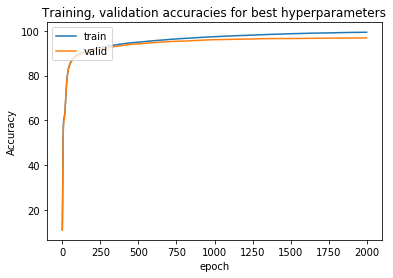

In [46]:
#hyperparameter selection
start_time=timeit.default_timer()

lr=np.array([10**-5,10**-4,10**-3])
n_hidden0=[50,75,100]
n_hidden1=[50,75,100]
epochs=2000


w0,b0,w1,b1,w2,b2,best_params,training_history,validation_history=hyperparameter_selection(x_train,y_train,x_valid,y_valid,
                                                  epochs,lr,n_hidden0,n_hidden1)
plt.plot(training_history)
plt.plot(validation_history)
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'valid'], loc='upper left')
plt.title("Training, validation accuracies for best hyperparameters")

print("optimal Early stopping epoch=",best_params[3])
print("optimal learning rate=",best_params[0])
print("optimal hidden units for layer 1=",best_params[1])
print("optimal hidden units for layer 2=",best_params[2])
print("Optimal Validation Accuracy=",validation_history[-1])

elapsed_time=timeit.default_timer()-start_time 

print("hyper parameter selection time=",elapsed_time)

In [48]:
# test NN

test_accuracy=test_NN(x_test,y_test,w0,b0,w1,b1,w2,b2)
print("test_accuracy=",test_accuracy)


test_accuracy= 96.75333333333333


** L2 Weight decay**

In this step, we add L2 regularization to the loss function and re-train the network with the new objective

In [49]:
def loss_L2(o,y,w0,w1,w2,lambd):
    eta=10**-10
    loss=-np.sum(y * np.log(o+eta))+(0.5*lambd*(np.sum(w0**2)+np.sum(w1**2)+np.sum(w2**2)))
    return loss

In [50]:
def backward_pass_L2(activations, w0, b0, w1, b1, w2, b2, y,lambd):
    
    x,h0,h1,o=activations
    
    #dw2,db2
    
    dw2,db2=softmax_gradient(w2,b2,h1,y)
    dw2=dw2+lambd*w2
    dz2=(o-y)
    db2=db2.reshape(1,len(db2))
    
    #dw1,db1
    dz1=np.dot(dz2,w2)*(1-h1**2)
    dw1=np.dot(dz1.T,h0)+lambd*w1
    db1=dz1.sum(0) 
    db1=db1.reshape(1,len(db1))
    
    #dw0,db0
    dz0=np.dot(dz1,w1)*(1-h0**2)
    dw0=np.dot(dz0.T,x)+lambd*w0
    db0=dz0.sum(0)
    db0=db0.reshape(1,len(db0))
    
    return [dw0, db0, dw1, db1, dw2, db2]
    

In [51]:
def gradient_descent_L2(activations,lr,w0,b0,w1,b1,w2,b2,y,lambd):
    
    dw0, db0, dw1, db1, dw2, db2=backward_pass_L2(activations, w0, b0, w1, b1, w2, b2, y,lambd)
    
   
    w0=w0-lr*dw0
    b0=b0-lr*db0
    
    w1=w1-lr*dw1
    b1=b1-lr*db1

    w2=w2-lr*dw2
    b2=b2-lr*db2
    
    return [w0,b0,w1,b1,w2,b2]

Learning rate= 1e-05
Hidden units layer 1= 100
Hidden units layer 2= 50
########################################################
epoch 1
training loss 69179.42211190781
validation loss 34689.584421365944
training accuracy 11.043333333333333
validation accuracy 11.020000000000001
########################################################
epoch 2
training loss 68256.58058782989
validation loss 34228.9929282751
training accuracy 15.906666666666666
validation accuracy 15.4
########################################################
epoch 3
training loss 67357.41002784594
validation loss 33780.51646512693
training accuracy 24.593333333333334
validation accuracy 23.880000000000003
########################################################
epoch 4
training loss 66445.78836030439
validation loss 33326.080135137854
training accuracy 36.14666666666667
validation accuracy 35.10666666666667
########################################################
epoch 5
training loss 65490.13894249392
validation loss 32

epoch 42
training loss 21055.297368454612
validation loss 10656.194496579072
training accuracy 83.28
validation accuracy 83.08666666666666
########################################################
epoch 43
training loss 20664.713419468775
validation loss 10460.133430999143
training accuracy 83.62
validation accuracy 83.38
########################################################
epoch 44
training loss 20292.21125364828
validation loss 10273.255949279512
training accuracy 83.85666666666667
validation accuracy 83.52666666666667
########################################################
epoch 45
training loss 19936.69133550294
validation loss 10095.003310937596
training accuracy 84.10666666666667
validation accuracy 83.72666666666667
########################################################
epoch 46
training loss 19597.146971059883
validation loss 9924.863077812737
training accuracy 84.33666666666667
validation accuracy 84.08666666666666
########################################################

epoch 84
training loss 13043.736085841136
validation loss 6668.8062869091
training accuracy 88.46000000000001
validation accuracy 88.10666666666667
########################################################
epoch 85
training loss 12958.516643373989
validation loss 6626.9397651046675
training accuracy 88.51333333333334
validation accuracy 88.14666666666666
########################################################
epoch 86
training loss 12875.534307727461
validation loss 6586.190605915969
training accuracy 88.58333333333334
validation accuracy 88.22666666666666
########################################################
epoch 87
training loss 12794.698232247989
validation loss 6546.513388429007
training accuracy 88.64666666666666
validation accuracy 88.31333333333333
########################################################
epoch 88
training loss 12715.921810567119
validation loss 6507.864834380684
training accuracy 88.71
validation accuracy 88.36
###############################################

epoch 125
training loss 10726.971070306796
validation loss 5540.620649063189
training accuracy 90.11333333333333
validation accuracy 89.85333333333332
########################################################
epoch 126
training loss 10689.096535114504
validation loss 5522.428736378705
training accuracy 90.13666666666667
validation accuracy 89.88000000000001
########################################################
epoch 127
training loss 10651.751708152338
validation loss 5504.502374721528
training accuracy 90.19
validation accuracy 89.94666666666666
########################################################
epoch 128
training loss 10614.921827404396
validation loss 5486.834169935323
training accuracy 90.21666666666667
validation accuracy 89.96666666666667
########################################################
epoch 129
training loss 10578.592691385249
validation loss 5469.4170066589795
training accuracy 90.25
validation accuracy 89.99333333333334
########################################

epoch 166
training loss 9493.259680733327
validation loss 4954.679545883162
training accuracy 91.12
validation accuracy 90.72666666666666
########################################################
epoch 167
training loss 9469.109895254578
validation loss 4943.361155130191
training accuracy 91.14333333333333
validation accuracy 90.74666666666667
########################################################
epoch 168
training loss 9445.16405372638
validation loss 4932.144528275117
training accuracy 91.16666666666666
validation accuracy 90.75999999999999
########################################################
epoch 169
training loss 9421.418313693373
validation loss 4921.02772329728
training accuracy 91.19666666666667
validation accuracy 90.78666666666668
########################################################
epoch 170
training loss 9397.86893675808
validation loss 4910.008850462178
training accuracy 91.21333333333334
validation accuracy 90.82666666666667
#####################################

epoch 208
training loss 8619.667412930265
validation loss 4549.269918691765
training accuracy 91.87666666666667
validation accuracy 91.46666666666667
########################################################
epoch 209
training loss 8601.664588091735
validation loss 4541.001621450581
training accuracy 91.89333333333335
validation accuracy 91.47333333333333
########################################################
epoch 210
training loss 8583.764796273937
validation loss 4532.784007741995
training accuracy 91.92333333333333
validation accuracy 91.49333333333334
########################################################
epoch 211
training loss 8565.966621142914
validation loss 4524.616360896794
training accuracy 91.93333333333334
validation accuracy 91.52
########################################################
epoch 212
training loss 8548.268675278989
validation loss 4516.497978978644
training accuracy 91.94666666666666
validation accuracy 91.52666666666667
##################################

epoch 249
training loss 7953.404039824142
validation loss 4245.447407034025
training accuracy 92.47666666666666
validation accuracy 92.10666666666667
########################################################
epoch 250
training loss 7938.71198115136
validation loss 4238.795925974057
training accuracy 92.48333333333333
validation accuracy 92.10000000000001
########################################################
epoch 251
training loss 7924.082584777787
validation loss 4232.174779904194
training accuracy 92.51
validation accuracy 92.11333333333333
########################################################
epoch 252
training loss 7909.515198126827
validation loss 4225.583642193491
training accuracy 92.51666666666667
validation accuracy 92.12
########################################################
epoch 253
training loss 7895.00917996285
validation loss 4219.022192003589
training accuracy 92.54666666666667
validation accuracy 92.12666666666667
################################################

epoch 290
training loss 7396.454910414054
validation loss 3994.6391647950563
training accuracy 93.08999999999999
validation accuracy 92.44666666666667
########################################################
epoch 291
training loss 7383.898110246516
validation loss 3989.015226054007
training accuracy 93.10000000000001
validation accuracy 92.44666666666667
########################################################
epoch 292
training loss 7371.38453037319
validation loss 3983.4119607024954
training accuracy 93.12
validation accuracy 92.44666666666667
########################################################
epoch 293
training loss 7358.913840578141
validation loss 3977.8292064009815
training accuracy 93.13
validation accuracy 92.46666666666667
########################################################
epoch 294
training loss 7346.485715762764
validation loss 3972.26680341154
training accuracy 93.14
validation accuracy 92.47999999999999
########################################################


epoch 331
training loss 6913.99966387954
validation loss 3779.509776795043
training accuracy 93.56
validation accuracy 92.86
########################################################
epoch 332
training loss 6902.990062166262
validation loss 3774.623709684667
training accuracy 93.57
validation accuracy 92.86
########################################################
epoch 333
training loss 6892.013463246246
validation loss 3769.7533516372137
training accuracy 93.57666666666667
validation accuracy 92.86
########################################################
epoch 334
training loss 6881.069683212056
validation loss 3764.8986149883735
training accuracy 93.59333333333333
validation accuracy 92.88666666666666
########################################################
epoch 335
training loss 6870.158540450306
validation loss 3760.059413258972
training accuracy 93.61
validation accuracy 92.88666666666666
########################################################
epoch 336
training loss 6859.2798555

epoch 372
training loss 6487.909158489215
validation loss 3591.232531391568
training accuracy 93.99666666666666
validation accuracy 93.24666666666667
########################################################
epoch 373
training loss 6478.122238046838
validation loss 3586.929247081715
training accuracy 94.00333333333334
validation accuracy 93.25333333333333
########################################################
epoch 374
training loss 6468.362247447547
validation loss 3582.638842446044
training accuracy 94.01333333333334
validation accuracy 93.28666666666666
########################################################
epoch 375
training loss 6458.6290669757
validation loss 3578.361263410823
training accuracy 94.02000000000001
validation accuracy 93.29333333333332
########################################################
epoch 376
training loss 6448.922577902101
validation loss 3574.096456423309
training accuracy 94.03
validation accuracy 93.30000000000001
####################################

epoch 413
training loss 6107.538773776406
validation loss 3424.8284581906323
training accuracy 94.35
validation accuracy 93.62666666666667
########################################################
epoch 414
training loss 6098.76664389823
validation loss 3421.0135216606786
training accuracy 94.35666666666667
validation accuracy 93.63333333333334
########################################################
epoch 415
training loss 6090.017175642092
validation loss 3417.2095807167534
training accuracy 94.36333333333333
validation accuracy 93.64
########################################################
epoch 416
training loss 6081.2902777564705
validation loss 3413.416595864788
training accuracy 94.37666666666667
validation accuracy 93.64666666666666
########################################################
epoch 417
training loss 6072.5858594692945
validation loss 3409.634527836645
training accuracy 94.39
validation accuracy 93.66
########################################################
epoch 418

epoch 454
training loss 5765.535631106575
validation loss 3277.0314951428627
training accuracy 94.65666666666667
validation accuracy 93.96
########################################################
epoch 455
training loss 5757.622371249898
validation loss 3273.637032302207
training accuracy 94.67333333333333
validation accuracy 93.96666666666667
########################################################
epoch 456
training loss 5749.728371034356
validation loss 3270.2520941273056
training accuracy 94.68666666666667
validation accuracy 93.97333333333333
########################################################
epoch 457
training loss 5741.8535550994775
validation loss 3266.876647774684
training accuracy 94.69333333333333
validation accuracy 93.97333333333333
########################################################
epoch 458
training loss 5733.997848409005
validation loss 3263.5106605171595
training accuracy 94.69999999999999
validation accuracy 93.97333333333333
##############################

epoch 495
training loss 5456.11318952823
validation loss 3145.3295825877935
training accuracy 94.95666666666666
validation accuracy 94.16
########################################################
epoch 496
training loss 5448.931080515969
validation loss 3142.299832247286
training accuracy 94.96333333333334
validation accuracy 94.16
########################################################
epoch 497
training loss 5441.765391627794
validation loss 3139.2783448550654
training accuracy 94.96333333333334
validation accuracy 94.16666666666667
########################################################
epoch 498
training loss 5434.616059677738
validation loss 3136.265091617615
training accuracy 94.97
validation accuracy 94.16666666666667
########################################################
epoch 499
training loss 5427.483021754753
validation loss 3133.260043829752
training accuracy 94.97333333333333
validation accuracy 94.16666666666667
########################################################


epoch 536
training loss 5174.464854277387
validation loss 3027.587333616092
training accuracy 95.16
validation accuracy 94.41333333333334
########################################################
epoch 537
training loss 5167.907001301045
validation loss 3024.873681541597
training accuracy 95.17666666666666
validation accuracy 94.42
########################################################
epoch 538
training loss 5161.3631940897085
validation loss 3022.1671830594455
training accuracy 95.18666666666667
validation accuracy 94.42666666666668
########################################################
epoch 539
training loss 5154.8333800239525
validation loss 3019.4678129205354
training accuracy 95.19999999999999
validation accuracy 94.42666666666668
########################################################
epoch 540
training loss 5148.317506723886
validation loss 3016.775545961767
training accuracy 95.20333333333333
validation accuracy 94.42666666666668
##########################################

epoch 577
training loss 4916.573082856438
validation loss 2921.9331043278603
training accuracy 95.46666666666667
validation accuracy 94.64666666666666
########################################################
epoch 578
training loss 4910.550422378502
validation loss 2919.492962682078
training accuracy 95.46333333333334
validation accuracy 94.64666666666666
########################################################
epoch 579
training loss 4904.53983728144
validation loss 2917.0590099686256
training accuracy 95.46666666666667
validation accuracy 94.64666666666666
########################################################
epoch 580
training loss 4898.541284044118
validation loss 2914.6312244618803
training accuracy 95.47666666666666
validation accuracy 94.65333333333334
########################################################
epoch 581
training loss 4892.554719348988
validation loss 2912.2095845215113
training accuracy 95.48
validation accuracy 94.66
###########################################

epoch 618
training loss 4679.101864940999
validation loss 2826.73919956674
training accuracy 95.69666666666666
validation accuracy 94.83333333333334
########################################################
epoch 619
training loss 4673.5406927829135
validation loss 2824.5358892906534
training accuracy 95.7
validation accuracy 94.83333333333334
########################################################
epoch 620
training loss 4667.989969656206
validation loss 2822.337946121515
training accuracy 95.71333333333332
validation accuracy 94.84666666666666
########################################################
epoch 621
training loss 4662.449659706019
validation loss 2820.1453517449236
training accuracy 95.72
validation accuracy 94.86
########################################################
epoch 622
training loss 4656.919727247607
validation loss 2817.9580879267296
training accuracy 95.72333333333334
validation accuracy 94.86666666666666
########################################################

epoch 660
training loss 4454.1360313380865
validation loss 2738.619820582437
training accuracy 95.89999999999999
validation accuracy 95.05333333333333
########################################################
epoch 661
training loss 4448.984715713047
validation loss 2736.627060077964
training accuracy 95.91333333333333
validation accuracy 95.06
########################################################
epoch 662
training loss 4443.842481055825
validation loss 2734.638964342339
training accuracy 95.92
validation accuracy 95.06
########################################################
epoch 663
training loss 4438.7092980164725
validation loss 2732.65551825915
training accuracy 95.92666666666668
validation accuracy 95.06
########################################################
epoch 664
training loss 4433.585137384685
validation loss 2730.676706783328
training accuracy 95.93333333333334
validation accuracy 95.06666666666666
########################################################
epoch 665
tr

epoch 701
training loss 4250.079266853906
validation loss 2660.5876473080966
training accuracy 96.17333333333333
validation accuracy 95.19333333333333
########################################################
epoch 702
training loss 4245.277626958707
validation loss 2658.7744819845802
training accuracy 96.18333333333334
validation accuracy 95.19999999999999
########################################################
epoch 703
training loss 4240.483972356963
validation loss 2656.965417464975
training accuracy 96.18333333333334
validation accuracy 95.19999999999999
########################################################
epoch 704
training loss 4235.698278907356
validation loss 2655.160441348413
training accuracy 96.19333333333333
validation accuracy 95.20666666666666
########################################################
epoch 705
training loss 4230.920522583254
validation loss 2653.3595412946815
training accuracy 96.2
validation accuracy 95.20666666666666
################################

epoch 742
training loss 4059.513843912982
validation loss 2589.4842723240686
training accuracy 96.36333333333333
validation accuracy 95.34
########################################################
epoch 743
training loss 4055.0209745968027
validation loss 2587.8296900778964
training accuracy 96.36333333333333
validation accuracy 95.32666666666667
########################################################
epoch 744
training loss 4050.535189284367
validation loss 2586.1787470133972
training accuracy 96.37
validation accuracy 95.32666666666667
########################################################
epoch 745
training loss 4046.0564681172036
validation loss 2584.5314329915514
training accuracy 96.37
validation accuracy 95.33333333333334
########################################################
epoch 746
training loss 4041.584791331205
validation loss 2582.8877379227642
training accuracy 96.37666666666667
validation accuracy 95.34
########################################################
epoch 

epoch 783
training loss 3880.9126168853422
validation loss 2524.5272521930974
training accuracy 96.54
validation accuracy 95.42666666666668
########################################################
epoch 784
training loss 3876.6948688841544
validation loss 2523.014062297733
training accuracy 96.54666666666667
validation accuracy 95.42
########################################################
epoch 785
training loss 3872.4834633811265
validation loss 2521.5041335892834
training accuracy 96.54666666666667
validation accuracy 95.41333333333334
########################################################
epoch 786
training loss 3868.2783840299567
validation loss 2519.9974577400358
training accuracy 96.55333333333334
validation accuracy 95.41333333333334
########################################################
epoch 787
training loss 3864.079614561231
validation loss 2518.4940264611664
training accuracy 96.55333333333334
validation accuracy 95.42
##################################################

epoch 824
training loss 3713.01903721964
validation loss 2465.075630244172
training accuracy 96.69666666666666
validation accuracy 95.49333333333333
########################################################
epoch 825
training loss 3709.048707618683
validation loss 2463.6897114361855
training accuracy 96.70666666666666
validation accuracy 95.5
########################################################
epoch 826
training loss 3705.0841092173787
validation loss 2462.306741828831
training accuracy 96.70666666666666
validation accuracy 95.5
########################################################
epoch 827
training loss 3701.125228506539
validation loss 2460.926714504477
training accuracy 96.71
validation accuracy 95.50666666666666
########################################################
epoch 828
training loss 3697.172052038498
validation loss 2459.5496225754937
training accuracy 96.71666666666667
validation accuracy 95.50666666666666
########################################################
e

epoch 865
training loss 3554.7970794593657
validation loss 2410.600461253924
training accuracy 96.87
validation accuracy 95.64666666666668
########################################################
epoch 866
training loss 3551.0512737756835
validation loss 2409.330088451983
training accuracy 96.88
validation accuracy 95.65333333333334
########################################################
epoch 867
training loss 3547.3106923706137
validation loss 2408.0624038988553
training accuracy 96.88
validation accuracy 95.66
########################################################
epoch 868
training loss 3543.575323993867
validation loss 2406.797401761699
training accuracy 96.88666666666667
validation accuracy 95.66666666666667
########################################################
epoch 869
training loss 3539.8451574440155
validation loss 2405.535076230727
training accuracy 96.89
validation accuracy 95.66
########################################################
epoch 870
training loss 3536.120

epoch 907
training loss 3401.8474384127985
validation loss 2359.4948832988684
training accuracy 97.06666666666666
validation accuracy 95.78
########################################################
epoch 908
training loss 3398.311897916998
validation loss 2358.332643627115
training accuracy 97.06666666666666
validation accuracy 95.78
########################################################
epoch 909
training loss 3394.7811483280566
validation loss 2357.1728654633243
training accuracy 97.07333333333334
validation accuracy 95.78
########################################################
epoch 910
training loss 3391.2551802329435
validation loss 2356.0155438244624
training accuracy 97.07333333333334
validation accuracy 95.78666666666666
########################################################
epoch 911
training loss 3387.7339842574515
validation loss 2354.8606737449823
training accuracy 97.08
validation accuracy 95.79333333333334
########################################################
epoch

epoch 948
training loss 3260.7222578905566
validation loss 2313.81005854933
training accuracy 97.22
validation accuracy 95.92666666666668
########################################################
epoch 949
training loss 3257.375819266567
validation loss 2312.7448294006404
training accuracy 97.22666666666666
validation accuracy 95.92666666666668
########################################################
epoch 950
training loss 3254.0338153148555
validation loss 2311.681870581187
training accuracy 97.23
validation accuracy 95.92666666666668
########################################################
epoch 951
training loss 3250.6962380523755
validation loss 2310.6211777328854
training accuracy 97.23666666666666
validation accuracy 95.92666666666668
########################################################
epoch 952
training loss 3247.363079527048
validation loss 2309.562746510669
training accuracy 97.24000000000001
validation accuracy 95.92666666666668
##########################################

epoch 989
training loss 3127.072611760456
validation loss 2271.9521235040743
training accuracy 97.37333333333333
validation accuracy 96.06666666666666
########################################################
epoch 990
training loss 3123.901761130636
validation loss 2270.976533460466
training accuracy 97.38
validation accuracy 96.06666666666666
########################################################
epoch 991
training loss 3120.7350414202892
validation loss 2270.003044747299
training accuracy 97.38666666666667
validation accuracy 96.06666666666666
########################################################
epoch 992
training loss 3117.5724457755573
validation loss 2269.031653465524
training accuracy 97.39
validation accuracy 96.07333333333334
########################################################
epoch 993
training loss 3114.4139673666336
validation loss 2268.062355725544
training accuracy 97.39
validation accuracy 96.06666666666666
######################################################

epoch 1030
training loss 3000.3843425558
validation loss 2233.6353644688447
training accuracy 97.52666666666666
validation accuracy 96.11333333333333
########################################################
epoch 1031
training loss 2997.377479547361
validation loss 2232.742825640448
training accuracy 97.52666666666666
validation accuracy 96.10666666666667
########################################################
epoch 1032
training loss 2994.374484461799
validation loss 2231.8522353242574
training accuracy 97.53333333333333
validation accuracy 96.12
########################################################
epoch 1033
training loss 2991.3753513004144
validation loss 2230.9635899563073
training accuracy 97.54
validation accuracy 96.12
########################################################
epoch 1034
training loss 2988.3800740820707
validation loss 2230.0768859796644
training accuracy 97.54333333333334
validation accuracy 96.12
########################################################
epoc

epoch 1071
training loss 2880.212374591443
validation loss 2198.6017418358188
training accuracy 97.67
validation accuracy 96.17333333333333
########################################################
epoch 1072
training loss 2877.359349376723
validation loss 2197.7862404176976
training accuracy 97.67333333333333
validation accuracy 96.16666666666667
########################################################
epoch 1073
training loss 2874.509958934928
validation loss 2196.9725467360727
training accuracy 97.67666666666666
validation accuracy 96.16666666666667
########################################################
epoch 1074
training loss 2871.664197865273
validation loss 2196.1606574844986
training accuracy 97.67666666666666
validation accuracy 96.16666666666667
########################################################
epoch 1075
training loss 2868.822060778581
validation loss 2195.3505693621537
training accuracy 97.67666666666666
validation accuracy 96.16666666666667
########################

epoch 1112
training loss 2766.1623641428864
validation loss 2166.6138321719227
training accuracy 97.78333333333333
validation accuracy 96.23333333333333
########################################################
epoch 1113
training loss 2763.454047246984
validation loss 2165.8697941677633
training accuracy 97.78333333333333
validation accuracy 96.22666666666667
########################################################
epoch 1114
training loss 2760.749151927387
validation loss 2165.1274326931702
training accuracy 97.78333333333333
validation accuracy 96.22666666666667
########################################################
epoch 1115
training loss 2758.047673164477
validation loss 2164.3867446531444
training accuracy 97.78999999999999
validation accuracy 96.22666666666667
########################################################
epoch 1116
training loss 2755.349605945922
validation loss 2163.647726957396
training accuracy 97.79333333333334
validation accuracy 96.22666666666667
############

epoch 1153
training loss 2657.874246380745
validation loss 2137.4504980016823
training accuracy 97.89
validation accuracy 96.26
########################################################
epoch 1154
training loss 2655.3021696823103
validation loss 2136.7727080819072
training accuracy 97.89
validation accuracy 96.26
########################################################
epoch 1155
training loss 2652.733314135954
validation loss 2136.0964714590386
training accuracy 97.89
validation accuracy 96.26
########################################################
epoch 1156
training loss 2650.1676749799017
validation loss 2135.421785216315
training accuracy 97.89
validation accuracy 96.26
########################################################
epoch 1157
training loss 2647.6052474580883
validation loss 2134.7486464409935
training accuracy 97.89333333333333
validation accuracy 96.26
########################################################
epoch 1158
training loss 2645.046026820148
validation loss 21

epoch 1195
training loss 2552.5664100769413
validation loss 2110.287665957911
training accuracy 97.96333333333334
validation accuracy 96.32666666666667
########################################################
epoch 1196
training loss 2550.1255874592625
validation loss 2109.672648112763
training accuracy 97.96666666666667
validation accuracy 96.32666666666667
########################################################
epoch 1197
training loss 2547.687790938815
validation loss 2109.059064404362
training accuracy 97.97
validation accuracy 96.32666666666667
########################################################
epoch 1198
training loss 2545.2530159976372
validation loss 2108.44691207683
training accuracy 97.97333333333333
validation accuracy 96.32666666666667
########################################################
epoch 1199
training loss 2542.8212581238504
validation loss 2107.8361883780026
training accuracy 97.97666666666667
validation accuracy 96.32666666666667
#########################

epoch 1236
training loss 2454.9265500049105
validation loss 2086.2189239814675
training accuracy 98.06666666666666
validation accuracy 96.37333333333333
########################################################
epoch 1237
training loss 2452.6061592229194
validation loss 2085.6604854202783
training accuracy 98.08
validation accuracy 96.37333333333333
########################################################
epoch 1238
training loss 2450.288614468787
validation loss 2085.103371044506
training accuracy 98.08333333333333
validation accuracy 96.37333333333333
########################################################
epoch 1239
training loss 2447.973911487219
validation loss 2084.5475782505455
training accuracy 98.08333333333333
validation accuracy 96.37333333333333
########################################################
epoch 1240
training loss 2445.6620460296067
validation loss 2083.993104438539
training accuracy 98.09
validation accuracy 96.37333333333333
###################################

epoch 1276
training loss 2364.289394300058
validation loss 2064.8888670071556
training accuracy 98.19333333333333
validation accuracy 96.41333333333333
########################################################
epoch 1277
training loss 2362.079592234808
validation loss 2064.3814023439622
training accuracy 98.2
validation accuracy 96.41333333333333
########################################################
epoch 1278
training loss 2359.8724712678772
validation loss 2063.8751606730484
training accuracy 98.20666666666666
validation accuracy 96.41999999999999
########################################################
epoch 1279
training loss 2357.6680274159885
validation loss 2063.3701395428125
training accuracy 98.21333333333332
validation accuracy 96.42666666666668
########################################################
epoch 1280
training loss 2355.4662567027185
validation loss 2062.866336505495
training accuracy 98.21333333333332
validation accuracy 96.42666666666668
#######################

Text(0.5,1,'Training, validation accuracies with weight decay')

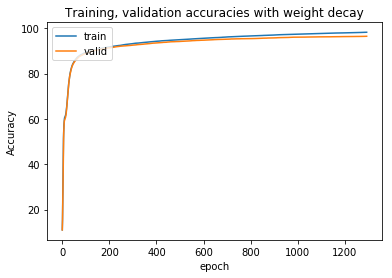

In [57]:
w0_opt,b0_opt,w1_opt,b1_opt,w2_opt,b2_opt,acc_train,acc_valid=train_NN(x_train,y_train,x_valid,y_valid,epochs,best_params[0],best_params[1],best_params[2],
                                                                       optimizer=gradient_descent_L2,L=loss_L2,lambd=1)
plt.plot(acc_train)
plt.plot(acc_valid)
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'valid'], loc='upper left')
plt.title("Training, validation accuracies with weight decay")

In [58]:
test_accuracy=test_NN(x_test,y_test,w0_opt,b0_opt,w1_opt,b1_opt,w2_opt,b2_opt)
print("test_accuracy=",test_accuracy)

test_accuracy= 96.33333333333334


In [18]:
def softmax_loss_L2(w0, b0, w1, b1, w2, b2, x, y,lambd):
    _, _, _, out = forward_pass(w0, b0, w1, b1,w2, b2, x)
    err = -np.sum(y * np.log(out))+(0.5*lambd*(np.sum(w0**2)+np.sum(w1**2)+np.sum(w2**2)))
    return err

**Adding Momentum**

Now, we add momentum implement SGD with momentum and watch the effect on the model's convergence

In [21]:
def train_NN_mom(x_train,y_train,x_valid,y_valid,epochs,
             lr,n_hidden0,n_hidden1,meu,L=loss,lambd=0):
    
    
    print('Learning rate=',lr)
    print('Hidden units layer 1=',n_hidden0)
    print('Hidden units layer 2=',n_hidden1)
    print('########################################################')
    
    l_train=[]
    l_valid=[]
    acc_train=[]
    acc_valid=[]
    
    dw0,db0,dw1,db1,dw2,db2=0,0,0,0,0,0
    dw0_old,dw1_old,dw2_old=0,0,0
    w0,b0,w1,b1,w2,b2=initialize_weights(x_train.shape[1],n_hidden0,n_hidden1,y_train.shape[1])
    
    
    activations_train=forward_pass(w0, b0, w1, b1, w2, b2, x_train)
    activations_valid=forward_pass(w0, b0, w1, b1, w2, b2, x_valid)
    
    o_train=activations_train[3]
    o_valid=activations_valid[3]
    
    l_train.append(L(o_train,y_train,w0,w1,w2,lambd)) 
    l_valid.append(L(o_valid,y_valid,w0,w1,w2,lambd))
        
    acc_train.append(softmax_accuracy(o_train,y_train))
    acc_valid.append(softmax_accuracy(o_valid,y_valid))
        
    print("epoch",1)
    print("training loss",l_train[0])
    print("validation loss",l_valid[0])
    print("training accuracy",acc_train[0])
    print("validation accuracy",acc_valid[0])
    print('########################################################')
    
    dw0,db0,dw1,db1,dw2,db2=backward_pass(activations_train,w0,b0,w1,b1,w2,b2,y_train)
    
    #update weights
    w0=w0-lr*dw0
    b0=b0-lr*db0
    
    w1=w1-lr*dw1
    b1=b1-lr*db1
    
    w2=w2-lr*dw2
    b2=b2-lr*db2
    
    dw0_old,dw1_old,dw2_old=dw0,dw1,dw2
    
    for i in range(1,epochs):
        
        activations_train=forward_pass(w0, b0, w1, b1, w2, b2, x_train)
        activations_valid=forward_pass(w0, b0, w1, b1, w2, b2, x_valid)
        
        o_train=activations_train[3]
        
        o_valid=activations_valid[3]
        
        l_train.append(L(o_train,y_train,w0,w1,w2,lambd)) 
        l_valid.append(L(o_valid,y_valid,w0,w1,w2,lambd))
        
        acc_train.append(softmax_accuracy(o_train,y_train))
        acc_valid.append(softmax_accuracy(o_valid,y_valid))
        
        print("epoch",i+1)
        print("training loss",l_train[i])
        print("validation loss",l_valid[i])
        print("training accuracy",acc_train[i])
        print("validation accuracy",acc_valid[i])
        print('########################################################')
        
        if (i>20) and (i % 10==0) and (l_valid[i] >=l_valid[i-10]):
            break
        
        dw0,db0,dw1,db1,dw2,db2=backward_pass(activations_train,w0,b0,w1,b1,w2,b2,y_train)
        
        dw0_mom=dw0+(meu*dw0_old)
        dw1_mom=dw1+(meu*dw1_old)
        dw2_mom=dw2+(meu*dw2_old)
        
        w0=w0-lr*dw0_mom
        b0=b0-lr*db0
    
        w1=w1-lr*dw1_mom
        b1=b1-lr*db1
    
        w2=w2-lr*dw2_mom
        b2=b2-lr*db2
        
        dw0_old,dw1_old,dw2_old=dw0_mom,dw1_mom,dw2_mom
         
    return [w0,b0,w1,b1,w2,b2,acc_train,acc_valid]

Learning rate= 0.0001
Hidden units layer 1= 50
Hidden units layer 2= 75
########################################################
<class 'numpy.ndarray'>
epoch 1
training loss 6868.850299119964
validation loss 3443.940533250842
training accuracy 13.666666666666666
validation accuracy 12.4
########################################################
epoch 2
training loss 6786.570831645811
validation loss 3404.499472653481
training accuracy 25.933333333333337
validation accuracy 23.733333333333334
########################################################
epoch 3
training loss 6630.982594849447
validation loss 3329.649185204952
training accuracy 39.900000000000006
validation accuracy 37.666666666666664
########################################################
epoch 4
training loss 6399.950474292868
validation loss 3218.42934194319
training accuracy 51.1
validation accuracy 49.06666666666666
########################################################
epoch 5
training loss 6072.910773454335
validatio

epoch 45
training loss 427.4165729234136
validation loss 526.5046544593791
training accuracy 96.43333333333334
validation accuracy 91.0
########################################################
epoch 46
training loss 409.88482458189276
validation loss 525.2223860314796
training accuracy 96.73333333333333
validation accuracy 90.86666666666666
########################################################
epoch 47
training loss 393.3808134392567
validation loss 523.2628157531984
training accuracy 96.93333333333334
validation accuracy 90.86666666666666
########################################################
epoch 48
training loss 377.8778276170094
validation loss 521.063541005552
training accuracy 96.96666666666667
validation accuracy 91.13333333333333
########################################################
epoch 49
training loss 363.3533996062221
validation loss 519.3578229480761
training accuracy 97.16666666666667
validation accuracy 91.13333333333333
########################################

Text(0.5,1,'Training, validation accuracies with momentum')

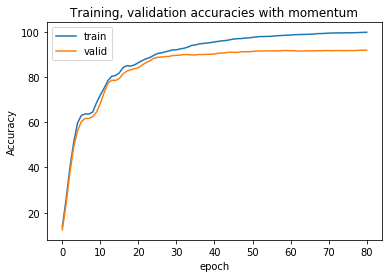

In [95]:
meu=0.9
w0_opt,b0_opt,w1_opt,b1_opt,w2_opt,b2_opt,acc_train,acc_valid=train_NN_mom(x_train,y_train,x_valid,y_valid,epochs,best_params[0],
                                                                           best_params[1],best_params[2],meu,L=loss)
plt.plot(acc_train)
plt.plot(acc_valid)
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'valid'], loc='upper left')
plt.title("Training, validation accuracies with momentum")

In [96]:
test_accuracy=test_NN(x_test,y_test,w0_opt,b0_opt,w1_opt,b1_opt,w2_opt,b2_opt)
print("test_accuracy with momentum=",test_accuracy)

test_accuracy with momentum= 91.46666666666667


# Gradient Checking

In this section, the backward pass is compared to an numerical approximation of the gradient, This serves as a good hint to whether the backward pass has been correctly implemented or not.

In [22]:
def softmax_loss(w0, b0, w1, b1, w2, b2, x, y):
    _, _, _, out = forward_pass(w0, b0, w1, b1,w2, b2, x)
    err = -np.sum(y * np.log(out))
    return err

def gradient_checking():

    ## Generate some random data to test the network with
    n_samples = 20
    n_features = 5
    n_outputs = 12
    n_hidden0 = 10
    n_hidden1 = 11
    
    x = np.random.normal(size=(n_samples, n_features))
    y = np.random.multinomial(1, [1.0/n_outputs]*n_outputs, size=n_samples).astype(np.float64)

    w0 = np.random.uniform(-0.1, +0.1, size=(n_hidden0, x.shape[1]))
    b0 = np.zeros((1, n_hidden0))

    w1 = np.random.uniform(-0.1, +0.1, size=(n_hidden1, n_hidden0))
    b1 = np.zeros((1, n_hidden1))

    w2 = np.random.uniform(-0.1, +0.1, size=(y.shape[1], n_hidden1))
    b2 = np.zeros((1, y.shape[1]))



    ### The actual Gradient Checking Code
    eta = 1e-4

    nw0 = approx_fprime(w0.ravel(),
    lambda w : softmax_loss(w.reshape(w0.shape), b0, w1, b1, w2, b2, x, y), eta)
    nb0 = approx_fprime(b0.ravel(),
    lambda b : softmax_loss(w0, b.reshape(b0.shape), w1, b1, w2, b2, x, y), eta)
    nw1 = approx_fprime(w1.ravel(),
    lambda w : softmax_loss(w0, b0, w.reshape(w1.shape), b1, w2, b2, x, y), eta)
    nb1 = approx_fprime(b1.ravel(),
    lambda b : softmax_loss(w0, b0, w1, b.reshape(b1.shape), w2, b2, x, y), eta)
    nw2 = approx_fprime(w2.ravel(),
    lambda w : softmax_loss(w0, b0, w1, b1, w.reshape(w2.shape), b2, x, y), eta)
    nb2 = approx_fprime(b2.ravel(),
    lambda b : softmax_loss(w0, b0, w1, b1, w2, b.reshape(b2.shape), x, y), eta)

    nw0 = nw0.reshape(w0.shape)
    nb0 = nb0.reshape(b0.shape)
    nw1 = nw1.reshape(w1.shape)
    nb1 = nb1.reshape(b1.shape)
    nw2 = nw2.reshape(w2.shape)
    nb2 = nb2.reshape(b2.shape)

    activations = forward_pass(w0, b0, w1, b1, w2, b2, x)
    dw0, db0, dw1, db1, dw2, db2 = backward_pass(activations, w0, b0, w1, b1, w2, b2, y)

    # All of these numbers should be smaller than 1e-4
    print("Max Deviation layer 0: ", np.abs(dw0 - nw0).max(), '\t/\t', np.abs(db0 - nb0).max())
    print("Max Deviation layer 1: ", np.abs(dw1 - nw1).max(), '\t/\t', np.abs(db1 - nb1).max())
    print("Max Deviation layer 2: ", np.abs(dw2 - nw2).max(), '\t/\t', np.abs(db2 - nb2).max())


In [33]:
gradient_checking()

Max Deviation layer 0:  2.2771794734727235e-06 	/	 1.2336030124765474e-06
Max Deviation layer 1:  1.8059670495174096e-07 	/	 4.489040802357902e-06
Max Deviation layer 2:  8.319599701343827e-08 	/	 7.64660689225316e-05


In [34]:
def gradient_checking_L2():
    
    ## Generate some random data to test the network with
    
    lambd=1
    n_samples = 20
    n_features = 5
    n_outputs = 12
    n_hidden0 = 10
    n_hidden1 = 11

    x = np.random.normal(size=(n_samples, n_features))
    y = np.random.multinomial(1, [1.0/n_outputs]*n_outputs, size=n_samples).astype(np.float64)

    w0 = np.random.uniform(-0.1, +0.1, size=(n_hidden0, x.shape[1]))
    b0 = np.zeros((1, n_hidden0))

    w1 = np.random.uniform(-0.1, +0.1, size=(n_hidden1, n_hidden0))
    b1 = np.zeros((1, n_hidden1))

    w2 = np.random.uniform(-0.1, +0.1, size=(y.shape[1], n_hidden1))
    b2 = np.zeros((1, y.shape[1]))



    ### The actual Gradient Checking Code
    eta = 1e-4

    nw0 = approx_fprime(w0.ravel(),
    lambda w : softmax_loss_L2(w.reshape(w0.shape), b0, w1, b1, w2, b2, x, y,lambd), eta)
    nb0 = approx_fprime(b0.ravel(),
    lambda b : softmax_loss_L2(w0, b.reshape(b0.shape), w1, b1, w2, b2, x, y,lambd), eta)
    nw1 = approx_fprime(w1.ravel(),
    lambda w : softmax_loss_L2(w0, b0, w.reshape(w1.shape), b1, w2, b2, x, y,lambd), eta)
    nb1 = approx_fprime(b1.ravel(),
    lambda b : softmax_loss_L2(w0, b0, w1, b.reshape(b1.shape), w2, b2, x, y,lambd), eta)
    nw2 = approx_fprime(w2.ravel(),
    lambda w : softmax_loss_L2(w0, b0, w1, b1, w.reshape(w2.shape), b2, x, y,lambd), eta)
    nb2 = approx_fprime(b2.ravel(),
    lambda b : softmax_loss_L2(w0, b0, w1, b1, w2, b.reshape(b2.shape), x, y,lambd), eta)

    nw0 = nw0.reshape(w0.shape)
    nb0 = nb0.reshape(b0.shape)
    nw1 = nw1.reshape(w1.shape)
    nb1 = nb1.reshape(b1.shape)
    nw2 = nw2.reshape(w2.shape)
    nb2 = nb2.reshape(b2.shape)

    activations = forward_pass(w0, b0, w1, b1, w2, b2, x)
    dw0, db0, dw1, db1, dw2, db2 = backward_pass_L2(activations, w0, b0, w1, b1, w2, b2, y,lambd)

    print("Max Deviation layer 0: ", np.abs(dw0 - nw0).max(), '\t/\t', np.abs(db0 - nb0).max())
    print("Max Deviation layer 1: ", np.abs(dw1 - nw1).max(), '\t/\t', np.abs(db1 - nb1).max())
    print("Max Deviation layer 2: ", np.abs(dw2 - nw2).max(), '\t/\t', np.abs(db2 - nb2).max())

In [35]:
gradient_checking_L2()

Max Deviation layer 0:  5.240629642955241e-05 	/	 9.636271972061558e-07
Max Deviation layer 1:  5.016674963225637e-05 	/	 4.611842615409589e-06
Max Deviation layer 2:  5.007479080361421e-05 	/	 7.650372597600708e-05
